# PRISM: Grid Cell Clustering using Monthly Precip

Determine regionalization using clustering. Clusters are based on monthly statistics which have already been calculated and are imported here for processing.

Principal Component Analysis (PCA) is used to decompose a multivariate dataset (multiple variables or parameters) into a set of successive orthogonal components that explain a maximum amount of variance. In scikit-learn, PCA is implemented as a transformer object that learns components in its fit method, and can be used on new data to project it on these components.

PCA centers but does not scale the input data for each feature before applying the SVD. The optional parameter parameter **whiten=True** makes it possible to project the data onto the singular space while scaling each component to unit variance. This is often useful if the models down-stream make strong assumptions on the isotropy of the signal: this is for example the case for Support Vector Machines with the RBF kernel and the K-Means clustering algorithm. We use K-Means clustering so the **whiten=True** option should be employed.

[PCA scikit-learn](https://scikit-learn.org/stable/modules/decomposition.html#pca)

Clustering is identification of groups within a data set based on proximity. If 2 or 3 Principal Components are identified via PCA then these components are ideal candidates for clustering analysis. In general though, any parameters can be used for cluster identification.

The approach here to identify regions within our domain where PRISM grid cells provide similar precipitation statistics is as follows.

1. Use 2 data sets
    1. Sample mean and variance
    2. 3-Component PCA from five statistics (mean, median, variance, skewness, kurtosis)
        - this is where PCA comes in
2. Apply K-Means clustering to both data sets
    - Use 3, 4, and 5 for number of clusters
3. Test the clusters on L-moment ratio plots
4. Plot the clusters in map view and subjectively pick what seems to work best for each month.
    - Selected clustering approach will be cleaned for regional coherence elsewhere

K-means clusters data by trying to separate samples in n groups of equal variance, minimizing a criterion known as the inertia or within-cluster sum-of-squares (see below). This algorithm requires the number of clusters to be specified. It scales well to large number of samples and has been used across a large range of application areas in many different fields.

Inertia, or within-cluster sum-of-squares criterion, provides a measure of how internally coherent cluster are. It suffers from various drawbacks:

- Inertia makes the assumption that clusters are convex and isotropic, which is not always the case. It responds poorly to elongated clusters, or manifolds with irregular shapes.
- Inertia is not a normalized metric: we just know that lower values are better and zero is optimal. But in very high-dimensional spaces, Euclidean distances tend to become inflated (this is an instance of the so-called “curse of dimensionality”). Running a dimensionality reduction algorithm such as Principal component analysis (PCA) prior to k-means clustering can alleviate this problem and speed up the computations.

[K-means scikit-learn](https://scikit-learn.org/stable/modules/clustering.html#clustering)

## Imports and Parameters

In [1]:
# this tells Jupyter to embed matplotlib plots in the notebook
%matplotlib notebook

In [2]:
from IPython.display import display, HTML
import os
import numpy as np
import pandas as pd
import datetime as dt
import geopandas as gpd
from copy import deepcopy
import scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
import shapely as sp
from matplotlib.collections import PatchCollection
from matplotlib.lines import Line2D
from shapely.geometry import Point
from shapely.geometry import Polygon
import matplotlib.tri as tri
import matplotlib.path as MPath
import geoplot as gplt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from math import floor, ceil

In [83]:
OUT_DIR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\PRISM\Clustering'

Load the watershed shapefile for reference

In [4]:
WS_SHP = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\GI' \
         r'S\Shapefiles\UTM14N\Hydrology\Watersheds\Dolan_Creek_Watershed.shp'

In [5]:
DCWS = gpd.read_file( WS_SHP )
UTMCRS = DCWS.crs
UTMCRS

{'init': 'epsg:32614'}

Read in our basic statistics DataFrames which were saved to pickle files in the previous notebook

In [6]:
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Jan_Stats.pickle" ) )
gpdJanDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Feb_Stats.pickle" ) )
gpdFebDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Mar_Stats.pickle" ) )
gpdMarDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Apr_Stats.pickle" ) )
gpdAprDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_May_Stats.pickle" ) )
gpdMayDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Jun_Stats.pickle" ) )
gpdJunDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Jul_Stats.pickle" ) )
gpdJulDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Aug_Stats.pickle" ) )
gpdAugDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Sep_Stats.pickle" ) )
gpdSepDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Oct_Stats.pickle" ) )
gpdOctDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Nov_Stats.pickle" ) )
gpdNovDF = pd.read_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Dec_Stats.pickle" ) )
gpdDecDF = pd.read_pickle( OutFName )

## Example Analysis for January

Start out working with the January DataFrame. This DataFrame contains a number of descriptive, statistical quantities.

In [7]:
display( HTML( gpdJanDF.head().to_html() ) )

,Area_m2,geometry,N,Mean,Median,Max,Min,StDev,Var,Skewness,Kurtosis,Perc_0,Perc_10,Perc_20,Perc_30,Perc_40,Perc_50,Perc_60,Perc_70,Perc_80,Perc_90,Perc_100,b_0,b_1,b_2,b_3,l_1,l_2,l_3,l_4,L-CV,L-Skewness,L-Kurtosis
Grid_Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
662328,1.701255e+07,"POLYGON ((289652.4641094491 3355071.069494826,...",255.0,2.526197,0.45,42.970001,0.0,5.272778,27.802185,3.945939,20.310781,0.0,0.0,0.0,0.0,0.0,0.37,0.856,1.606,3.064,9.622,56.439999,2.526197,2.51705,2.299929,2.12499,2.526197,2.507902,1.223476,1.180312,0.992758,0.487848,0.470637
662329,1.696173e+07,"POLYGON ((293659.7821939538 3354982.047060126,...",255.0,2.538196,0.50,47.060001,0.0,5.379791,28.942152,4.245556,24.348545,0.0,0.0,0.0,0.0,0.0,0.37,0.856,1.606,3.064,9.622,56.439999,2.538196,2.51705,2.299929,2.12499,2.538196,2.495903,1.235476,1.168312,0.983337,0.495001,0.468092
662330,1.691092e+07,"POLYGON ((297667.0555511587 3354894.498842616,...",255.0,2.535765,0.56,45.310001,0.0,5.300147,28.091555,4.148618,22.930170,0.0,0.0,0.0,0.0,0.0,0.37,0.856,1.606,3.064,9.622,56.439999,2.535765,2.51705,2.299929,2.12499,2.535765,2.498334,1.233044,1.170744,0.985239,0.493546,0.468610
662331,1.686013e+07,"POLYGON ((301674.2852262522 3354808.424693275,...",255.0,2.501804,0.57,37.939999,0.0,5.096911,25.978506,3.715163,17.030722,0.0,0.0,0.0,0.0,0.0,0.37,0.856,1.606,3.064,9.622,56.439999,2.501804,2.51705,2.299929,2.12499,2.501804,2.532295,1.199083,1.204704,1.012188,0.473516,0.475736
662332,1.680936e+07,"POLYGON ((305681.4722644902 3354723.824465819,...",255.0,2.485020,0.58,30.900000,0.0,4.943410,24.437307,3.421487,13.630423,0.0,0.0,0.0,0.0,0.0,0.37,0.856,1.606,3.064,9.622,56.439999,2.485020,2.51705,2.299929,2.12499,2.485020,2.549079,1.182299,1.221488,1.025778,0.463814,0.479188


Two collections are identified to look at as clustering possibilities

In [8]:
BSCols = [ "Mean", "Var" ]
BSArray = gpdJanDF.loc[:, BSCols]
BSArray.shape

(210, 2)

In [9]:
LMCols = [ "L-CV", "L-Skewness" ]
LMArray = gpdJanDF.loc[:, LMCols]
LMArray.shape

(210, 2)

<IPython.core.display.Javascript object>


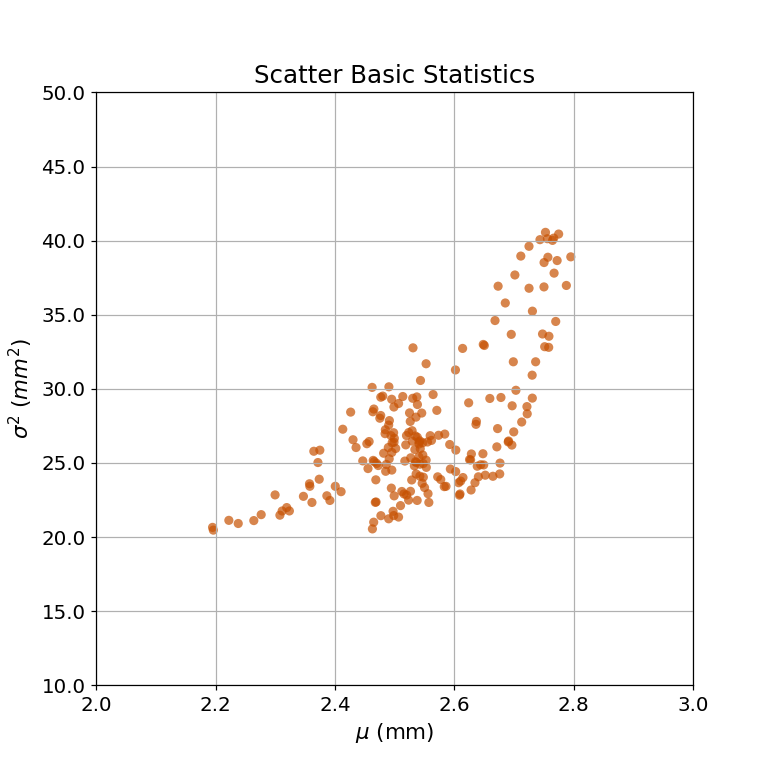

In [10]:
MaxX = round( BSArray[BSCols[0]].max() + 0.5, 0 )
MaxY = round( BSArray[BSCols[1]].max() + 5.0, -1 )
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( BSArray[BSCols[0]], BSArray[BSCols[1]], label="$\mu$ and $\sigma^{2}$",
                       alpha= 0.7, edgecolors='none', c="xkcd:dark orange" )
ax11.set_xlim( (2.0, MaxX) )
ax11.set_ylim( (10.0, MaxY) )
ax11.set_title("Scatter Basic Statistics", fontsize=16 )
ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


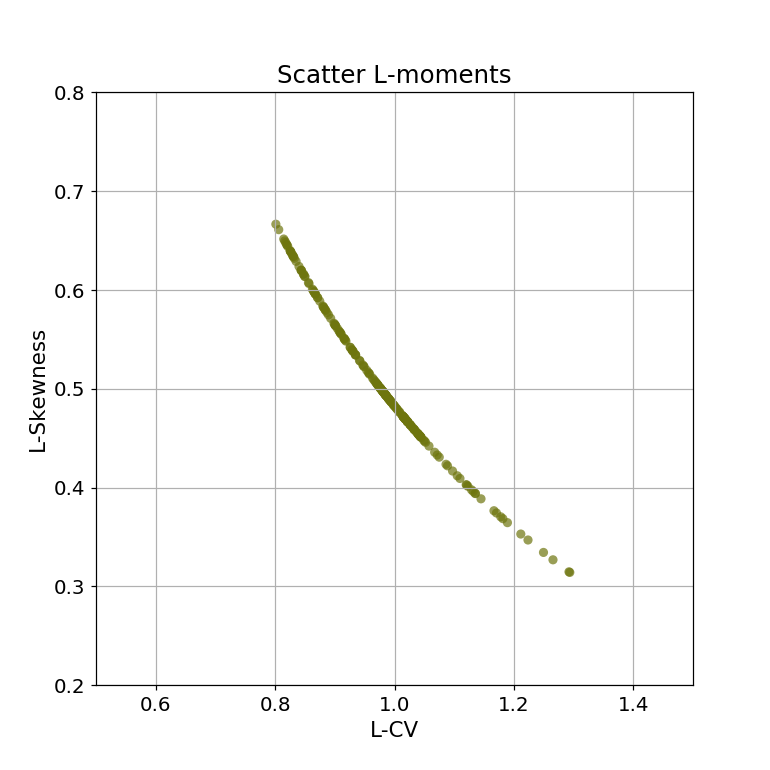

In [11]:
MaxX = round( LMArray[LMCols[0]].max(), 1 )
MaxY = round( LMArray[LMCols[1]].max(), 1 )
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( LMArray[LMCols[0]], LMArray[LMCols[1]], label="L_1 and L_2",
                       alpha= 0.7, edgecolors='none', c="xkcd:olive" )
ax11.set_xlim( (0.5, 1.5) )
ax11.set_ylim( (0.2, 0.8) )
ax11.set_title("Scatter L-moments", fontsize=16 )
ax11.set_xlabel(r'L-CV', fontsize=14 )
ax11.set_ylabel(r'L-Skewness', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

Two collections are identified for PCA analysis and dimensionality reduction. The reduced dimensionality variables will then be used in clustering analysis.

In [12]:
BaseStatsCols = [ "Mean", "Median", "Var", "Skewness", "Kurtosis" ]
BaseStatsArray = gpdJanDF.loc[:, BaseStatsCols]
BaseStatsArray.shape

(210, 5)

In [13]:
LMomStatsCols = [ 'L-CV', 'L-Skewness', 'L-Kurtosis' ]
LMomStatsArray = gpdJanDF.loc[:, LMomStatsCols]
LMomStatsArray.shape

(210, 3)

### PCA

Principal component analysis is used to reduce our two DataFrames with statistical quantities to a collection of transformed variables with reduced dimensionality. This means that we are combining our original N variables to make a representation with N-1 parameters or less.

- *BaseStatsArray* has classic, descriptive statistics moments
    - Examine using 2 and 3 variables
- *LMomStatsArray* has L-moment ratios
    - Examine using 2 variables
    - Does not need to be whitened because are using L-moment ratios which are already scaled

In [14]:
pca2 = PCA(n_components=2, whiten=True, svd_solver='full' )
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
pcaLM2 = PCA(n_components=2, whiten=False, svd_solver='full' )

#### Statistical Moments - 2 Components

In [15]:
resPCA2 = pca2.fit( BaseStatsArray )

In [16]:
print( "Percentage explained variance: %s  and Total explained variance: %f " % 
       (resPCA2.explained_variance_ratio_, sum(resPCA2.explained_variance_ratio_) ) )

Percentage explained variance: [0.87726991 0.12194084]  and Total explained variance: 0.999211 


In [17]:
print( "%s" % resPCA2.singular_values_ )

[81.2277519  30.28394277]


In [18]:
print( "%s" % resPCA2.components_ )

[[ 0.01280854 -0.02177614  0.81735265  0.05295783  0.57314209]
 [-0.02969702  0.01810426 -0.5747801   0.07942229  0.81370158]]


In [19]:
trans2BaseStat = resPCA2.transform( BaseStatsArray )
trans2BaseStat.shape

(210, 2)

<IPython.core.display.Javascript object>


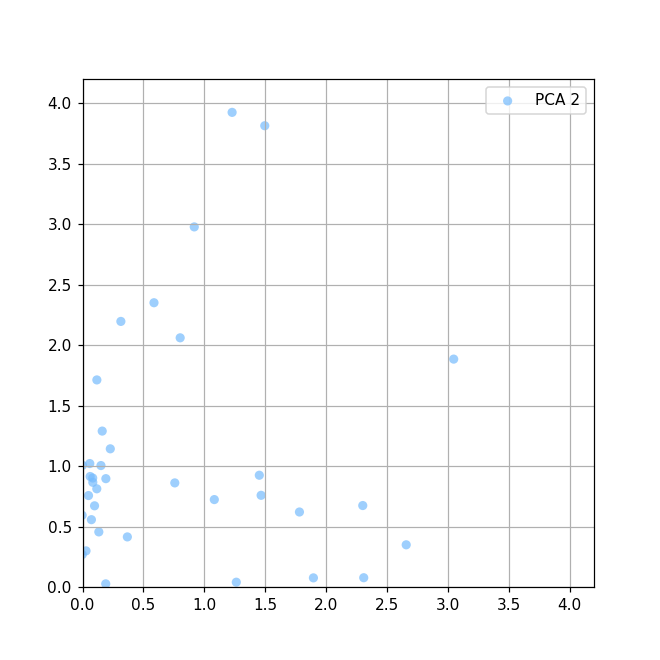

In [20]:
MaxV = round( max( trans2BaseStat[:, 0].max(), trans2BaseStat[:, 1].max() ), 1 )
Fig1 = plt.figure()
Fig1.set_size_inches(6.0, 6.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( trans2BaseStat[:, 0], trans2BaseStat[:, 1], label="PCA 2",
                       alpha= 0.7, edgecolors='none', c="xkcd:sky blue" )
ax11.set_xlim( (0.0, MaxV) )
ax11.set_ylim( (0.0, MaxV) )
ax11.legend()
ax11.grid(True)

#### Statistical Moments - 3 Components

In [21]:
resPCA3 = pca3.fit( BaseStatsArray )

In [22]:
print( "Percentage explained variance: %s  and Total explained variance: %f " % 
       (resPCA3.explained_variance_ratio_, sum(resPCA3.explained_variance_ratio_) ) )

Percentage explained variance: [8.77269910e-01 1.21940845e-01 6.74553042e-04]  and Total explained variance: 0.999885 


In [23]:
print( "%s" % resPCA3.singular_values_ )

[81.2277519  30.28394277  2.25240182]


In [24]:
print( "%s" % resPCA3.components_ )

[[ 0.01280854 -0.02177614  0.81735265  0.05295783  0.57314209]
 [-0.02969702  0.01810426 -0.5747801   0.07942229  0.81370158]
 [-0.48553051 -0.85395399 -0.01027435  0.18530524 -0.02406468]]


In [25]:
trans3BaseStat = resPCA3.transform( BaseStatsArray )
trans3BaseStat.shape

(210, 3)

<IPython.core.display.Javascript object>


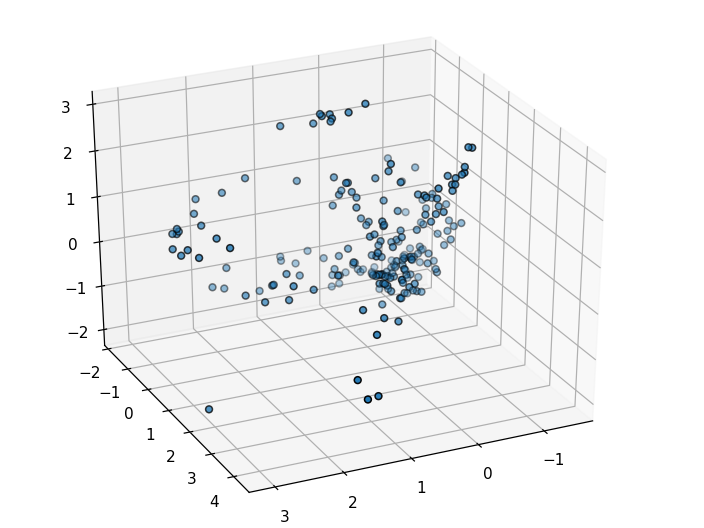

In [26]:
Fig1 = plt.figure()
ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
ax11.scatter( trans3BaseStat[:, 0], trans3BaseStat[:, 1], trans3BaseStat[:, 2],
              edgecolor='k' )

#### L-moments 2 Components

In [27]:
resLMPCA2 = pcaLM2.fit( LMomStatsArray )

In [28]:
print( "Percentage explained variance: %s  and Total explained variance: %f " % 
       (resLMPCA2.explained_variance_ratio_, sum(resLMPCA2.explained_variance_ratio_) ) )

Percentage explained variance: [0.99533263 0.00466737]  and Total explained variance: 1.000000 


In [29]:
print( "%s" % resLMPCA2.singular_values_ )

[1.81943113 0.12459129]


In [30]:
print( "%s" % resLMPCA2.components_ )

[[ 0.77671197 -0.59341541  0.21113186]
 [ 0.62985595  0.73177503 -0.26035895]]


In [31]:
trans2LMStat = resLMPCA2.transform( LMomStatsArray )
trans2LMStat.shape

(210, 2)

<IPython.core.display.Javascript object>


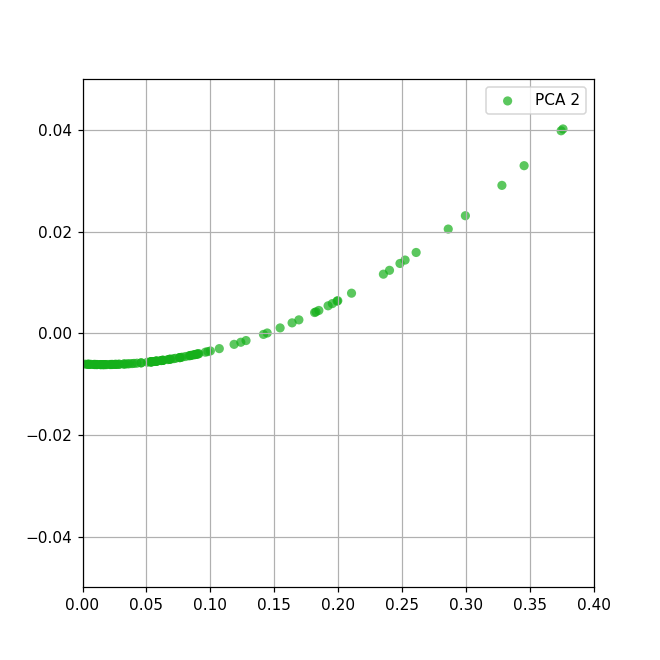

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  if __name__ == '__main__':


In [32]:
MaxX = round( trans2LMStat[:, 0].max(), 1 )
MaxY = round( trans2LMStat[:, 1].max(), 1 )
Fig1 = plt.figure()
Fig1.set_size_inches(6.0, 6.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( trans2LMStat[:, 0], trans2LMStat[:, 1], label="PCA 2",
                       alpha= 0.7, edgecolors='none', c="xkcd:green" )
ax11.set_xlim( (0.0, MaxX) )
ax11.set_ylim( (0.0, MaxY) )
ax11.legend()
ax11.grid(True)

From the preceeding analysis, L-moments provides a linearized representation which will not be good for K-means clustering. Instead use the basic or standard statistics. Use the following:

- **BSArray** 2 Component for first two moments, mean and variance
- **trans3BaseStat** for PCA, 3 Components from 5 statistics

Use scatter plots of L-moment ratios to check the clustering

### K-Means Clustering

#### 2 Component, Statistical Moments

Create a tracking copy DataFrame

In [33]:
PolyList = gpdJanDF['geometry'].tolist()

In [34]:
BSTrackDF = BSArray.copy()

In [35]:
BSTrackDF[LMCols[0]] = np.array( gpdJanDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdJanDF[LMCols[1]], dtype=np.float32 )

In [36]:
gpdBSTrackDS = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDS.crs = UTMCRS

Set up our estimators

In [37]:
CNamesList = [ 'K-Means_3', 'K-Means_4', 'K-Means_5' ]

In [38]:
clustEst = [(CNamesList[0], KMeans(n_clusters=3)),
            (CNamesList[1], KMeans(n_clusters=4)),
            (CNamesList[2], KMeans(n_clusters=5)),
           ]

In [39]:
cEst = clustEst[1][1]
cBS = cEst.fit( BSArray )

In [40]:
cBS.cluster_centers_

array([[ 2.59814749, 30.26943216],
       [ 2.53949727, 26.04794477],
       [ 2.74226729, 38.09811783],
       [ 2.47437244, 22.73737258]])

In [41]:
cBS.inertia_

358.0637519101318

In [42]:
InertiaArray = np.zeros( len(clustEst), dtype=np.float32 )

In [43]:
iCnt = 0
for name, cEst in clustEst:
    cBS = cEst.fit( BSArray )
    InertiaArray[iCnt] = cBS.inertia_
    gpdBSTrackDS[name] = cBS.fit_predict( BSArray )
    iCnt += 1
# end for

In [44]:
display( HTML( gpdBSTrackDS.head().to_html() ) )

,Mean,Var,L-CV,L-Skewness,geometry,K-Means_3,K-Means_4,K-Means_5
Grid_Id,,,,,,,,
662328,2.526197,27.802185,0.992758,0.487848,"POLYGON ((289652.4641094491 3355071.069494826,...",1,0,4
662329,2.538196,28.942152,0.983337,0.495001,"POLYGON ((293659.7821939538 3354982.047060126,...",1,3,4
662330,2.535765,28.091555,0.985239,0.493546,"POLYGON ((297667.0555511587 3354894.498842616,...",1,0,4
662331,2.501804,25.978506,1.012188,0.473516,"POLYGON ((301674.2852262522 3354808.424693275,...",1,0,3
662332,2.485020,24.437307,1.025778,0.463814,"POLYGON ((305681.4722644902 3354723.824465819,...",0,0,3


In [45]:
MaxX = round( gpdBSTrackDS[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDS[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDS[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDS[BSCols[1]].min() - 10.0, -1 )
MinX, MaxX, MinY, MaxY

(2.0, 3.0, 10.0, 50.0)

<IPython.core.display.Javascript object>


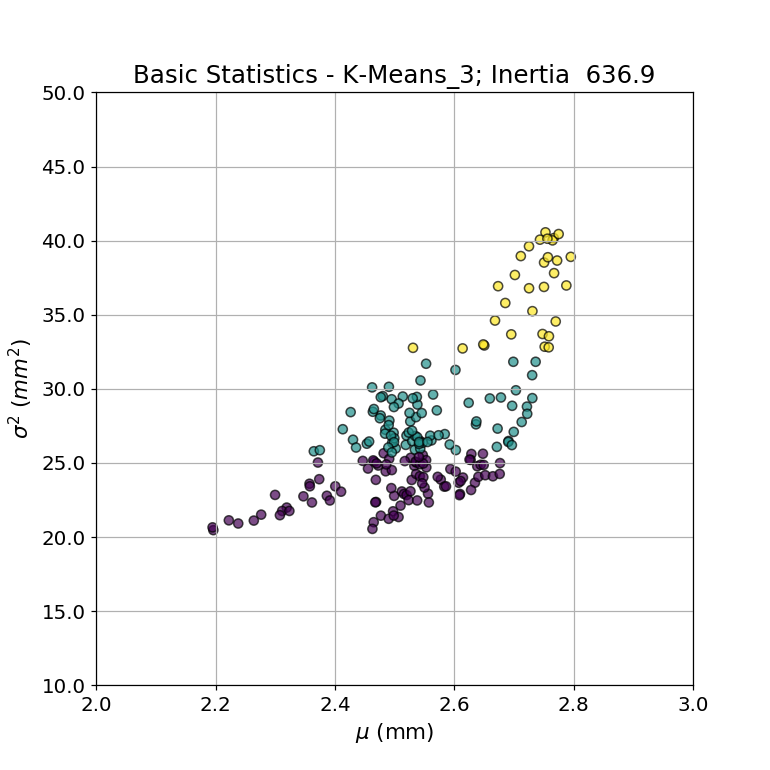

In [56]:
MaxX = round( gpdBSTrackDS[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDS[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDS[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDS[BSCols[1]].min() - 10.0, -1 )
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdBSTrackDS[BSCols[0]], gpdBSTrackDS[BSCols[1]], 
                      label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                      c=gpdBSTrackDS[CNamesList[0]] )
ax11.set_xlim( (MinX, MaxX) )
ax11.set_ylim( (MinY, MaxY) )
ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
               (CNamesList[0], InertiaArray[0]), fontsize=16 )
ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

In [55]:
MaxLMX = round( gpdBSTrackDS[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDS[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDS[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDS[LMCols[1]].min() - 0.1, 1 )
MinLMX, MaxLMX, MinLMY, MaxLMY

(0.7, 1.4, 0.2, 0.8)

<IPython.core.display.Javascript object>


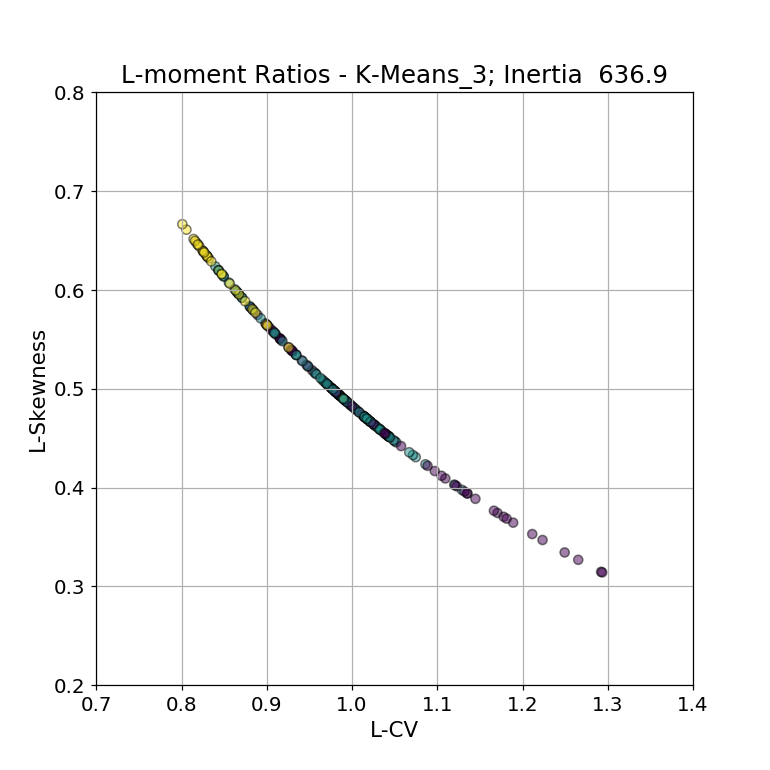

In [58]:
MaxLMX = round( gpdBSTrackDS[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDS[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDS[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDS[LMCols[1]].min() - 0.1, 1 )
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdBSTrackDS[LMCols[0]], gpdBSTrackDS[LMCols[1]], 
                      label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                      c=gpdBSTrackDS[CNamesList[0]] )
ax11.set_xlim( (MinLMX, MaxLMX) )
ax11.set_ylim( (MinLMY, MaxLMY) )
ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
               (CNamesList[0], InertiaArray[0]), fontsize=16 )
ax11.set_xlabel(r'L-CV', fontsize=14 )
ax11.set_ylabel(r'L-Skewness', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


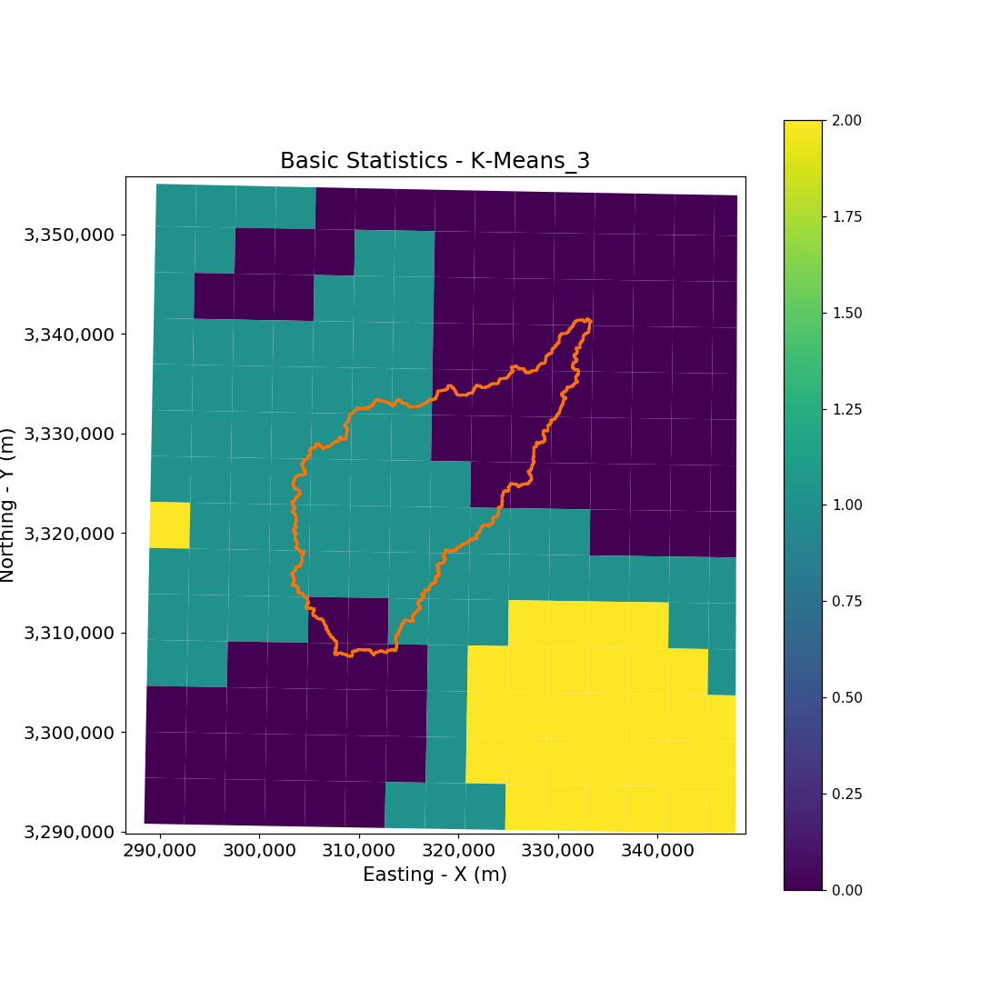

In [47]:
Fig1 = plt.figure()
Fig1.set_size_inches(10.0, 10.0)
ax11 = Fig1.add_subplot(111)
gpdBSTrackDS.plot(column=CNamesList[0], ax=ax11, legend=True )
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("Basic Statistics - %s" % CNamesList[0], fontsize=16 )
ax11.set_xlabel('Easting - X (m)', fontsize=14 )
ax11.set_ylabel('Northing - Y (m)', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )

<IPython.core.display.Javascript object>


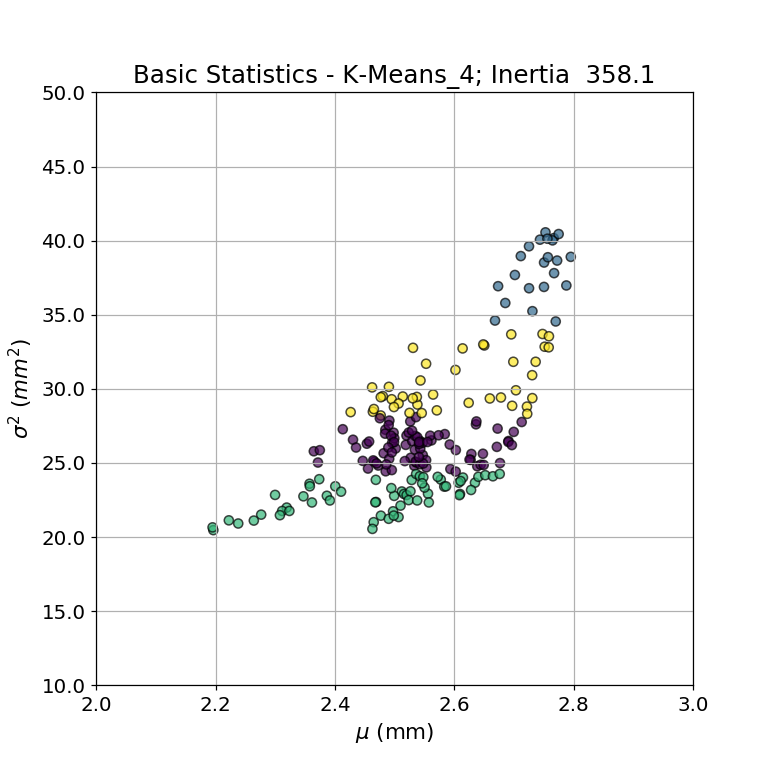

In [59]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdBSTrackDS[BSCols[0]], gpdBSTrackDS[BSCols[1]], 
                      label="$\mu$ and $\sigma^{2}$", alpha= 0.7, 
                      edgecolors='k', c=gpdBSTrackDS[CNamesList[1]] )
ax11.set_xlim( (MinX, MaxX) )
ax11.set_ylim( (MinY, MaxY) )
ax11.set_title( "Basic Statistics - %s; Inertia %6.1f" % 
                (CNamesList[1], InertiaArray[1]), fontsize=16 )
ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


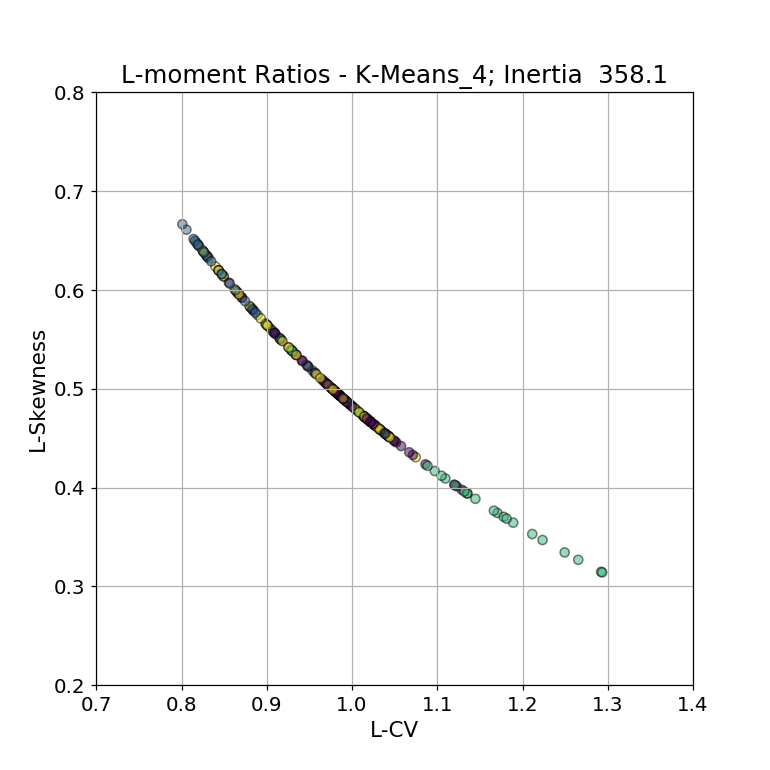

In [60]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdBSTrackDS[LMCols[0]], gpdBSTrackDS[LMCols[1]], 
                      label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                      c=gpdBSTrackDS[CNamesList[1]] )
ax11.set_xlim( (MinLMX, MaxLMX) )
ax11.set_ylim( (MinLMY, MaxLMY) )
ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
               (CNamesList[1], InertiaArray[1]), fontsize=16 )
ax11.set_xlabel(r'L-CV', fontsize=14 )
ax11.set_ylabel(r'L-Skewness', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


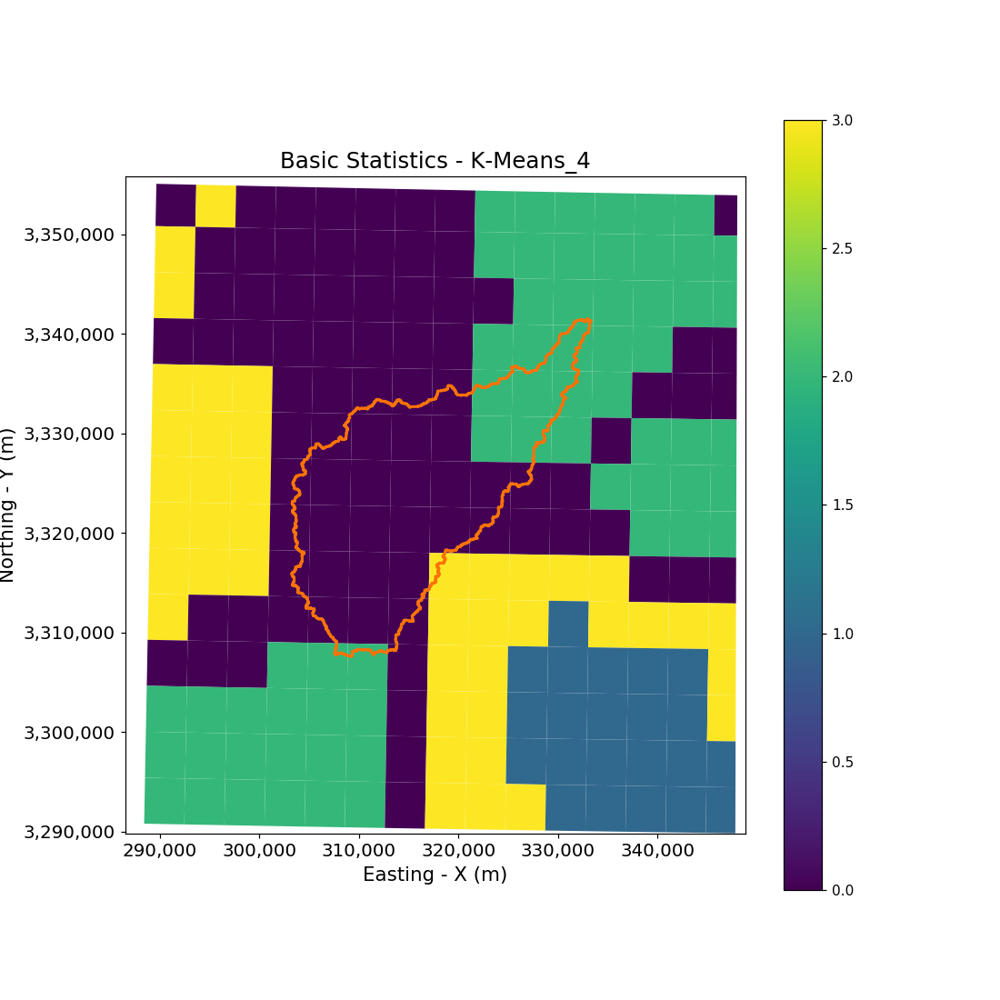

In [49]:
Fig1 = plt.figure()
Fig1.set_size_inches(10.0, 10.0)
ax11 = Fig1.add_subplot(111)
gpdBSTrackDS.plot(column=CNamesList[1], ax=ax11, legend=True )
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("Basic Statistics - %s" % CNamesList[1], fontsize=16 )
ax11.set_xlabel('Easting - X (m)', fontsize=14 )
ax11.set_ylabel('Northing - Y (m)', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )

<IPython.core.display.Javascript object>


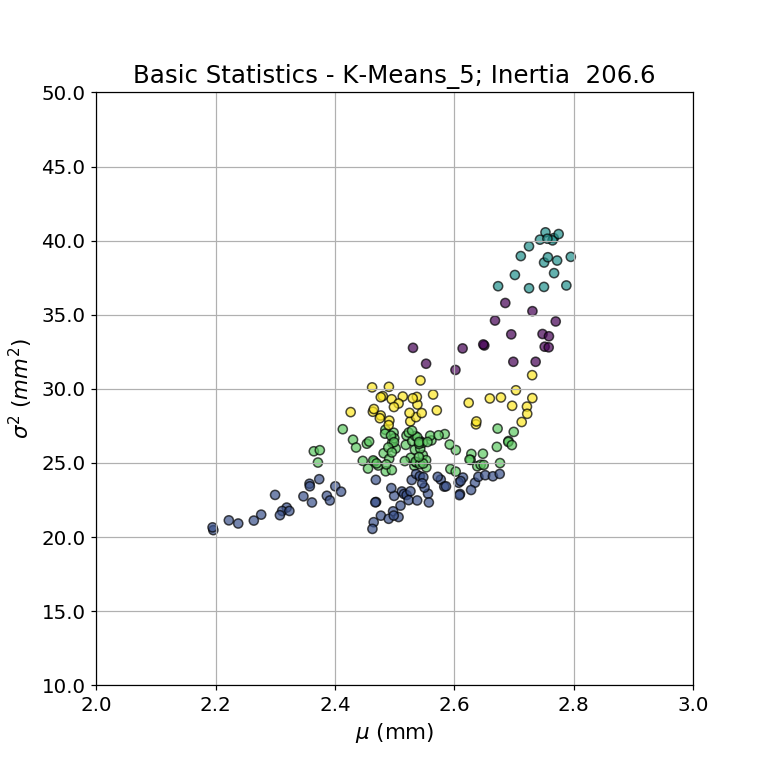

In [61]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdBSTrackDS[BSCols[0]], gpdBSTrackDS[BSCols[1]], 
                      label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                      c=gpdBSTrackDS[CNamesList[2]] )
ax11.set_xlim( (MinX, MaxX) )
ax11.set_ylim( (MinY, MaxY) )
ax11.set_title( "Basic Statistics - %s; Inertia %6.1f" % 
               (CNamesList[2], InertiaArray[2]), fontsize=16 )
ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


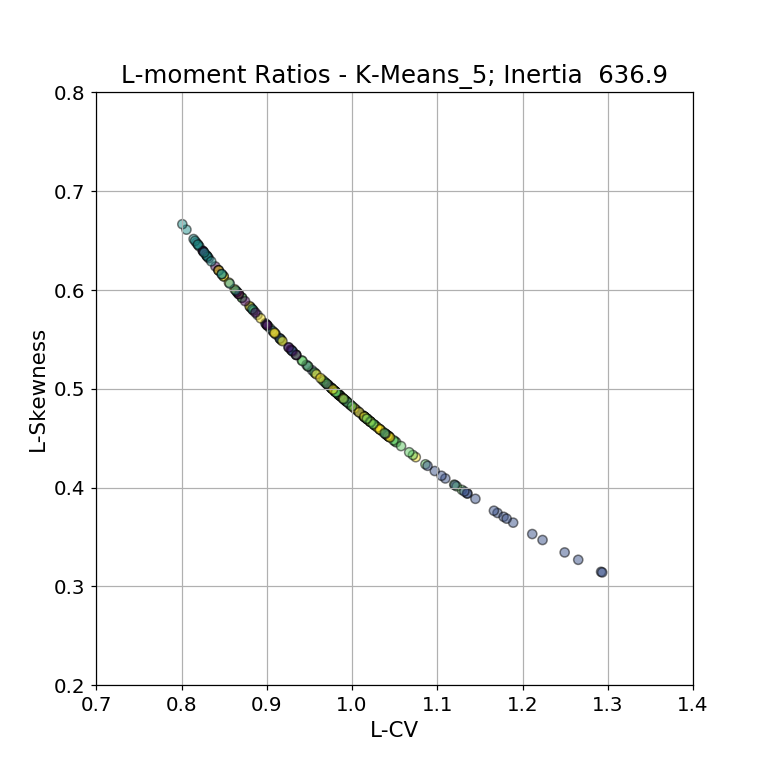

In [62]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdBSTrackDS[LMCols[0]], gpdBSTrackDS[LMCols[1]], 
                      label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                      c=gpdBSTrackDS[CNamesList[2]] )
ax11.set_xlim( (MinLMX, MaxLMX) )
ax11.set_ylim( (MinLMY, MaxLMY) )
ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
               (CNamesList[2], InertiaArray[0]), fontsize=16 )
ax11.set_xlabel(r'L-CV', fontsize=14 )
ax11.set_ylabel(r'L-Skewness', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


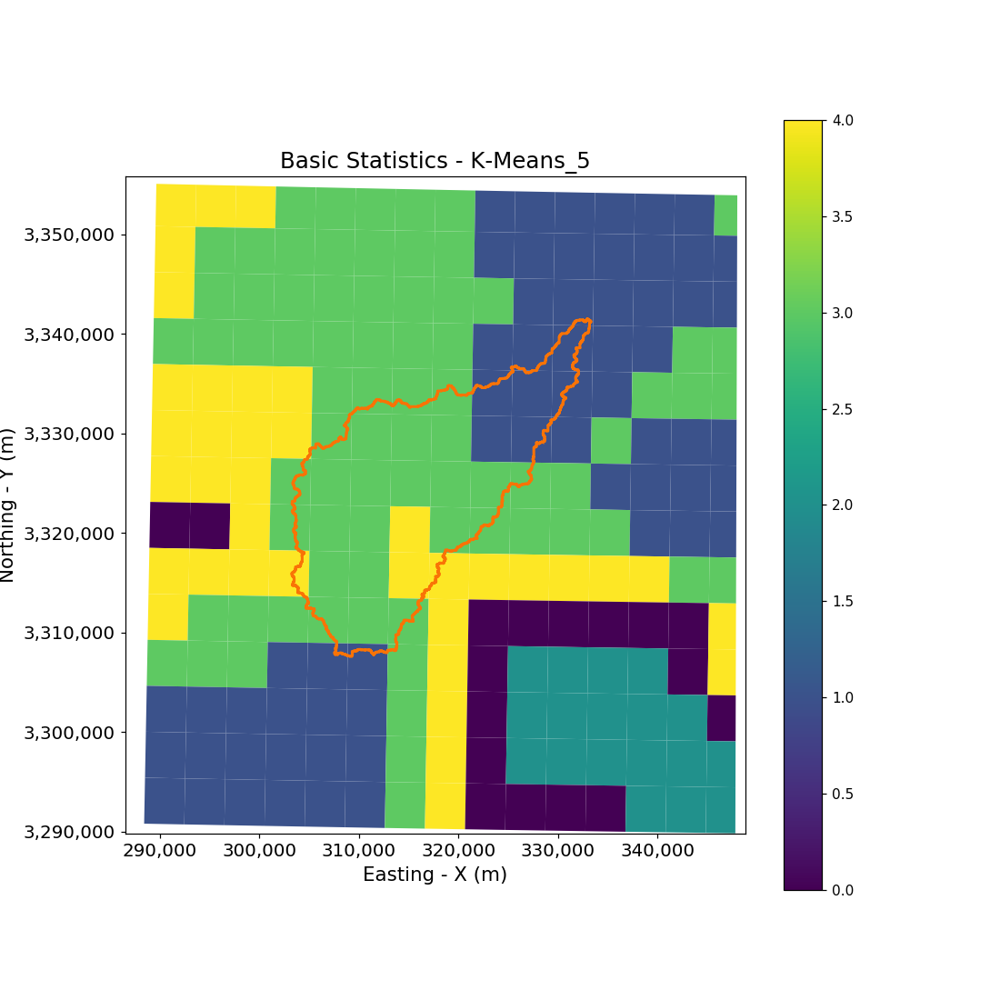

In [51]:
Fig1 = plt.figure()
Fig1.set_size_inches(10.0, 10.0)
ax11 = Fig1.add_subplot(111)
gpdBSTrackDS.plot(column=CNamesList[2], ax=ax11, legend=True )
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("Basic Statistics - %s" % CNamesList[2], fontsize=16 )
ax11.set_xlabel('Easting - X (m)', fontsize=14 )
ax11.set_ylabel('Northing - Y (m)', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )

In the above analysis, 5 clusters is too many. 3 would work fine for the area of interest which is the watershed.

#### 3 Component, PCA-Reduced Statistical Moments

Create a tracking copy DataFrame

For this one need to make the DataFrame from the numpy matrix

In [63]:
PCAVarCols = [ "PCA_1", "PCA_2", "PCA_3" ]

In [64]:
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }

In [65]:
PCATrackDF = pd.DataFrame( data=DataDict )

In [66]:
PCATrackDF[LMCols[0]] = np.array( gpdJanDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdJanDF[LMCols[1]], dtype=np.float32 )

In [67]:
display( HTML( PCATrackDF.head().to_html() ) )

,PCA_1,PCA_2,PCA_3,L-CV,L-Skewness
0,0.917640,2.979298,-0.465668,0.992758,0.487848
1,1.498012,4.246564,-1.119596,0.983337,0.495001
2,1.228438,3.925878,-1.281004,0.985239,0.493546
3,0.315061,2.198211,-0.694962,1.012188,0.473516
4,-0.258840,1.289467,-0.419921,1.025778,0.463814


In [68]:
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS

In [69]:
InertiaArray = np.zeros( len(clustEst), dtype=np.float32 )

In [70]:
iCnt = 0
for name, cEst in clustEst:
    cBS = cEst.fit( trans3BaseStat )
    InertiaArray[iCnt] = cBS.inertia_
    gpdPCATrackDF[name] = cBS.fit_predict( trans3BaseStat )
    iCnt += 1
# end for

In [71]:
display( HTML( gpdPCATrackDF.head().to_html() ) )

,PCA_1,PCA_2,PCA_3,L-CV,L-Skewness,geometry,K-Means_3,K-Means_4,K-Means_5
0,0.917640,2.979298,-0.465668,0.992758,0.487848,"POLYGON ((289652.4641094491 3355071.069494826,...",2,0,4
1,1.498012,4.246564,-1.119596,0.983337,0.495001,"POLYGON ((293659.7821939538 3354982.047060126,...",2,0,4
2,1.228438,3.925878,-1.281004,0.985239,0.493546,"POLYGON ((297667.0555511587 3354894.498842616,...",2,0,4
3,0.315061,2.198211,-0.694962,1.012188,0.473516,"POLYGON ((301674.2852262522 3354808.424693275,...",2,0,4
4,-0.258840,1.289467,-0.419921,1.025778,0.463814,"POLYGON ((305681.4722644902 3354723.824465819,...",2,0,2


In [73]:
MaxX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
MinX, MaxX, MinY, MaxY, MinZ, MaxZ

(-2, 4, -2, 5, -3, 3)

<IPython.core.display.Javascript object>


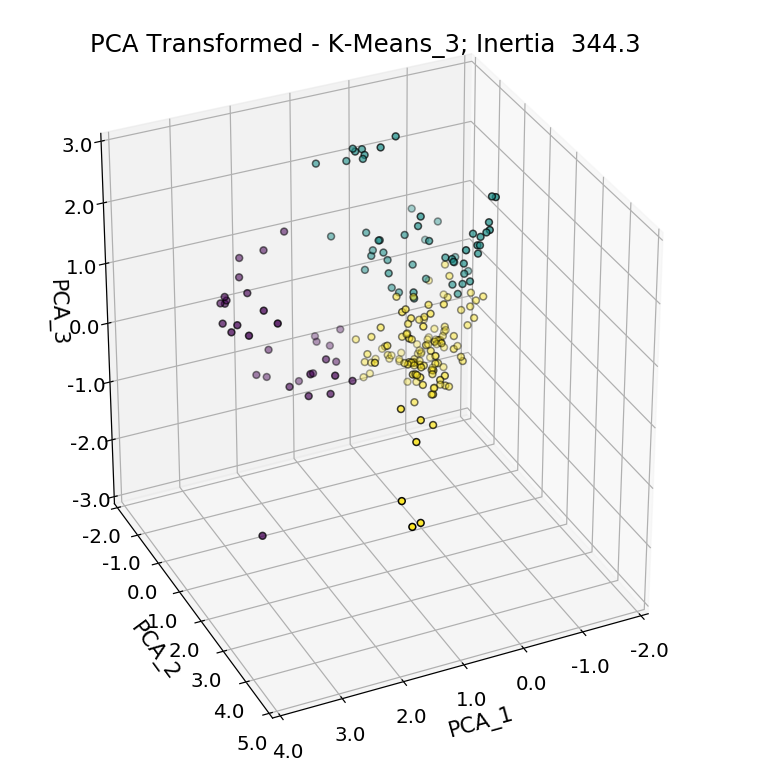

In [74]:
MaxX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
              gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
              c=gpdPCATrackDF[CNamesList[0]])
ax11.set_xlim( (MinX, MaxX) )
ax11.set_ylim( (MinY, MaxY) )
ax11.set_zlim( (MinZ, MaxZ) )
ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
               ( CNamesList[0], InertiaArray[0] ), fontsize=16 )
ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )

<IPython.core.display.Javascript object>


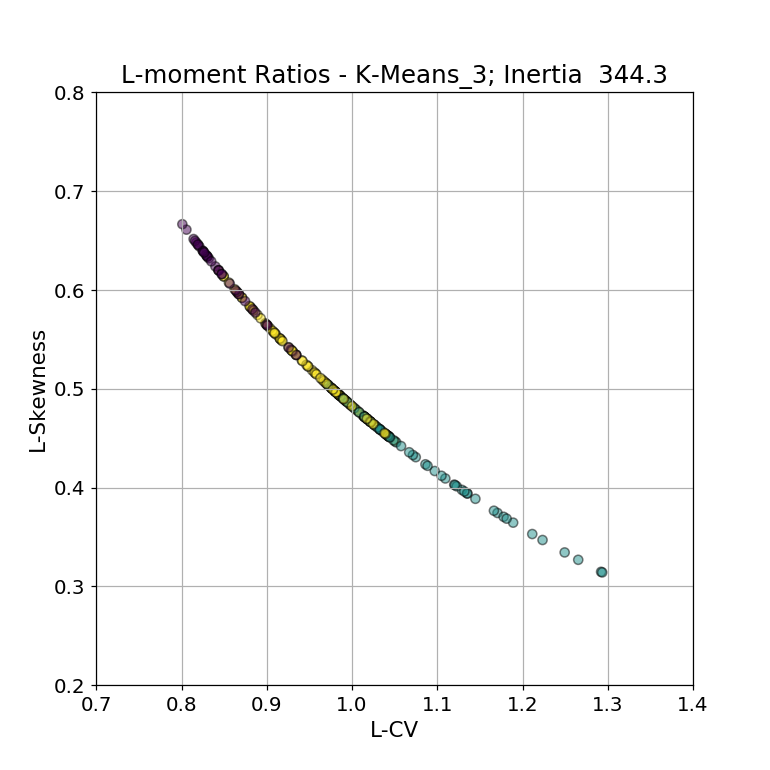

In [75]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                      label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                      c=gpdPCATrackDF[CNamesList[0]] )
ax11.set_xlim( (MinLMX, MaxLMX) )
ax11.set_ylim( (MinLMY, MaxLMY) )
ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
               (CNamesList[0], InertiaArray[0]), fontsize=16 )
ax11.set_xlabel(r'L-CV', fontsize=14 )
ax11.set_ylabel(r'L-Skewness', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


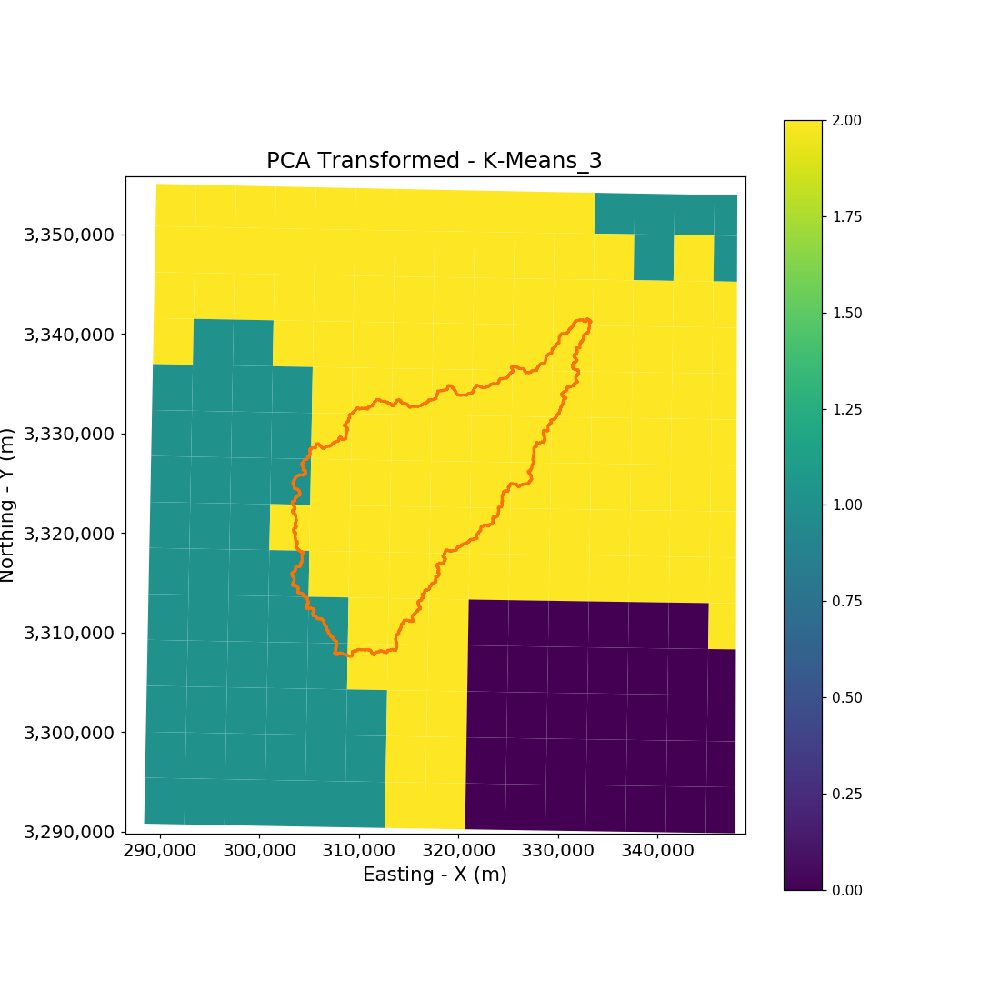

In [76]:
Fig1 = plt.figure()
Fig1.set_size_inches(10.0, 10.0)
ax11 = Fig1.add_subplot(111)
gpdPCATrackDF.plot(column=CNamesList[0], ax=ax11, legend=True )
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("PCA Transformed - %s" % CNamesList[0], fontsize=16 )
ax11.set_xlabel('Easting - X (m)', fontsize=14 )
ax11.set_ylabel('Northing - Y (m)', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )

<IPython.core.display.Javascript object>


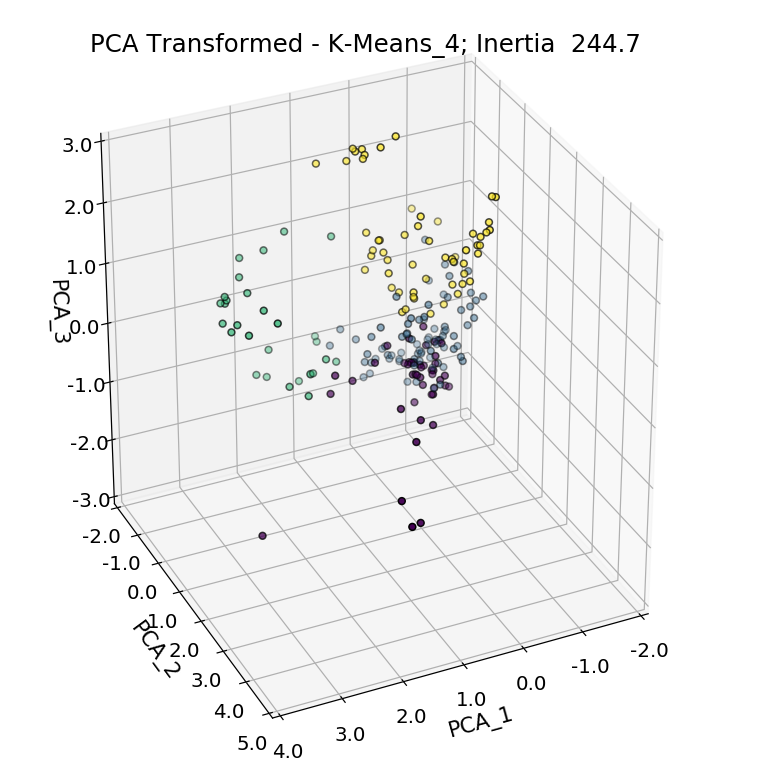

In [77]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
              gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
              c=gpdPCATrackDF[CNamesList[1]])
ax11.set_xlim( (MinX, MaxX) )
ax11.set_ylim( (MinY, MaxY) )
ax11.set_zlim( (MinZ, MaxZ) )
ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
               ( CNamesList[1], InertiaArray[1] ), fontsize=16 )
ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )

<IPython.core.display.Javascript object>


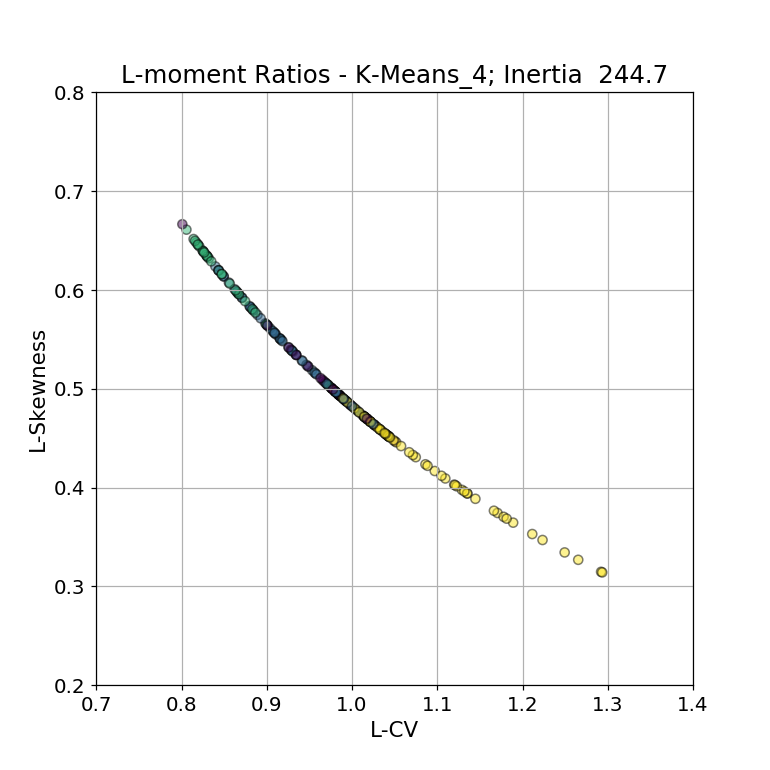

In [78]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                      label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                      c=gpdPCATrackDF[CNamesList[1]] )
ax11.set_xlim( (MinLMX, MaxLMX) )
ax11.set_ylim( (MinLMY, MaxLMY) )
ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
               (CNamesList[1], InertiaArray[1]), fontsize=16 )
ax11.set_xlabel(r'L-CV', fontsize=14 )
ax11.set_ylabel(r'L-Skewness', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


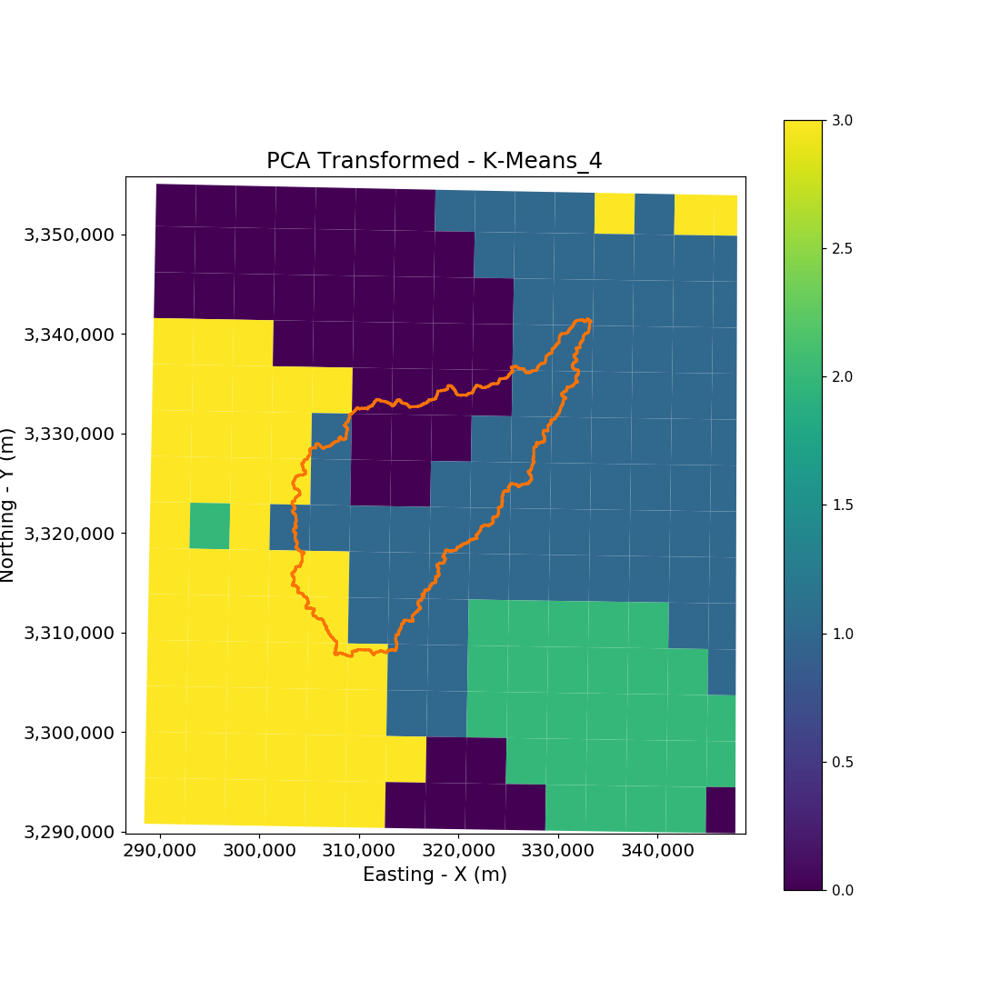

In [79]:
Fig1 = plt.figure()
Fig1.set_size_inches(10.0, 10.0)
ax11 = Fig1.add_subplot(111)
gpdPCATrackDF.plot(column=CNamesList[1], ax=ax11, legend=True )
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("PCA Transformed - %s" % CNamesList[1], fontsize=16 )
ax11.set_xlabel('Easting - X (m)', fontsize=14 )
ax11.set_ylabel('Northing - Y (m)', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )

<IPython.core.display.Javascript object>


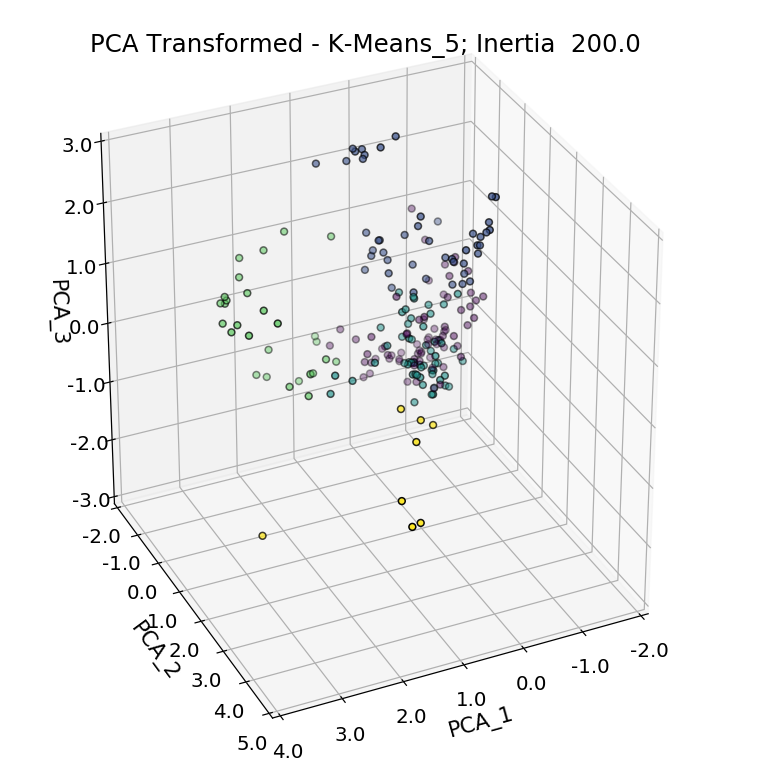

In [80]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
              gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
              c=gpdPCATrackDF[CNamesList[2]])
ax11.set_xlim( (MinX, MaxX) )
ax11.set_ylim( (MinY, MaxY) )
ax11.set_zlim( (MinZ, MaxZ) )
ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
               ( CNamesList[2], InertiaArray[2] ), fontsize=16 )
ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )

<IPython.core.display.Javascript object>


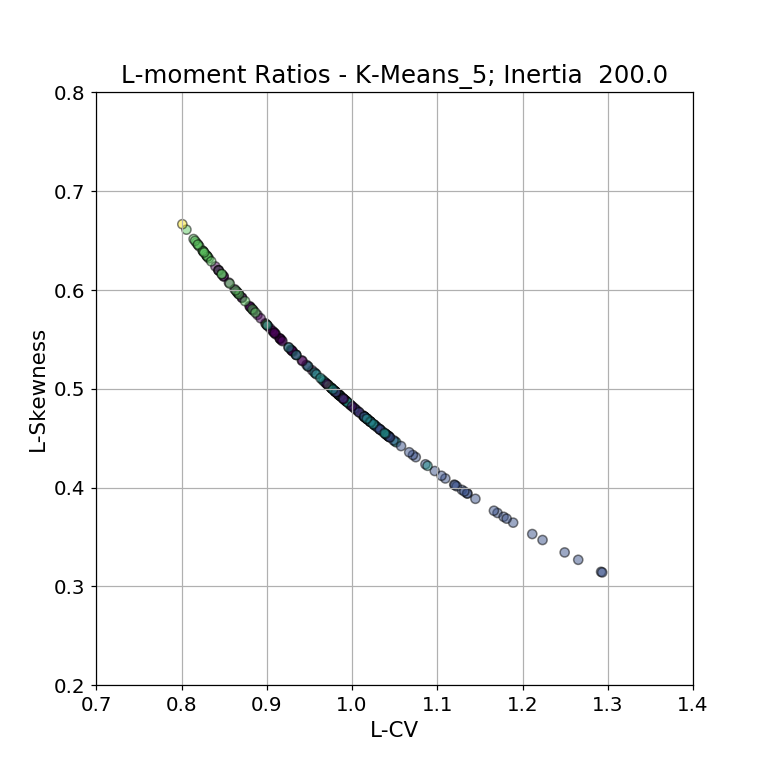

In [81]:
Fig1 = plt.figure()
Fig1.set_size_inches(7.0, 7.0)
ax11 = Fig1.add_subplot(111)
tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                      label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                      c=gpdPCATrackDF[CNamesList[2]] )
ax11.set_xlim( (MinLMX, MaxLMX) )
ax11.set_ylim( (MinLMY, MaxLMY) )
ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
               (CNamesList[2], InertiaArray[2]), fontsize=16 )
ax11.set_xlabel(r'L-CV', fontsize=14 )
ax11.set_ylabel(r'L-Skewness', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
#ax11.legend()
ax11.grid(True)

<IPython.core.display.Javascript object>


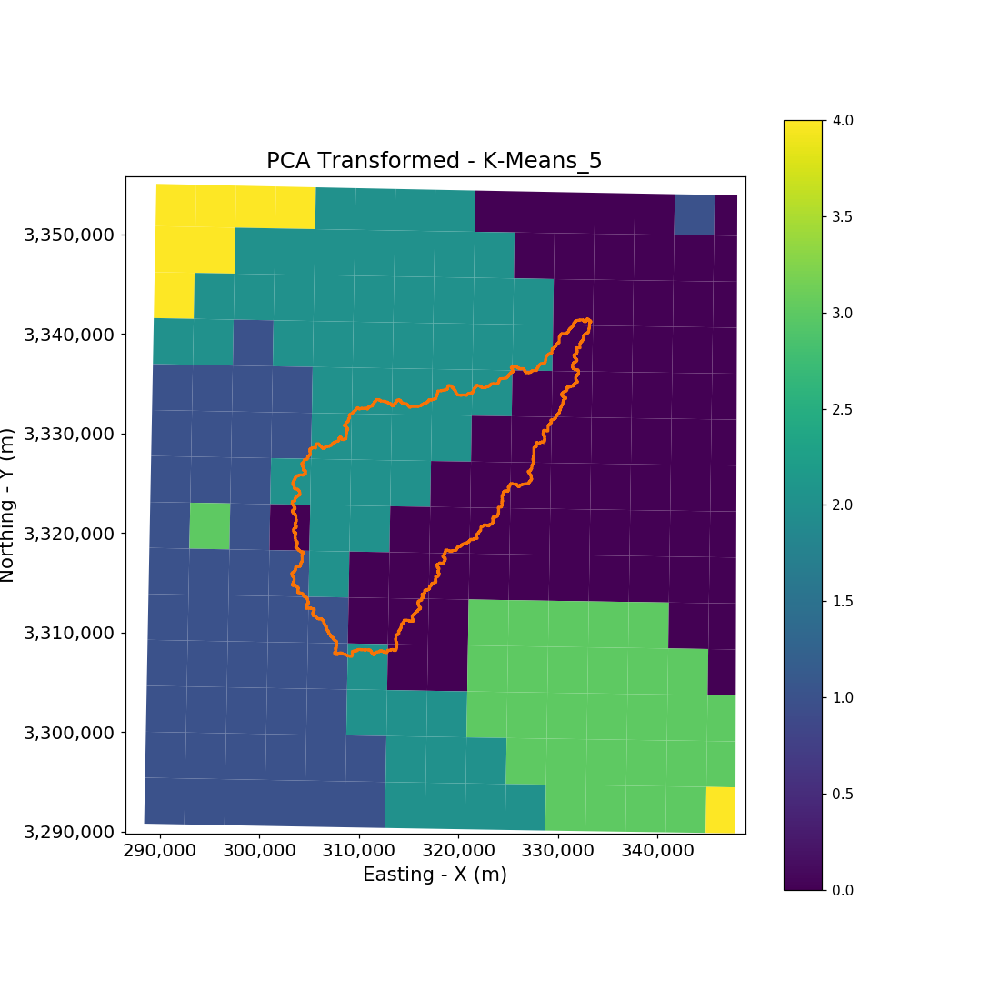

In [82]:
Fig1 = plt.figure()
Fig1.set_size_inches(10.0, 10.0)
ax11 = Fig1.add_subplot(111)
gpdPCATrackDF.plot(column=CNamesList[2], ax=ax11, legend=True )
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("PCA Transformed - %s" % CNamesList[2], fontsize=16 )
ax11.set_xlabel('Easting - X (m)', fontsize=14 )
ax11.set_ylabel('Northing - Y (m)', fontsize=14)
ax11.tick_params(axis='both', which='major', labelsize=13)
ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )

In the above analysis, 5 clusters does not provide an improvement relative to 4. Visually, 4 clusters is most appealing for the area of interest which is the watershed. Additionally, there is a relatively large drop in inertia from 3 cluster to 4 clusters and a small decline in inertia from 4 clusters to 5 clusters.

## All Months

Use what was learned from working on January to generate a loop to go through all months and output the following items.

1. Spreadsheet with statistics including cluster centers
2. Plots to reproduce those provided above for all months
3. Shapefiles for archive and plotting of the grid cell layout of cluster definitions.

In [87]:
StatsCoalHds = [ "PCA3_ExVarRat_1", #0
                 "PCA3_ExVarRat_2", #1
                 "PCA3_ExVarRat_3", #2
                 "PCA3_SumExVar", #3
                 "PCA3_Comp1_%s" % BaseStatsCols[0], #4
                 "PCA3_Comp1_%s" % BaseStatsCols[1], #5
                 "PCA3_Comp1_%s" % BaseStatsCols[2], #6
                 "PCA3_Comp1_%s" % BaseStatsCols[3], #7
                 "PCA3_Comp1_%s" % BaseStatsCols[4], #8
                 "PCA3_Comp2_%s" % BaseStatsCols[0], #9
                 "PCA3_Comp2_%s" % BaseStatsCols[1], #10
                 "PCA3_Comp2_%s" % BaseStatsCols[2], #11
                 "PCA3_Comp2_%s" % BaseStatsCols[3], #12
                 "PCA3_Comp2_%s" % BaseStatsCols[4], #13
                 "PCA3_Comp3_%s" % BaseStatsCols[0], #14
                 "PCA3_Comp3_%s" % BaseStatsCols[1], #15
                 "PCA3_Comp3_%s" % BaseStatsCols[2], #16
                 "PCA3_Comp3_%s" % BaseStatsCols[3], #17
                 "PCA3_Comp3_%s" % BaseStatsCols[4], #18
                 "N3_BS_Inertia", #19
                 "N3_K1_CCenter_mu", #20
                 "N3_K1_CCenter_rho", #21
                 "N3_K2_CCenter_mu", #22
                 "N3_K2_CCenter_rho", #23
                 "N3_K3_CCenter_mu", #24
                 "N3_K3_CCenter_rho", #25
                 "N3_PCA_Inertia", #26
                 "N3_K1_CCenter_PCA1", #27
                 "N3_K1_CCenter_PCA2", #28
                 "N3_K1_CCenter_PCA3", #29
                 "N3_K2_CCenter_PCA1", #30
                 "N3_K2_CCenter_PCA2", #31
                 "N3_K2_CCenter_PCA3", #32
                 "N3_K3_CCenter_PCA1", #33
                 "N3_K3_CCenter_PCA2", #34
                 "N3_K3_CCenter_PCA3", #35
                 "N4_BS_Inertia", #36
                 "N4_K1_CCenter_mu", #37
                 "N4_K1_CCenter_rho", #38
                 "N4_K2_CCenter_mu", #39
                 "N4_K2_CCenter_rho", #40
                 "N4_K3_CCenter_mu", #41
                 "N4_K3_CCenter_rho", #42
                 "N4_K4_CCenter_mu", #43
                 "N4_K4_CCenter_rho", #44
                 "N4_PCA_Inertia", #45
                 "N4_K1_CCenter_PCA1", #46
                 "N4_K1_CCenter_PCA2", #47
                 "N4_K1_CCenter_PCA3", #48
                 "N4_K2_CCenter_PCA1", #49
                 "N4_K2_CCenter_PCA2", #50
                 "N4_K2_CCenter_PCA3", #51
                 "N4_K3_CCenter_PCA1", #52
                 "N4_K3_CCenter_PCA2", #53
                 "N4_K3_CCenter_PCA3", #54
                 "N4_K4_CCenter_PCA1", #55
                 "N4_K4_CCenter_PCA2", #56            
                 "N4_K4_CCenter_PCA3", #57
                 "N5_BS_Inertia", #58
                 "N5_K1_CCenter_mu", #59
                 "N5_K1_CCenter_rho", #60
                 "N5_K2_CCenter_mu", #61
                 "N5_K2_CCenter_rho", #62
                 "N5_K3_CCenter_mu", #63
                 "N5_K3_CCenter_rho", #64
                 "N5_K4_CCenter_mu", #65
                 "N5_K4_CCenter_rho", #66
                 "N5_K5_CCenter_mu", #67
                 "N5_K5_CCenter_rho", #68
                 "N5_PCA_Inertia", #69
                 "N5_K1_CCenter_PCA1", #70
                 "N5_K1_CCenter_PCA2", #71
                 "N5_K1_CCenter_PCA3", #72
                 "N5_K2_CCenter_PCA1", #73
                 "N5_K2_CCenter_PCA2", #74
                 "N5_K2_CCenter_PCA3", #75
                 "N5_K3_CCenter_PCA1", #76
                 "N5_K3_CCenter_PCA2", #77
                 "N5_K3_CCenter_PCA3", #78
                 "N5_K4_CCenter_PCA1", #79
                 "N5_K4_CCenter_PCA2", #80
                 "N5_K4_CCenter_PCA3", #81
                 "N5_K5_CCenter_PCA1", #82
                 "N5_K5_CCenter_PCA2", #83
                 "N5_K5_CCenter_PCA3", #84
               ]

In [88]:
# create our overall tracking DataFrame
NumInds = len( StatsCoalHds )
DataDict = { "Jan" : np.zeros( NumInds, dtype=np.float32 ),
             "Feb" : np.zeros( NumInds, dtype=np.float32 ),
             "Mar" : np.zeros( NumInds, dtype=np.float32 ),
             "Apr" : np.zeros( NumInds, dtype=np.float32 ),
             "May" : np.zeros( NumInds, dtype=np.float32 ),
             "Jun" : np.zeros( NumInds, dtype=np.float32 ),
             "Jul" : np.zeros( NumInds, dtype=np.float32 ),
             "Aug" : np.zeros( NumInds, dtype=np.float32 ),
             "Sep" : np.zeros( NumInds, dtype=np.float32 ),
             "Oct" : np.zeros( NumInds, dtype=np.float32 ),
             "Nov" : np.zeros( NumInds, dtype=np.float32 ),
             "Dec" : np.zeros( NumInds, dtype=np.float32 ),  
}
CAnTrackDF = pd.DataFrame( index=StatsCoalHds, data=DataDict )

<IPython.core.display.Javascript object>


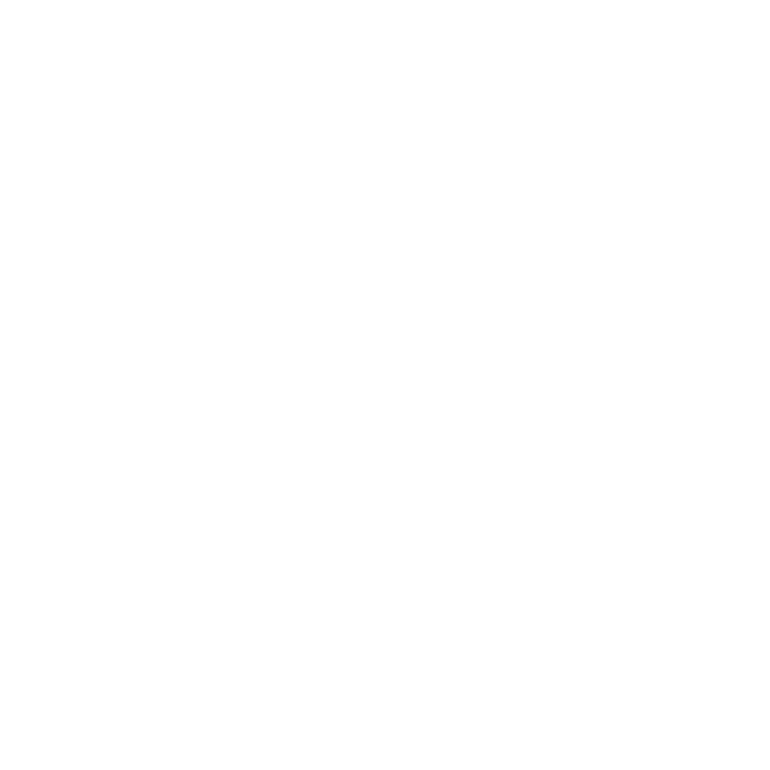

<IPython.core.display.Javascript object>


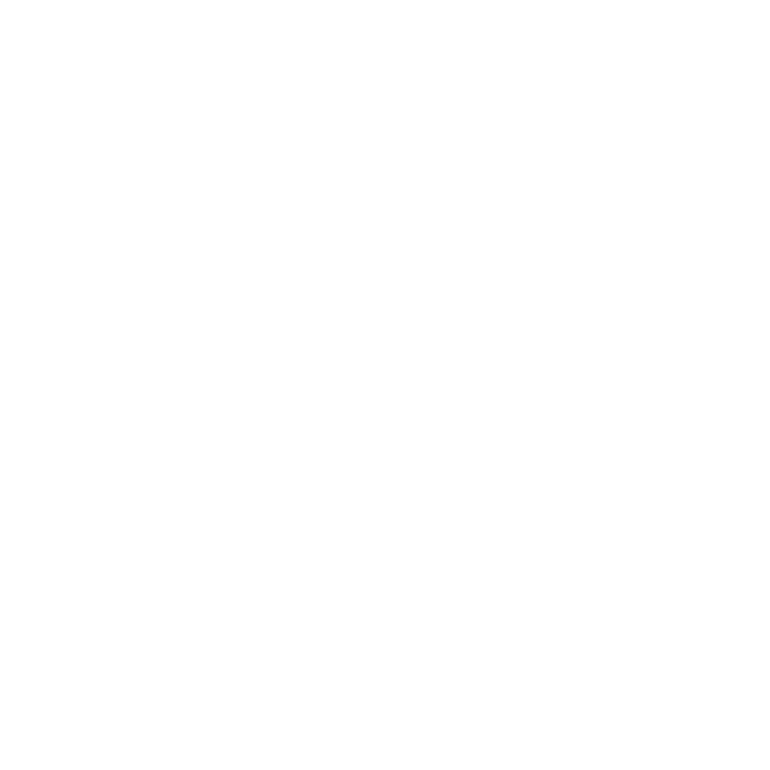

<IPython.core.display.Javascript object>


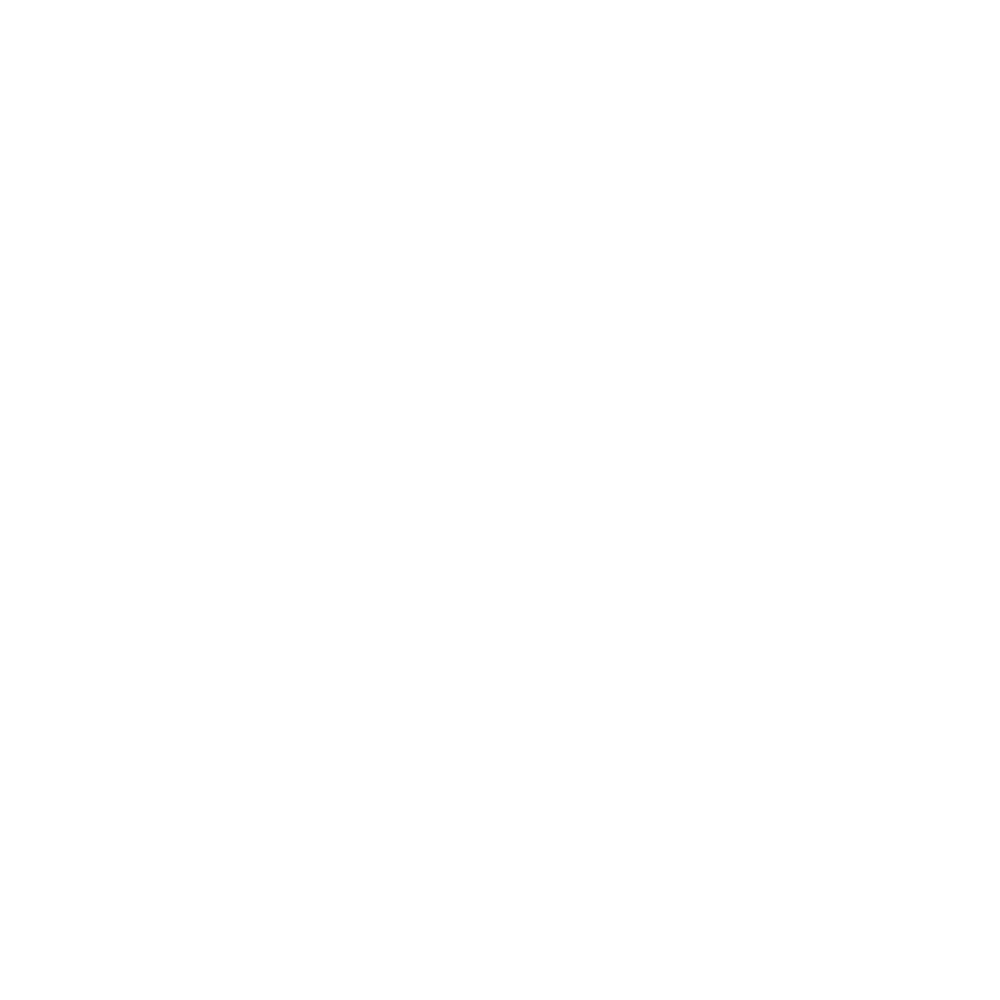

<IPython.core.display.Javascript object>


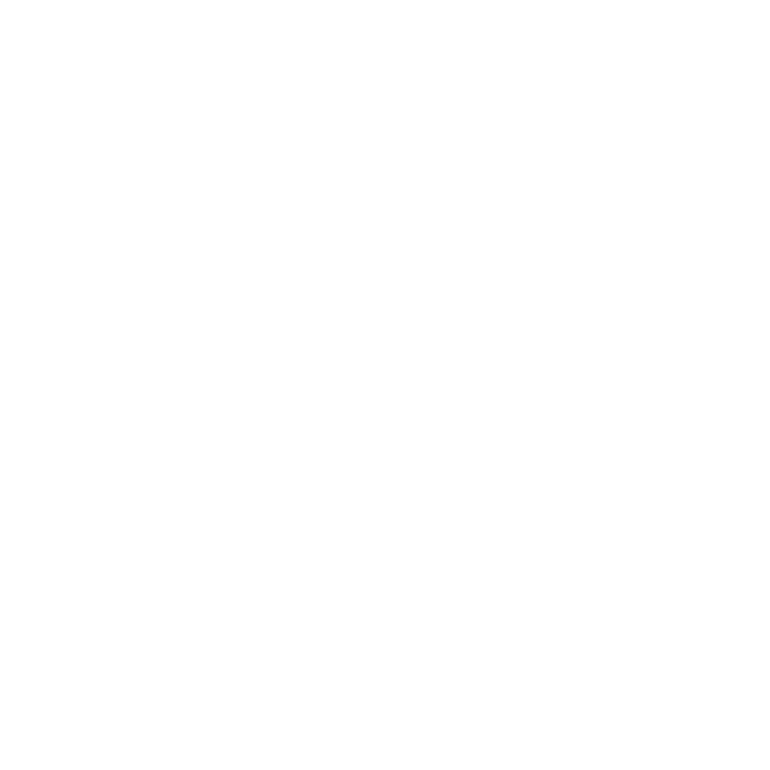

<IPython.core.display.Javascript object>


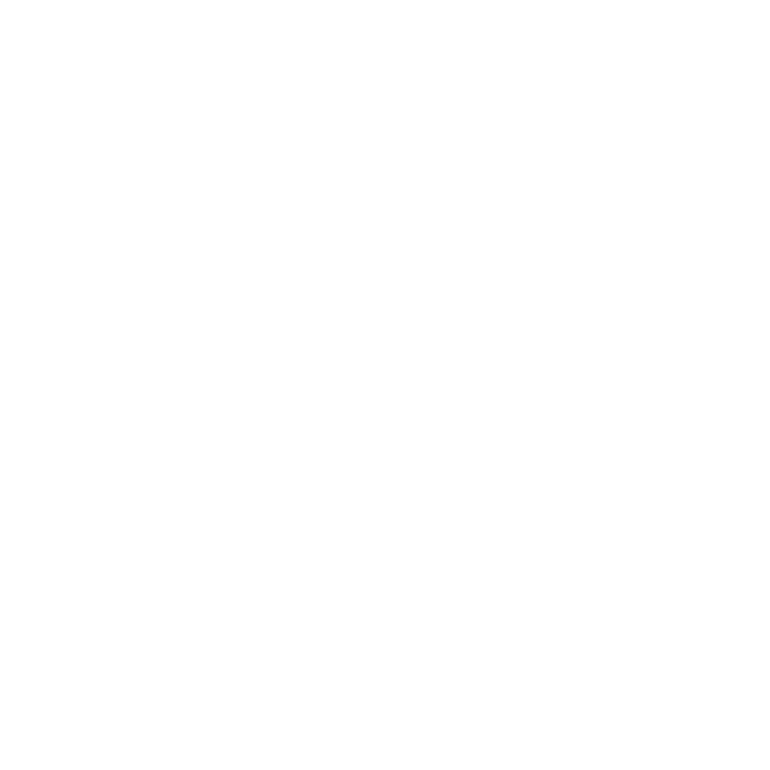

<IPython.core.display.Javascript object>


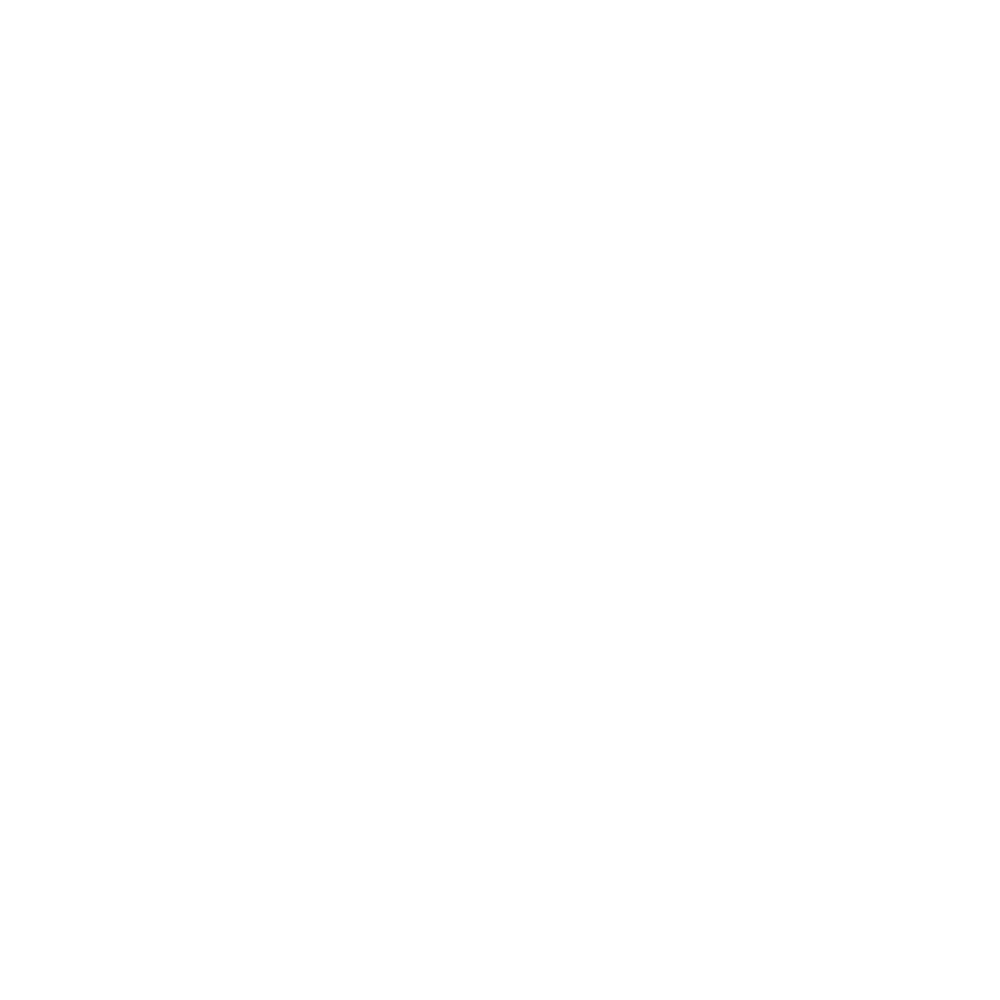

<IPython.core.display.Javascript object>


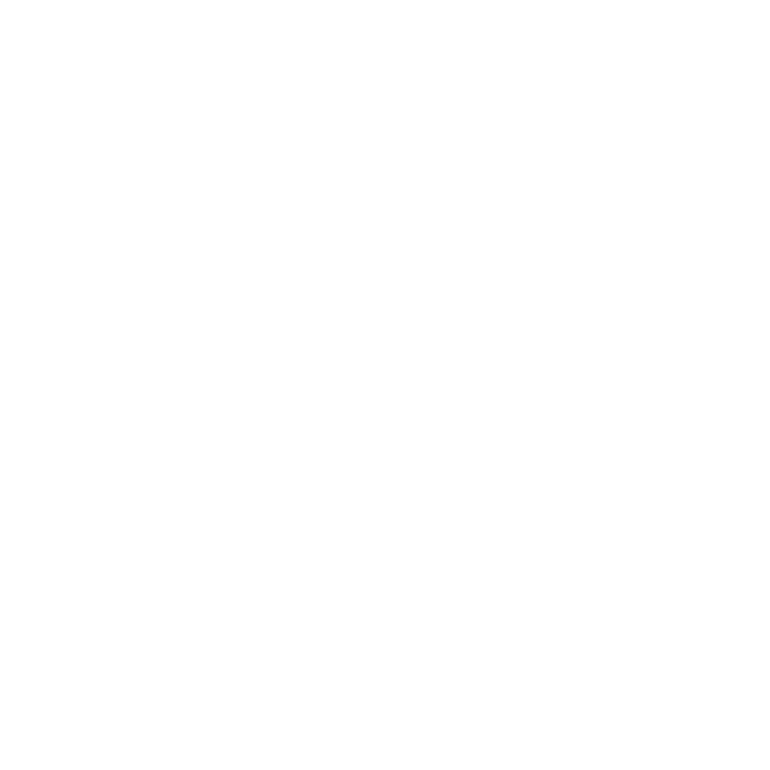

<IPython.core.display.Javascript object>


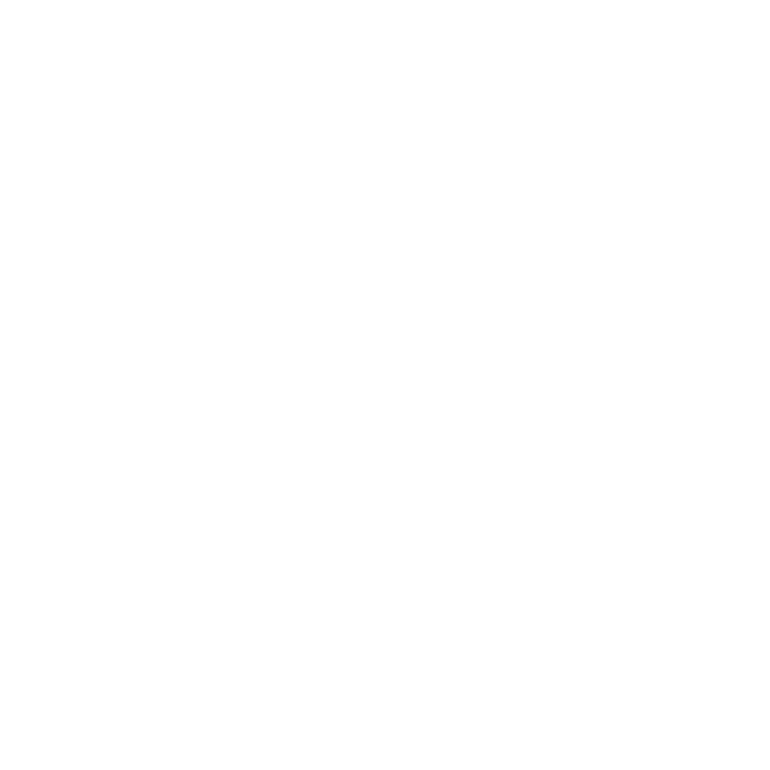

<IPython.core.display.Javascript object>


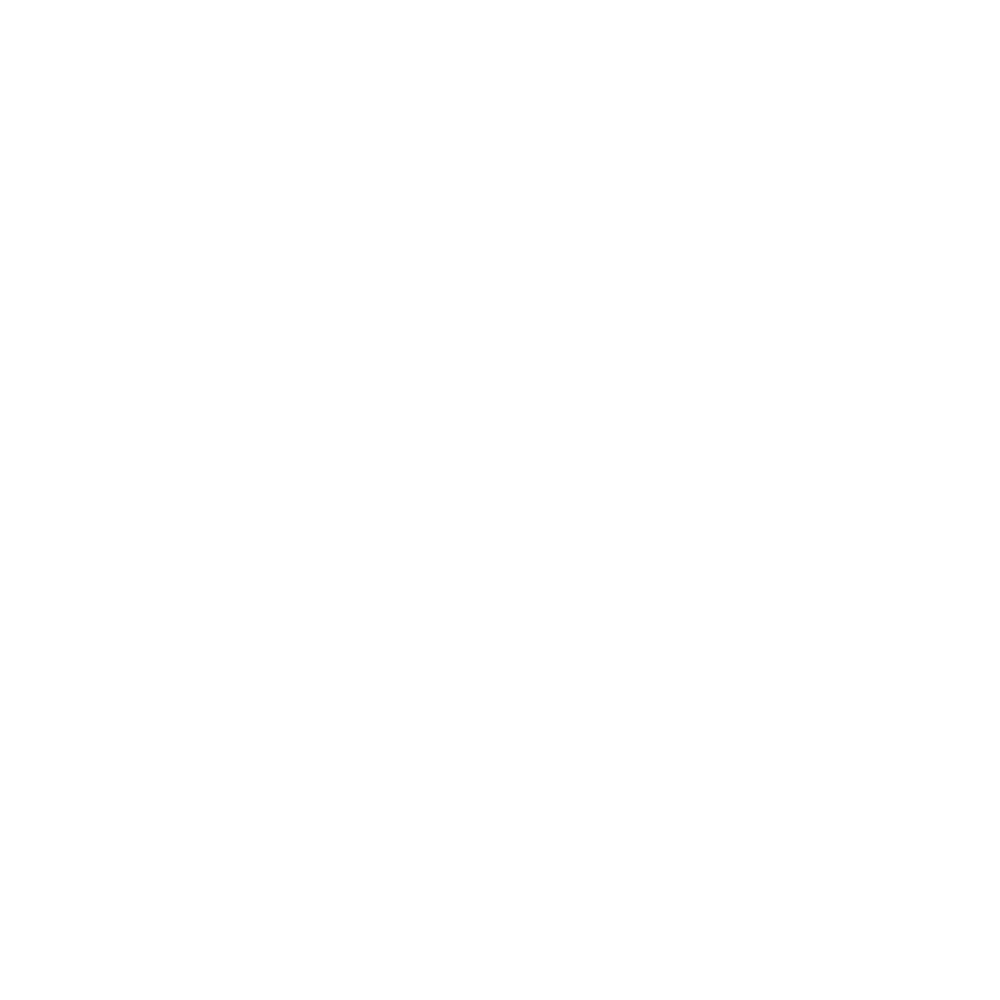

<IPython.core.display.Javascript object>


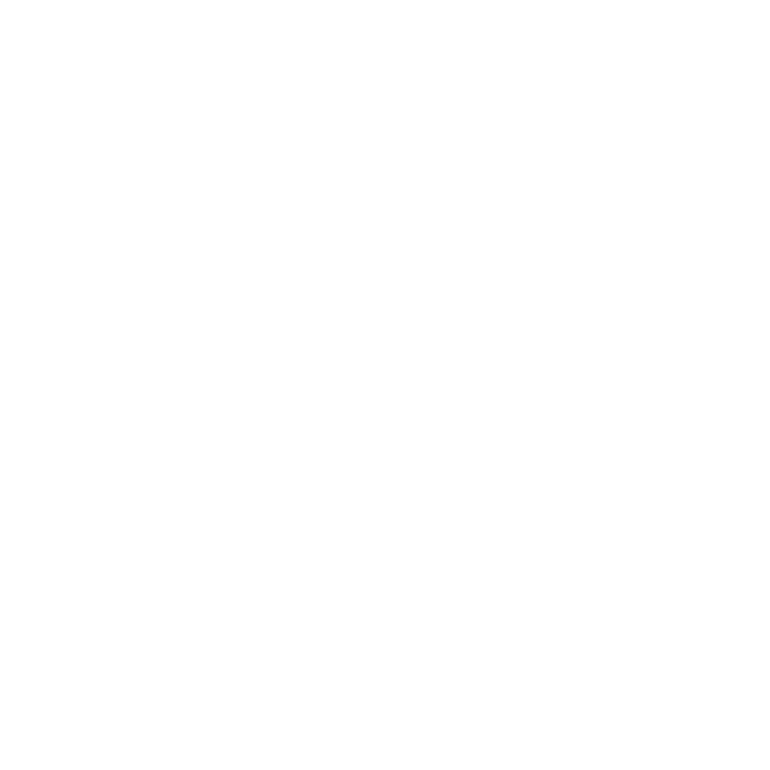

<IPython.core.display.Javascript object>


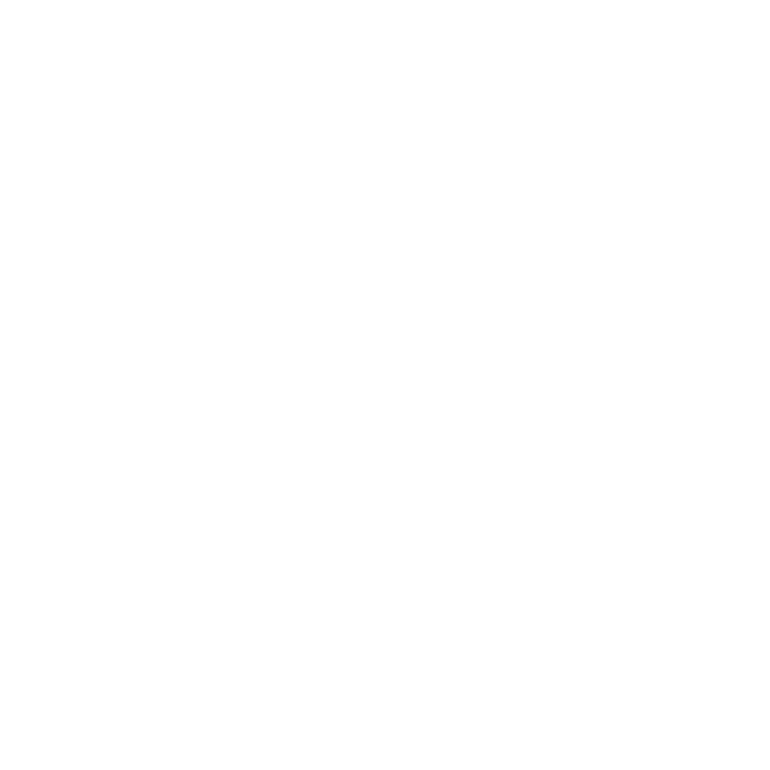

<IPython.core.display.Javascript object>


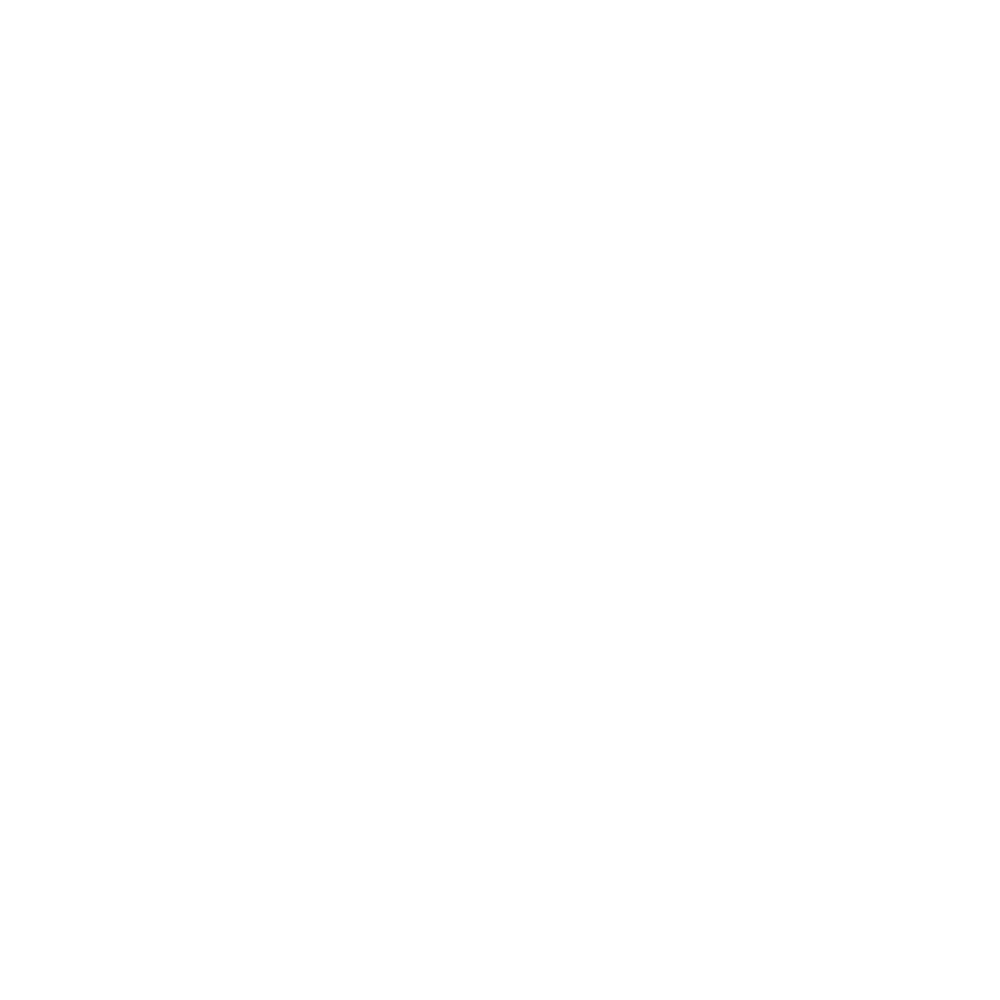

<IPython.core.display.Javascript object>


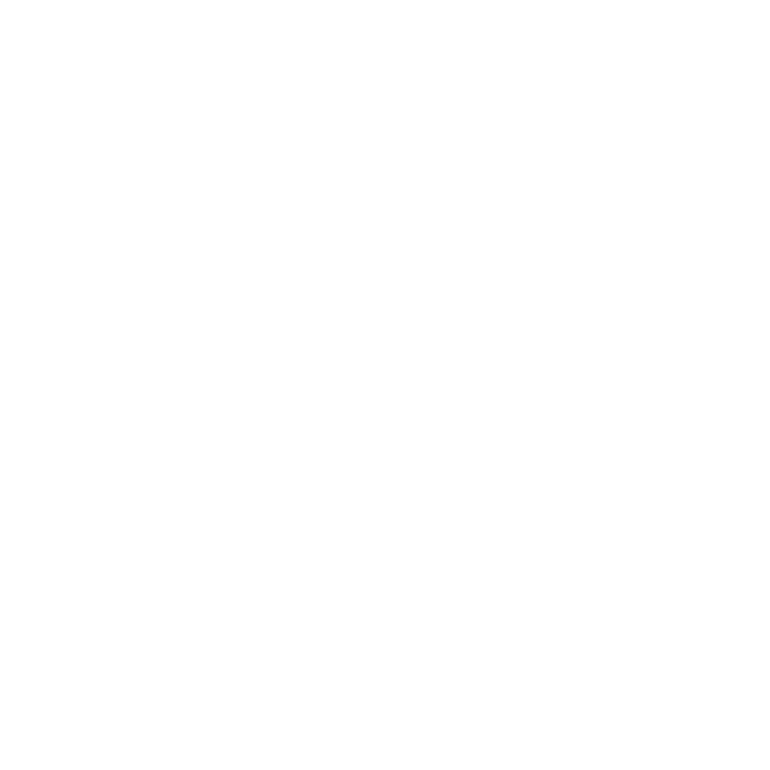

<IPython.core.display.Javascript object>


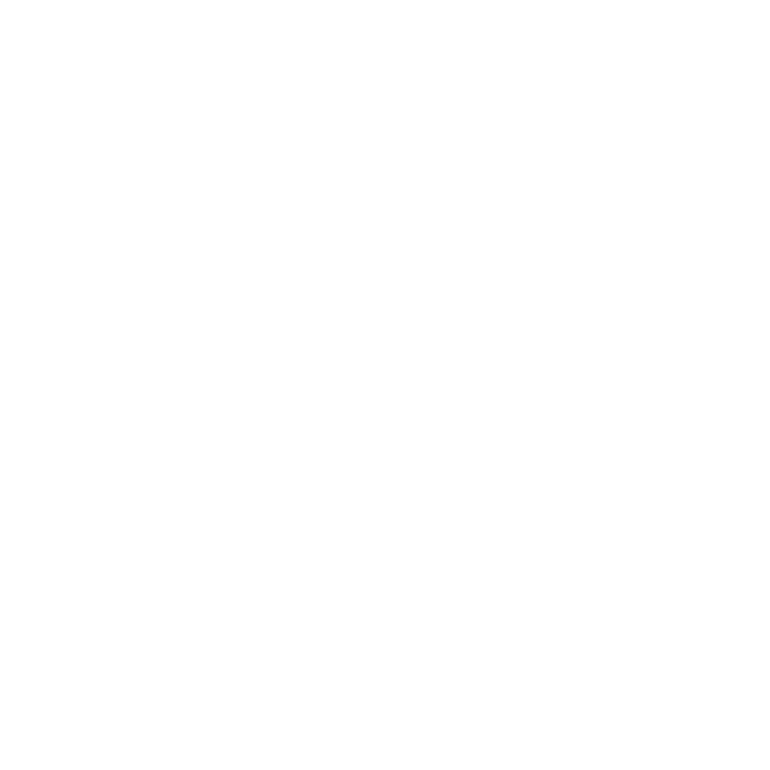

<IPython.core.display.Javascript object>


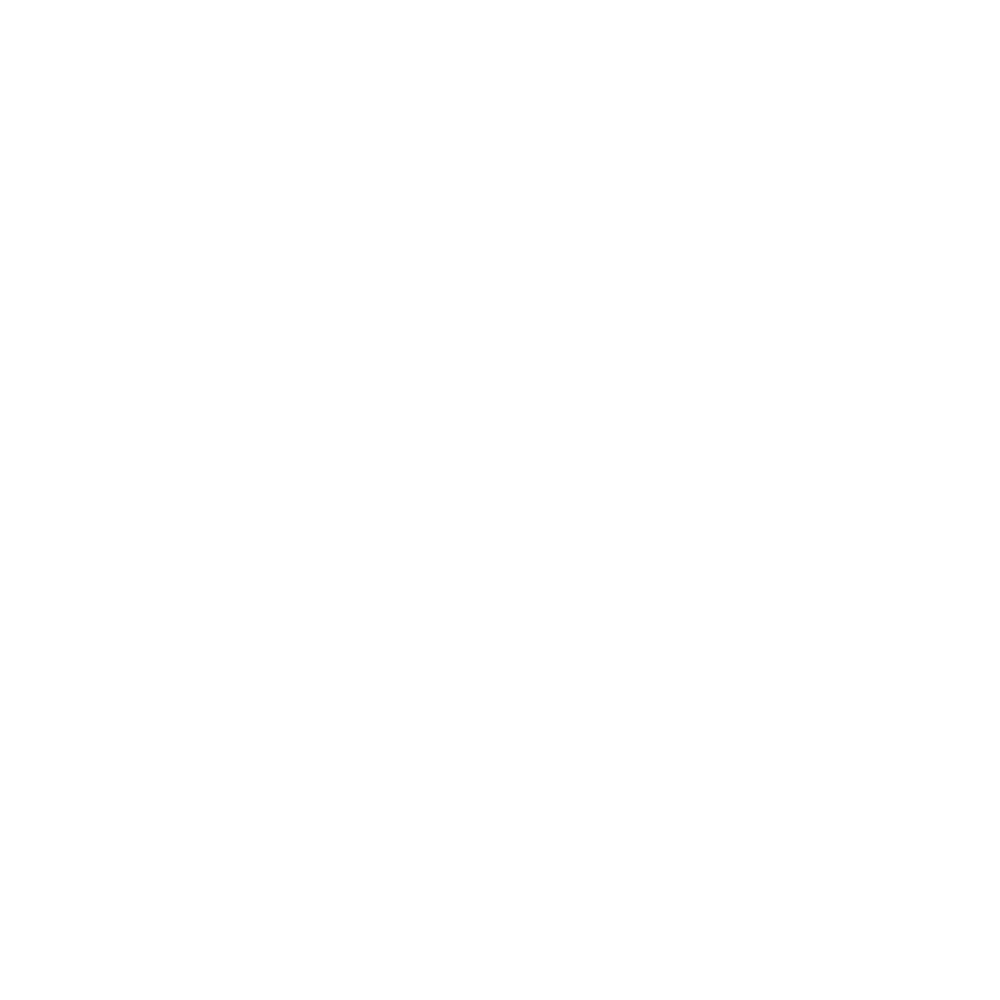

<IPython.core.display.Javascript object>


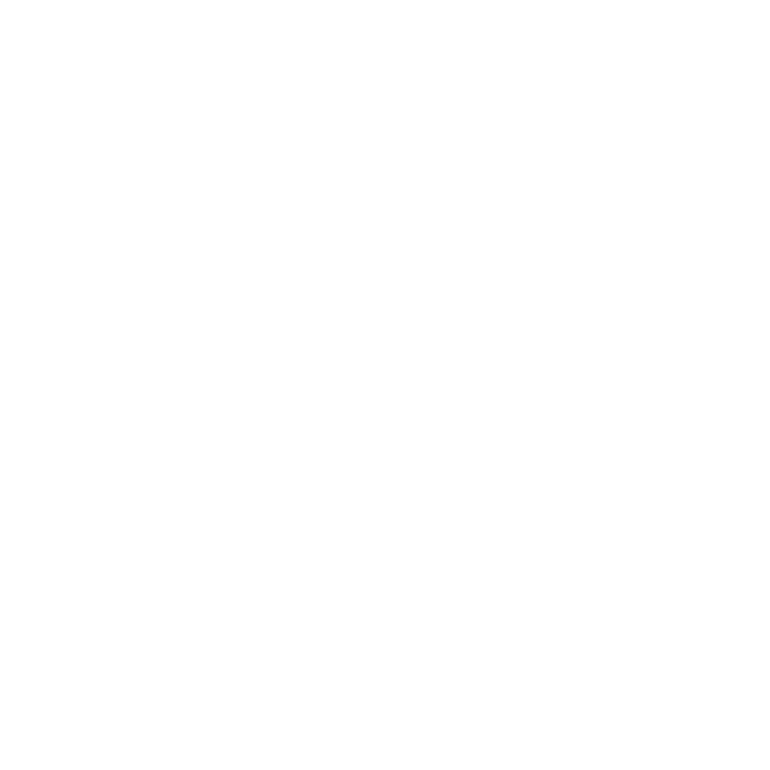

<IPython.core.display.Javascript object>


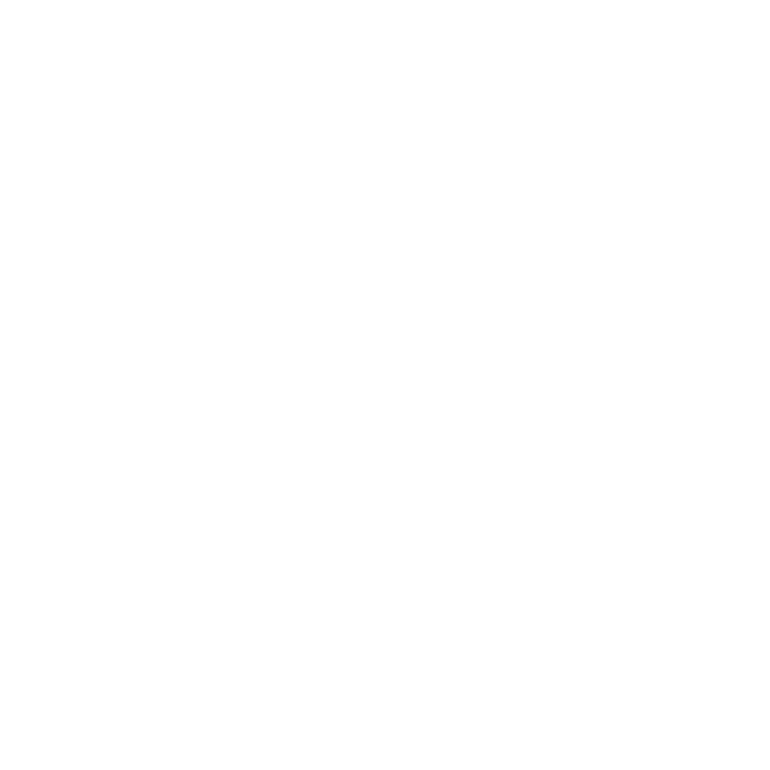

<IPython.core.display.Javascript object>


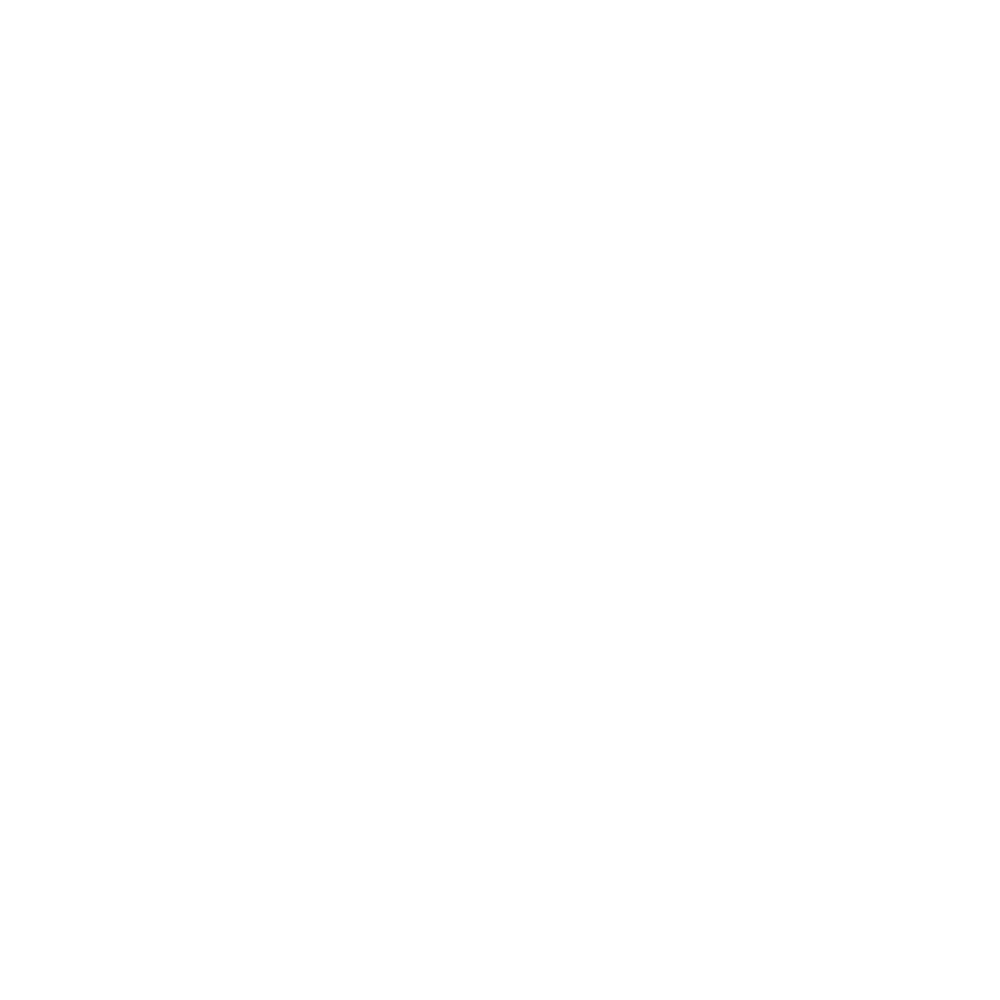

In [89]:
Monther = "Jan"
# setup stuff
PolyList = gpdJanDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdJanDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdJanDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdJanDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdJanDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdJanDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdJanDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


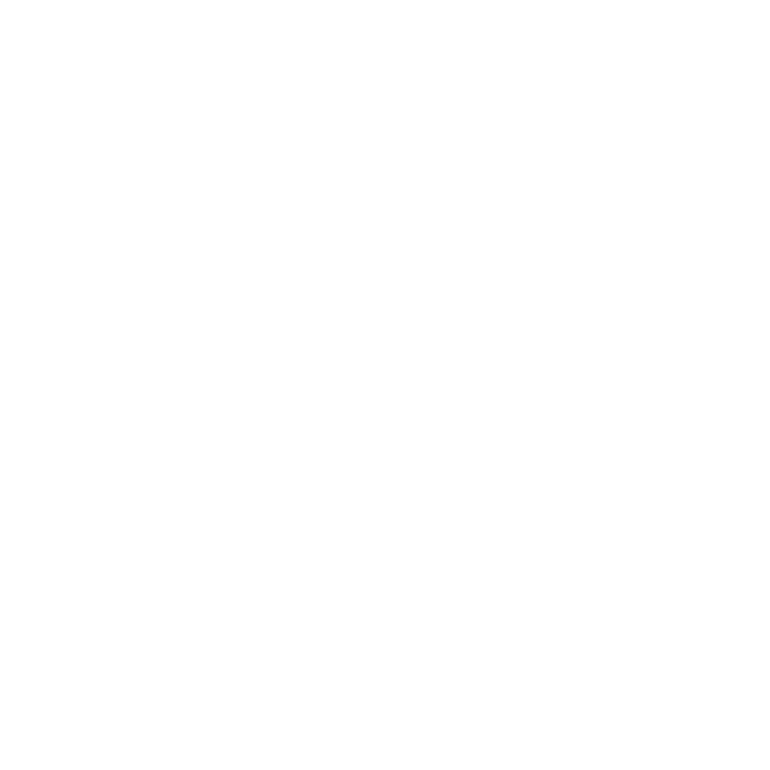

<IPython.core.display.Javascript object>


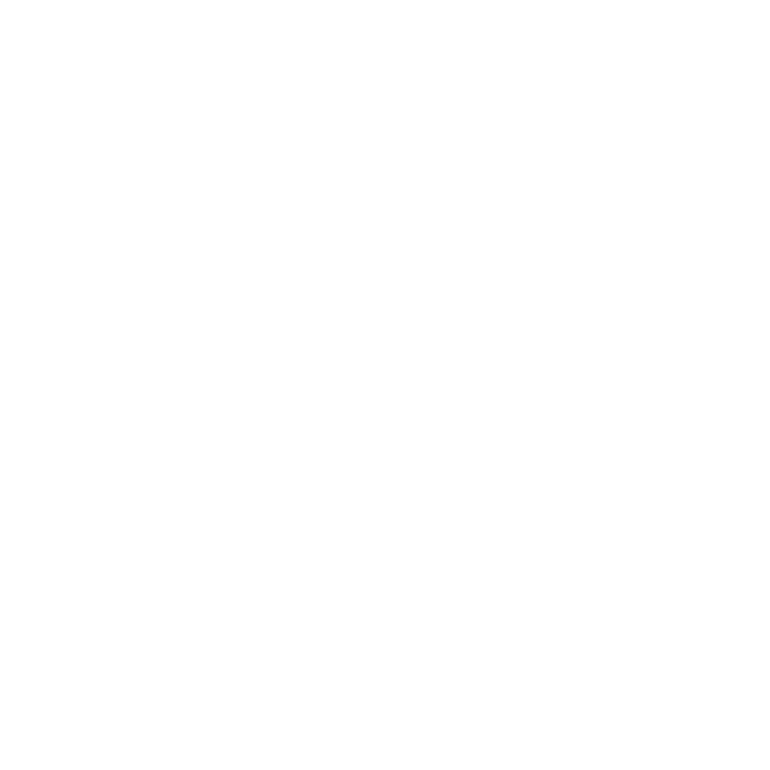

<IPython.core.display.Javascript object>


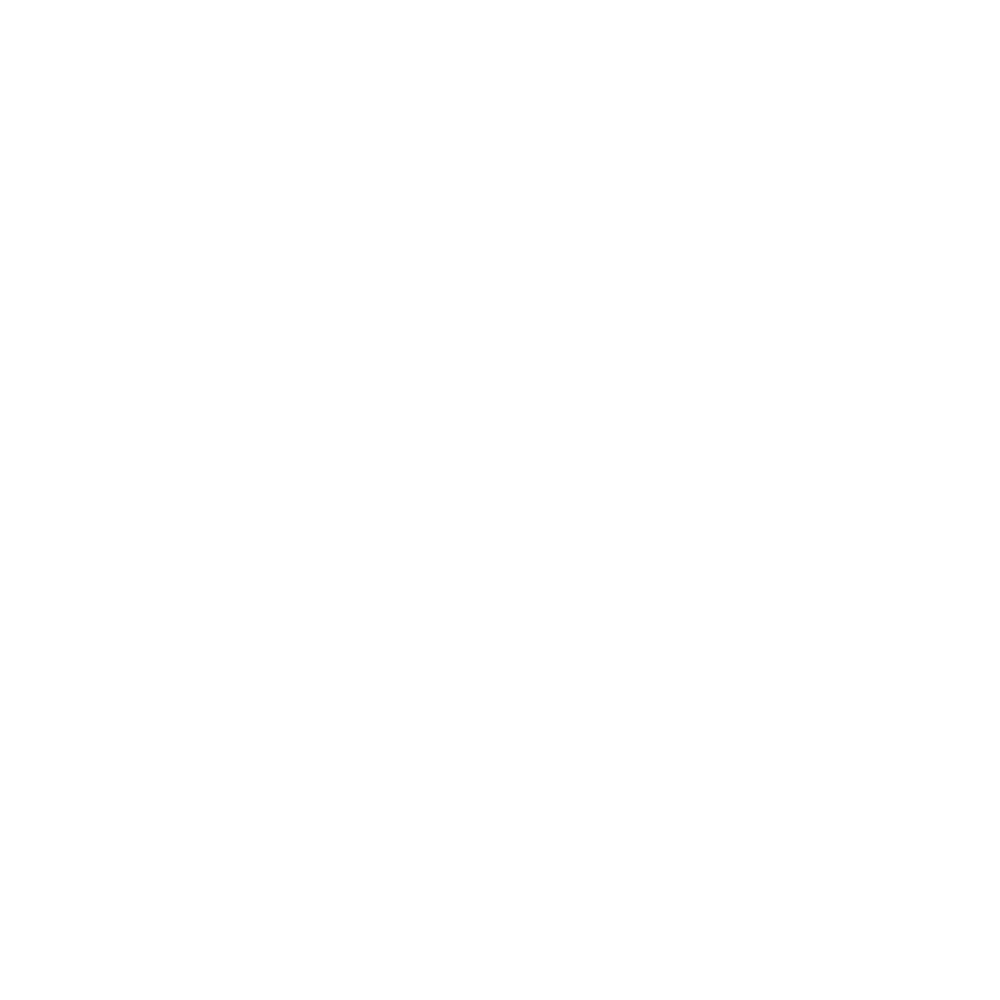

<IPython.core.display.Javascript object>


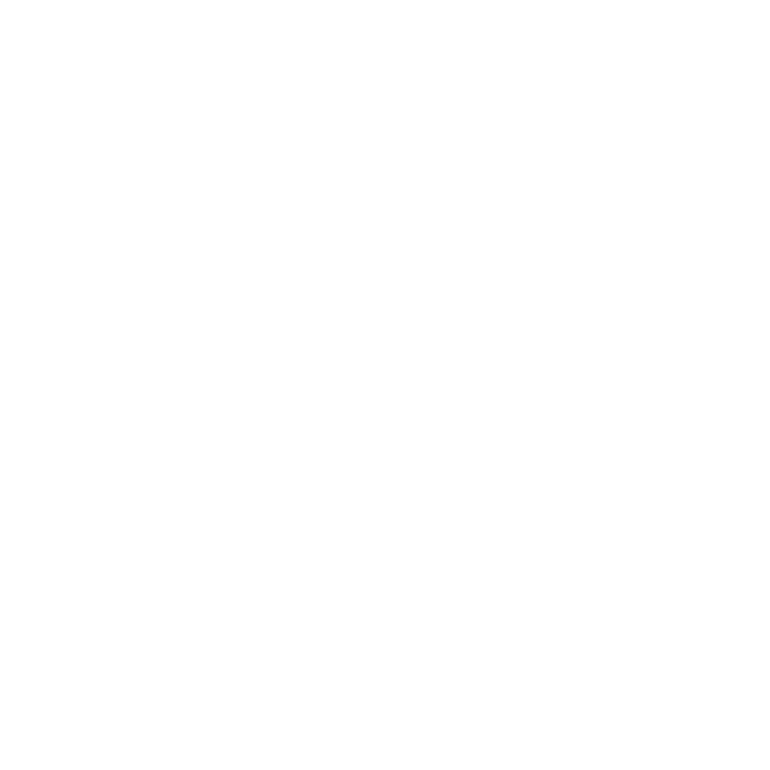

<IPython.core.display.Javascript object>


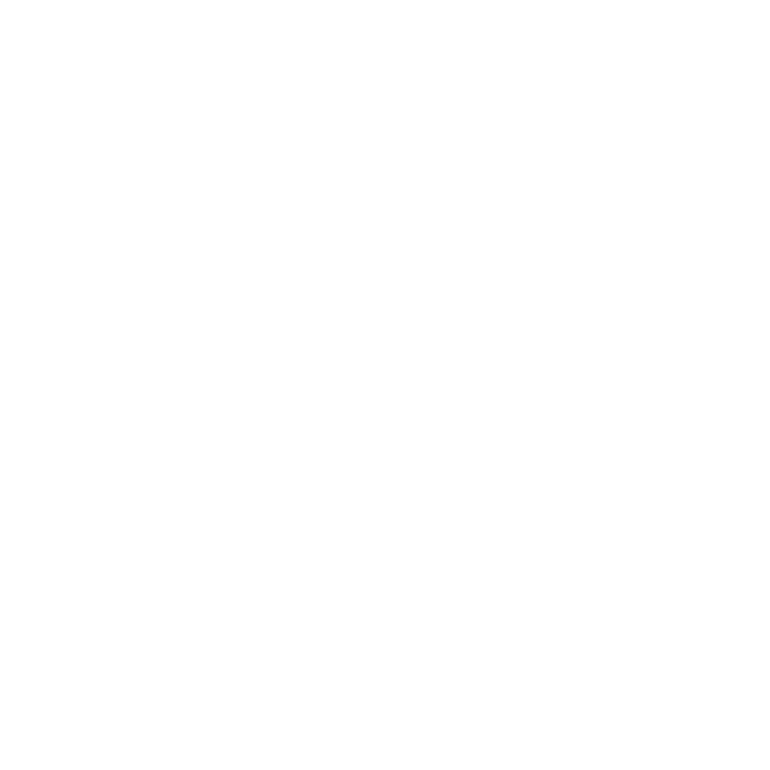

<IPython.core.display.Javascript object>


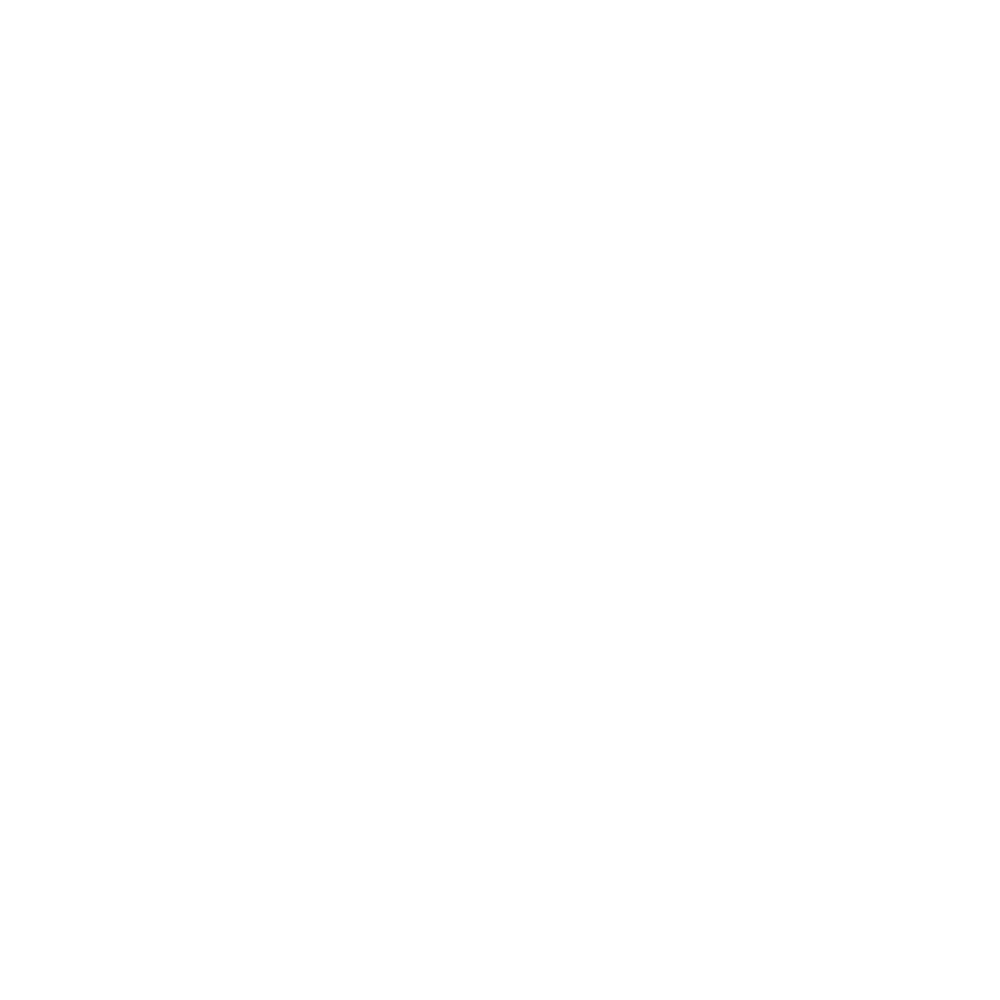

<IPython.core.display.Javascript object>


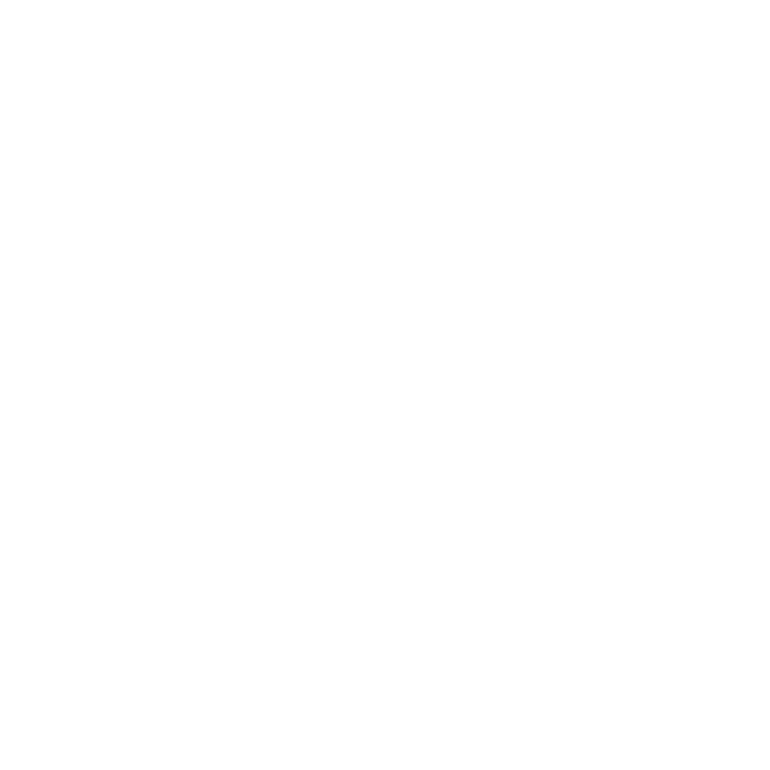

<IPython.core.display.Javascript object>


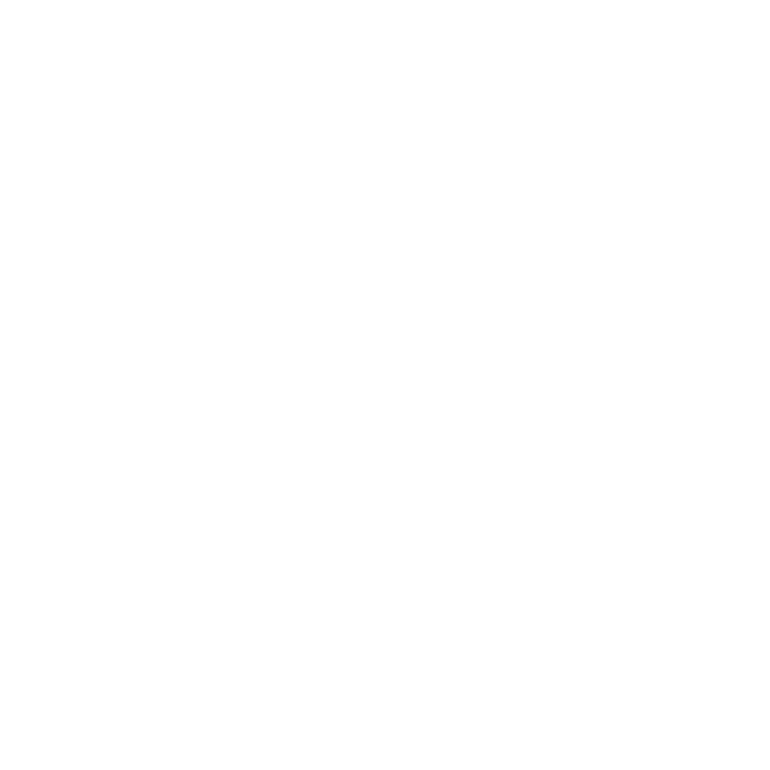

<IPython.core.display.Javascript object>


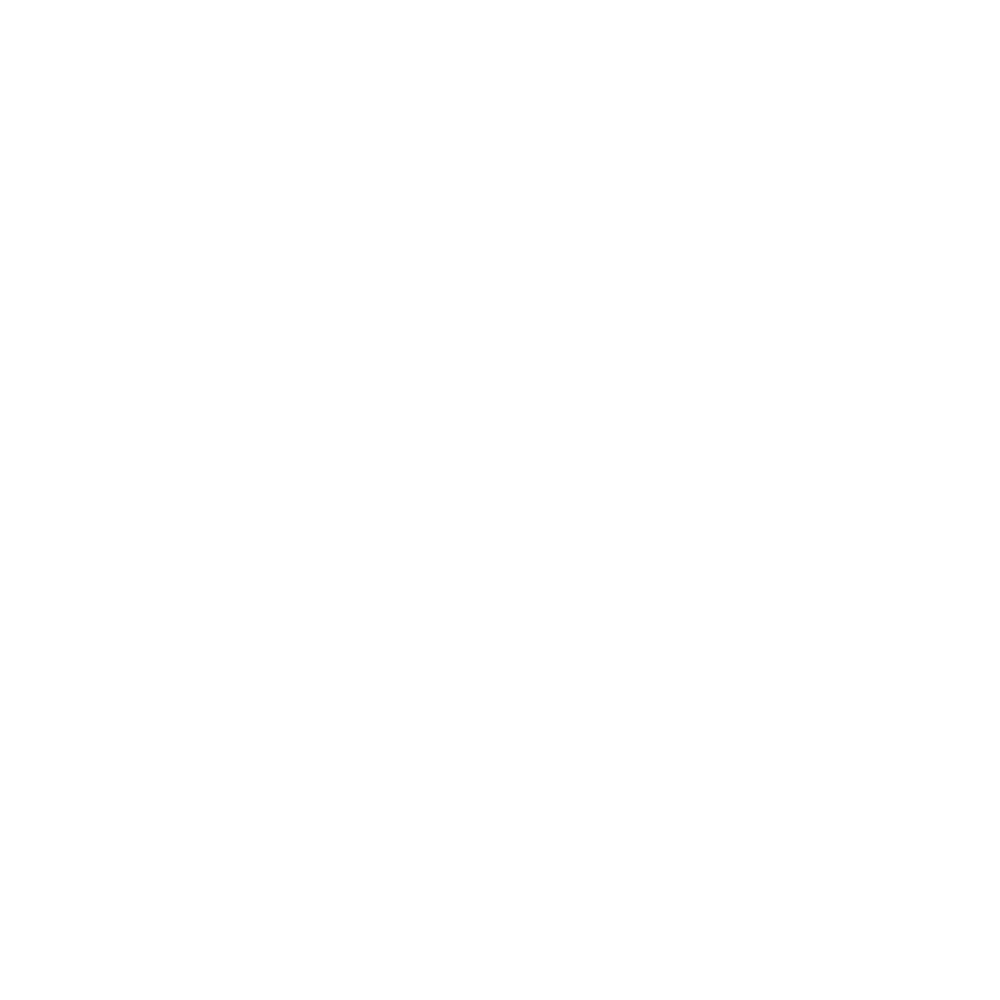

<IPython.core.display.Javascript object>


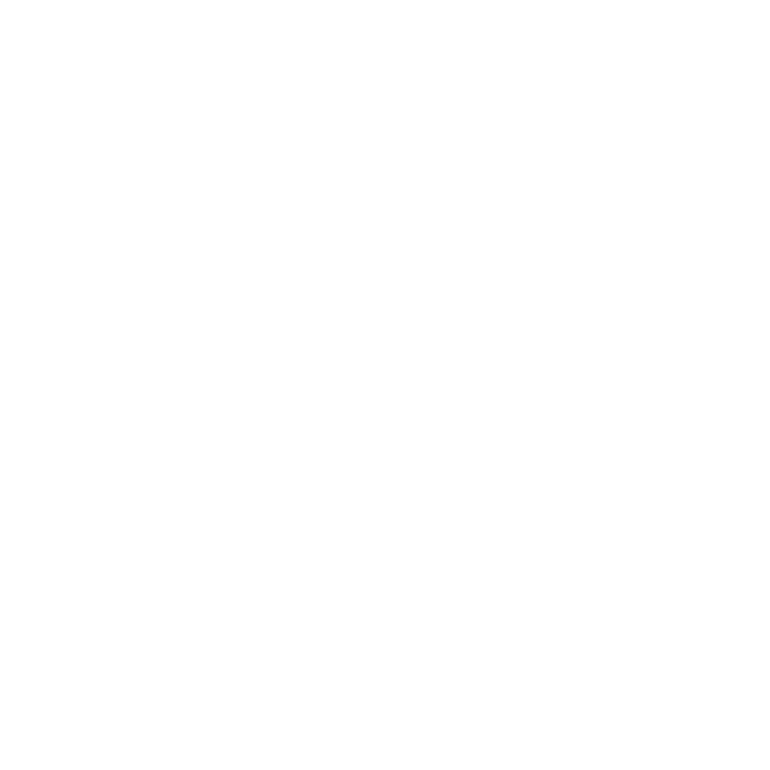

<IPython.core.display.Javascript object>


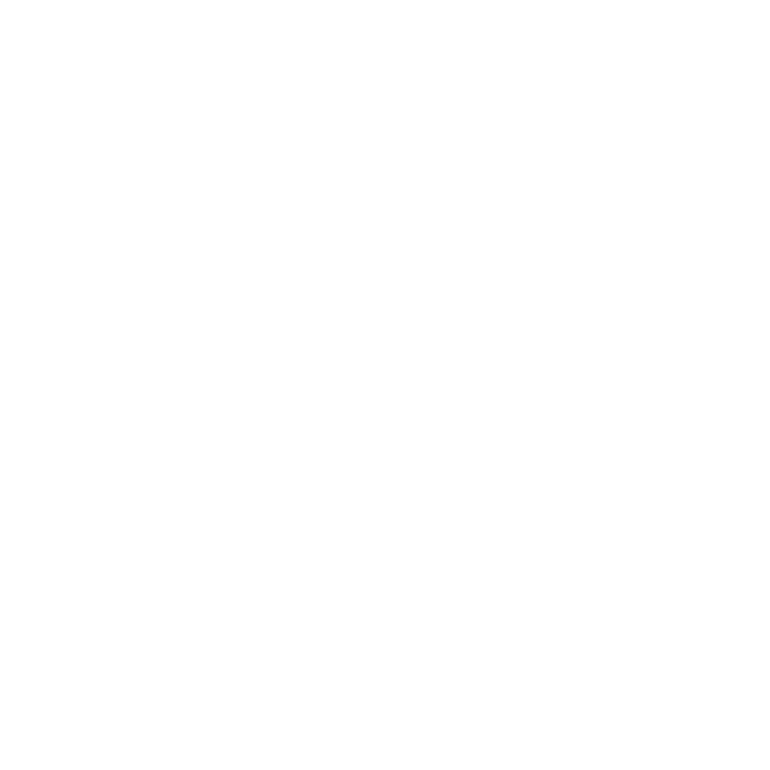

<IPython.core.display.Javascript object>


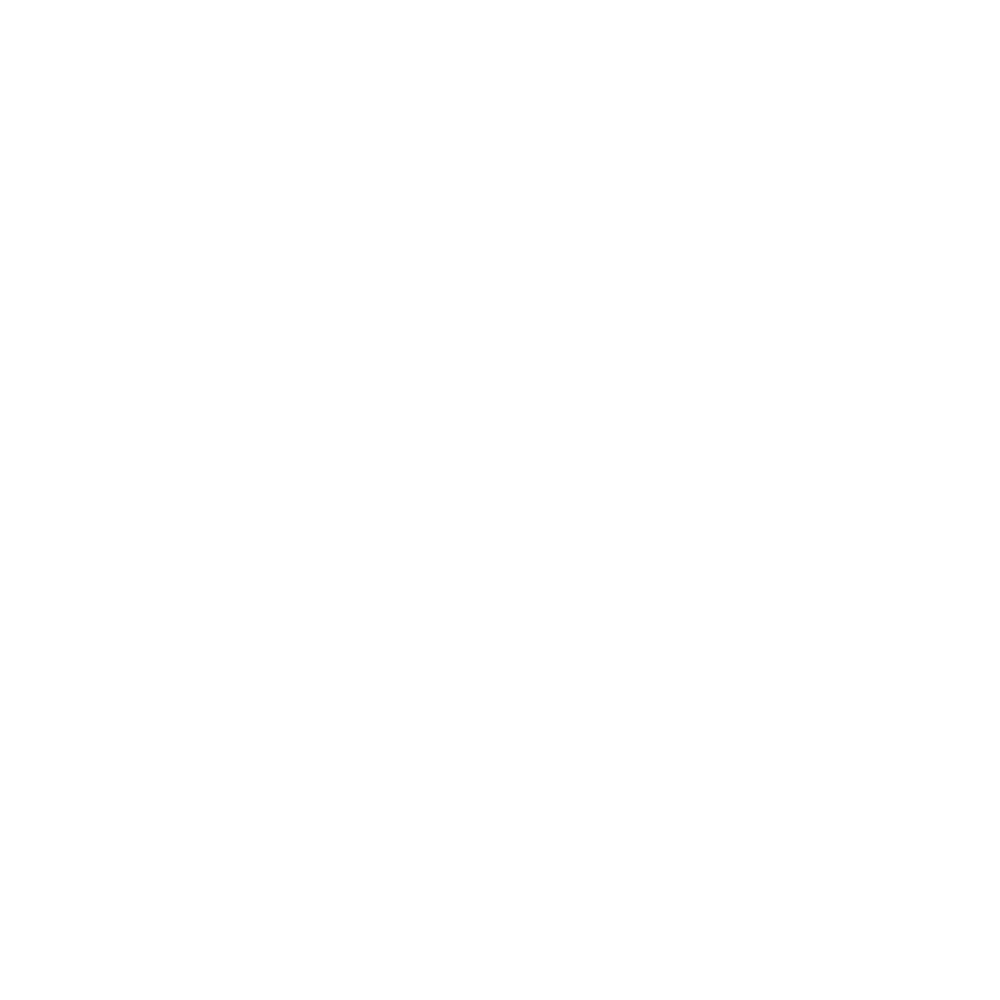

<IPython.core.display.Javascript object>


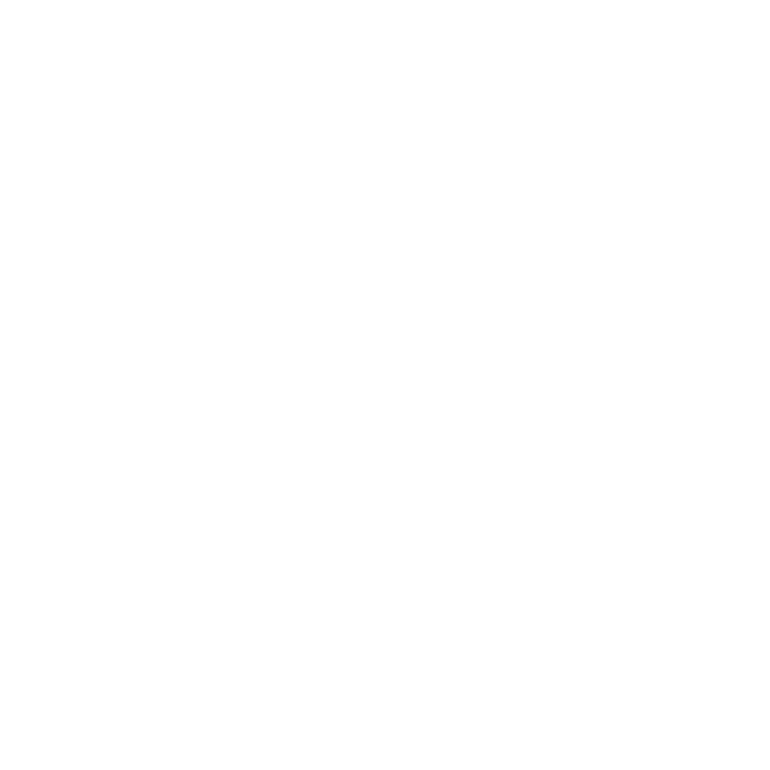

<IPython.core.display.Javascript object>


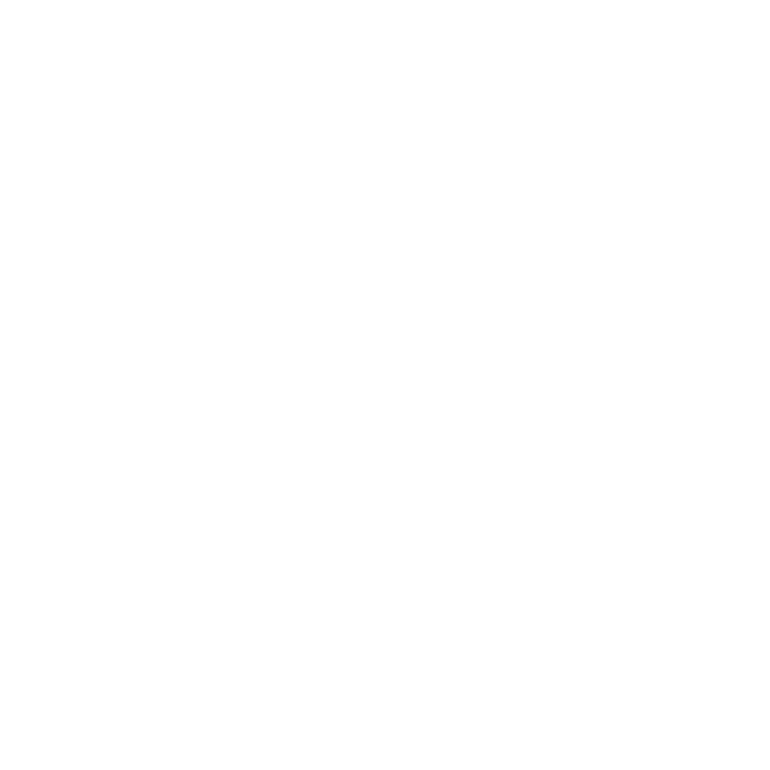

<IPython.core.display.Javascript object>


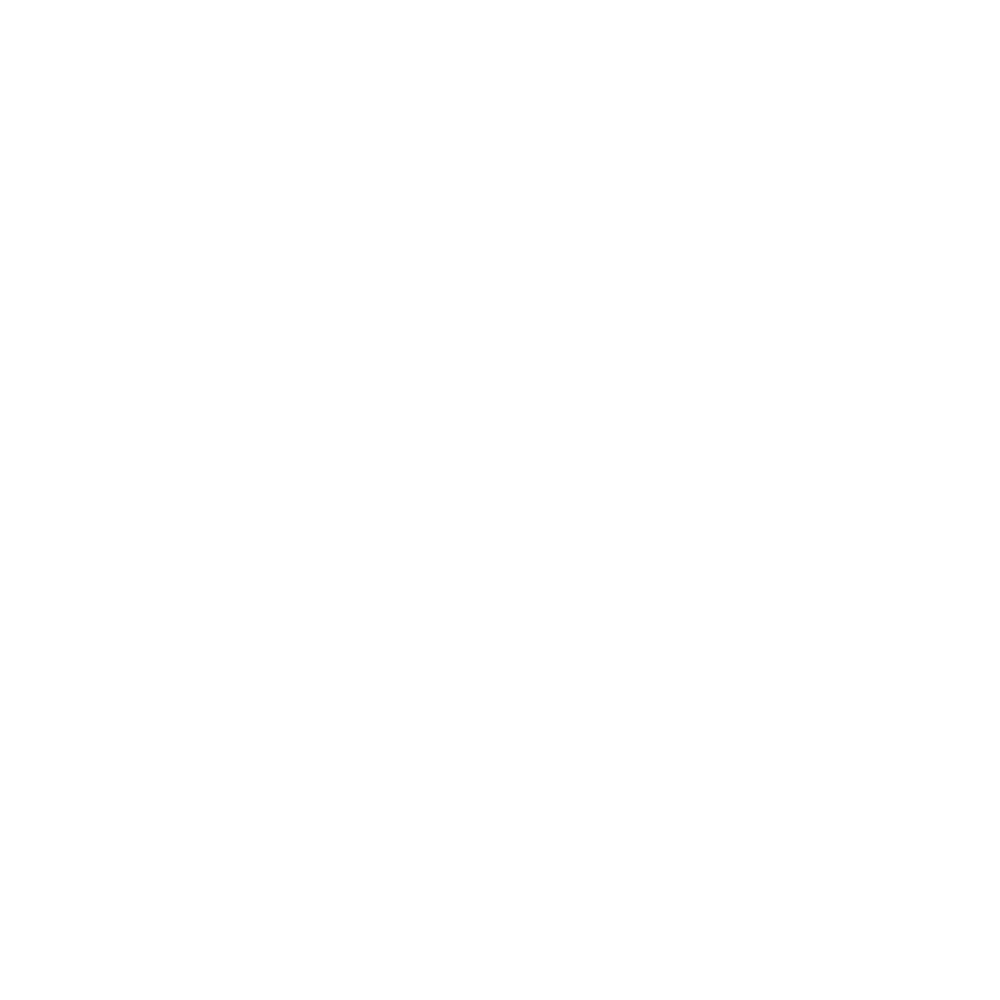

<IPython.core.display.Javascript object>


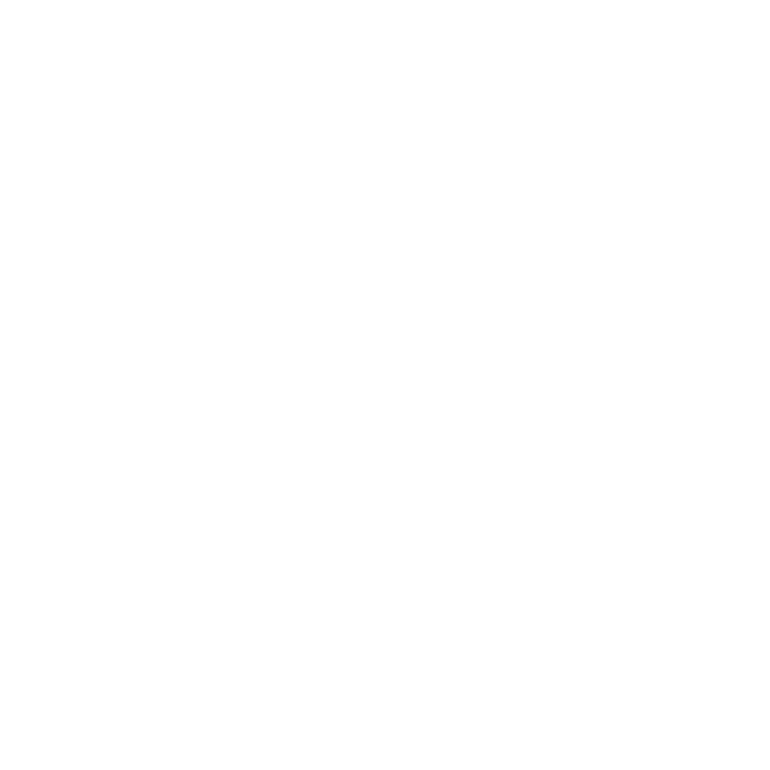

<IPython.core.display.Javascript object>


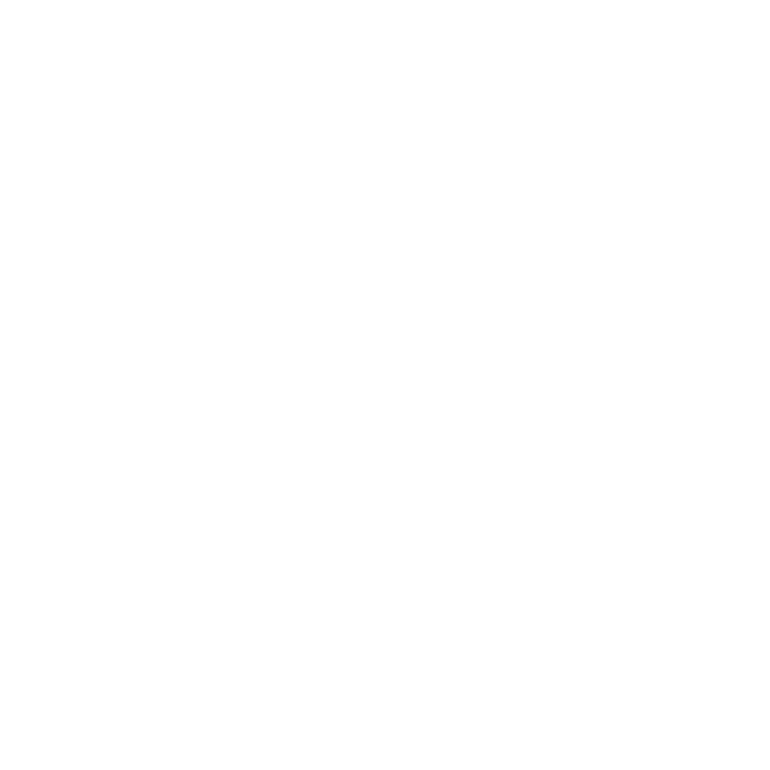

<IPython.core.display.Javascript object>


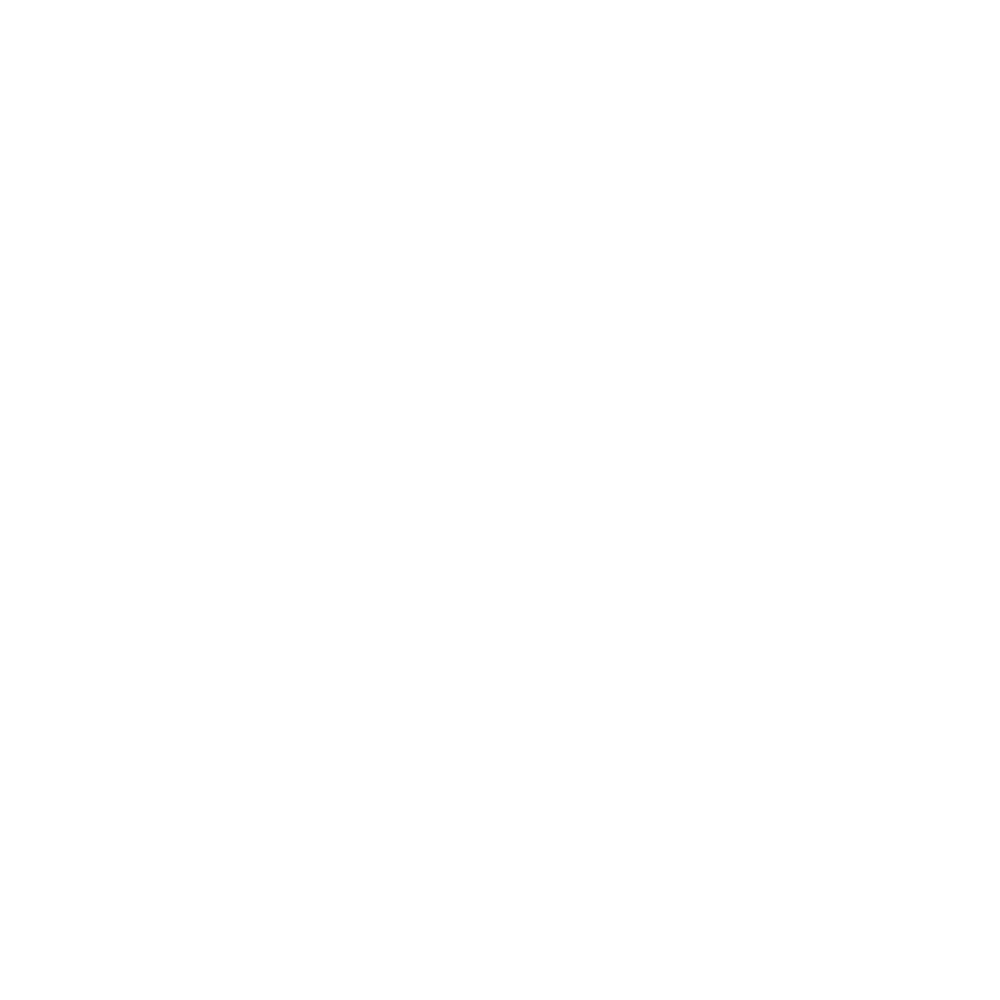

In [91]:
Monther = "Feb"
# setup stuff
PolyList = gpdFebDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdFebDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdFebDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdFebDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdFebDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdFebDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdFebDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


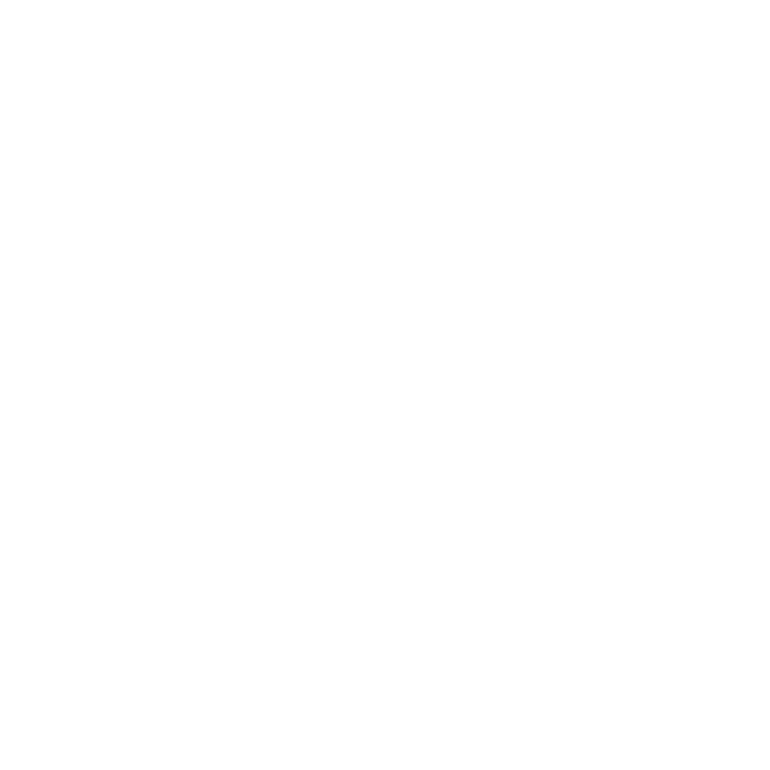

<IPython.core.display.Javascript object>


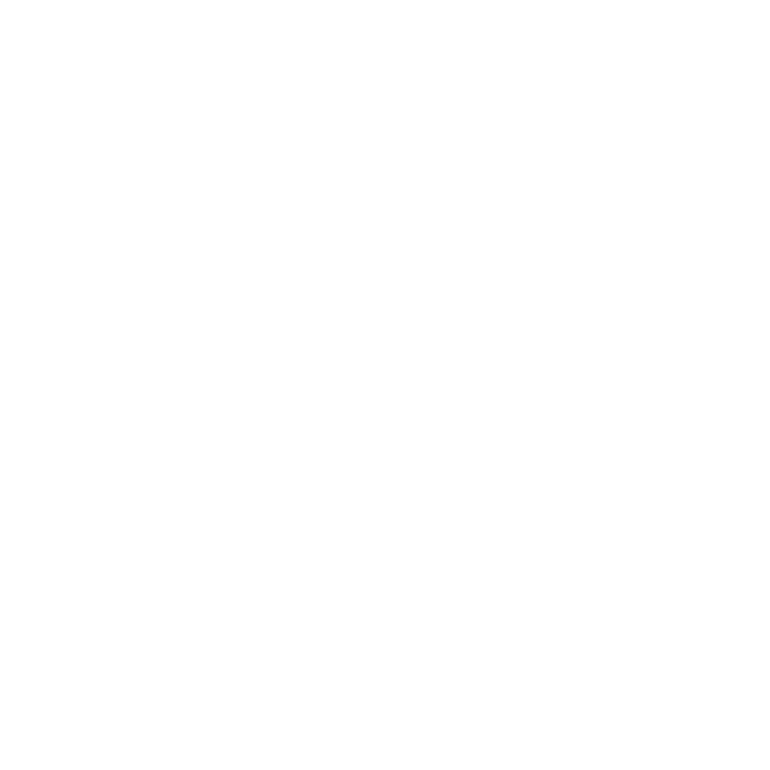

<IPython.core.display.Javascript object>


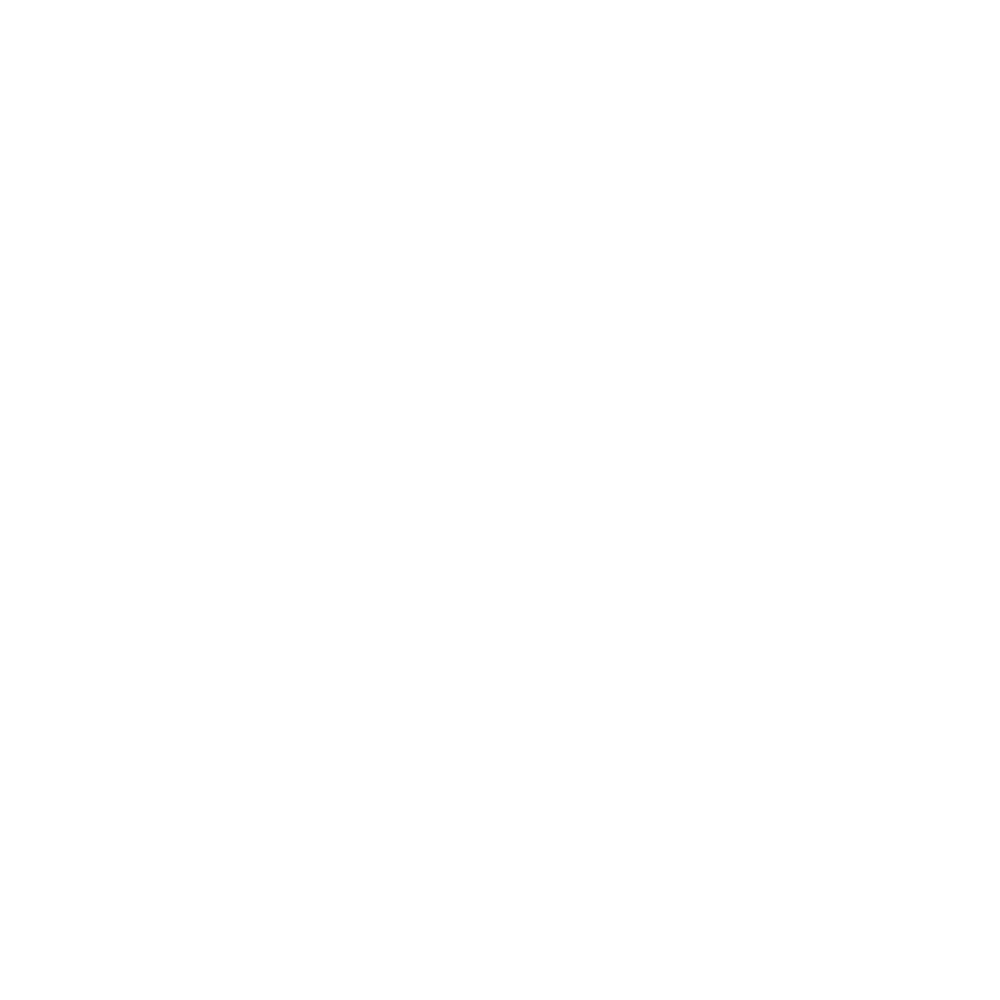

<IPython.core.display.Javascript object>


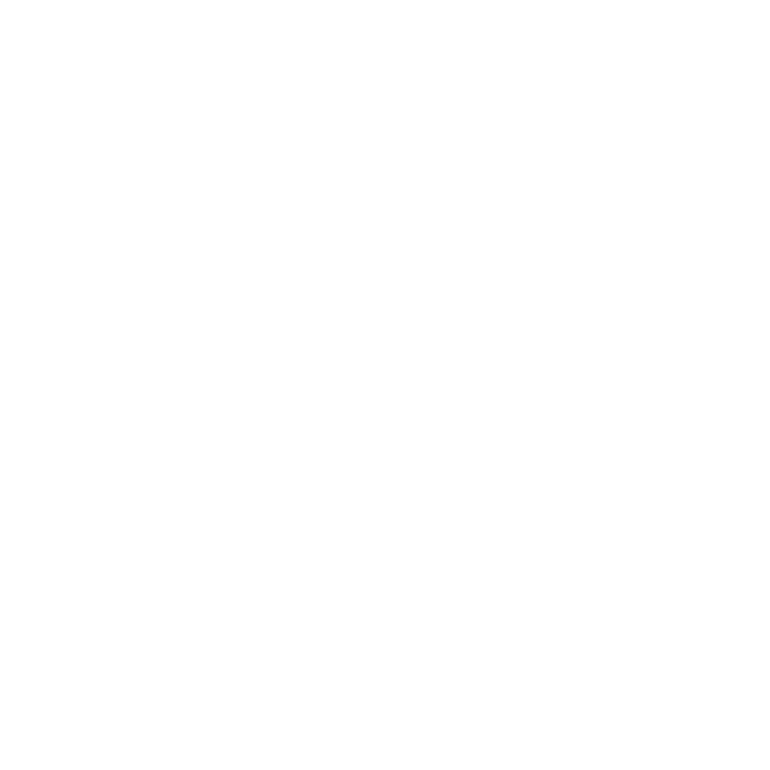

<IPython.core.display.Javascript object>


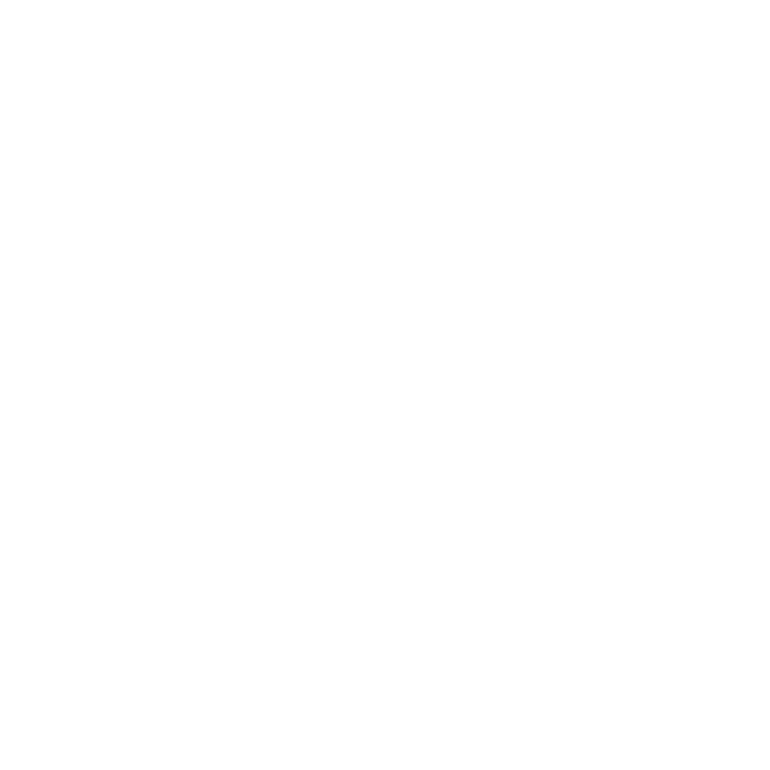

<IPython.core.display.Javascript object>


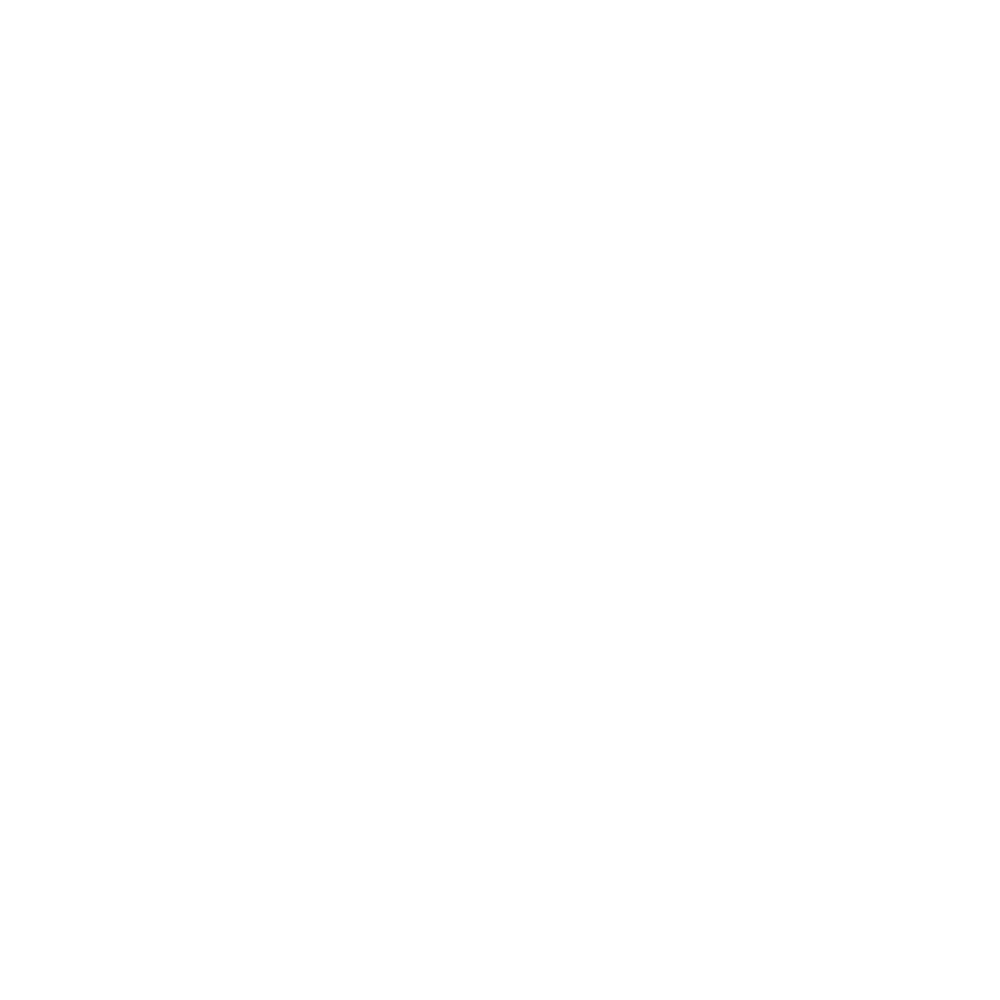

<IPython.core.display.Javascript object>


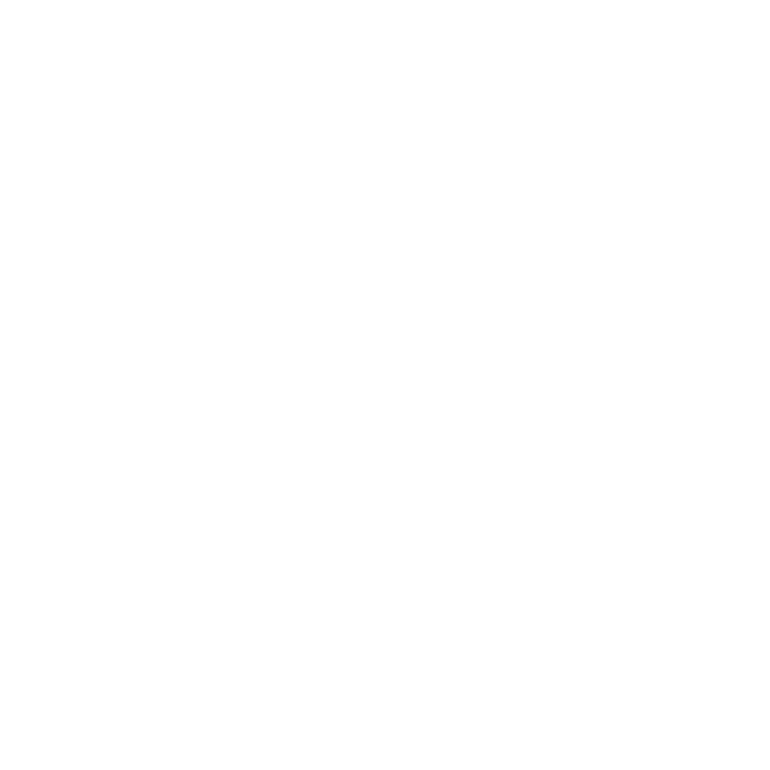

<IPython.core.display.Javascript object>


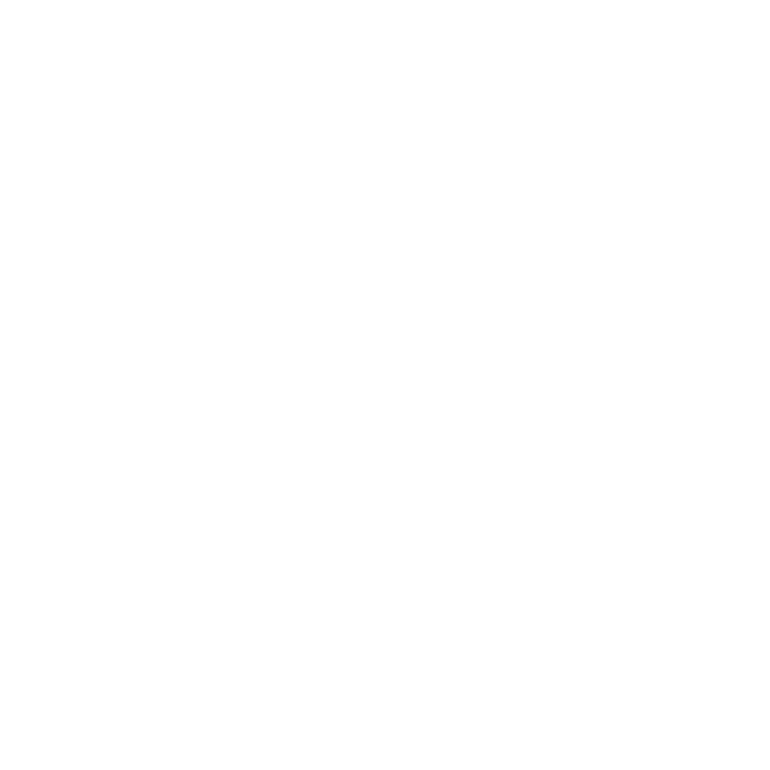

<IPython.core.display.Javascript object>


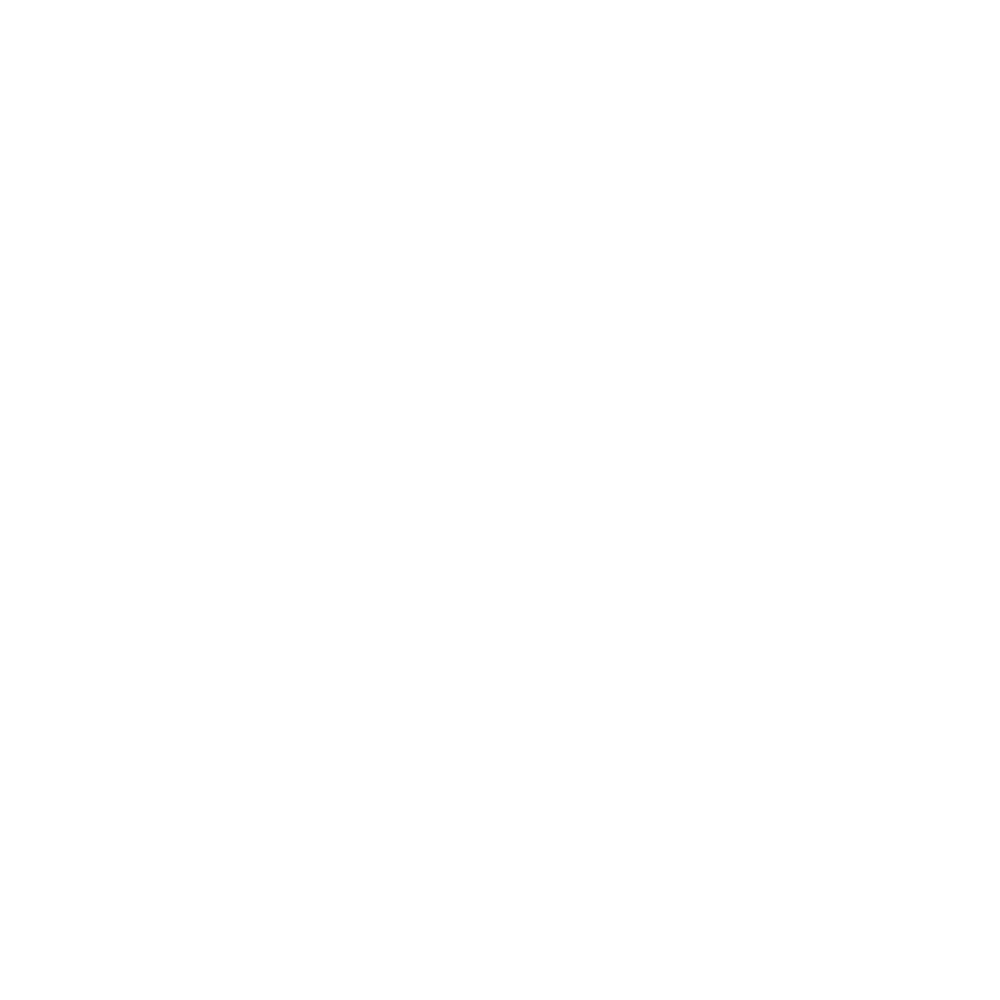

<IPython.core.display.Javascript object>


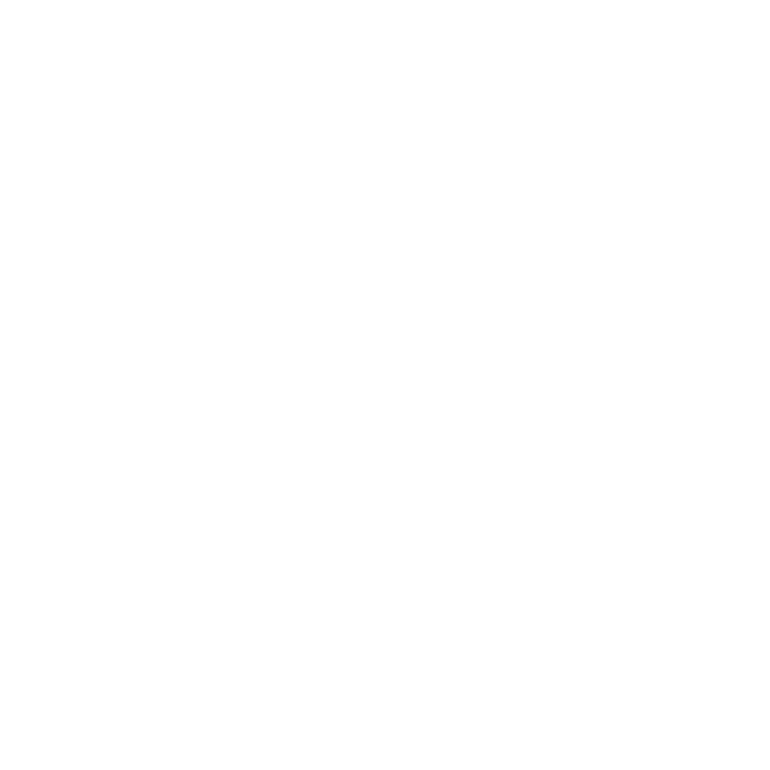

<IPython.core.display.Javascript object>


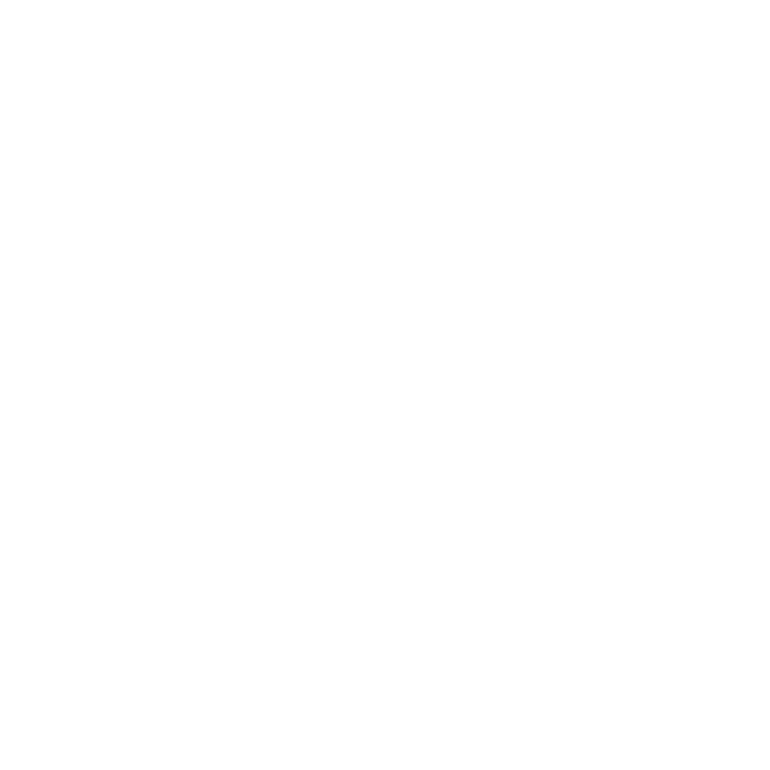

<IPython.core.display.Javascript object>


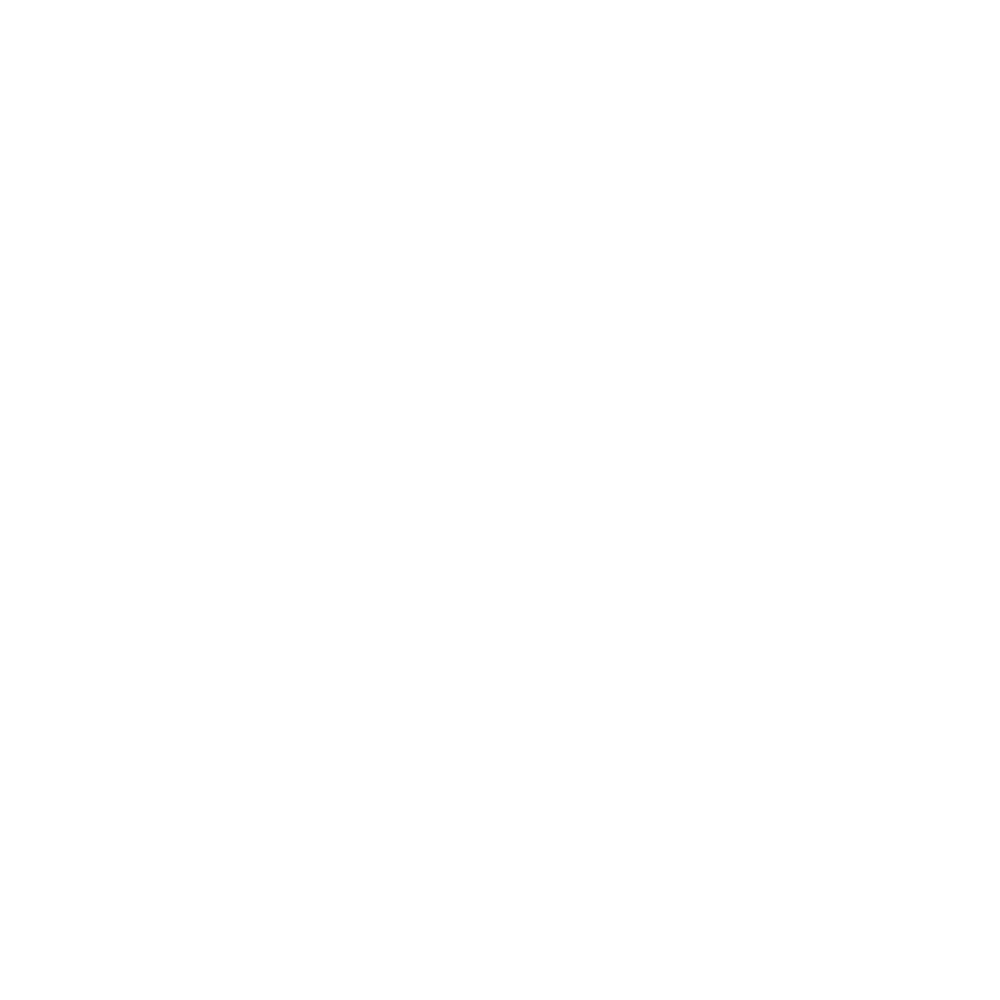

<IPython.core.display.Javascript object>


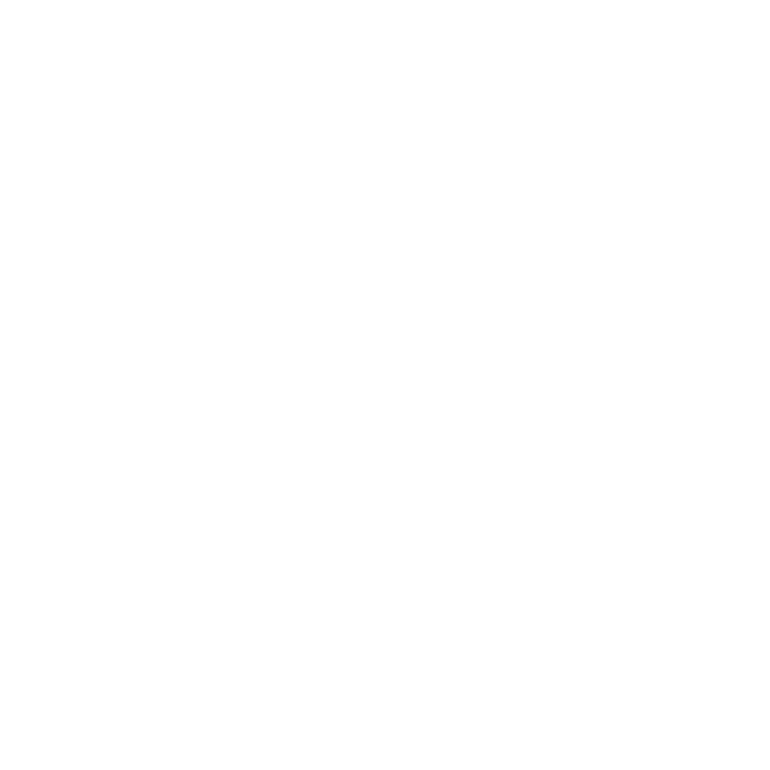

<IPython.core.display.Javascript object>


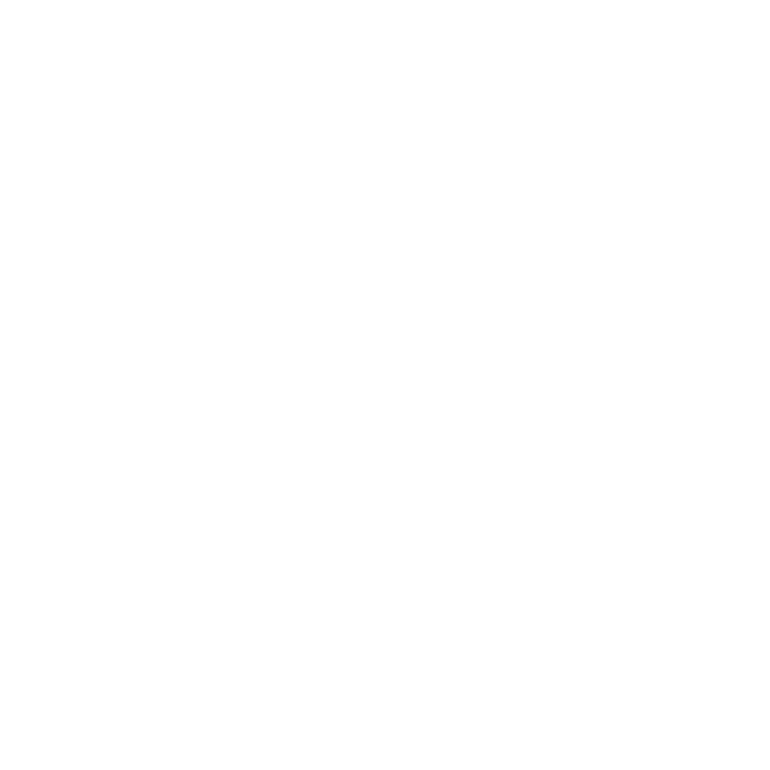

<IPython.core.display.Javascript object>


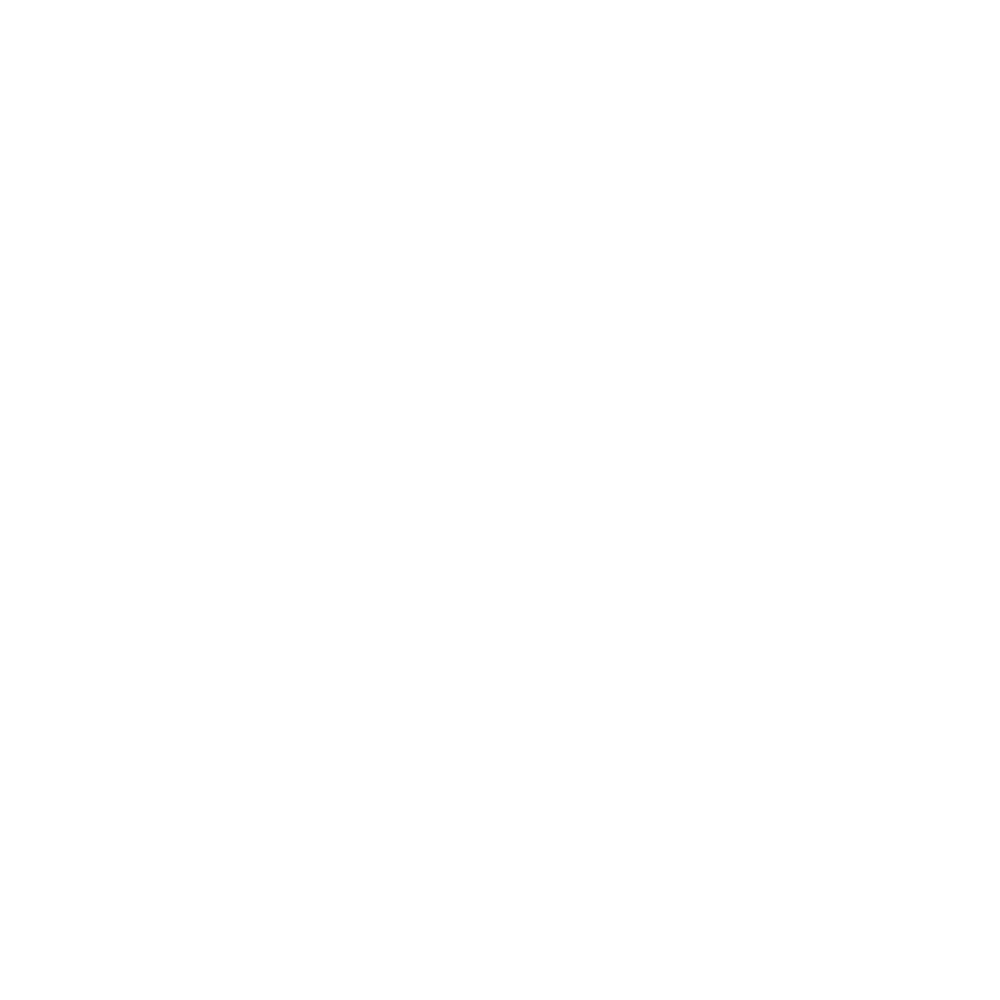

<IPython.core.display.Javascript object>


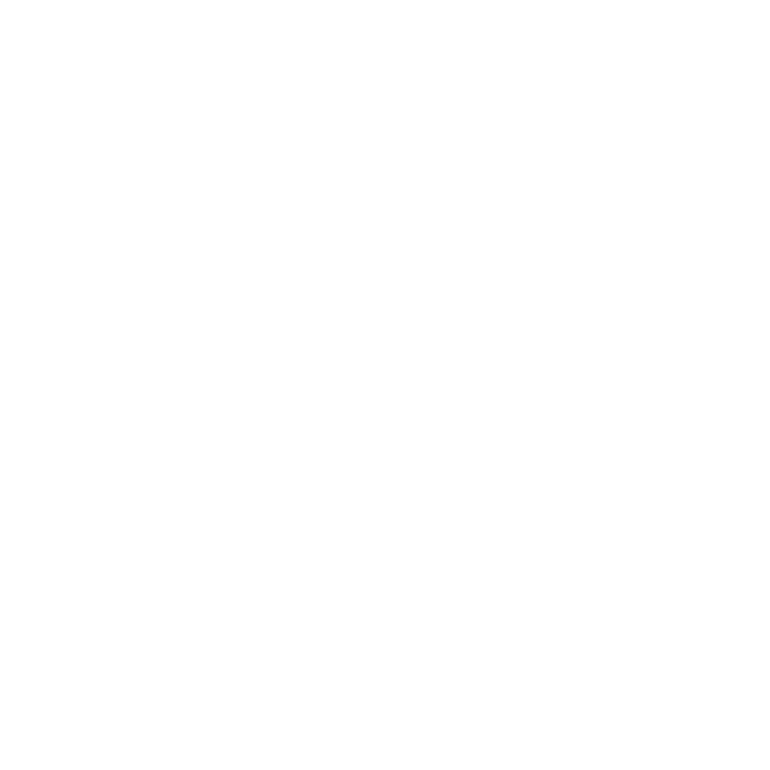

<IPython.core.display.Javascript object>


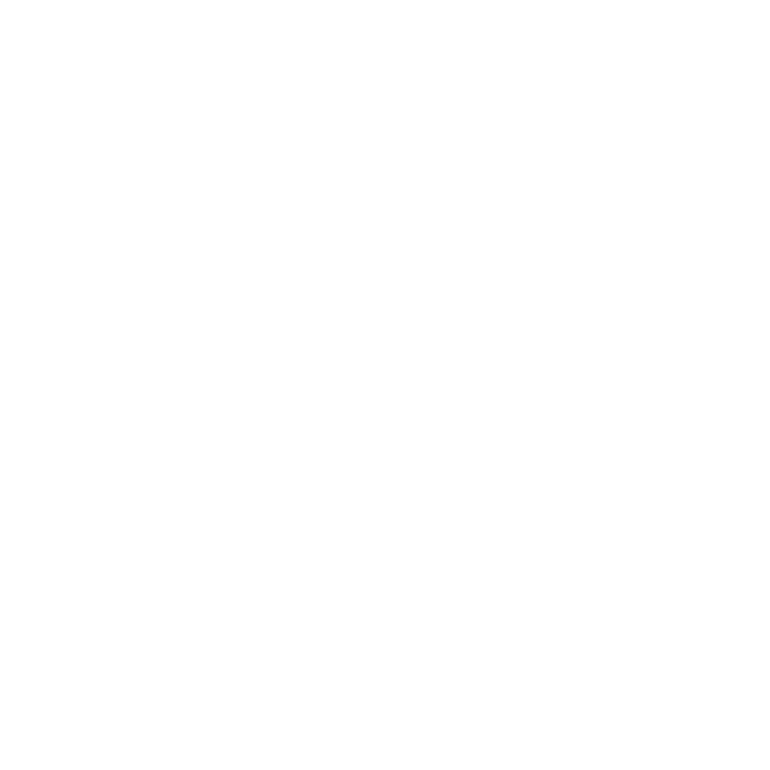

<IPython.core.display.Javascript object>


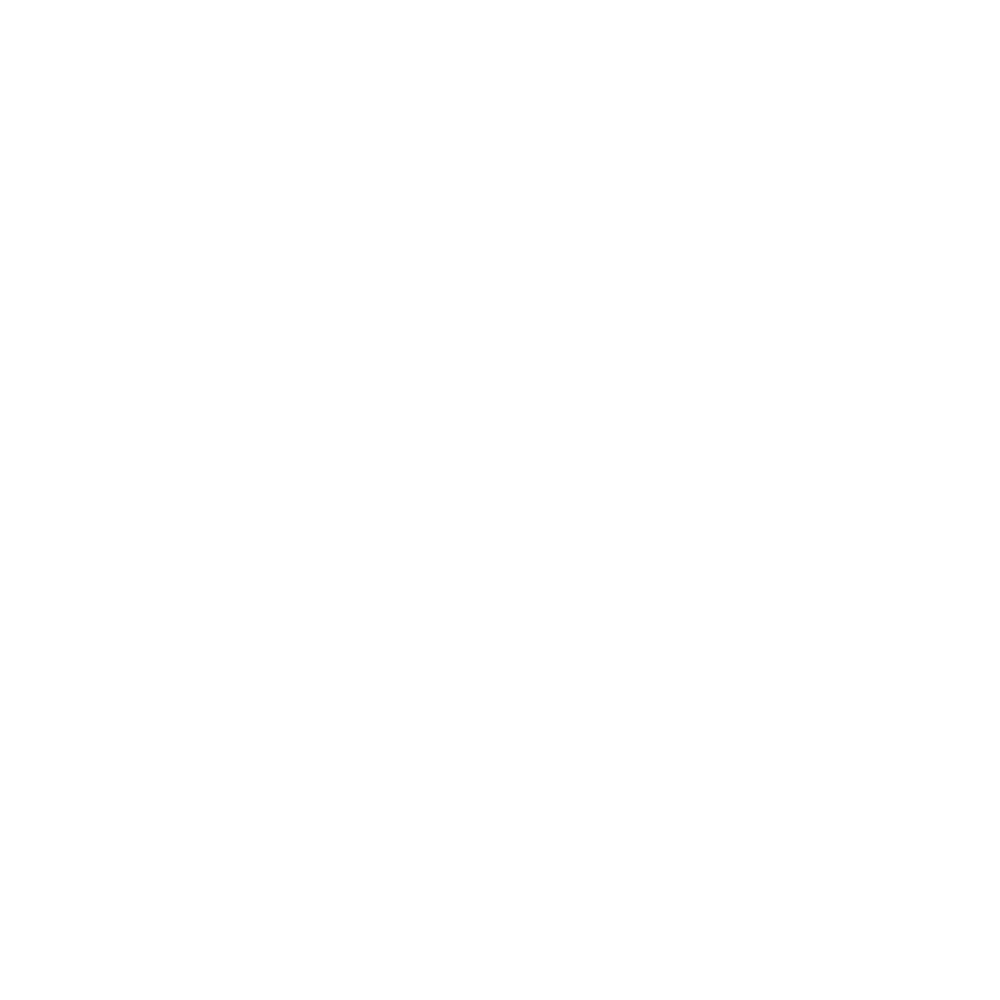

In [92]:
Monther = "Mar"
# setup stuff
PolyList = gpdMarDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdMarDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdMarDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdMarDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdMarDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdMarDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdMarDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


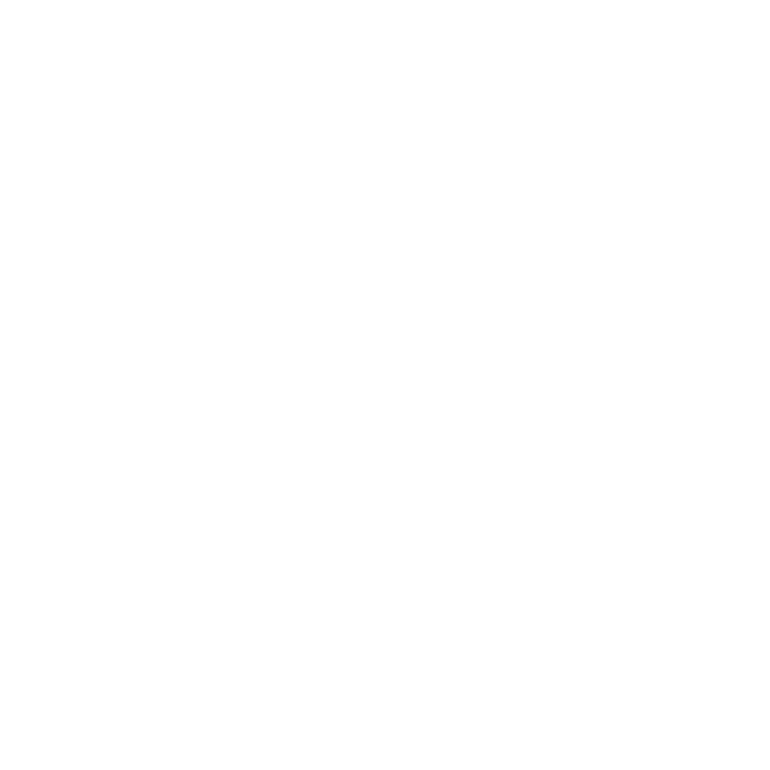

<IPython.core.display.Javascript object>


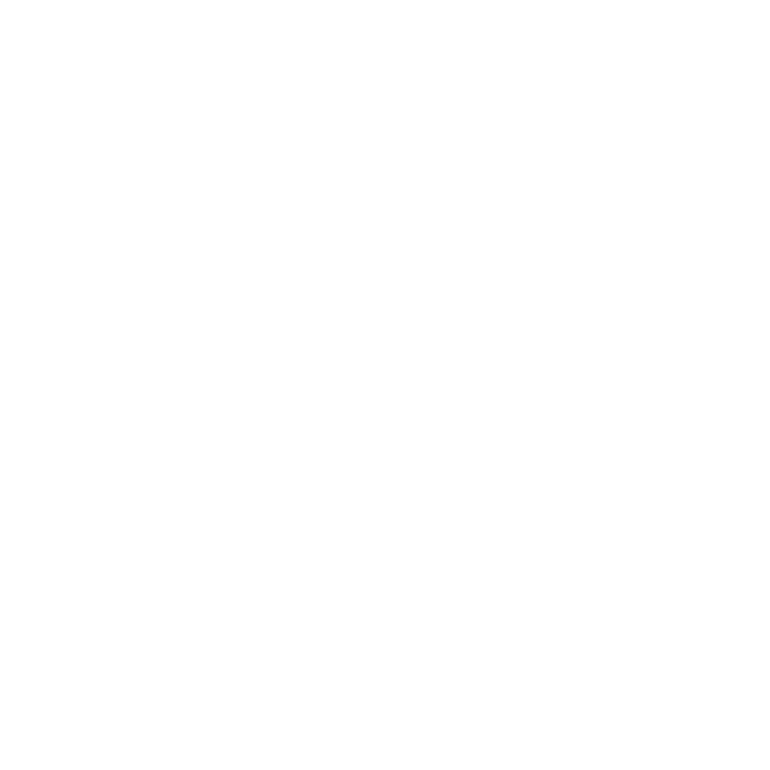

<IPython.core.display.Javascript object>


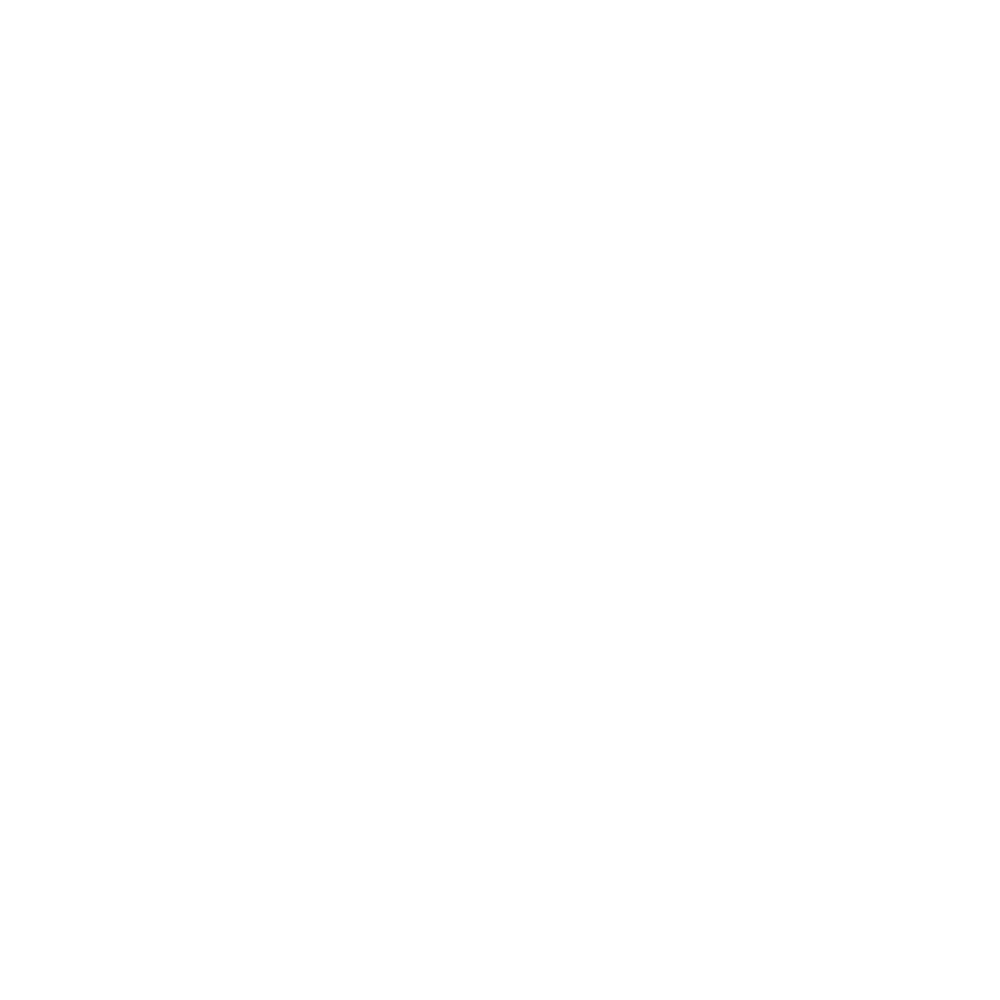

<IPython.core.display.Javascript object>


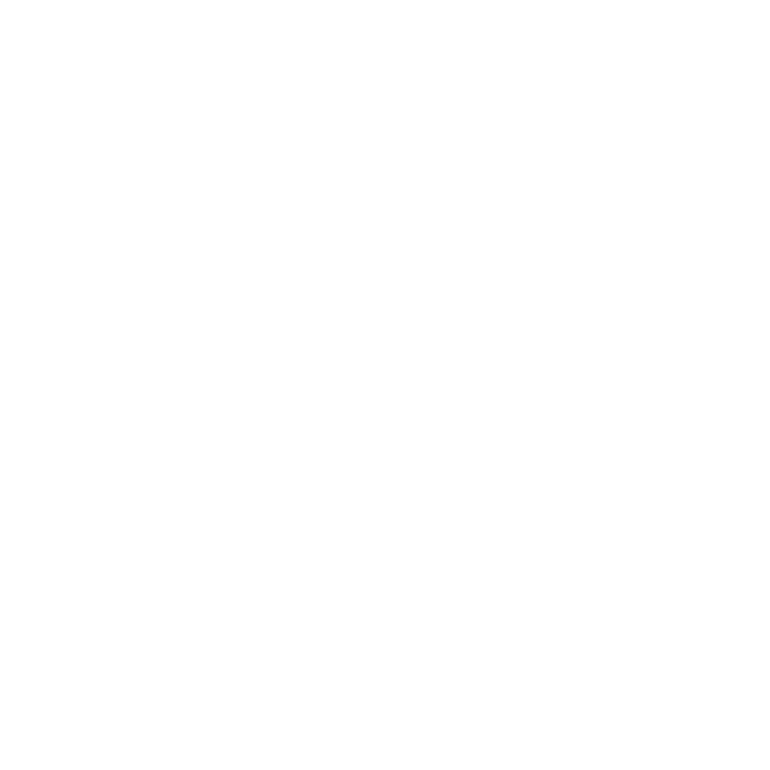

<IPython.core.display.Javascript object>


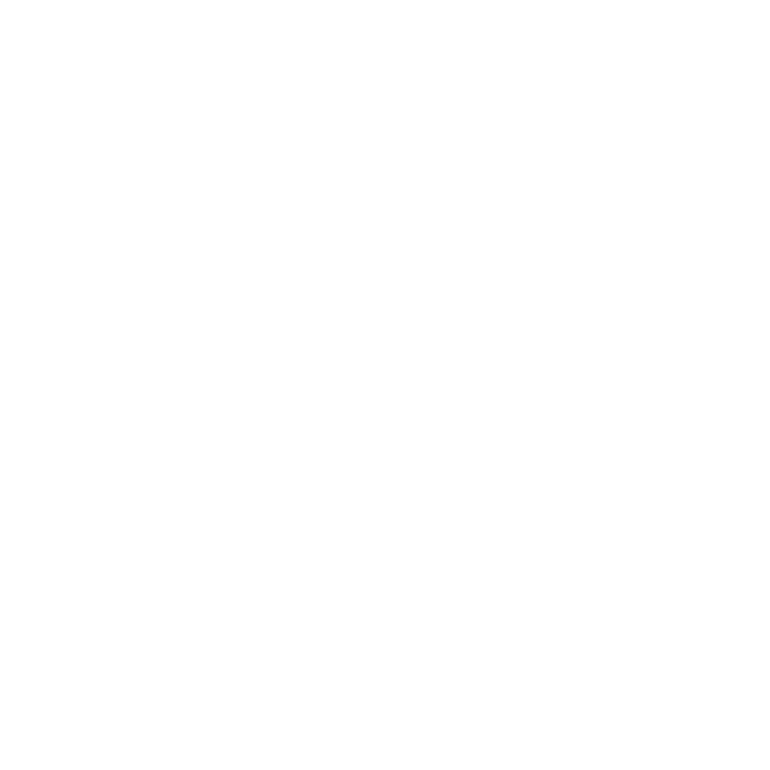

<IPython.core.display.Javascript object>


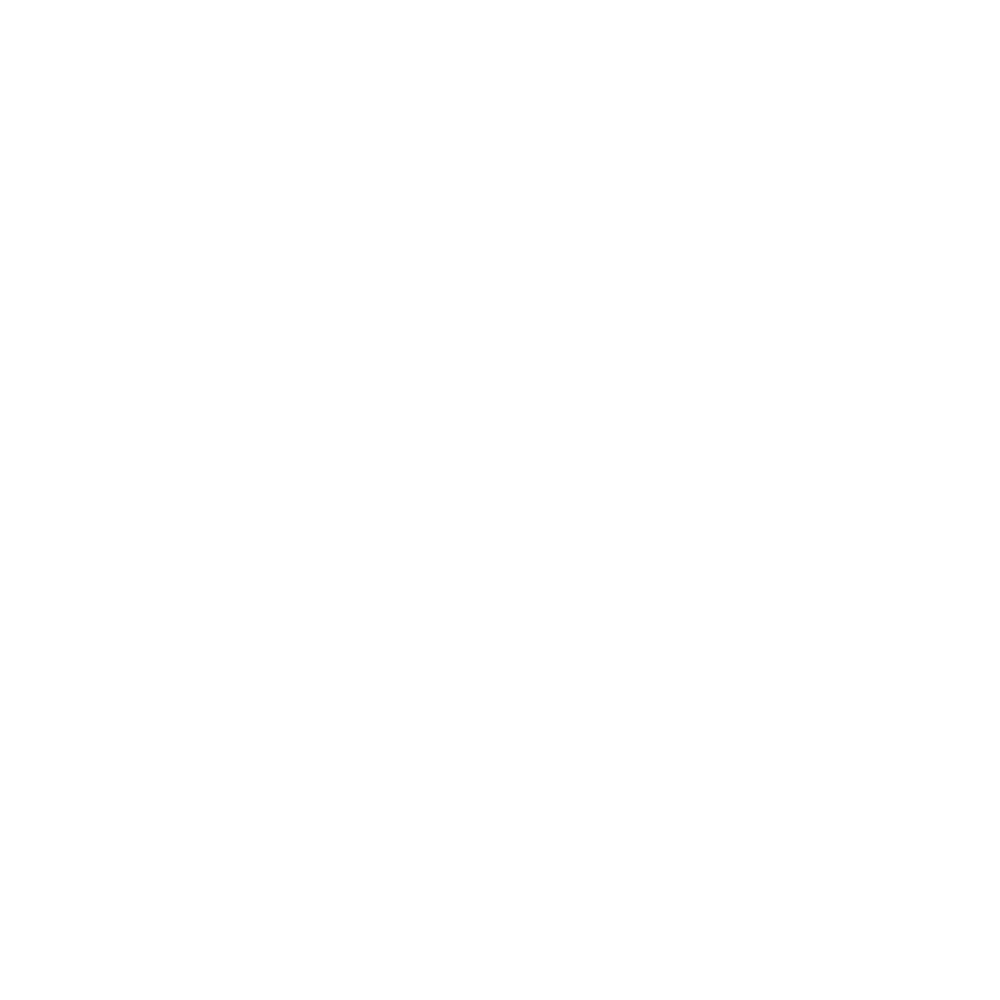

<IPython.core.display.Javascript object>


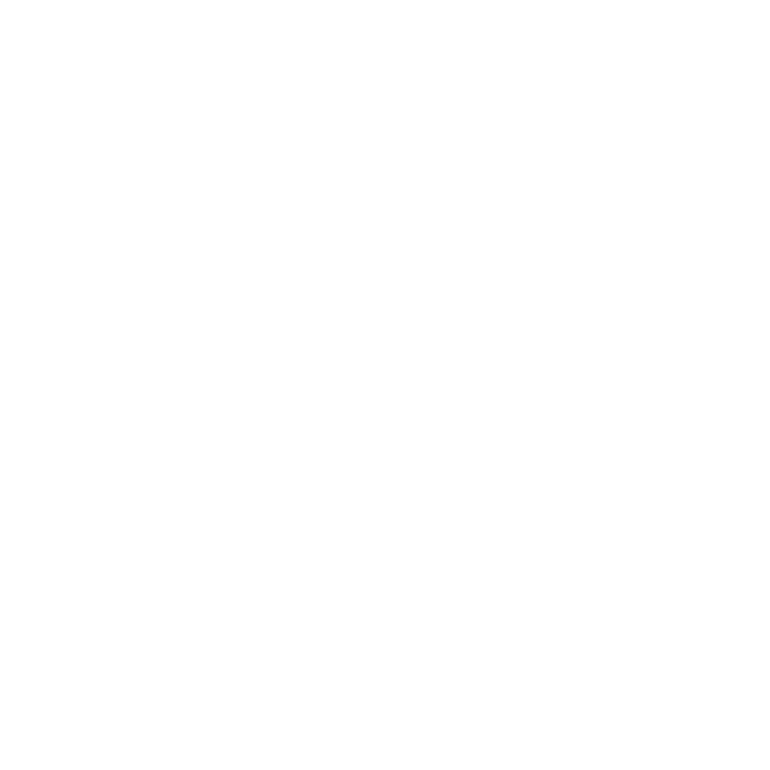

<IPython.core.display.Javascript object>


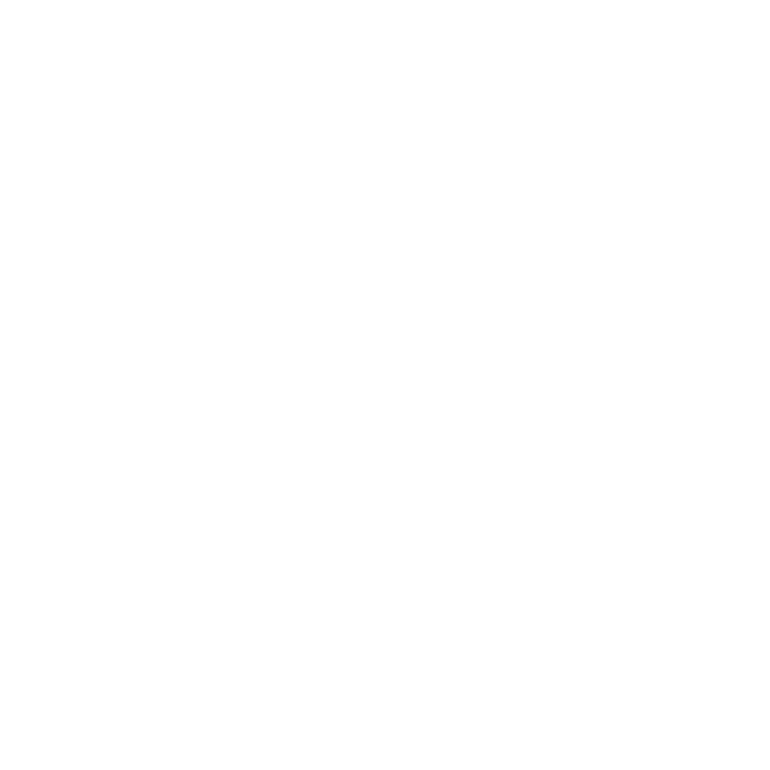

<IPython.core.display.Javascript object>


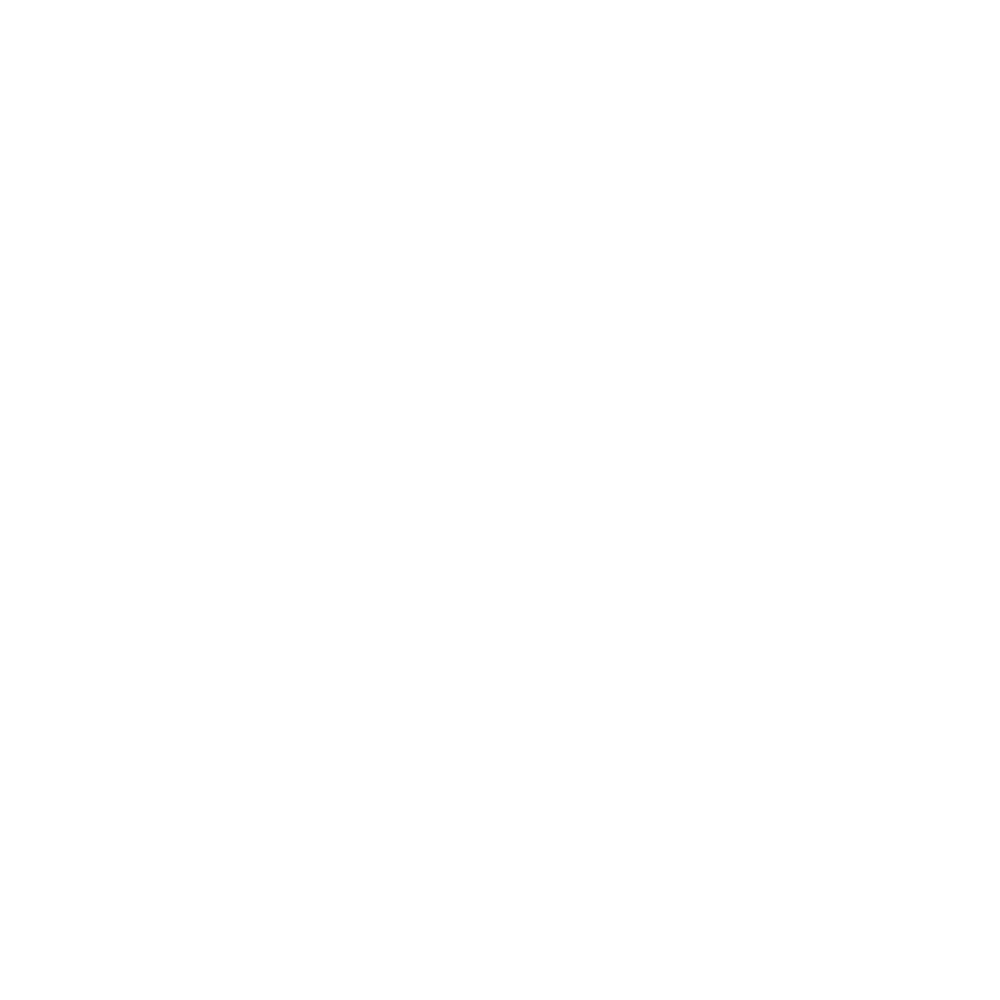

<IPython.core.display.Javascript object>


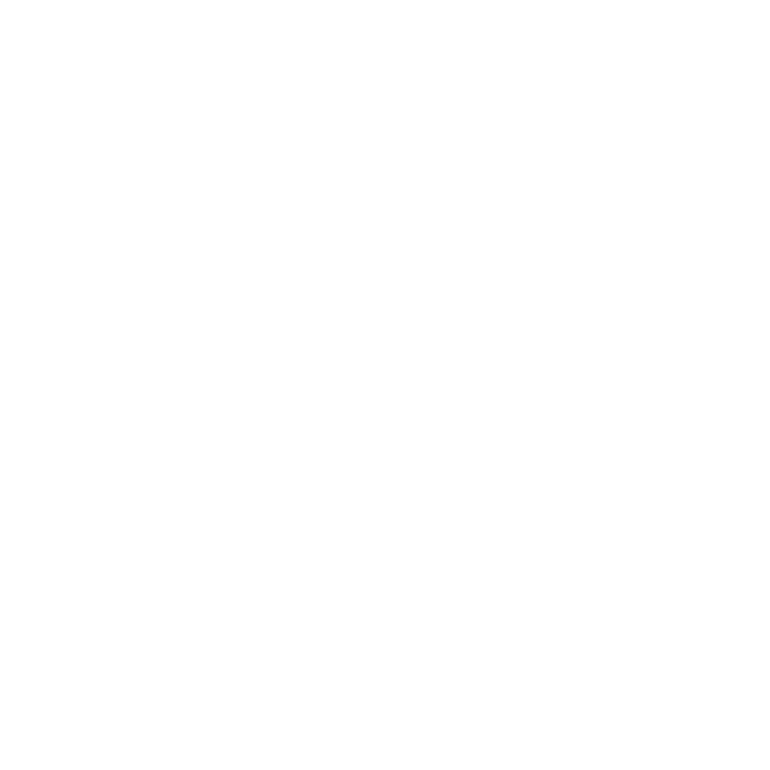

<IPython.core.display.Javascript object>


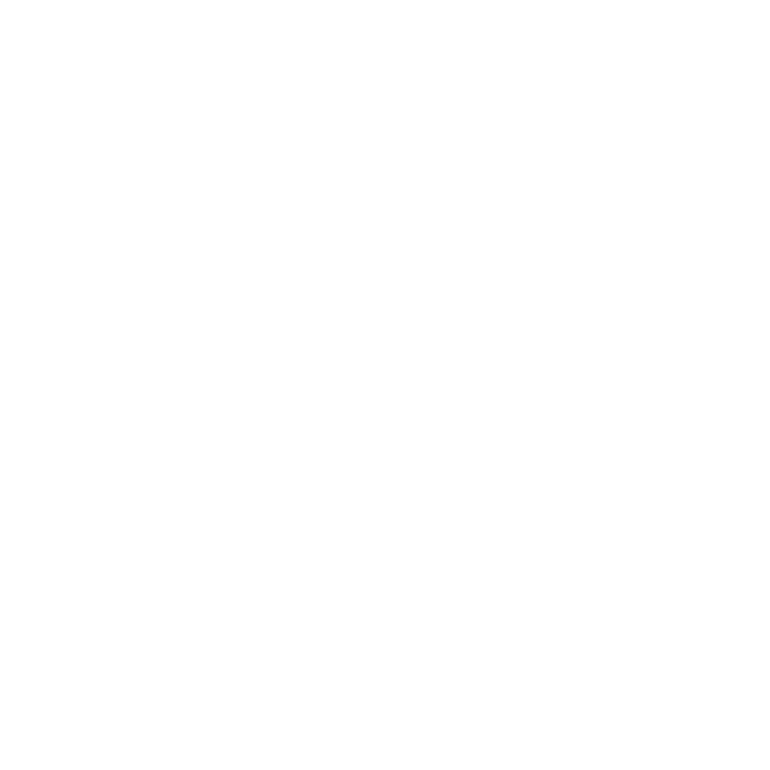

<IPython.core.display.Javascript object>


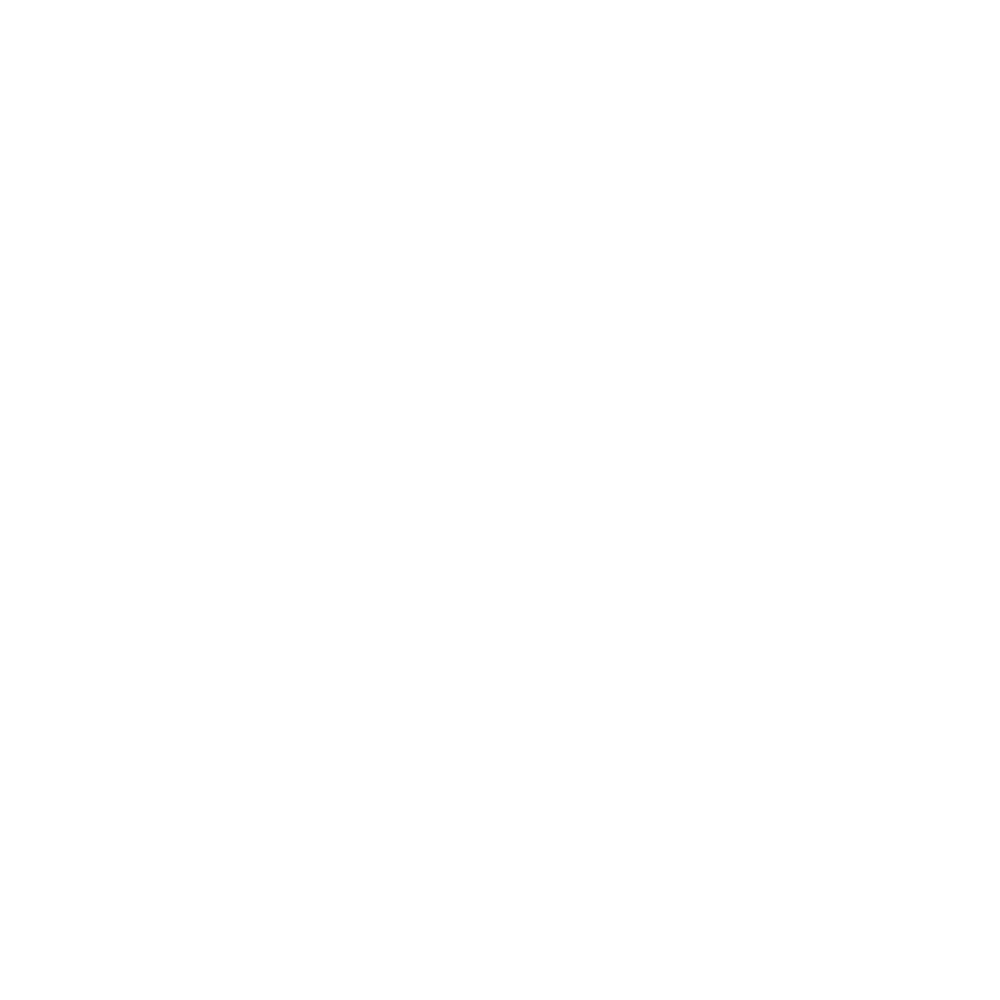

<IPython.core.display.Javascript object>


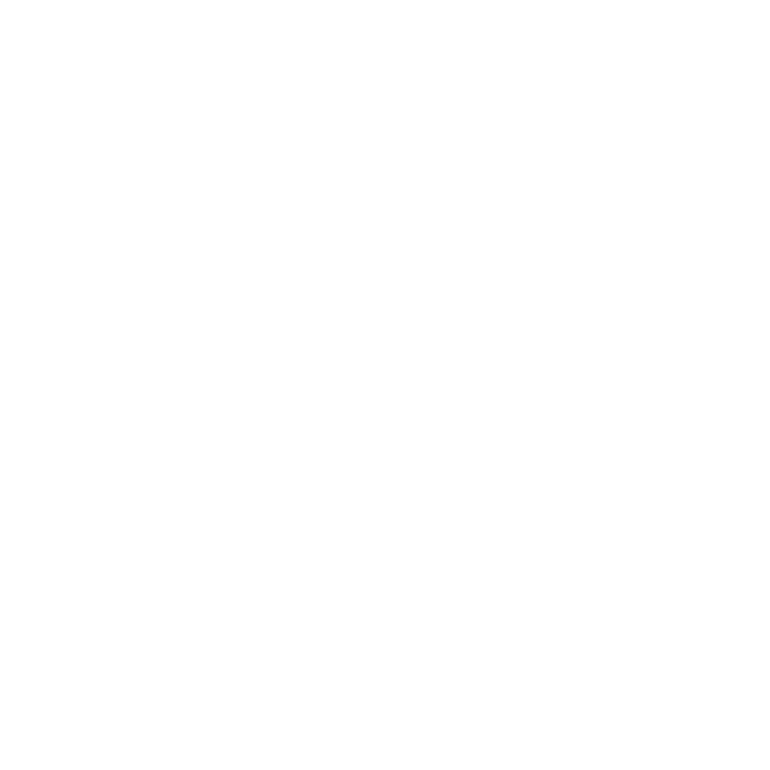

<IPython.core.display.Javascript object>


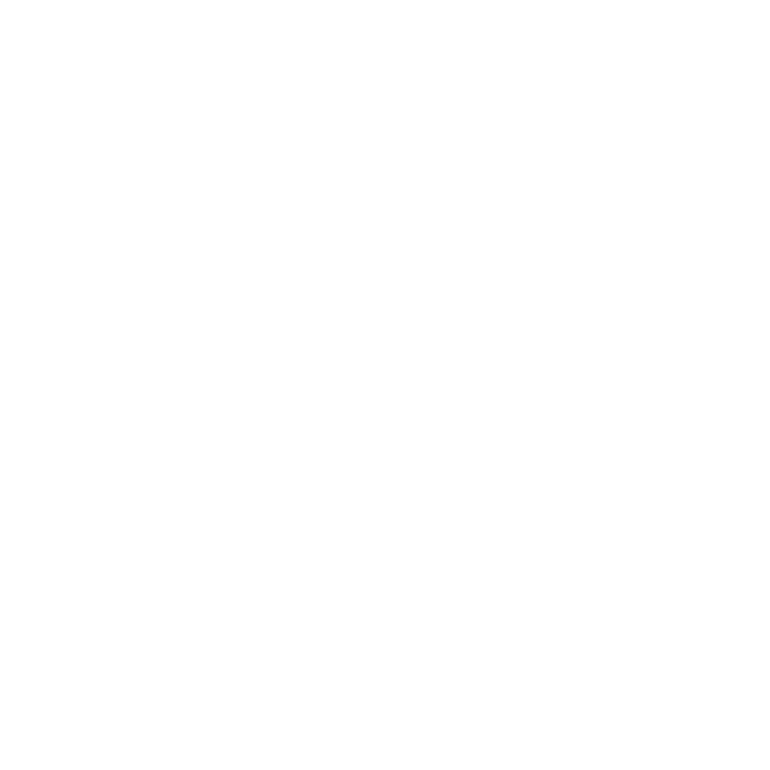

<IPython.core.display.Javascript object>


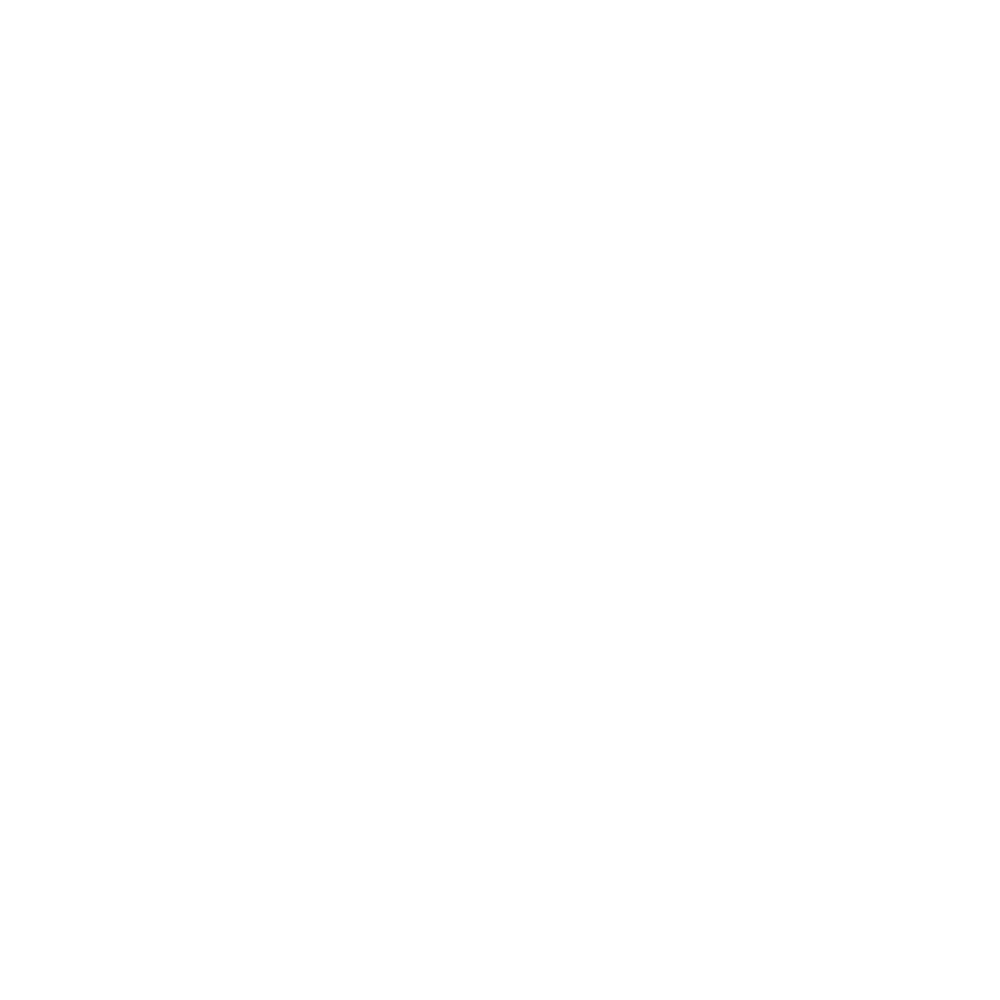

<IPython.core.display.Javascript object>


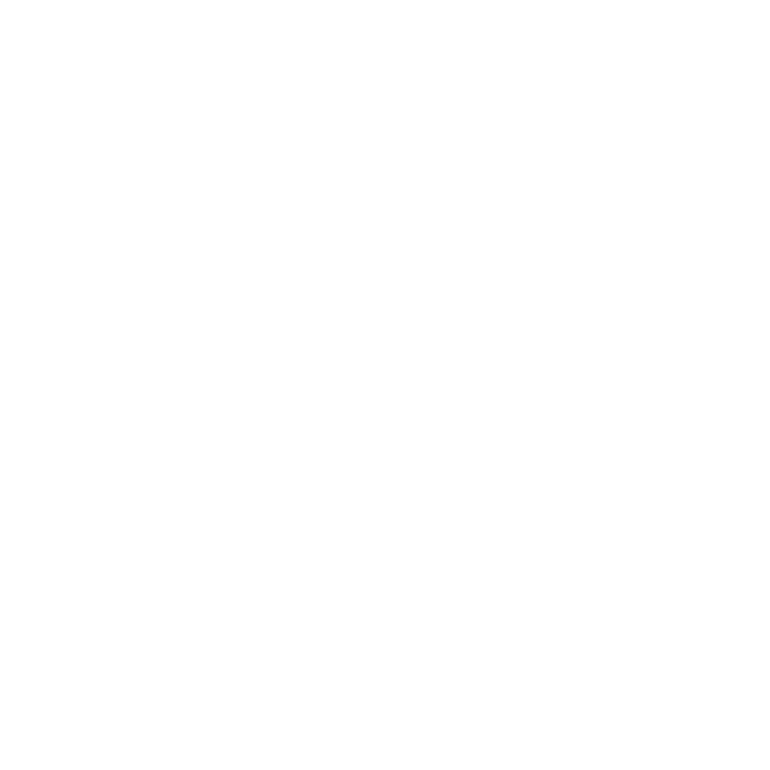

<IPython.core.display.Javascript object>


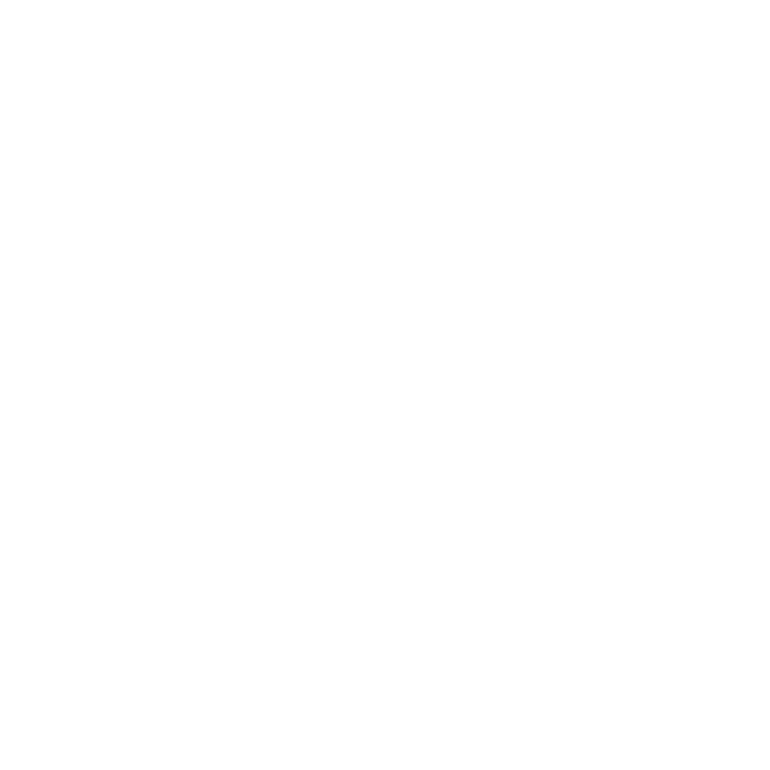

<IPython.core.display.Javascript object>


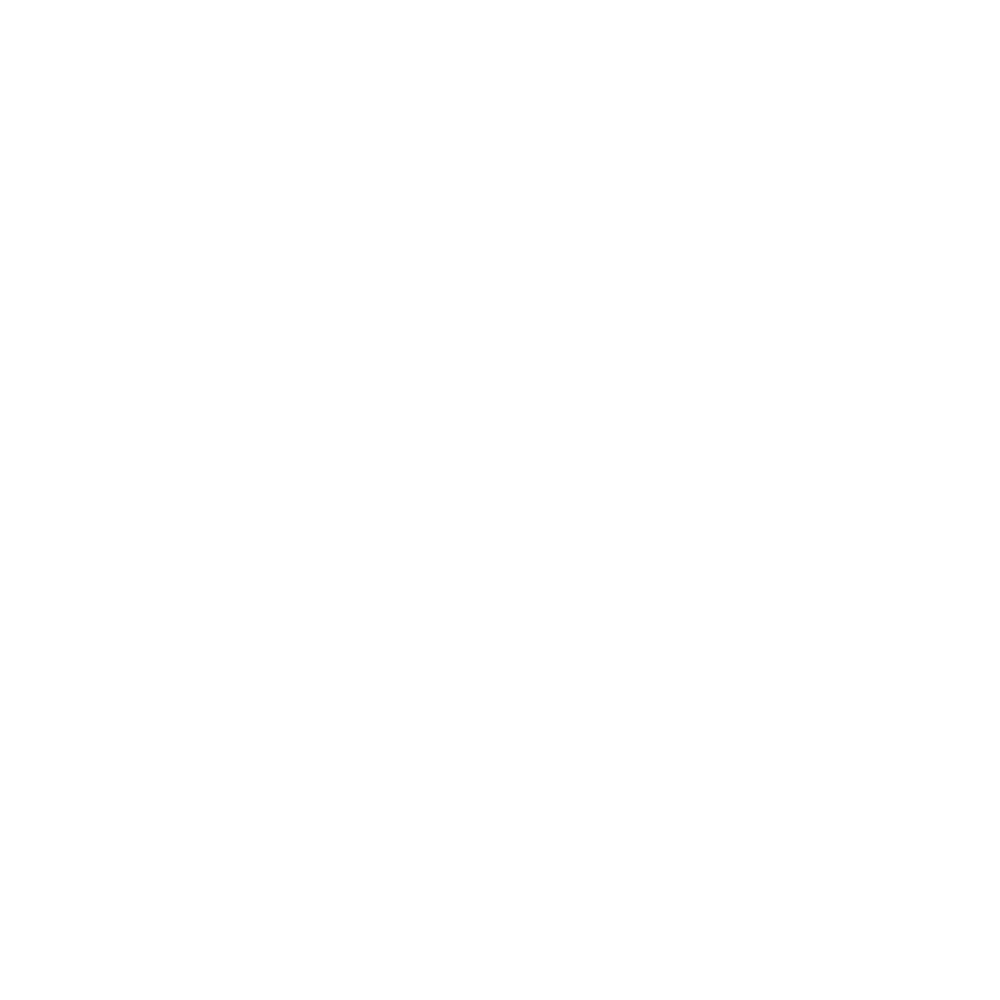

In [93]:
Monther = "Apr"
# setup stuff
PolyList = gpdAprDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdAprDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdAprDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdAprDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdAprDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdAprDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdAprDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


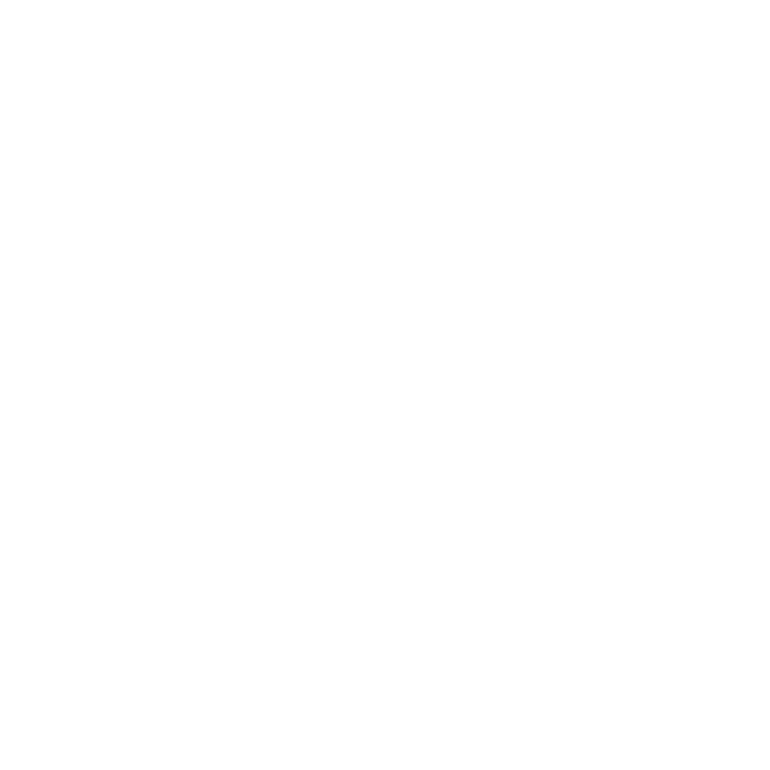

<IPython.core.display.Javascript object>


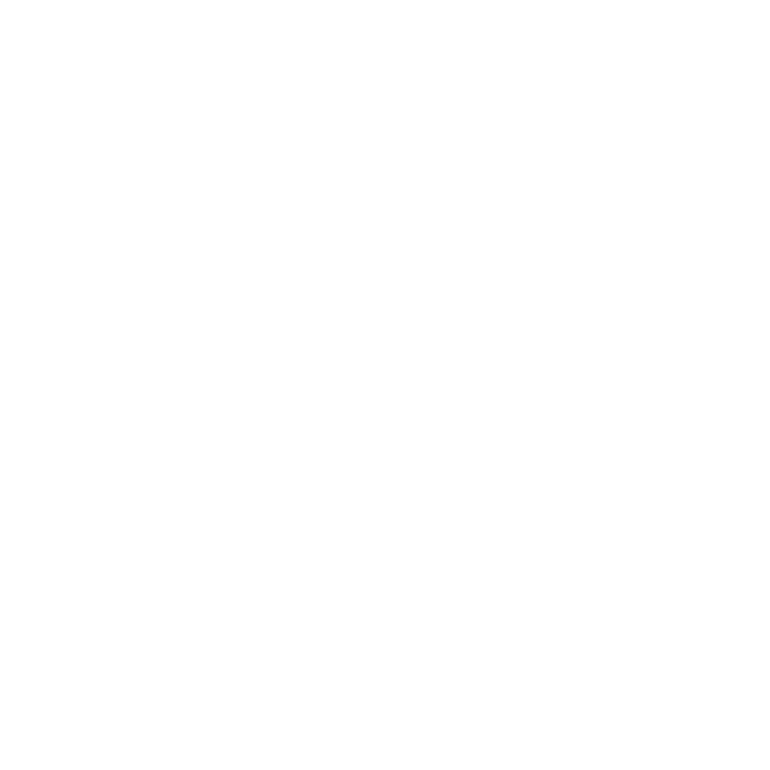

<IPython.core.display.Javascript object>


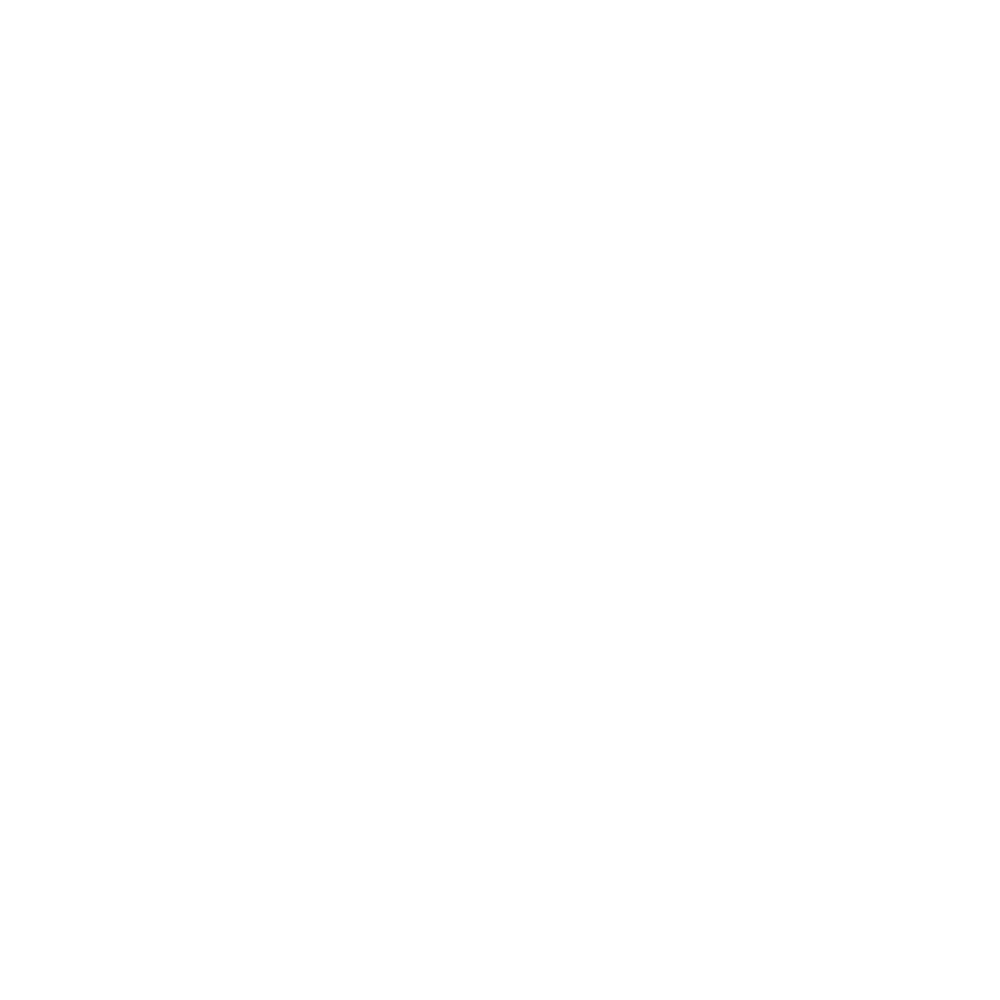

<IPython.core.display.Javascript object>


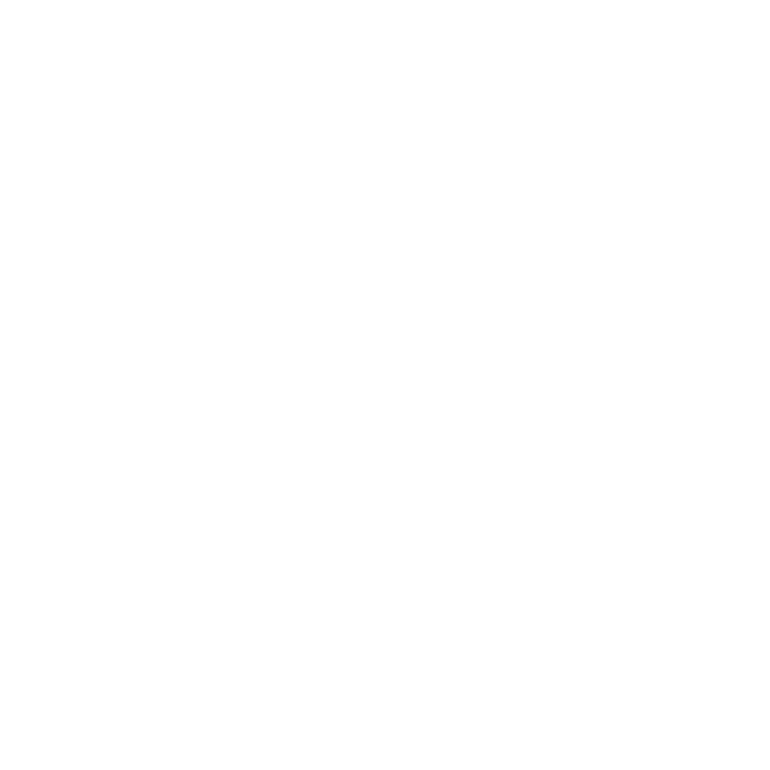

<IPython.core.display.Javascript object>


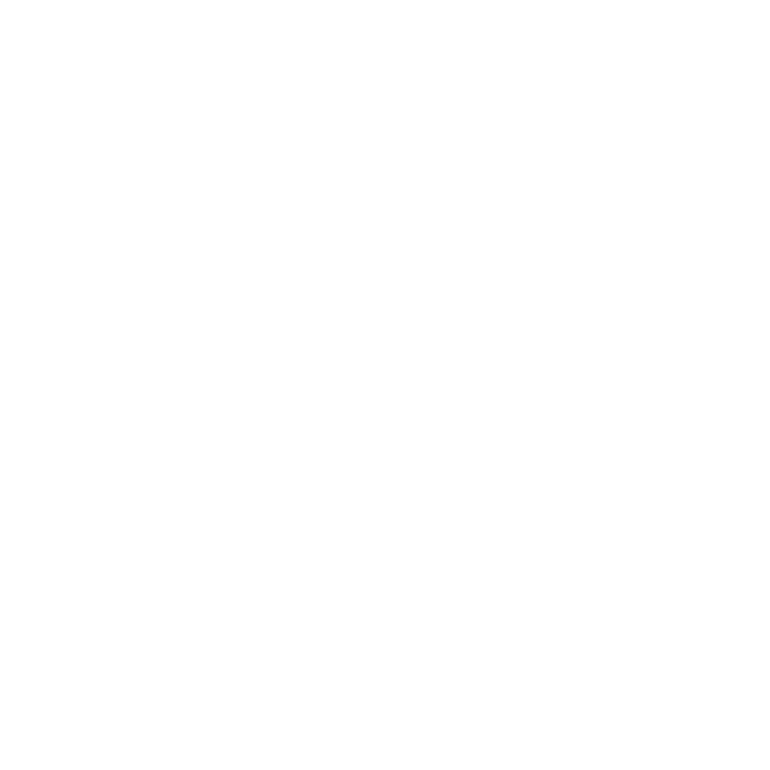

<IPython.core.display.Javascript object>


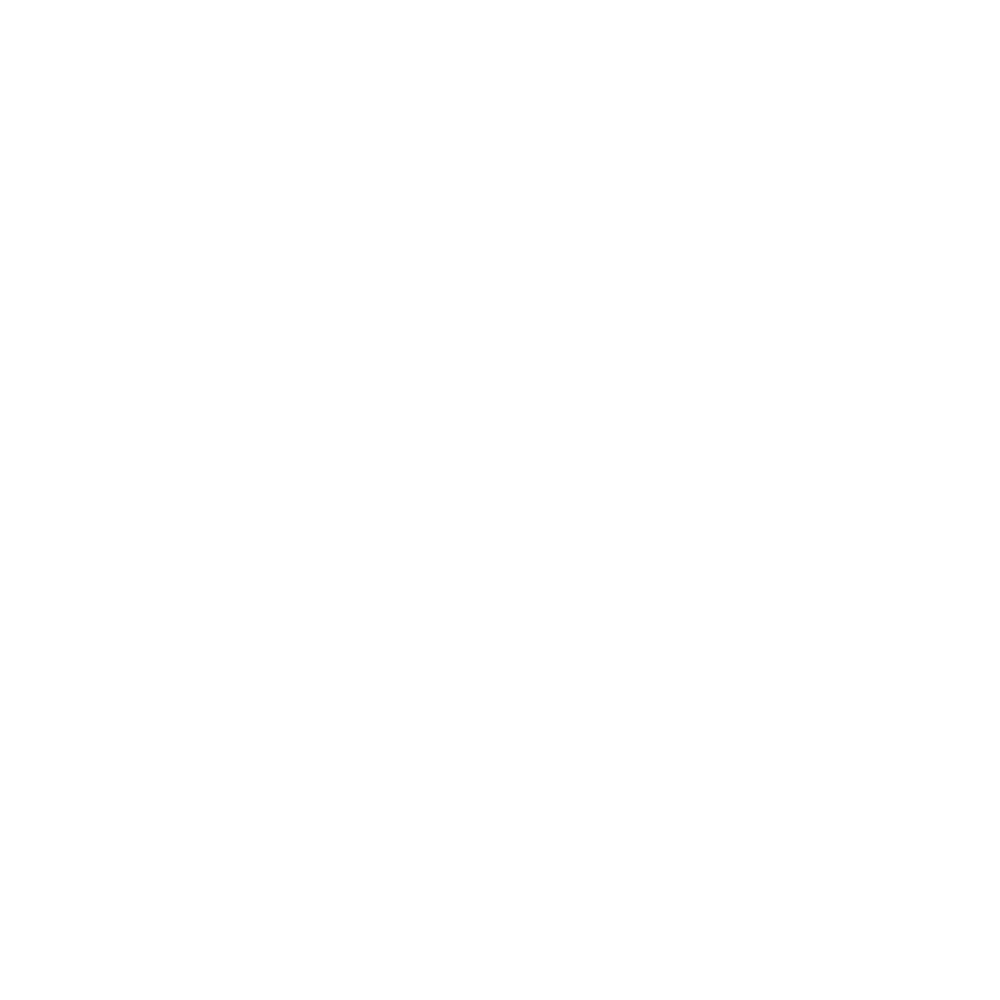

<IPython.core.display.Javascript object>


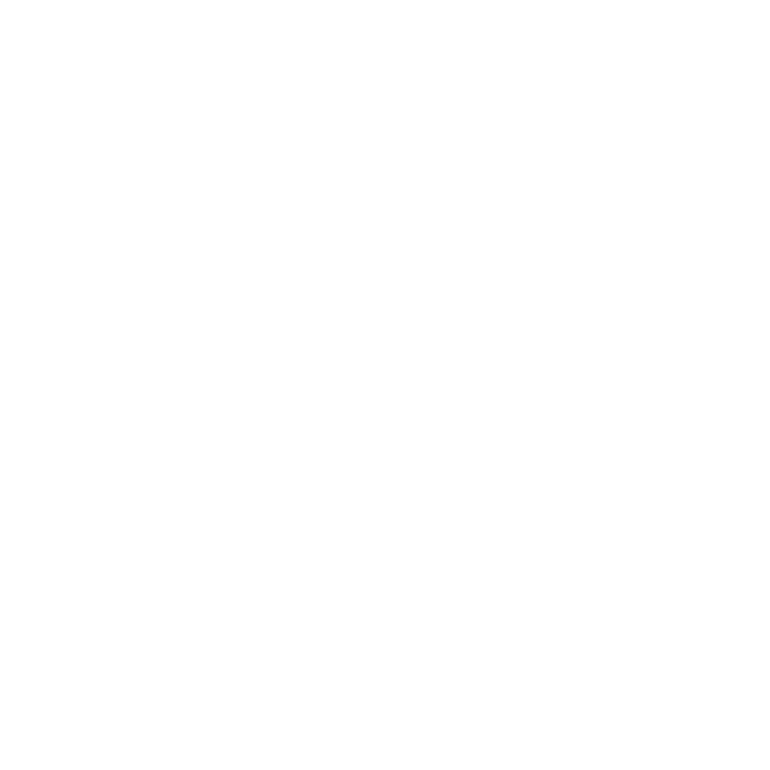

<IPython.core.display.Javascript object>


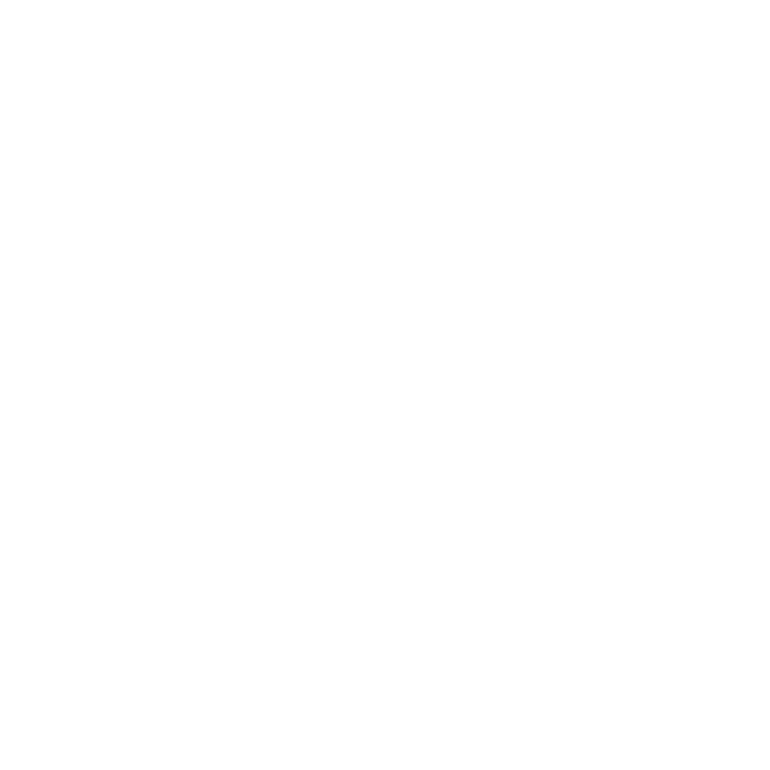

<IPython.core.display.Javascript object>


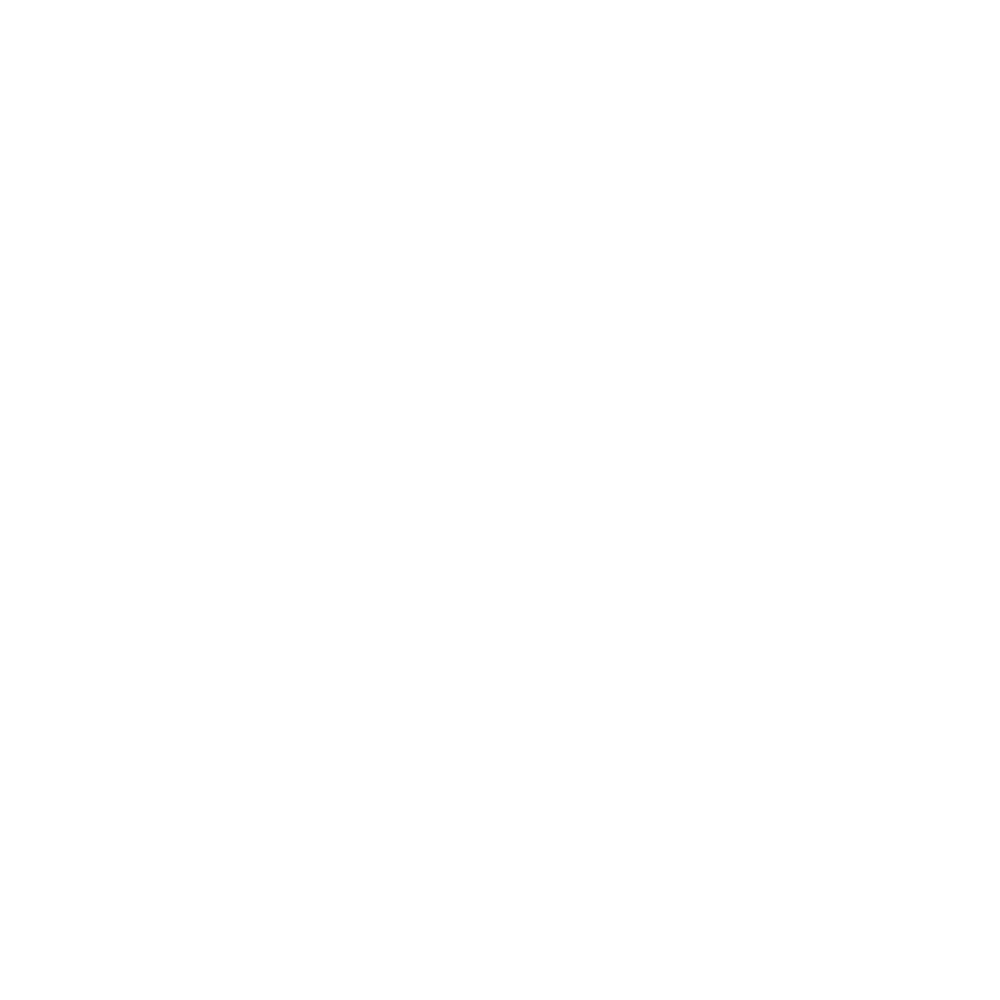

<IPython.core.display.Javascript object>


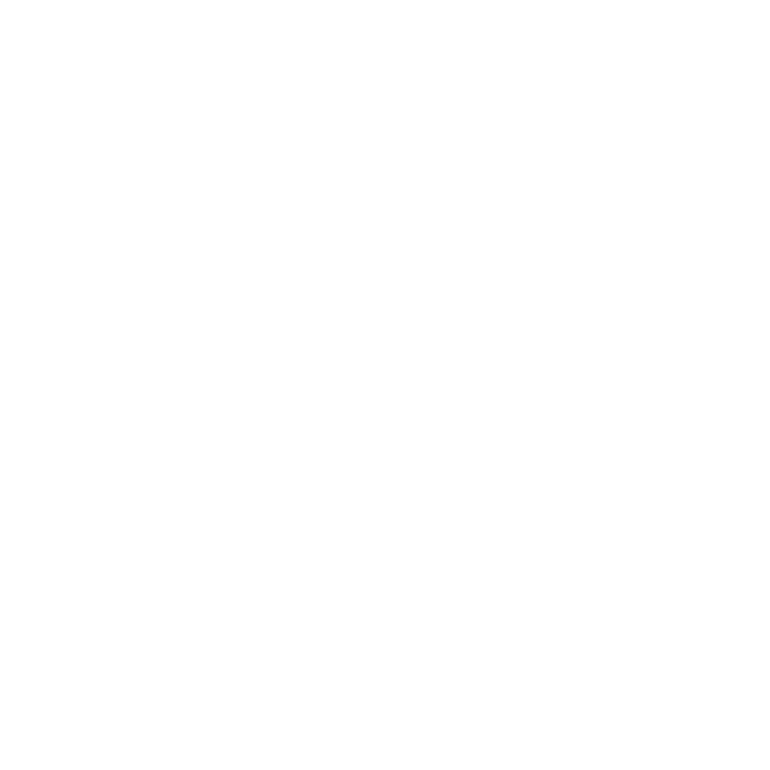

<IPython.core.display.Javascript object>


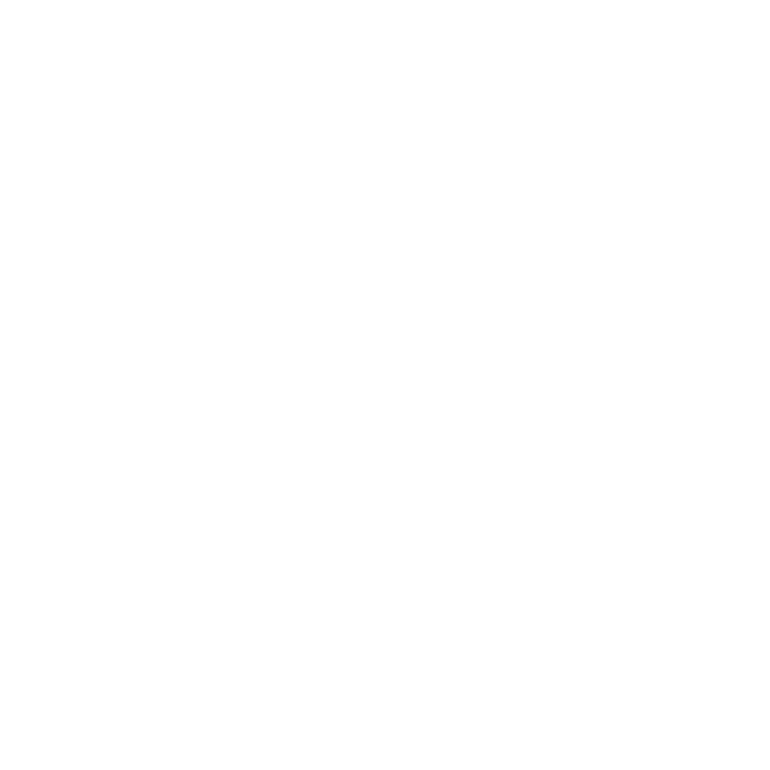

<IPython.core.display.Javascript object>


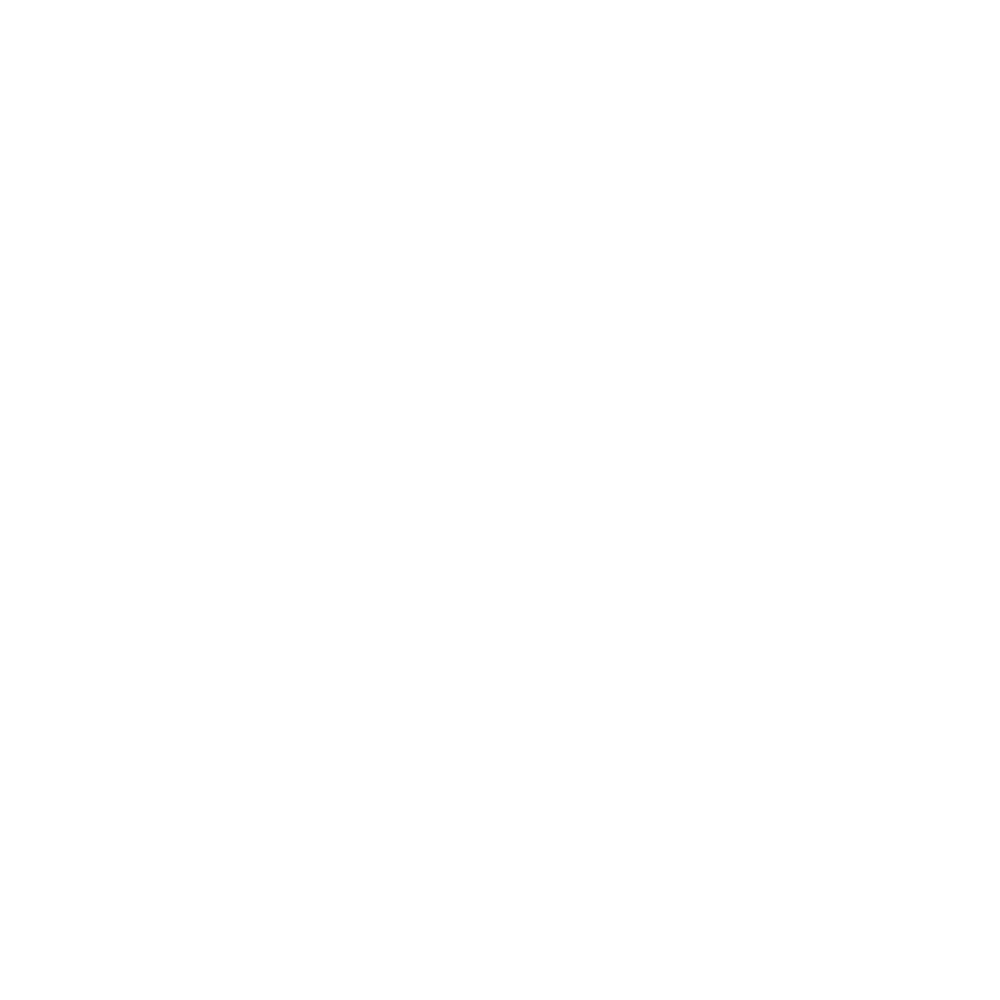

<IPython.core.display.Javascript object>


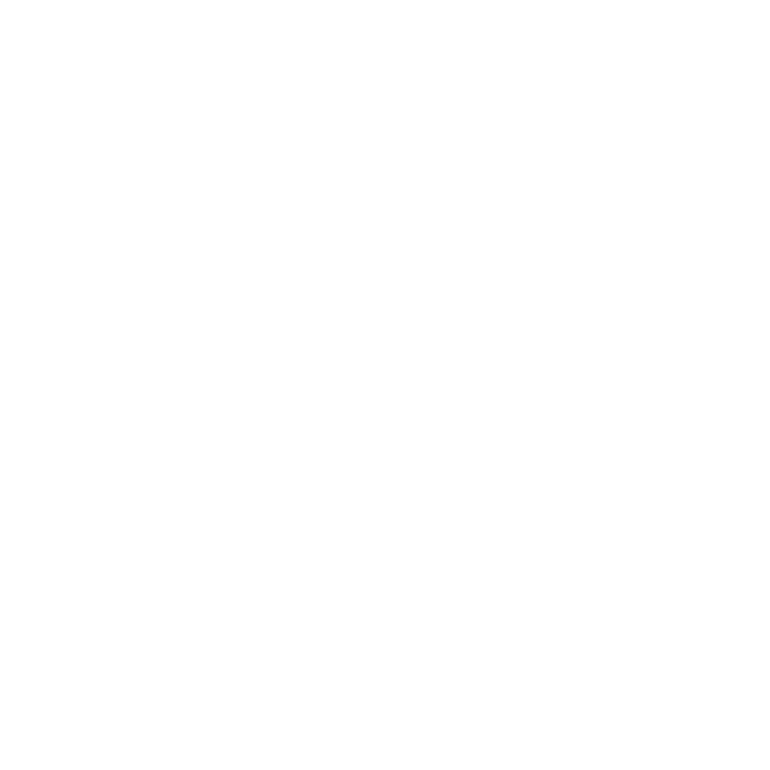

<IPython.core.display.Javascript object>


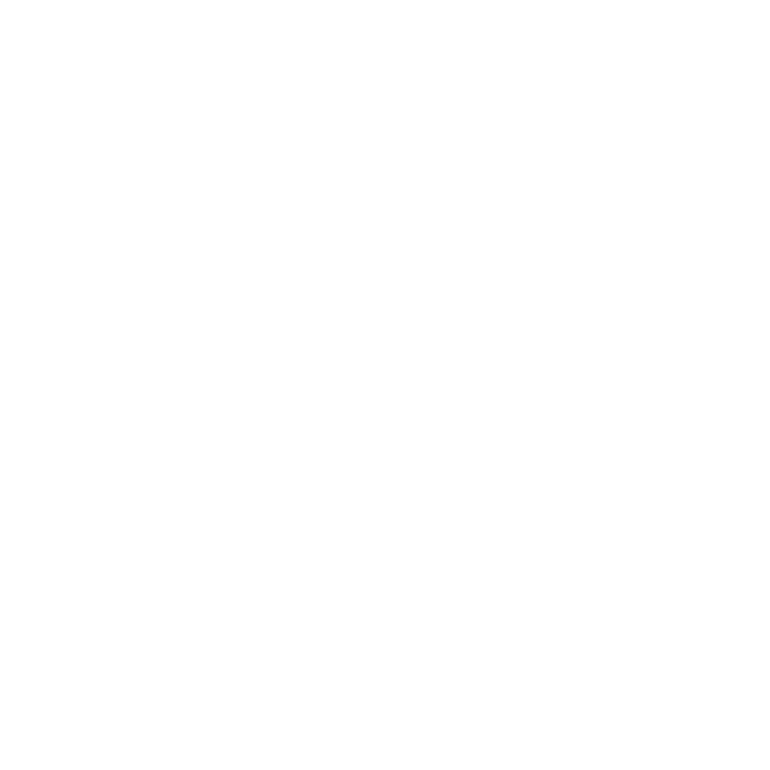

<IPython.core.display.Javascript object>


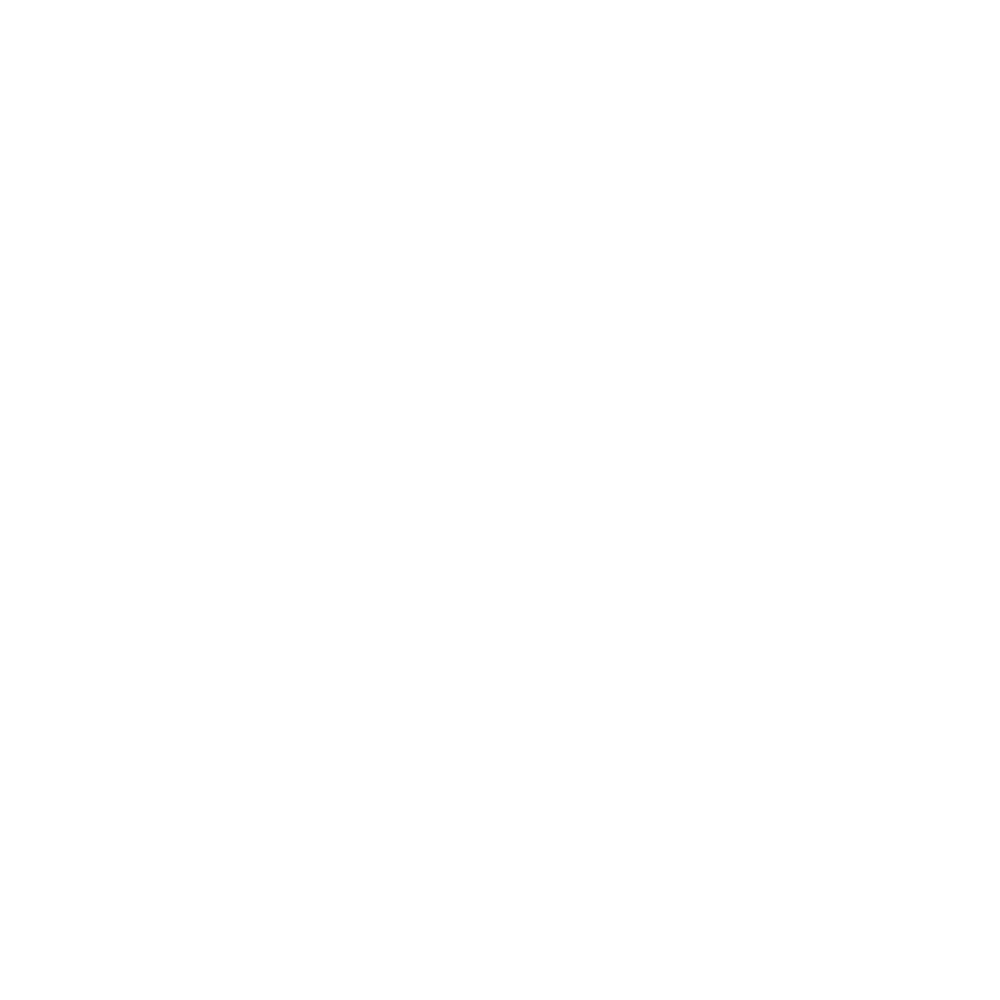

<IPython.core.display.Javascript object>


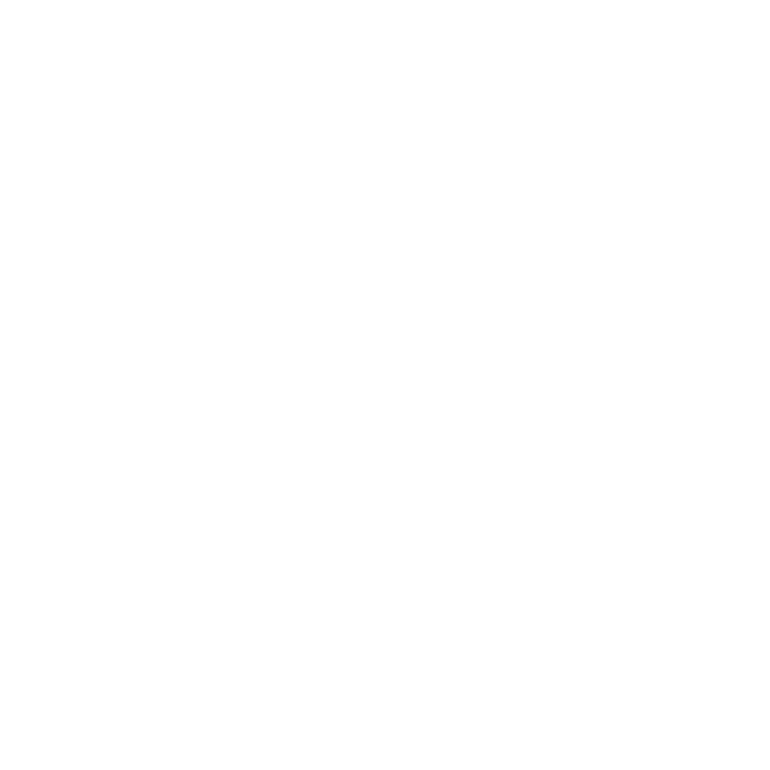

<IPython.core.display.Javascript object>


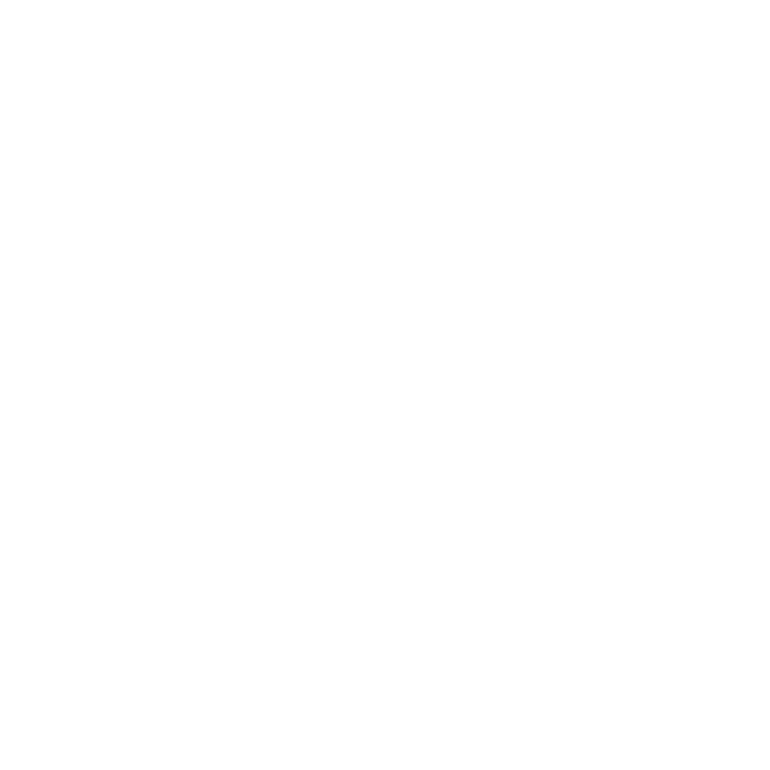

<IPython.core.display.Javascript object>


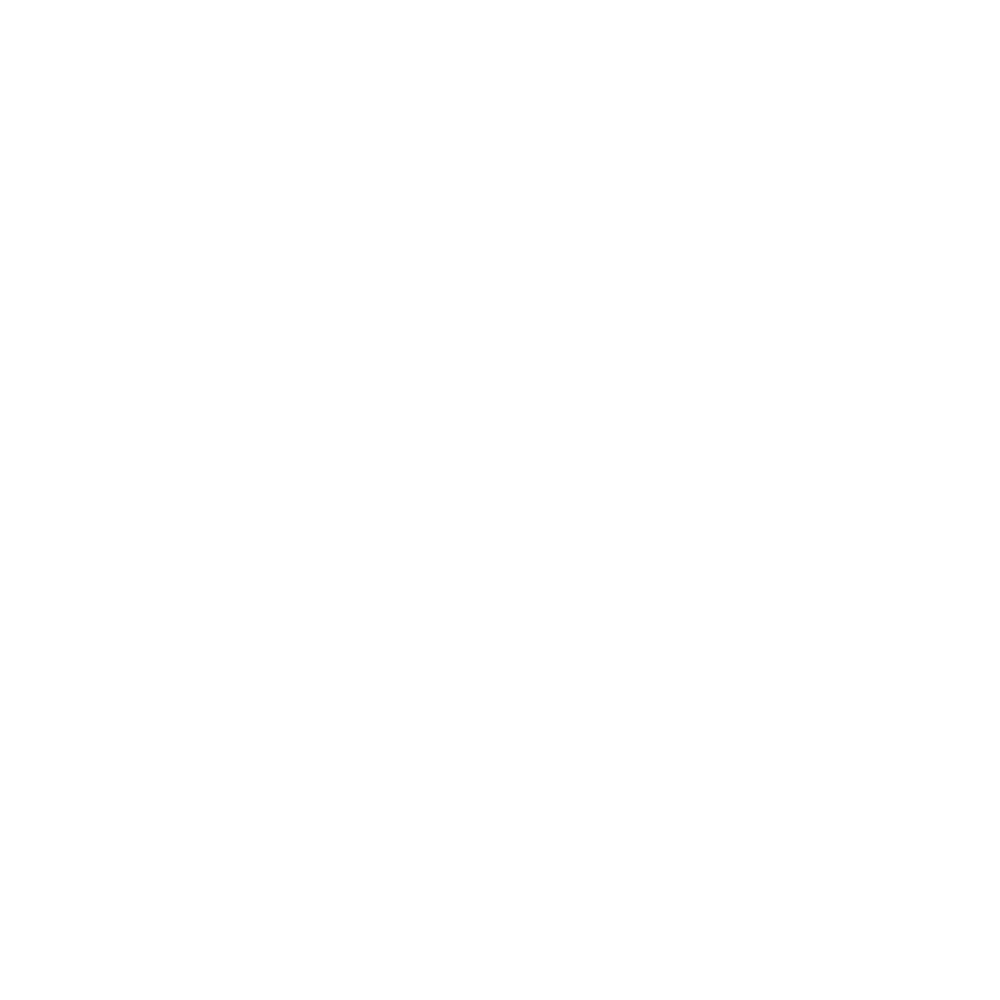

In [94]:
Monther = "May"
# setup stuff
PolyList = gpdMayDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdMayDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdMayDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdMayDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdMayDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdMayDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdMayDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


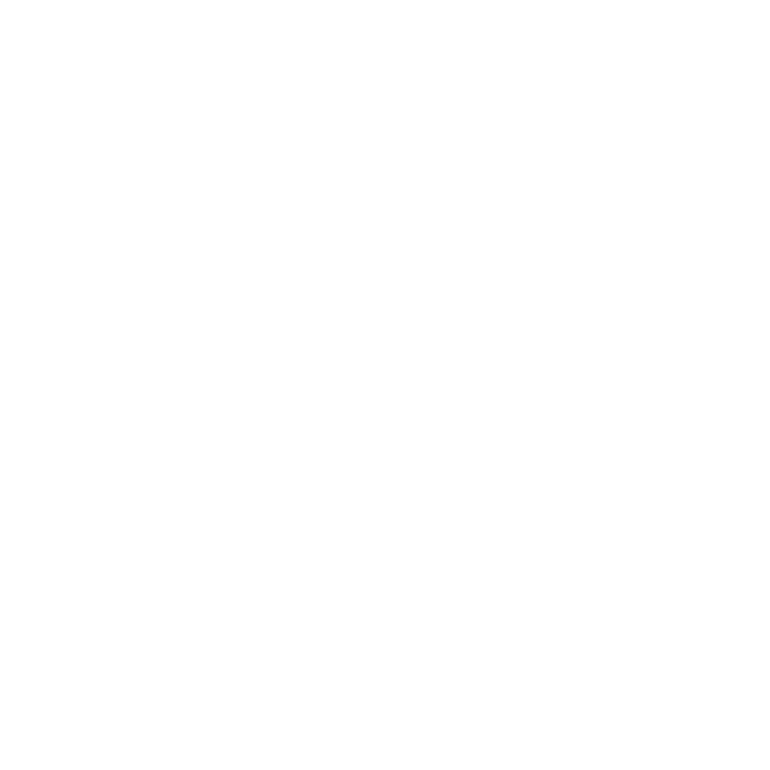

<IPython.core.display.Javascript object>


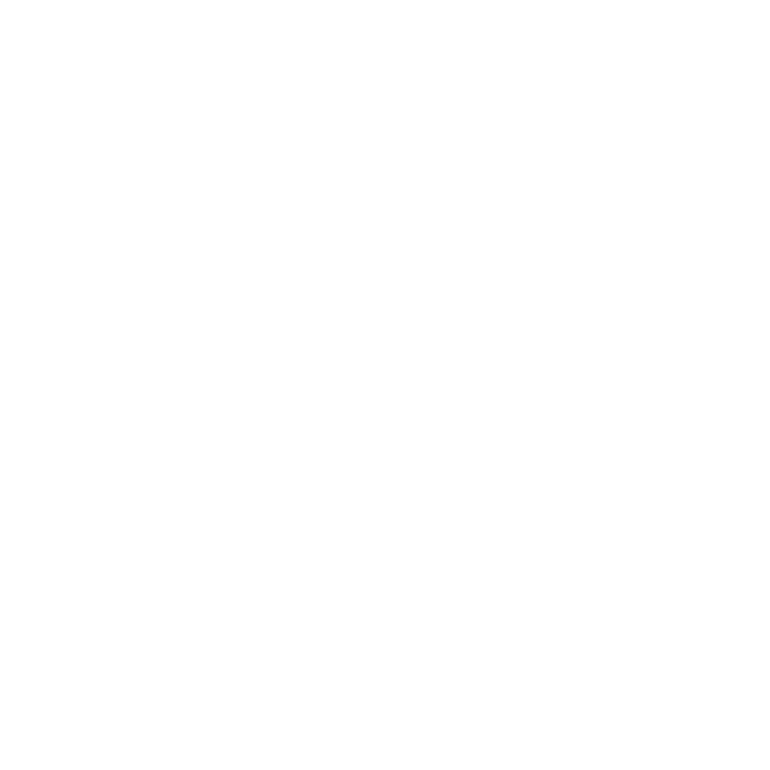

<IPython.core.display.Javascript object>


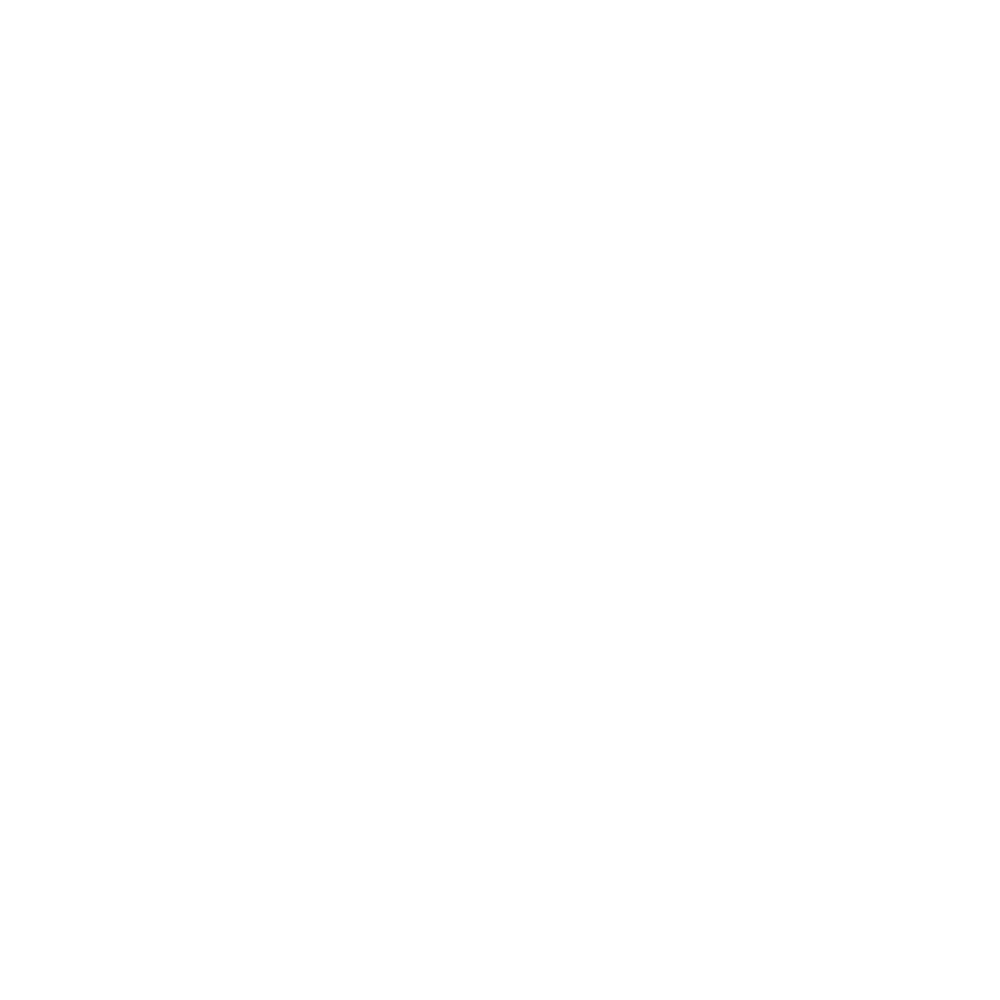

<IPython.core.display.Javascript object>


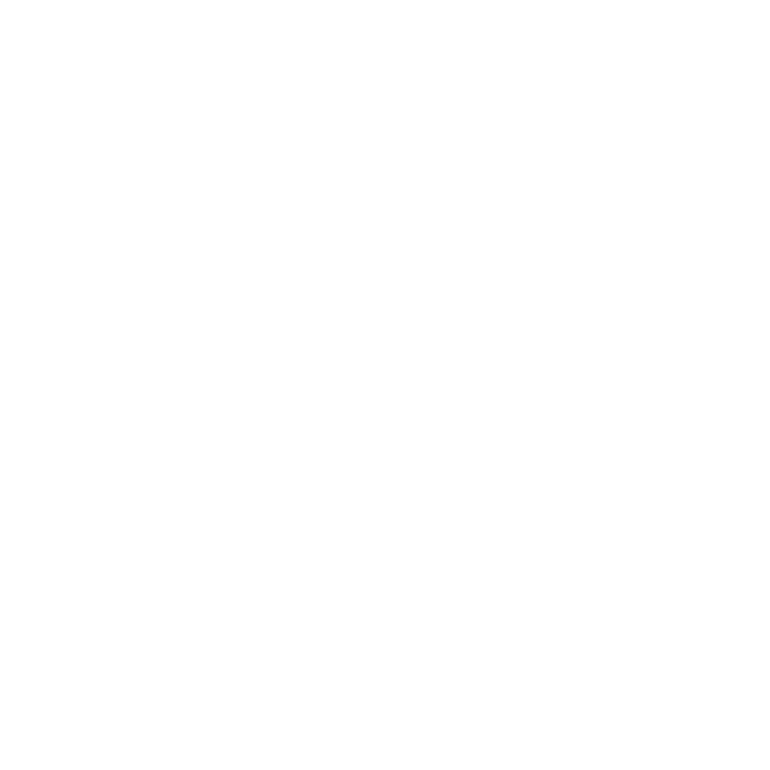

<IPython.core.display.Javascript object>


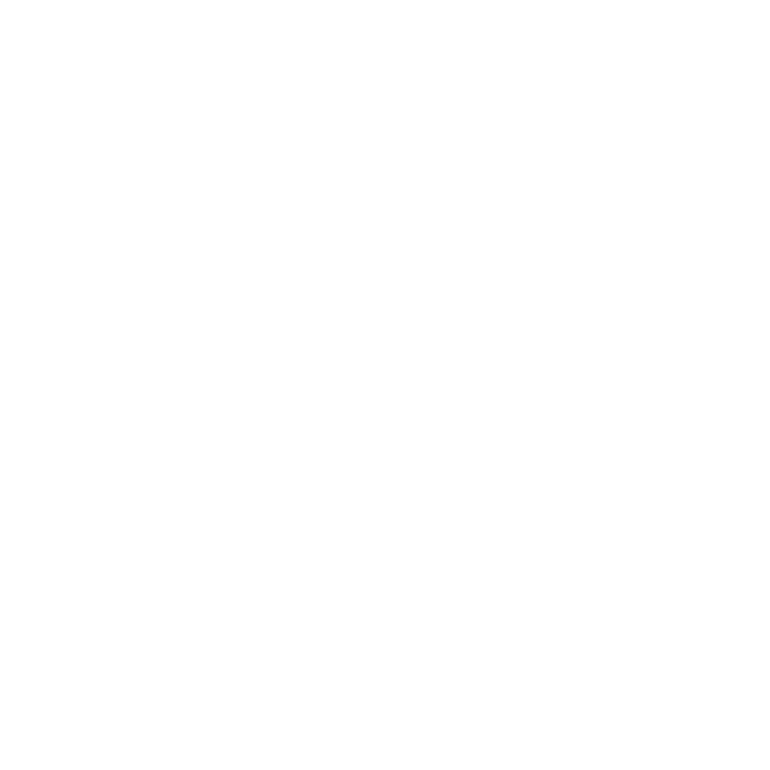

<IPython.core.display.Javascript object>


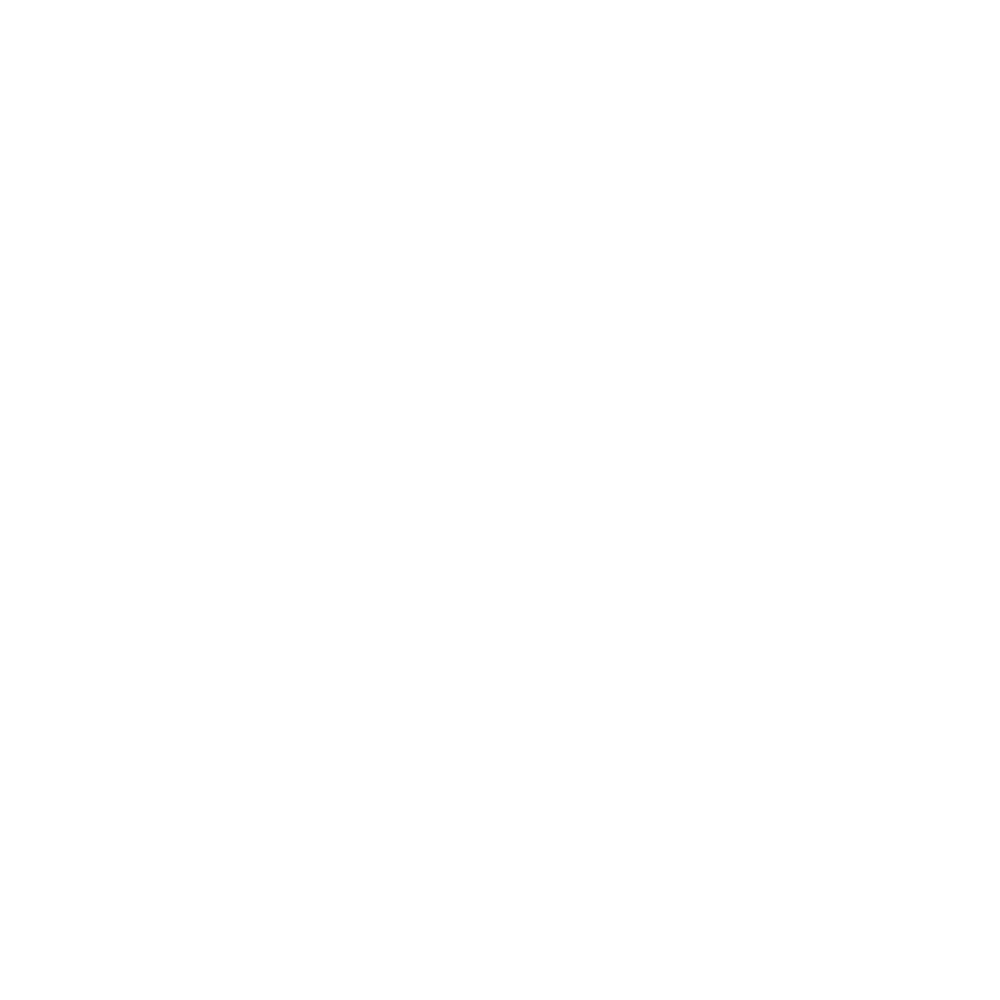

<IPython.core.display.Javascript object>


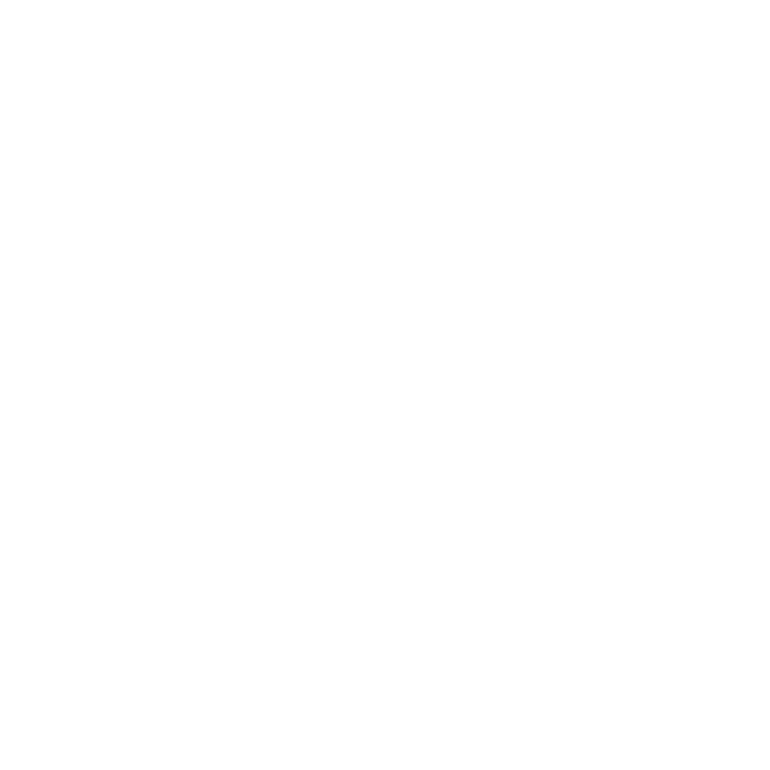

<IPython.core.display.Javascript object>


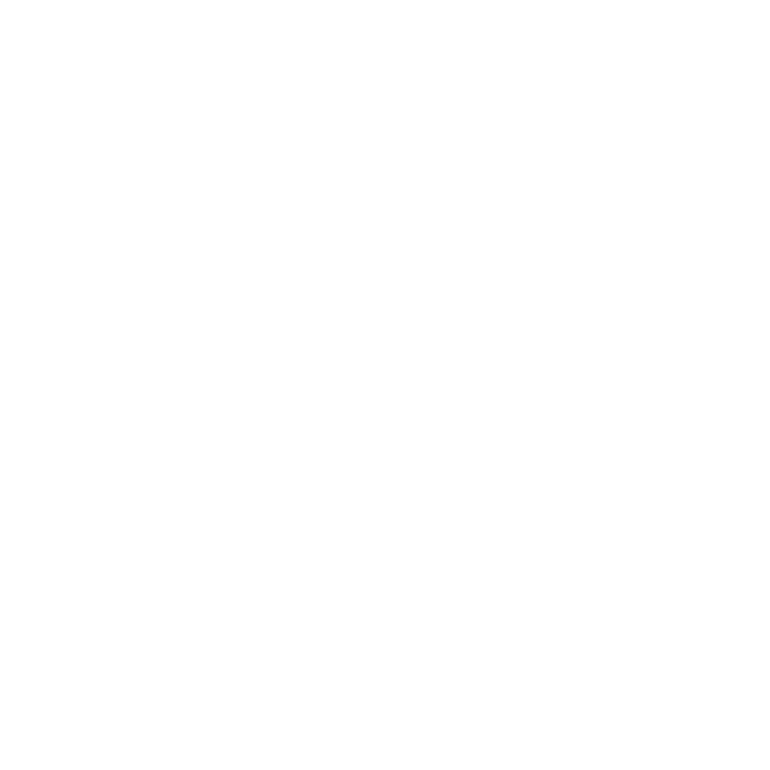

<IPython.core.display.Javascript object>


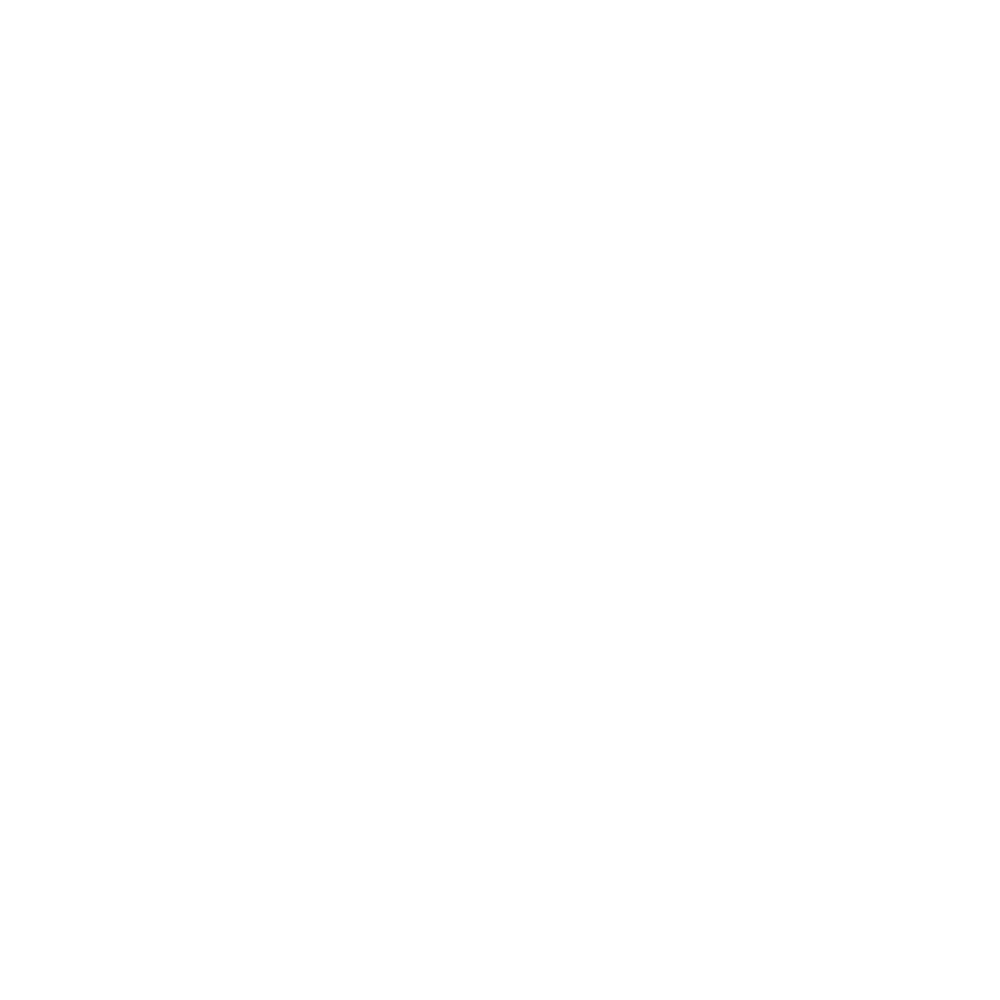

<IPython.core.display.Javascript object>


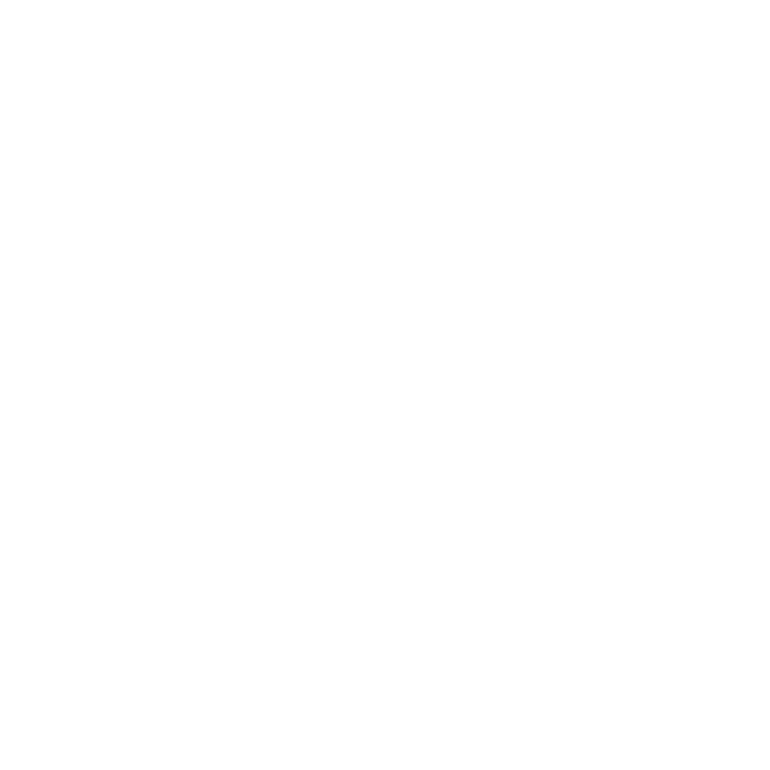

<IPython.core.display.Javascript object>


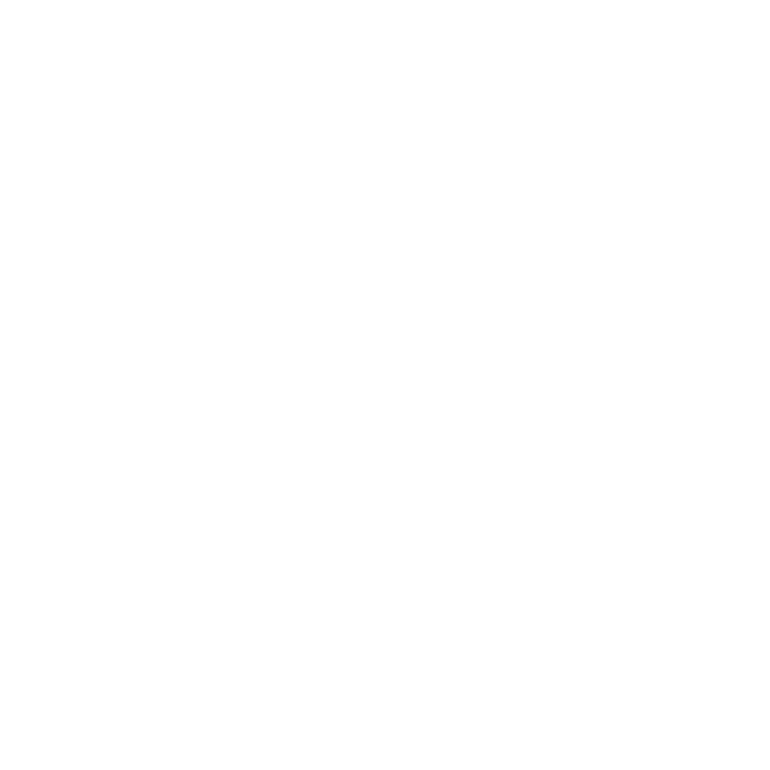

<IPython.core.display.Javascript object>


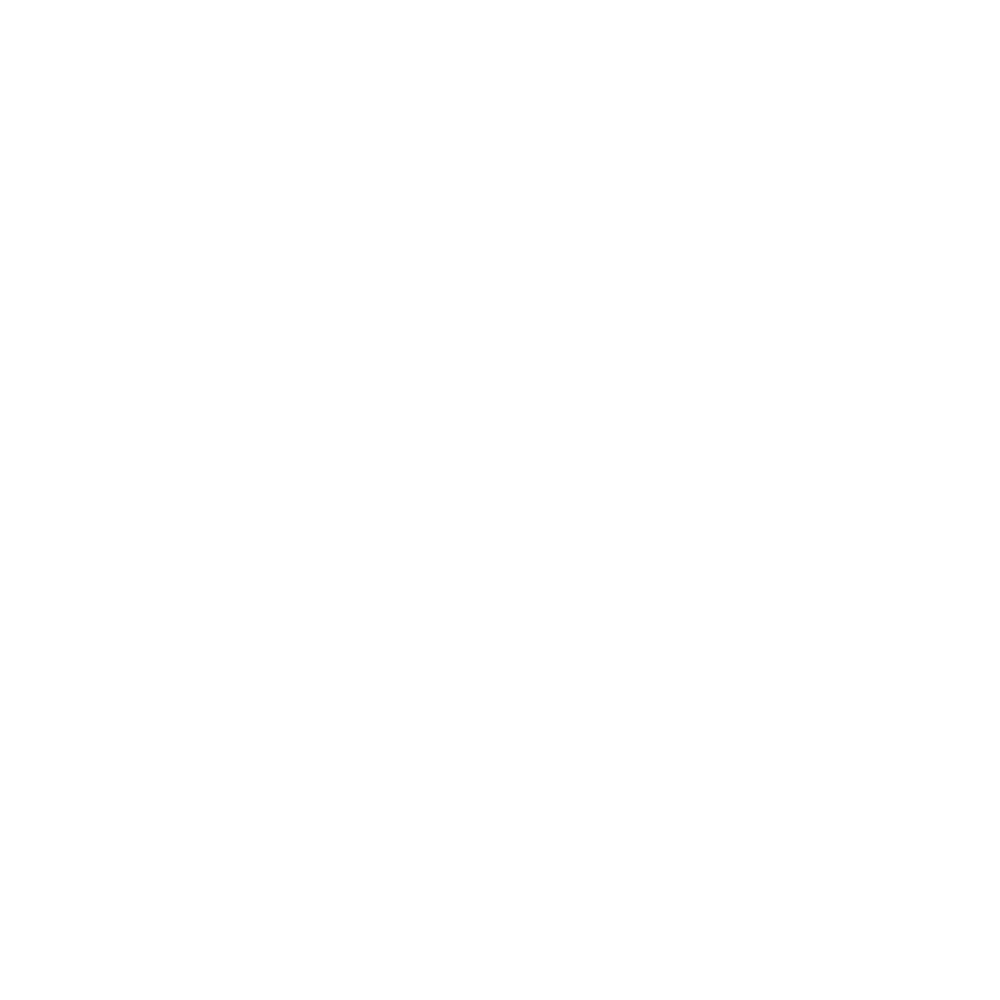

<IPython.core.display.Javascript object>


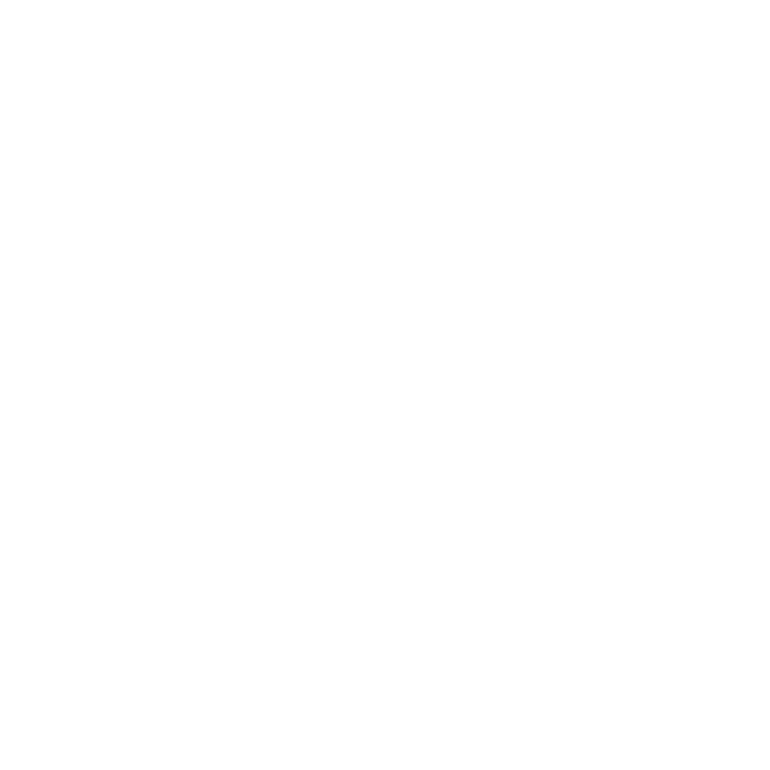

<IPython.core.display.Javascript object>


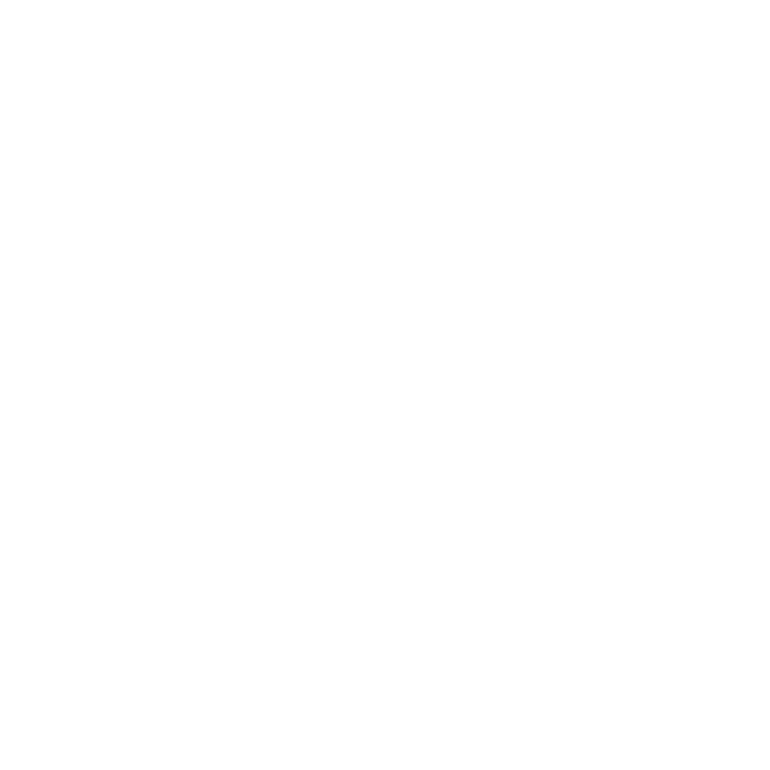

<IPython.core.display.Javascript object>


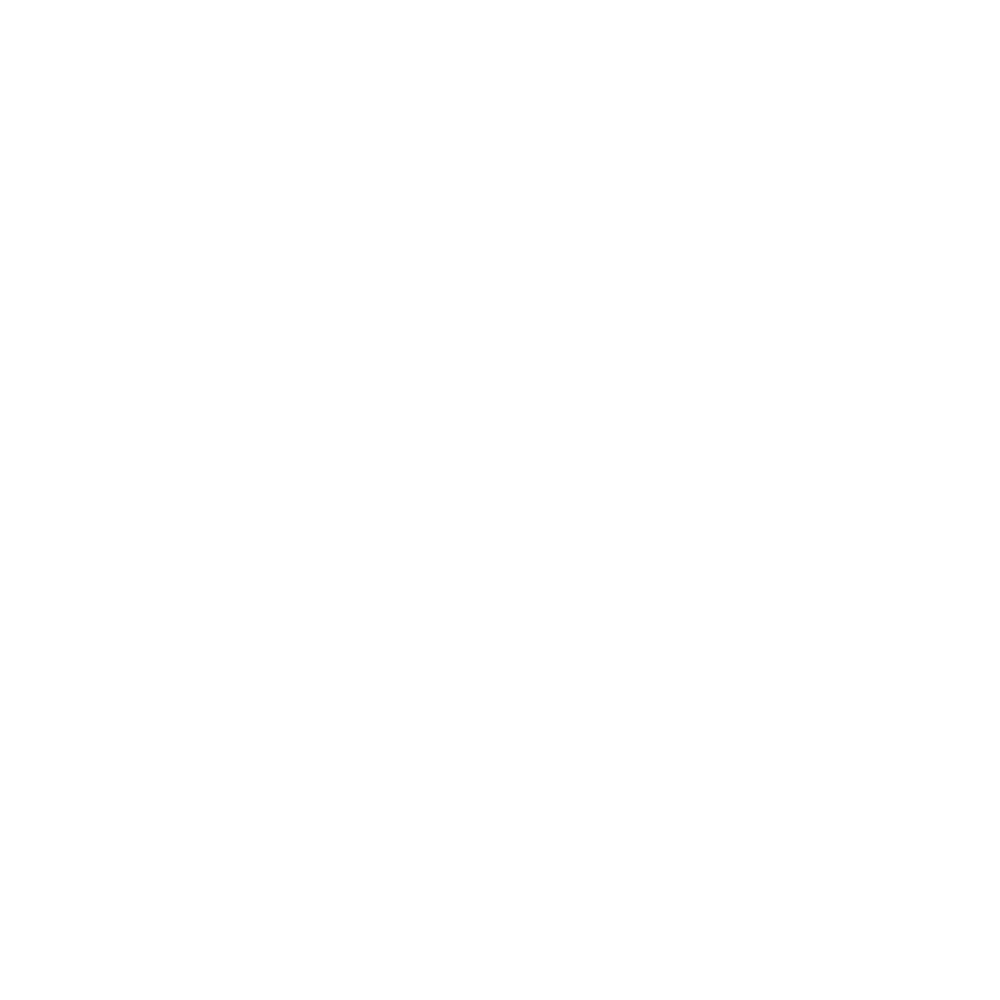

<IPython.core.display.Javascript object>


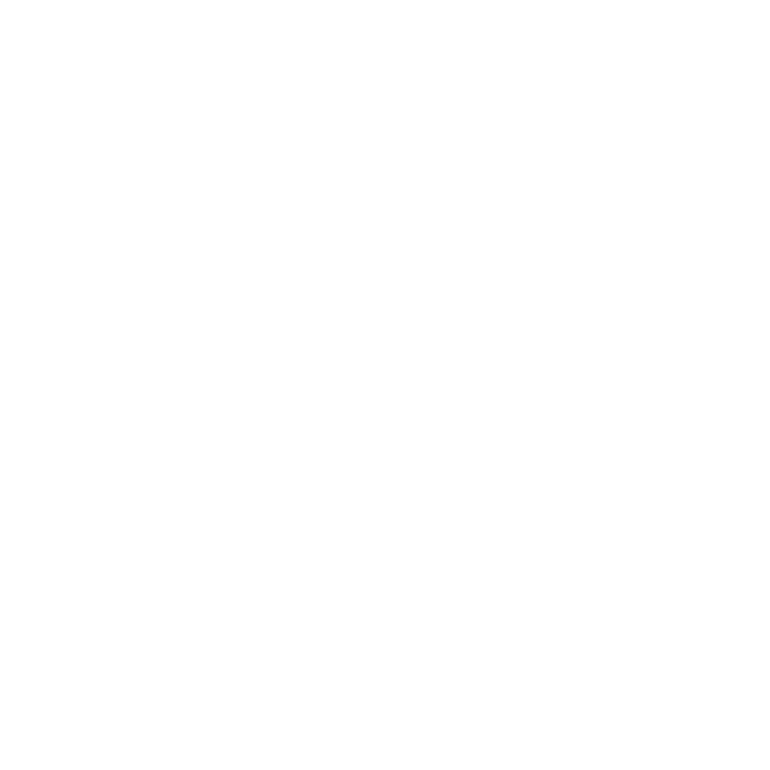

<IPython.core.display.Javascript object>


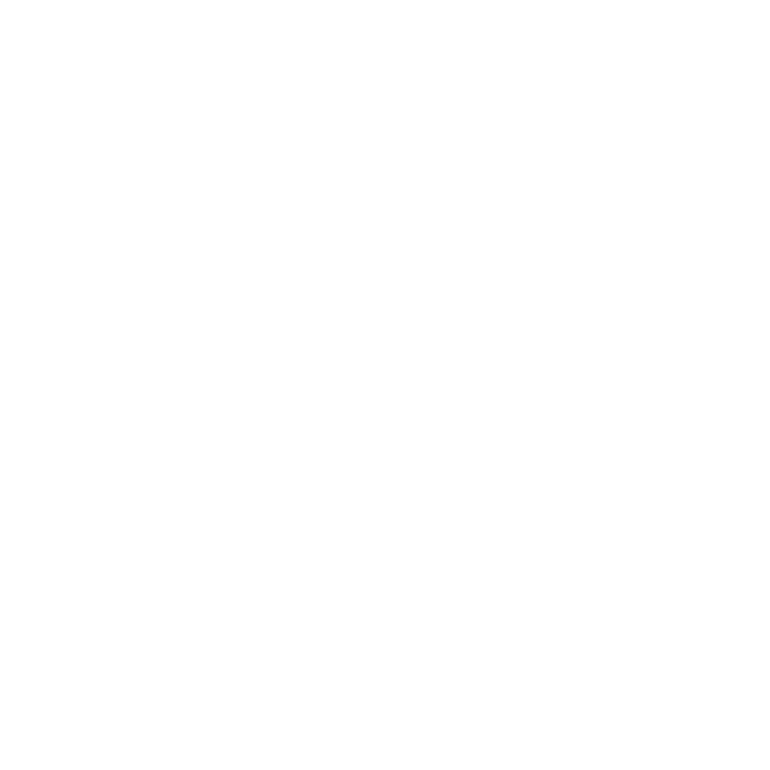

<IPython.core.display.Javascript object>


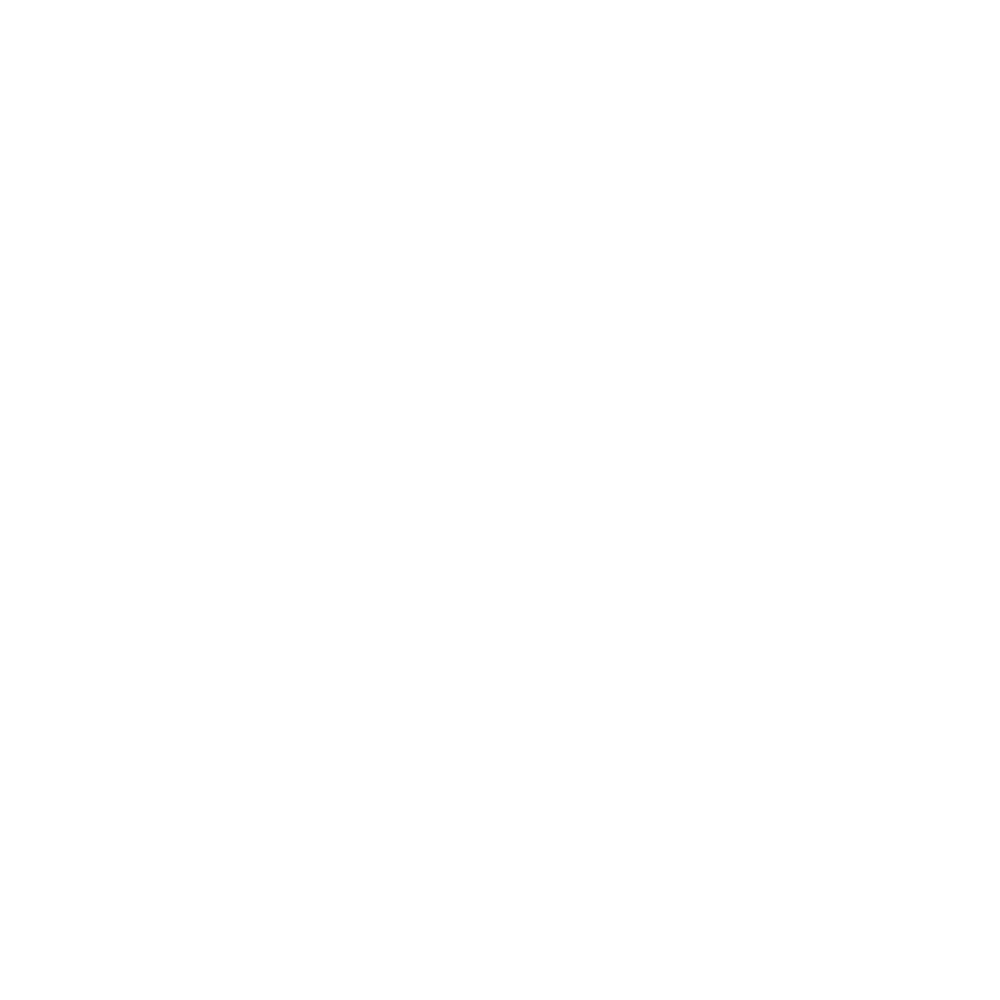

In [95]:
Monther = "Jun"
# setup stuff
PolyList = gpdJunDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdJunDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdJunDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdJunDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdJunDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdJunDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdJunDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


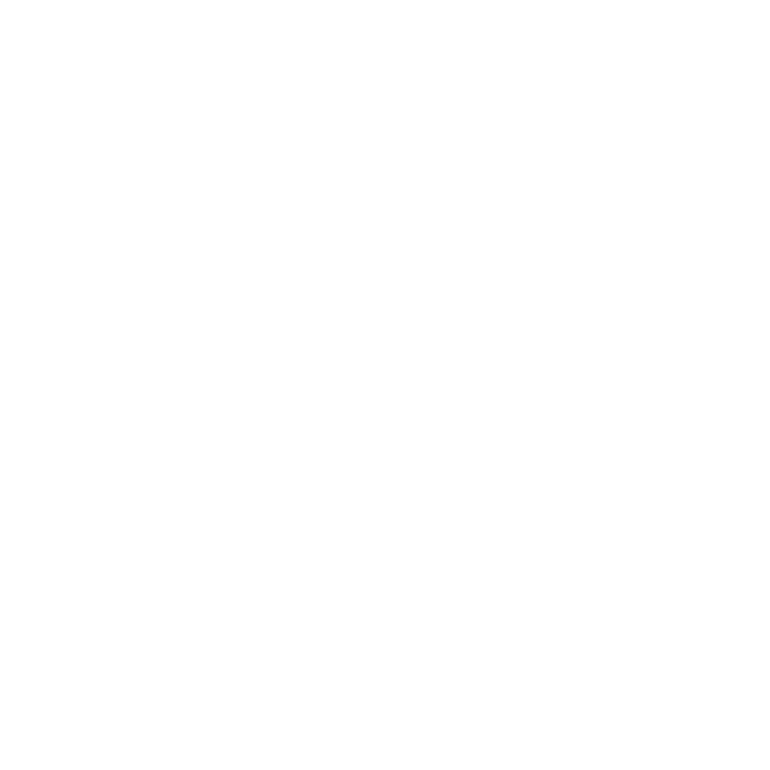

<IPython.core.display.Javascript object>


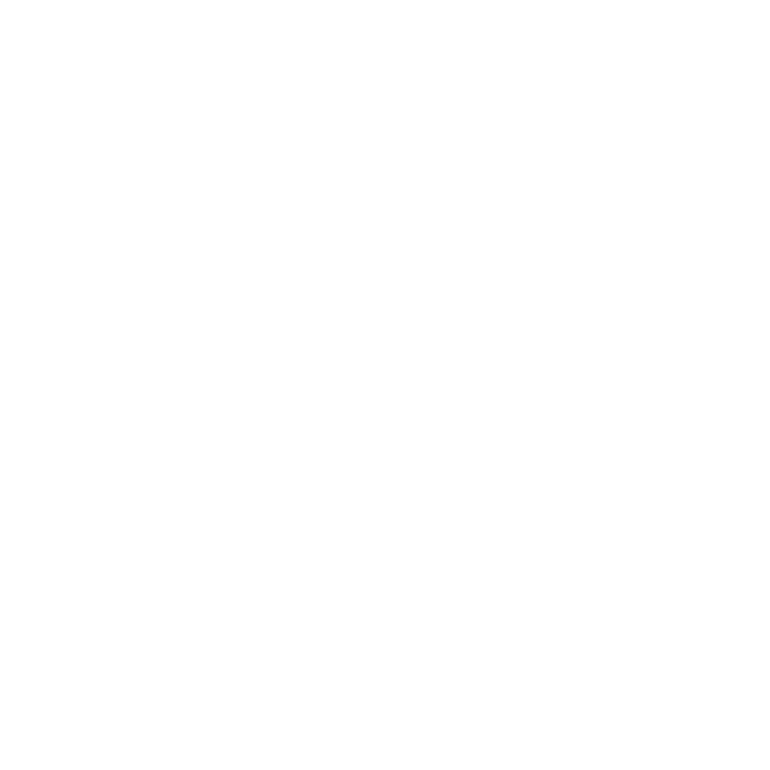

<IPython.core.display.Javascript object>


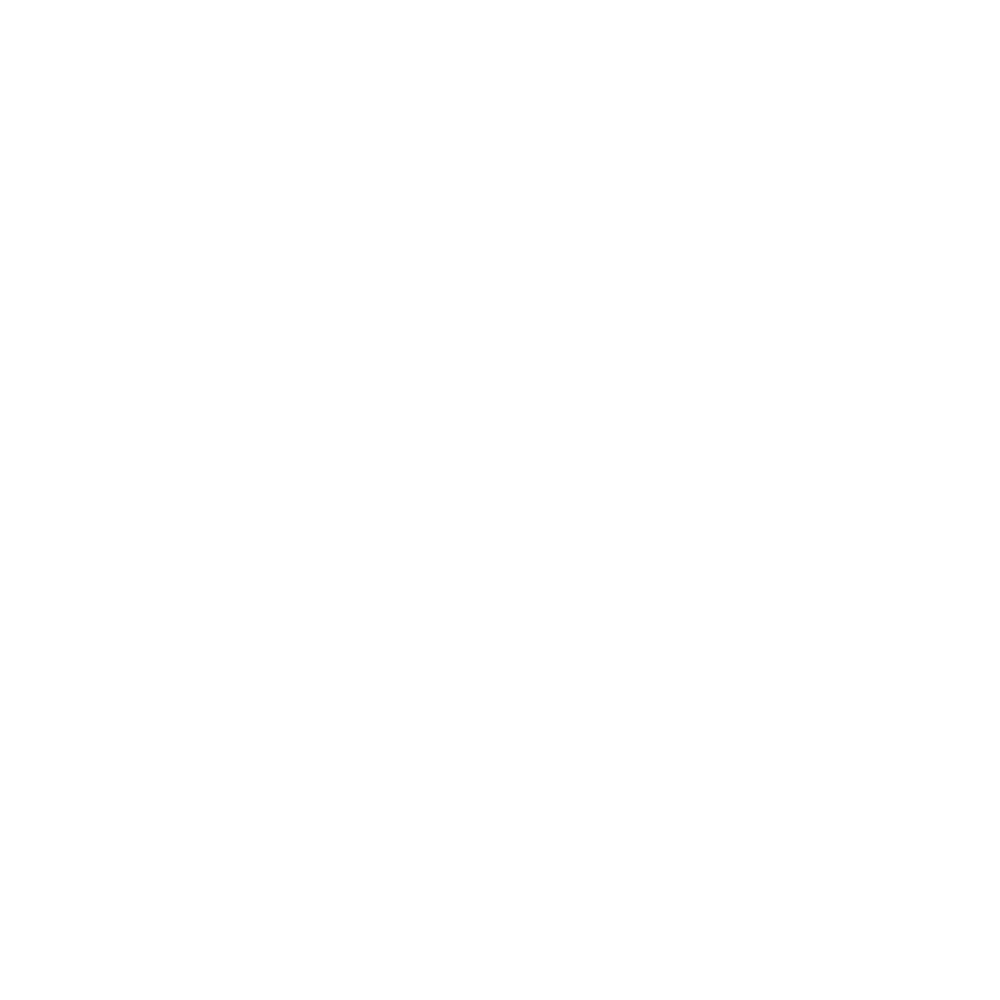

<IPython.core.display.Javascript object>


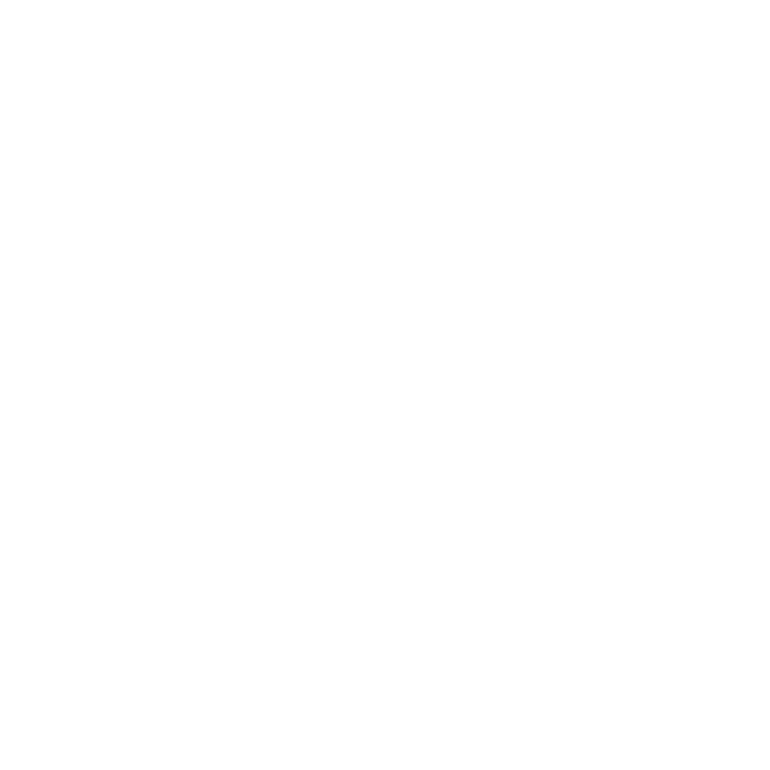

<IPython.core.display.Javascript object>


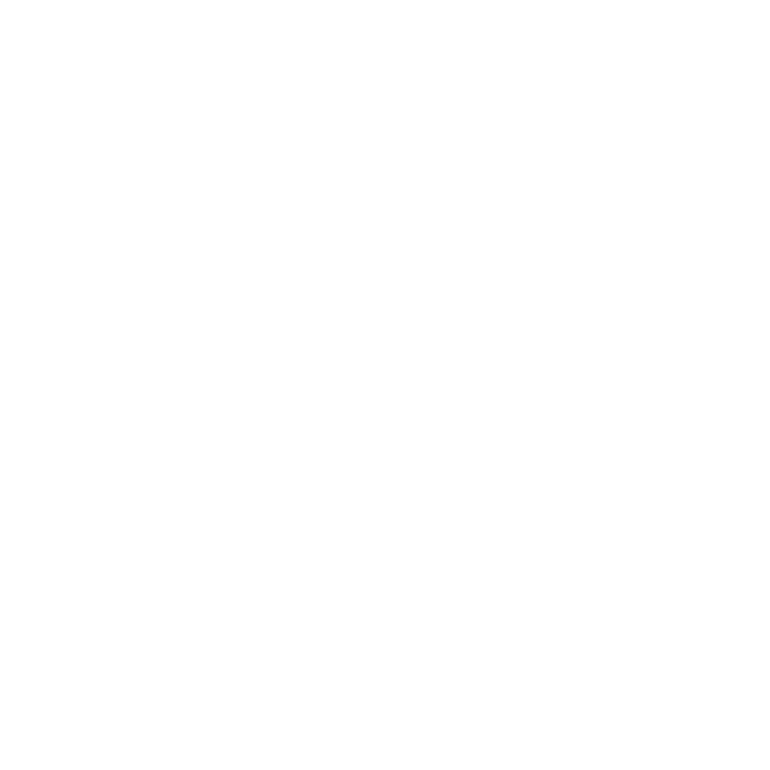

<IPython.core.display.Javascript object>


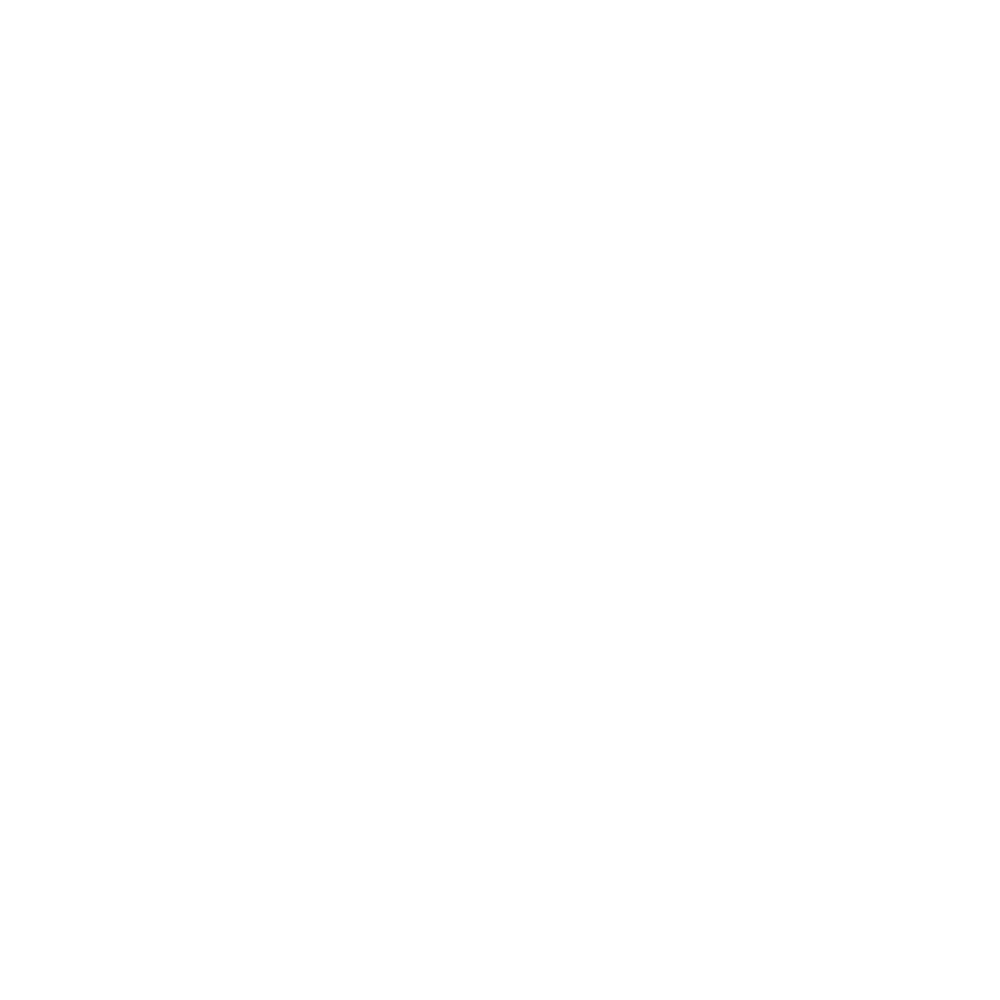

<IPython.core.display.Javascript object>


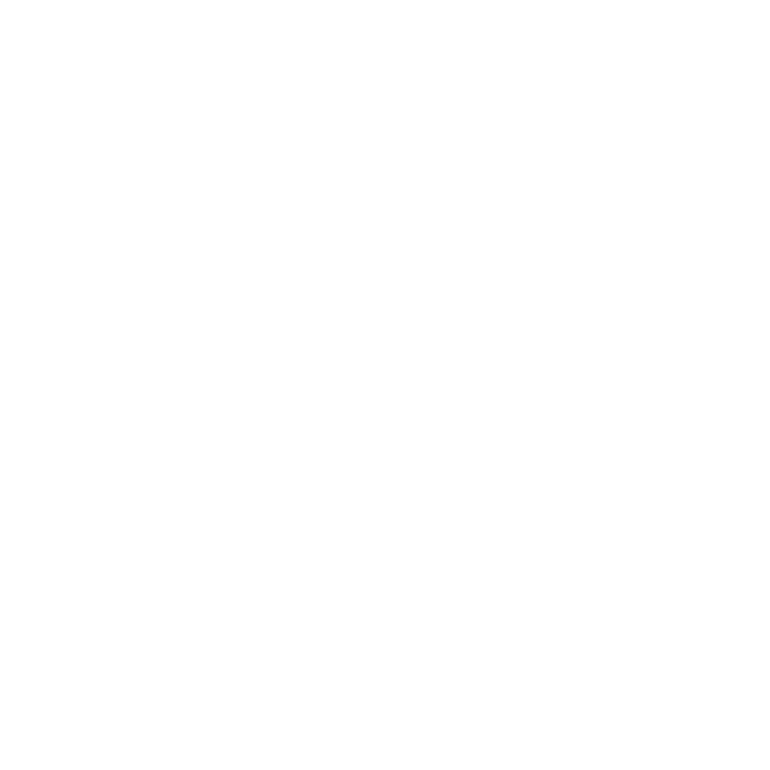

<IPython.core.display.Javascript object>


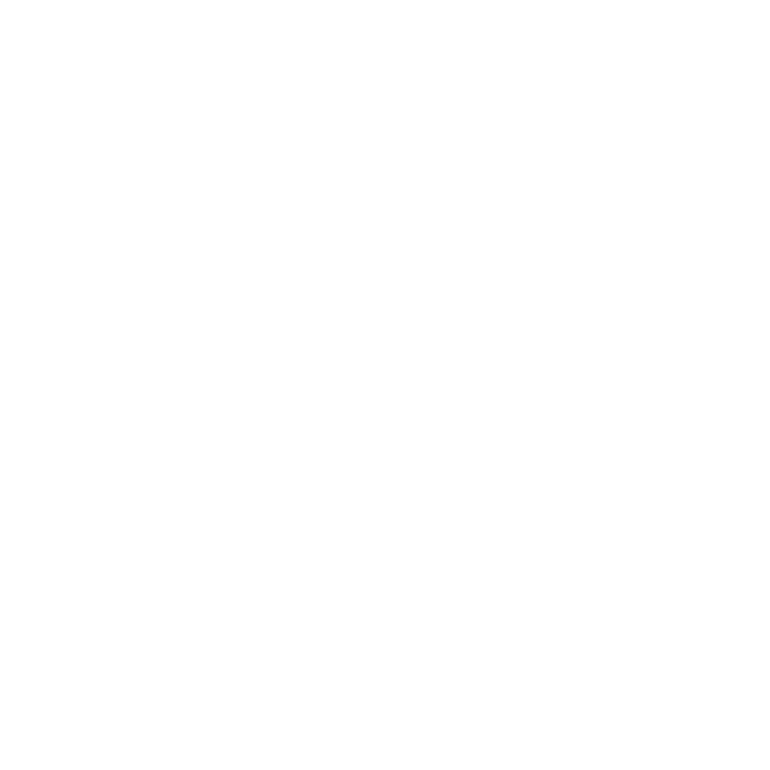

<IPython.core.display.Javascript object>


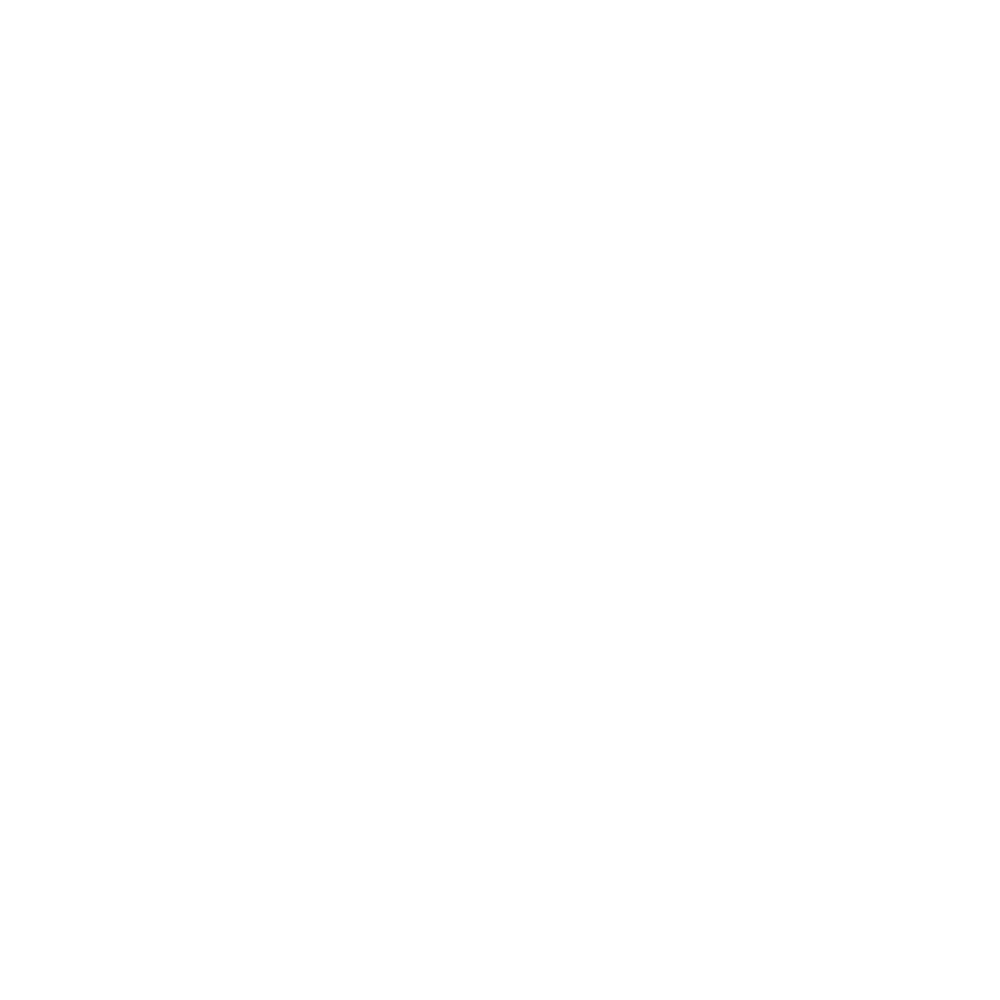

<IPython.core.display.Javascript object>


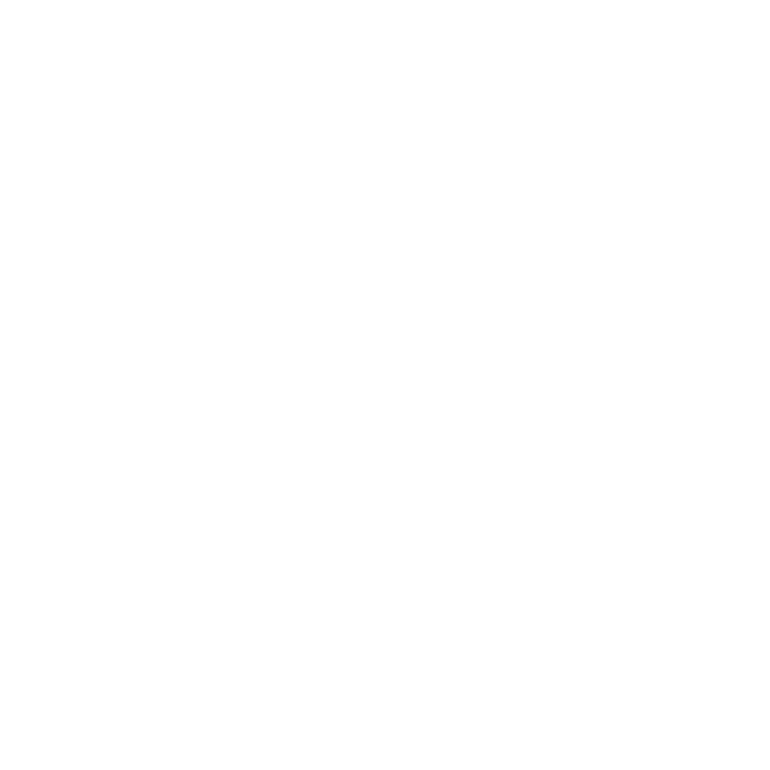

<IPython.core.display.Javascript object>


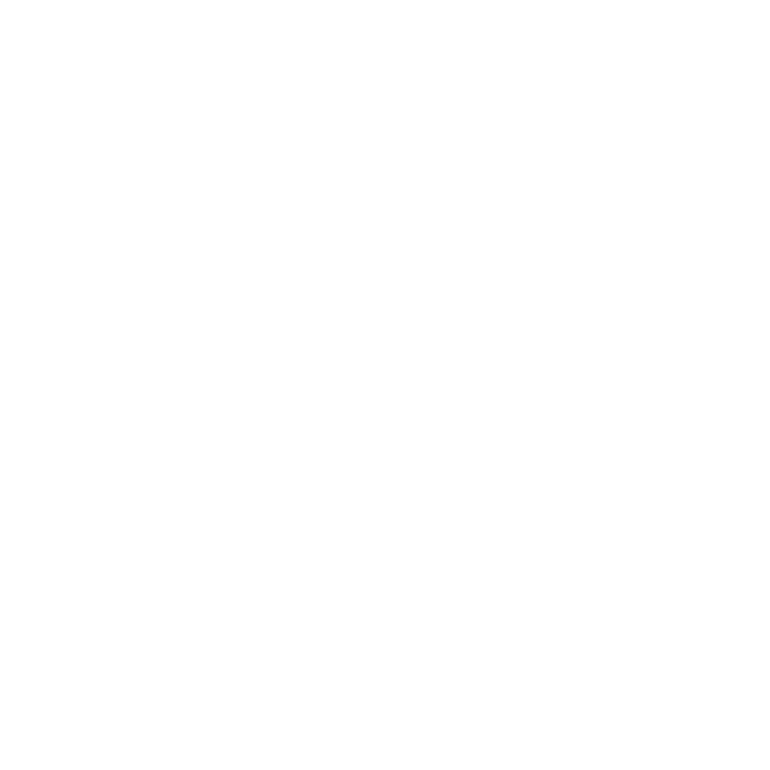

<IPython.core.display.Javascript object>


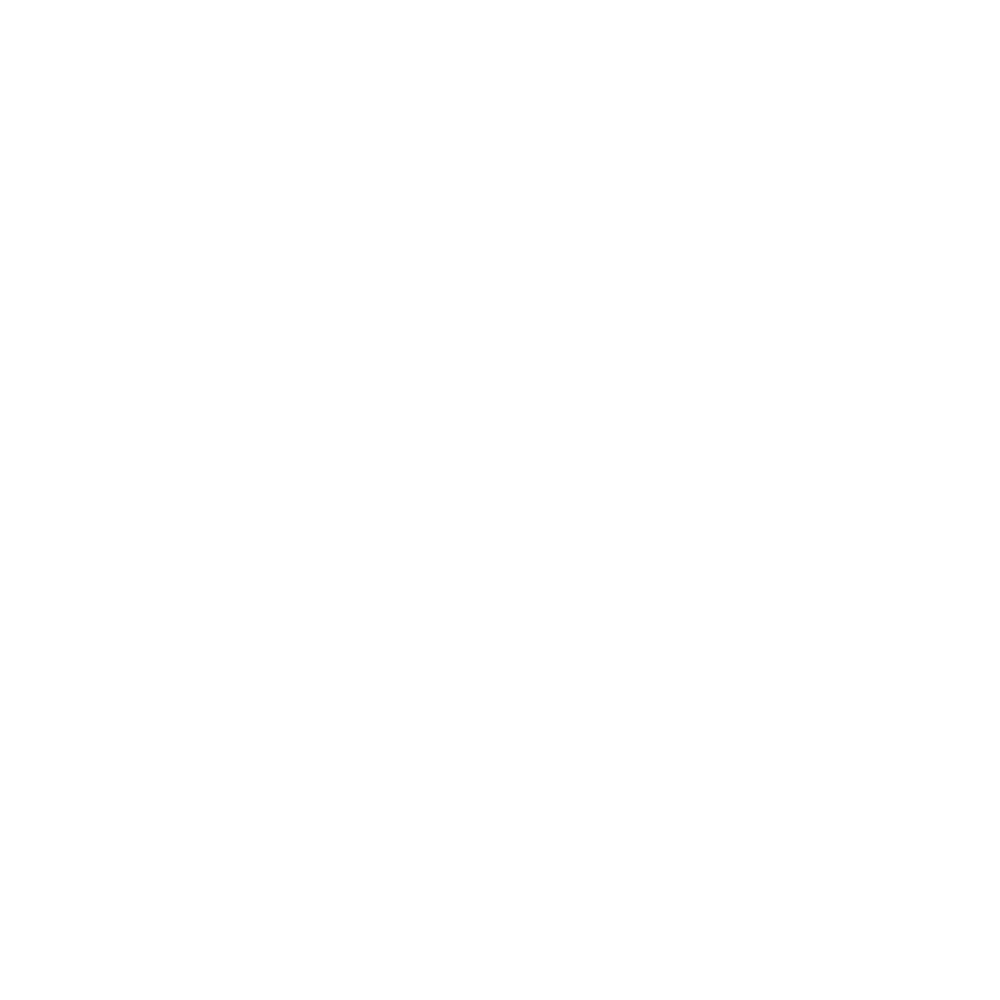

<IPython.core.display.Javascript object>


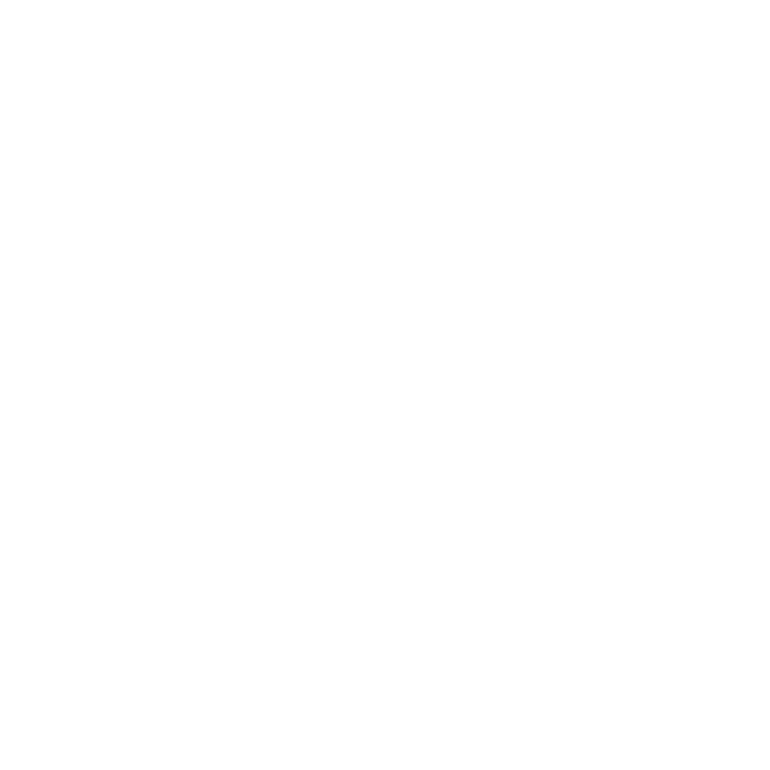

<IPython.core.display.Javascript object>


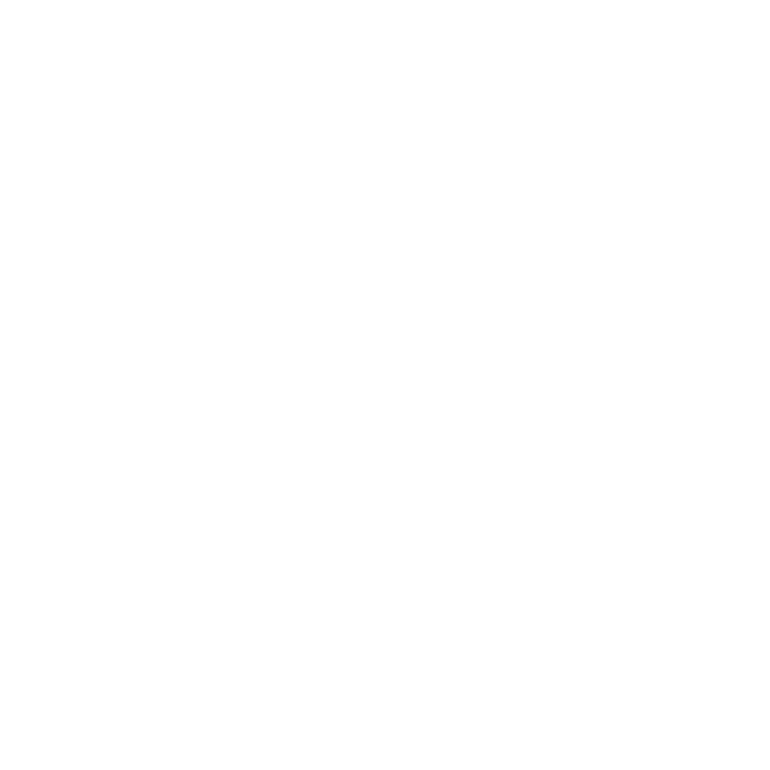

<IPython.core.display.Javascript object>


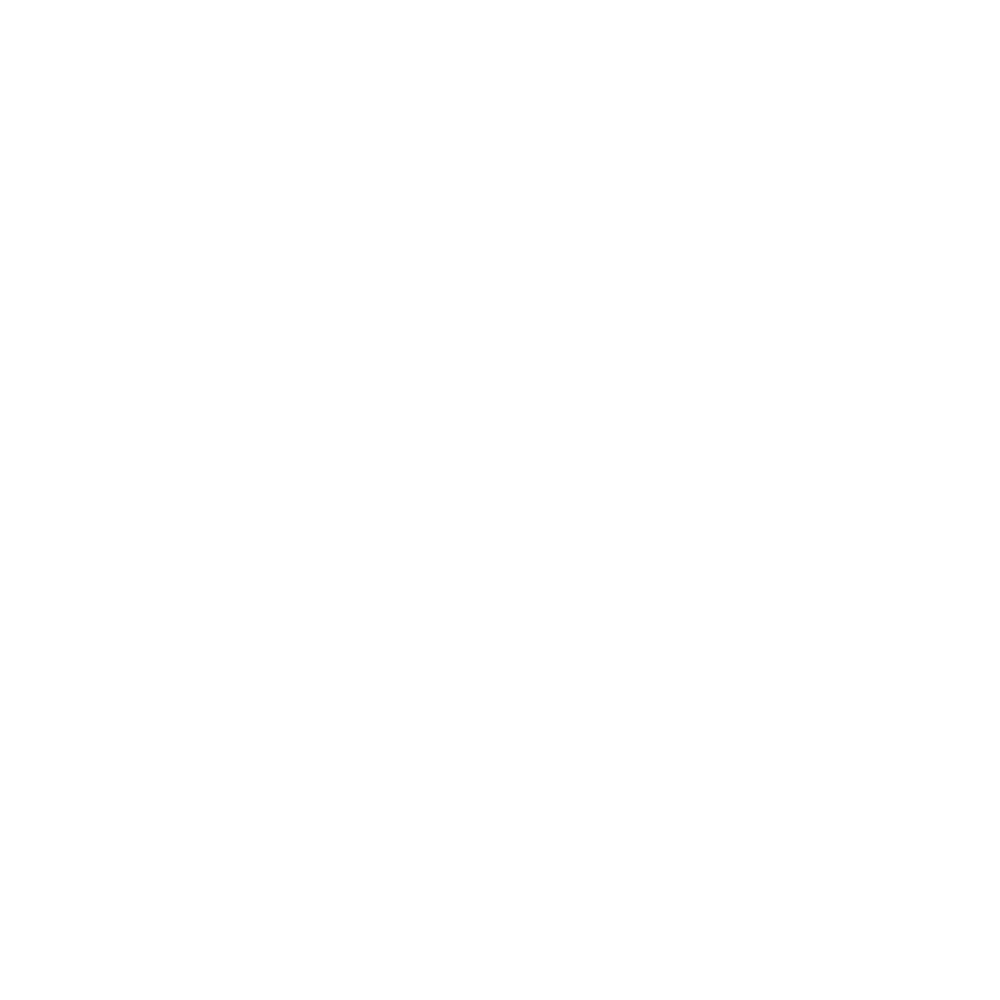

<IPython.core.display.Javascript object>


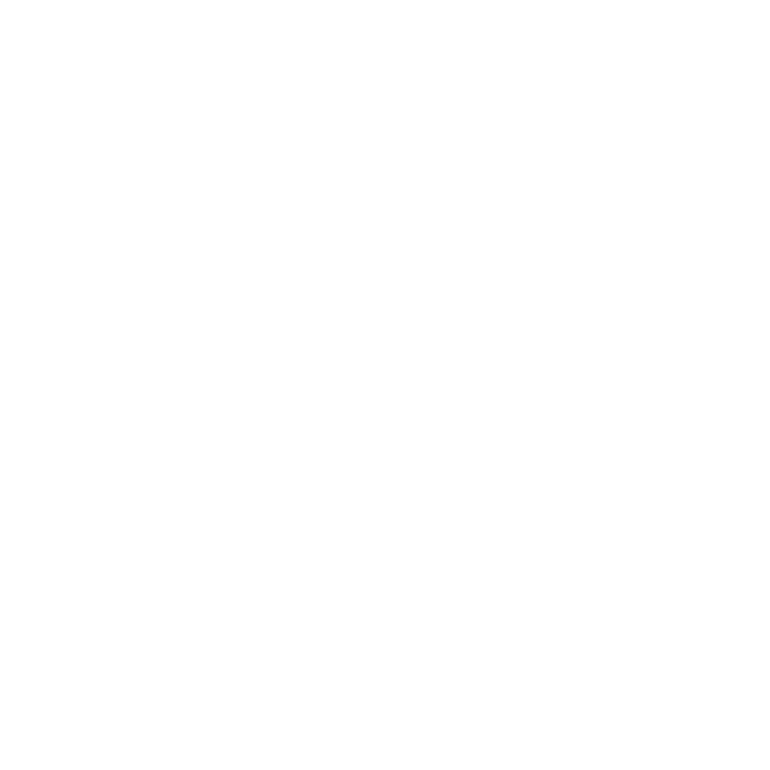

<IPython.core.display.Javascript object>


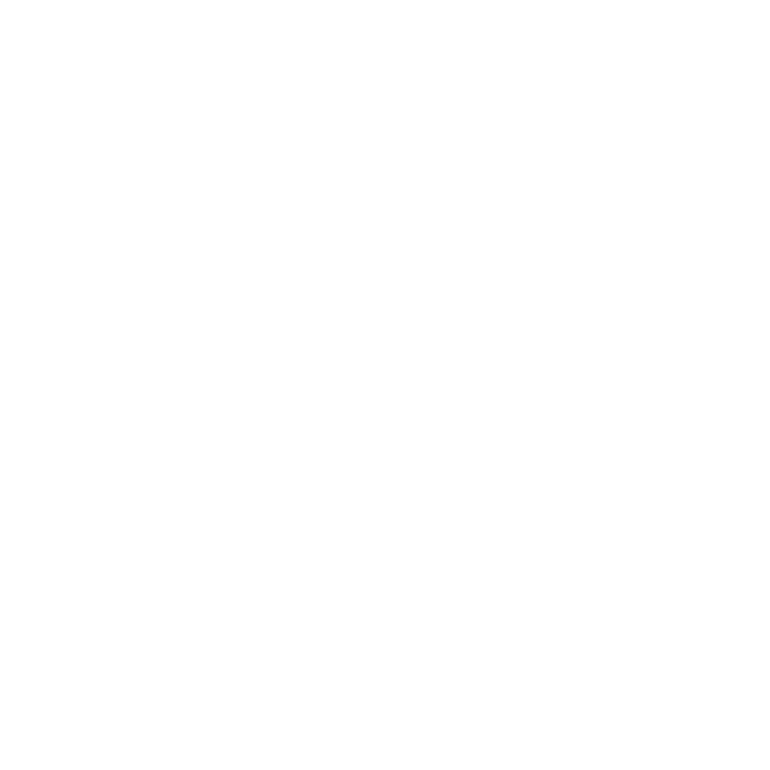

<IPython.core.display.Javascript object>


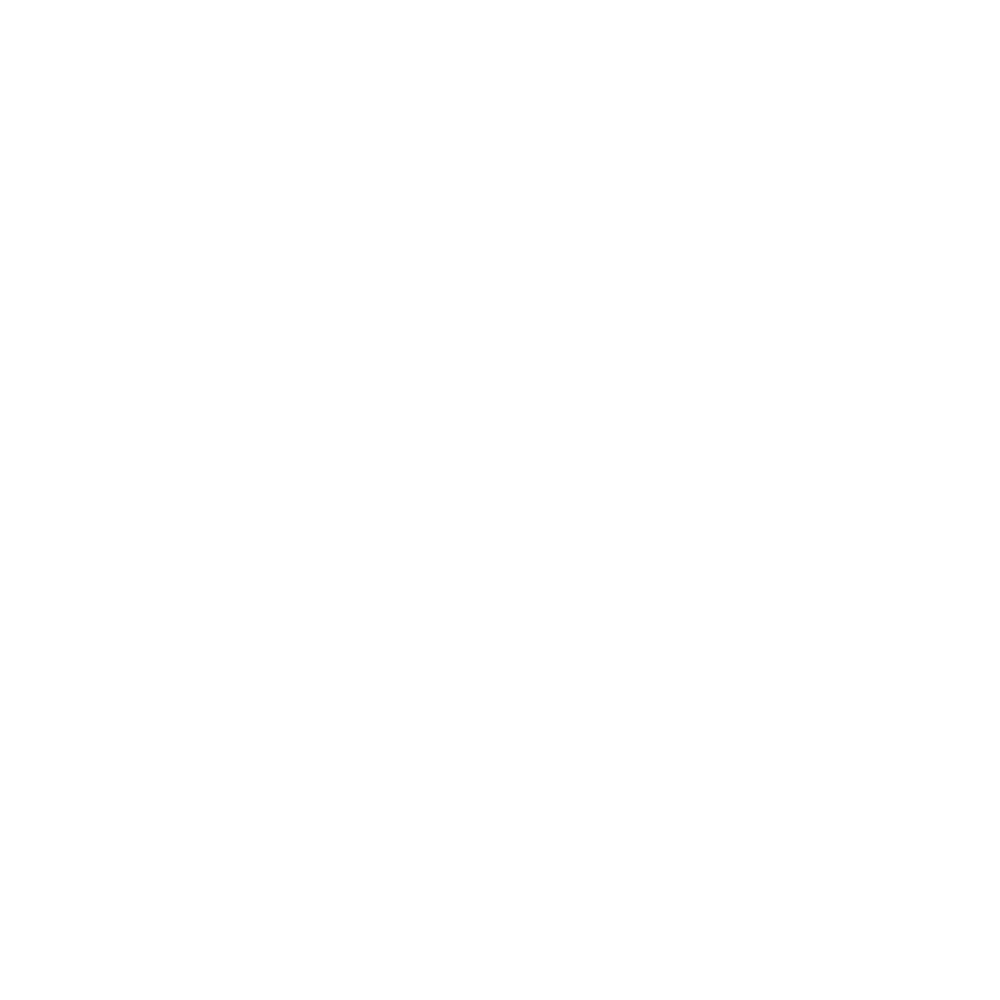

In [96]:
Monther = "Jul"
# setup stuff
PolyList = gpdJulDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdJulDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdJulDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdJulDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdJulDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdJulDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdJulDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


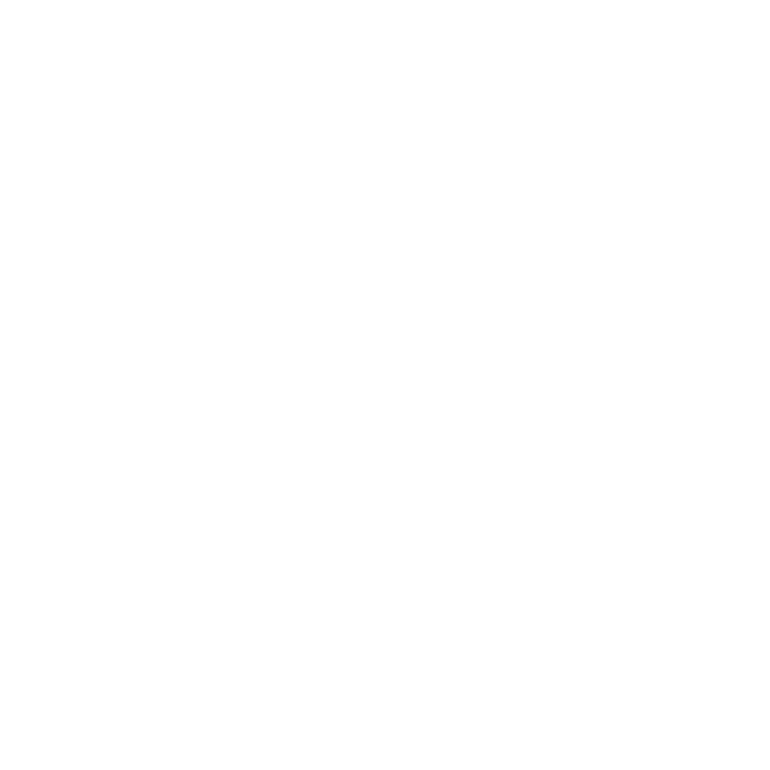

<IPython.core.display.Javascript object>


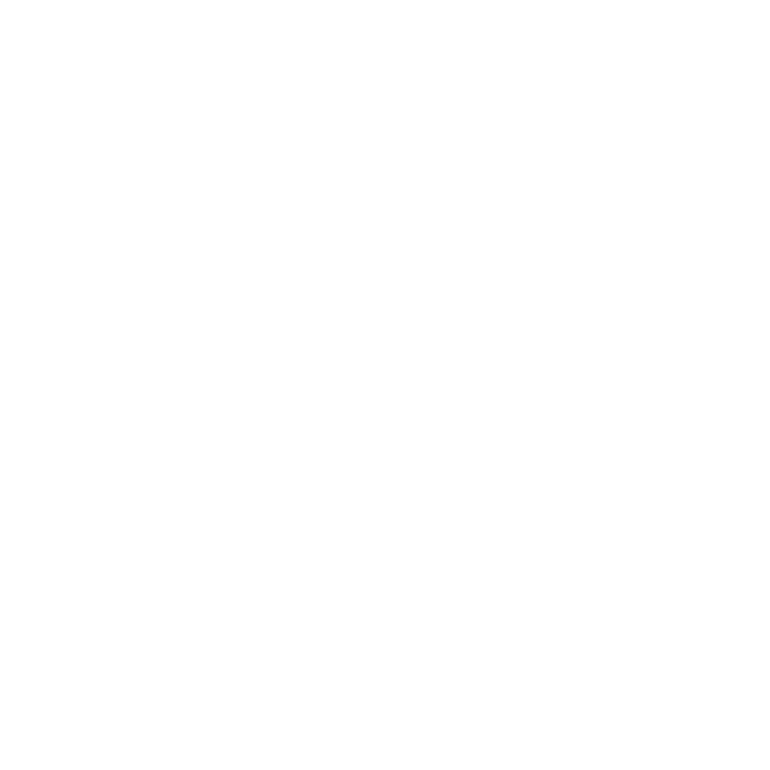

<IPython.core.display.Javascript object>


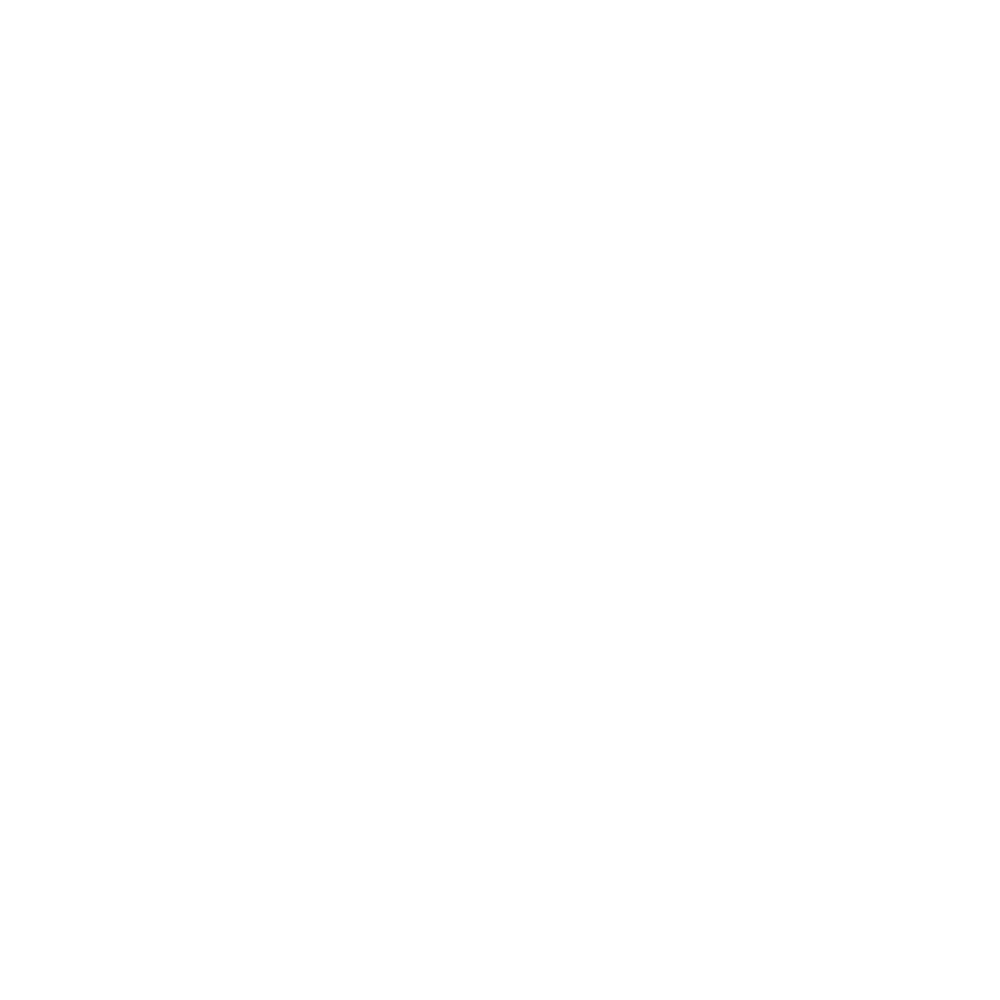

<IPython.core.display.Javascript object>


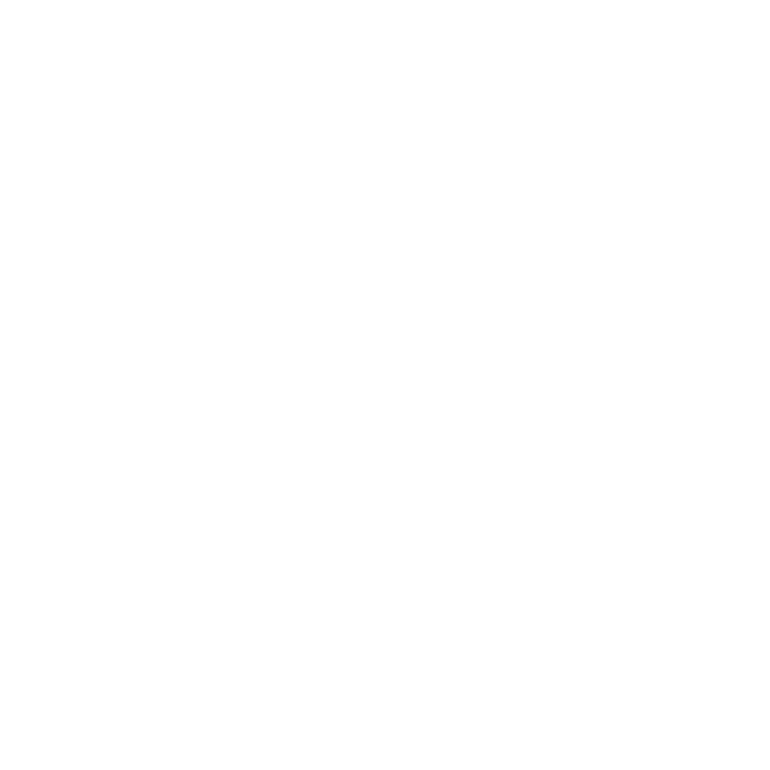

<IPython.core.display.Javascript object>


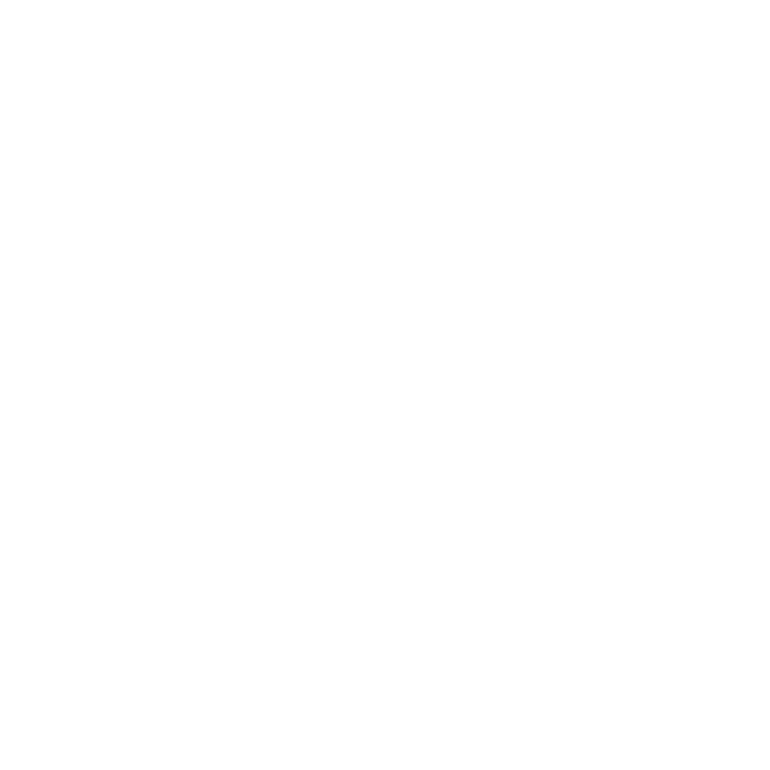

<IPython.core.display.Javascript object>


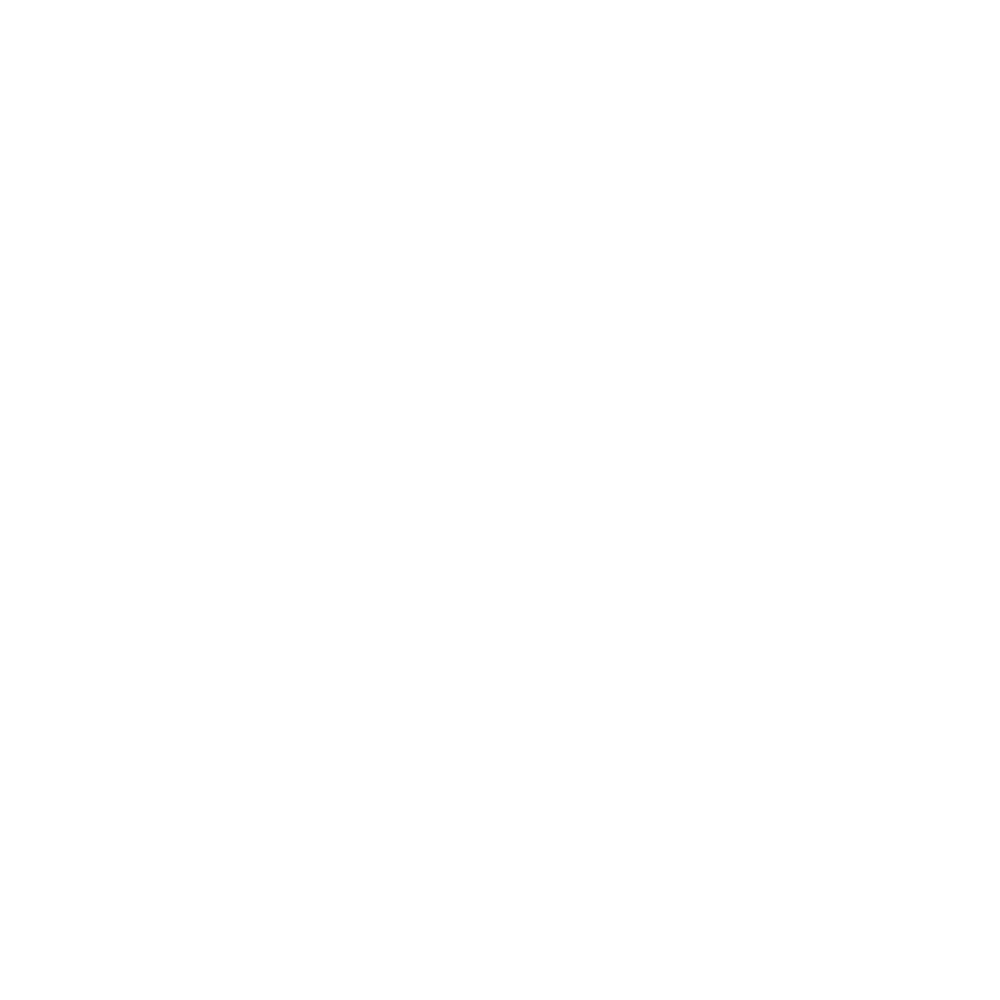

<IPython.core.display.Javascript object>


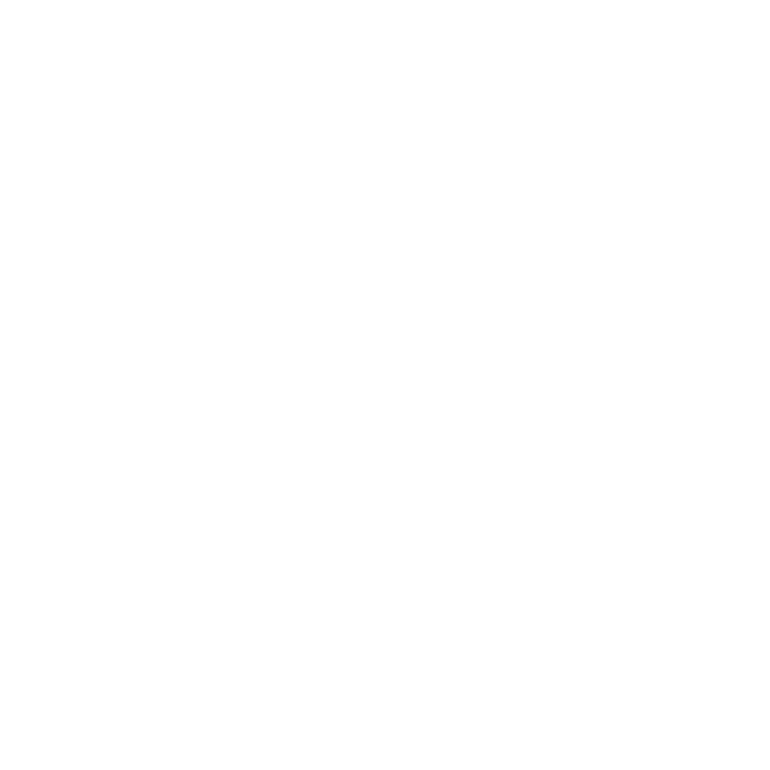

<IPython.core.display.Javascript object>


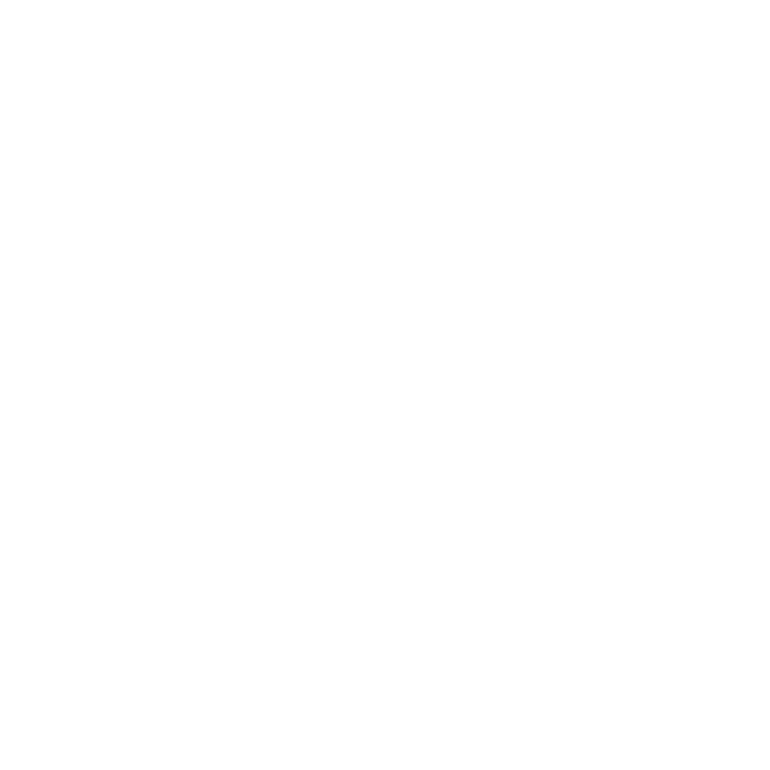

<IPython.core.display.Javascript object>


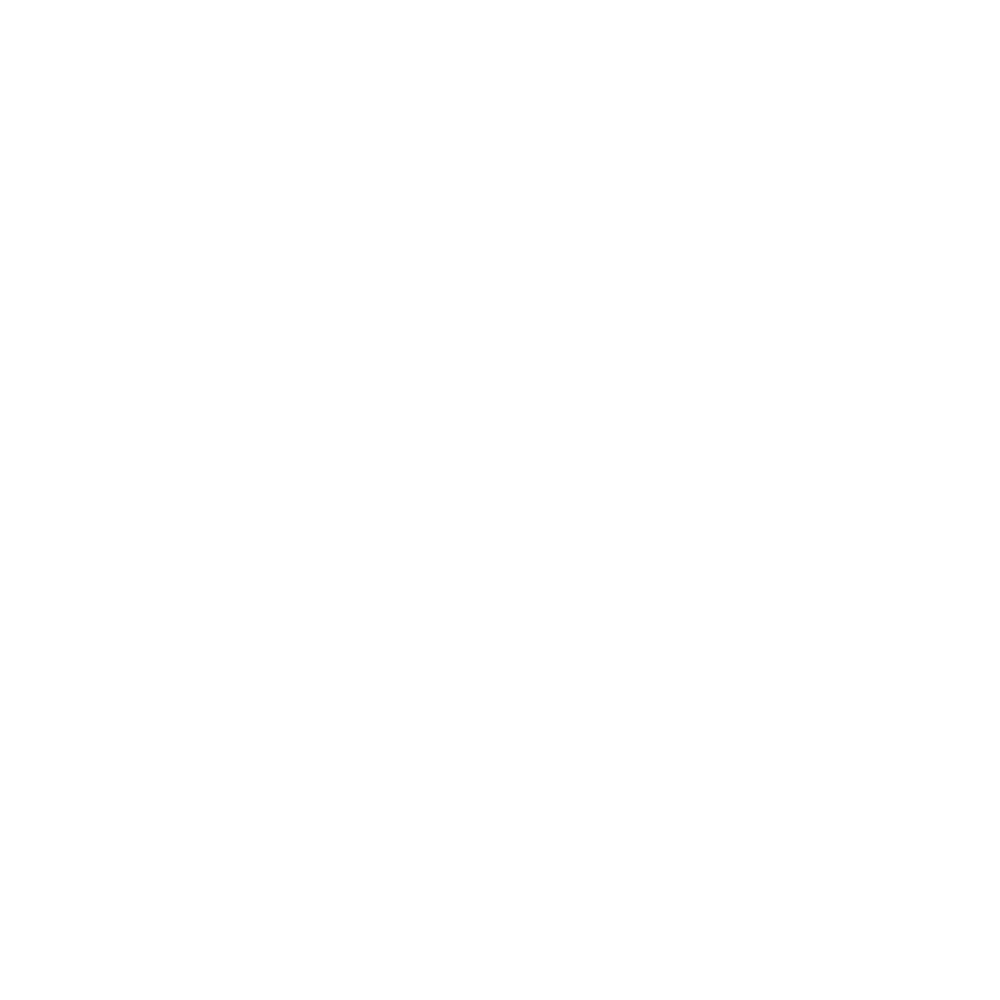

<IPython.core.display.Javascript object>


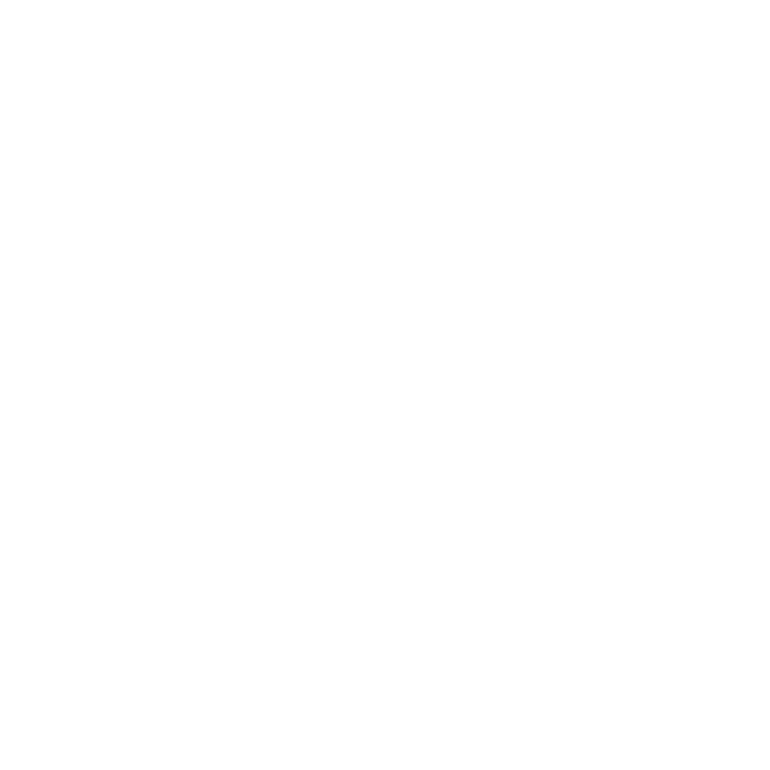

<IPython.core.display.Javascript object>


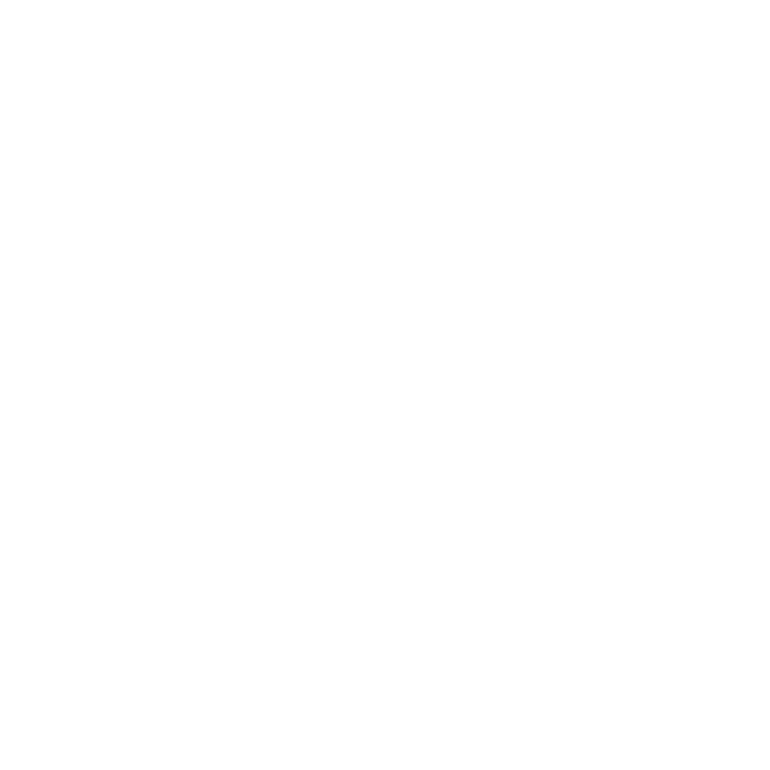

<IPython.core.display.Javascript object>


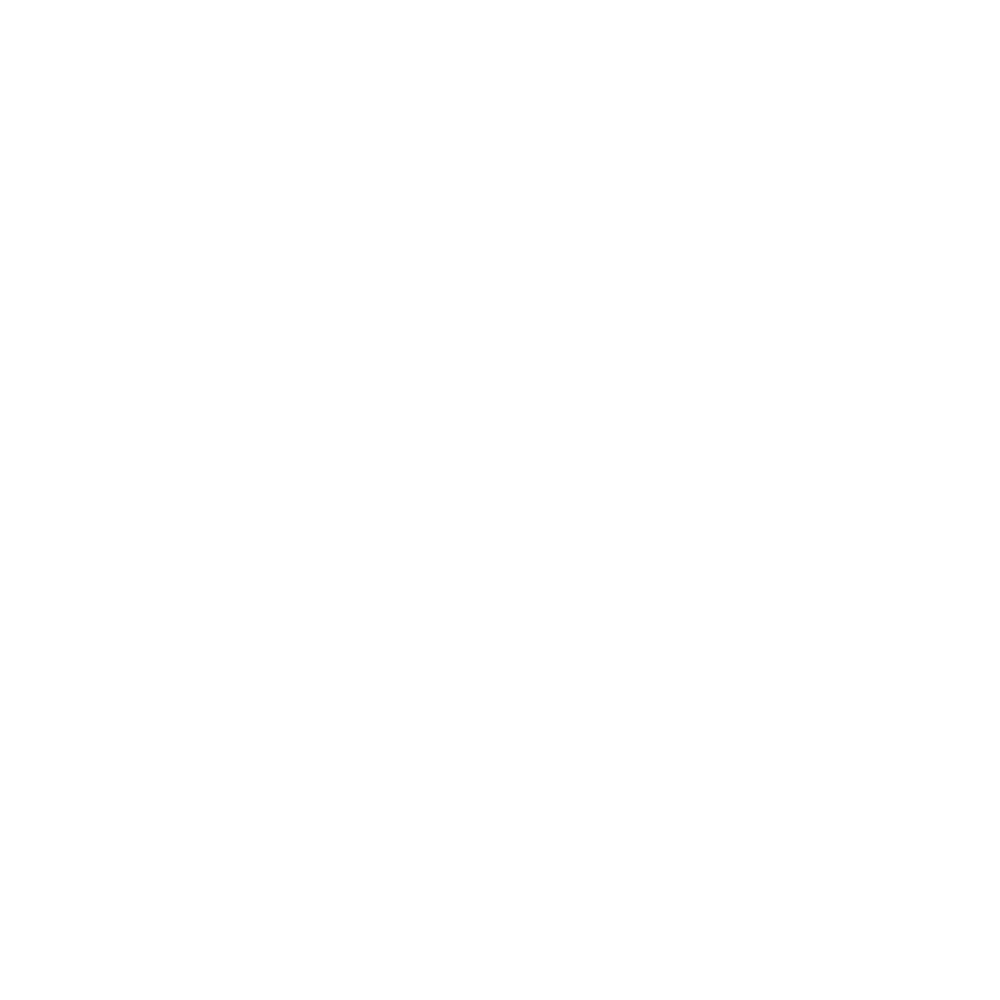

<IPython.core.display.Javascript object>


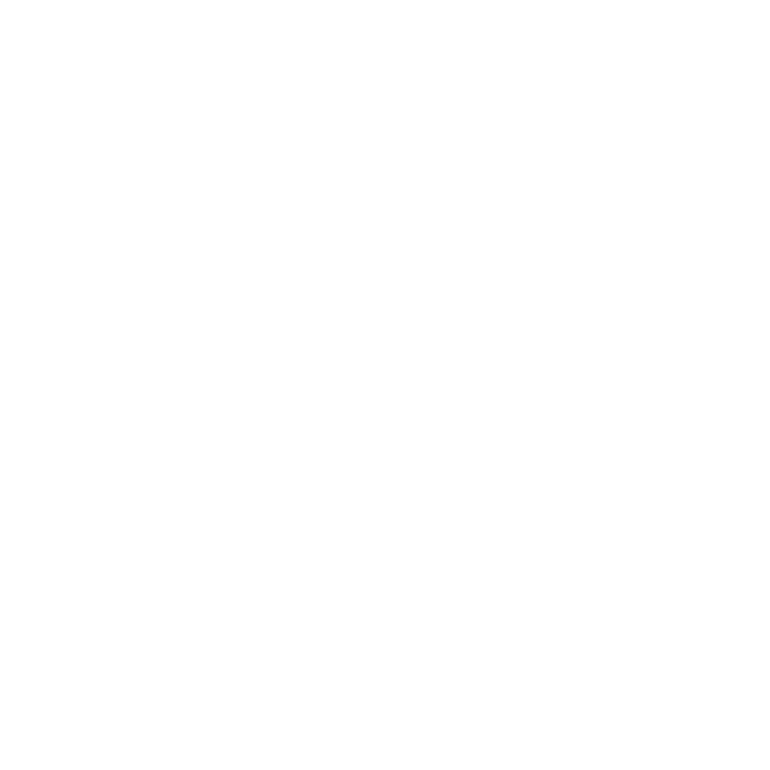

<IPython.core.display.Javascript object>


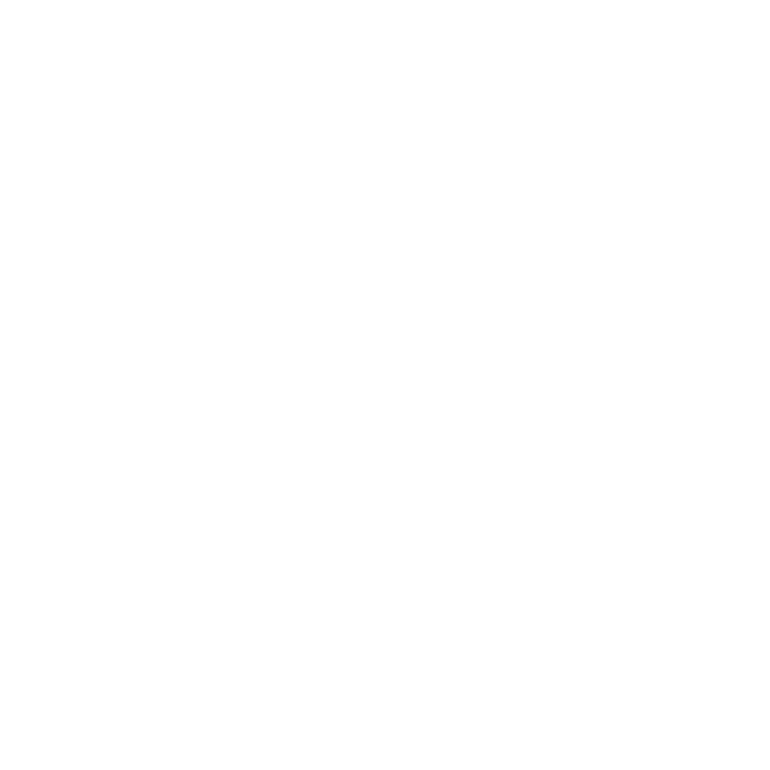

<IPython.core.display.Javascript object>


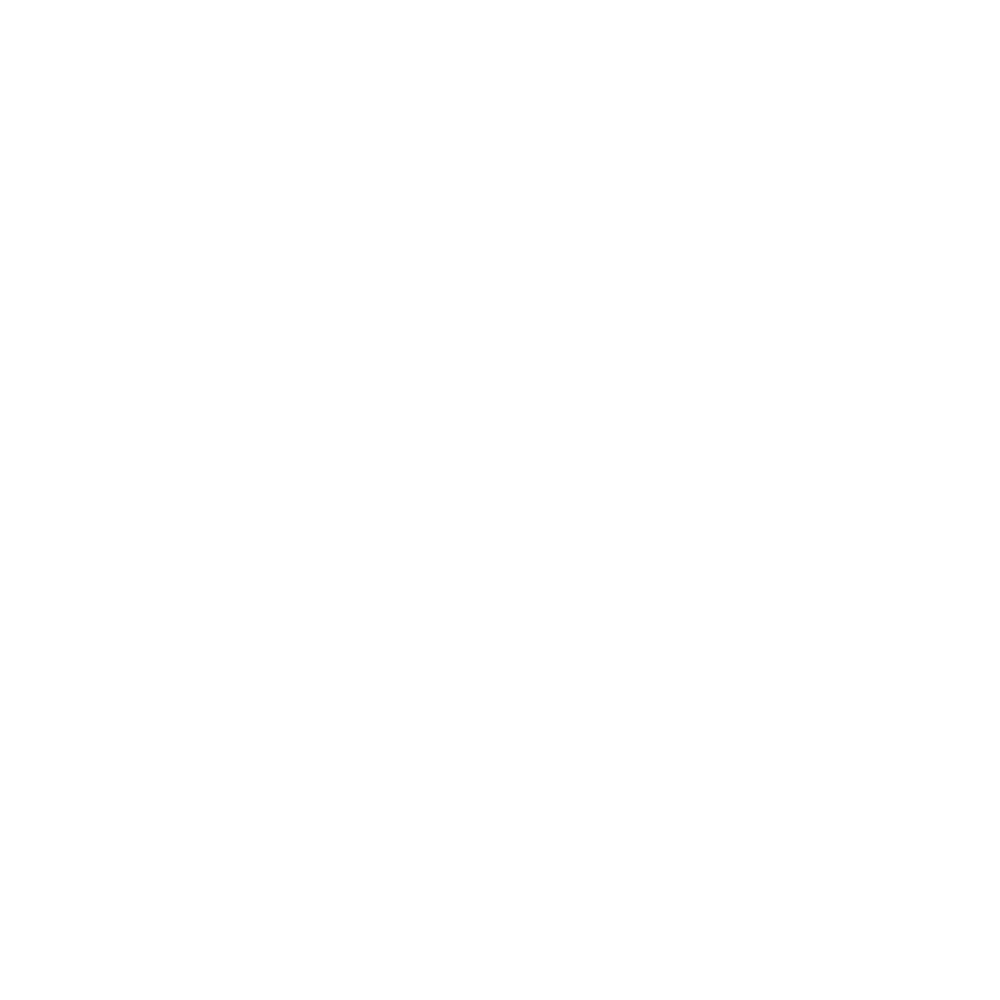

<IPython.core.display.Javascript object>


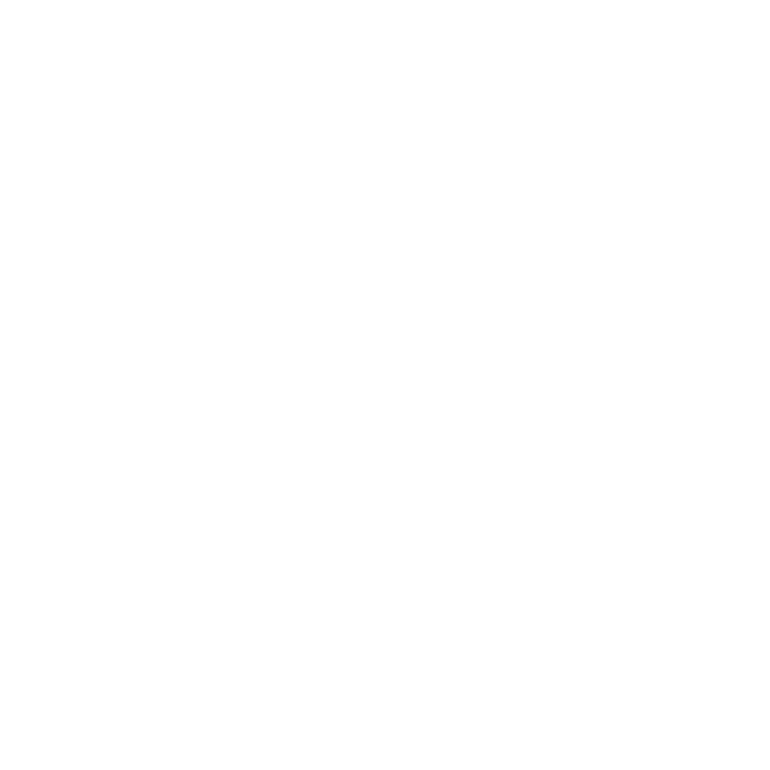

<IPython.core.display.Javascript object>


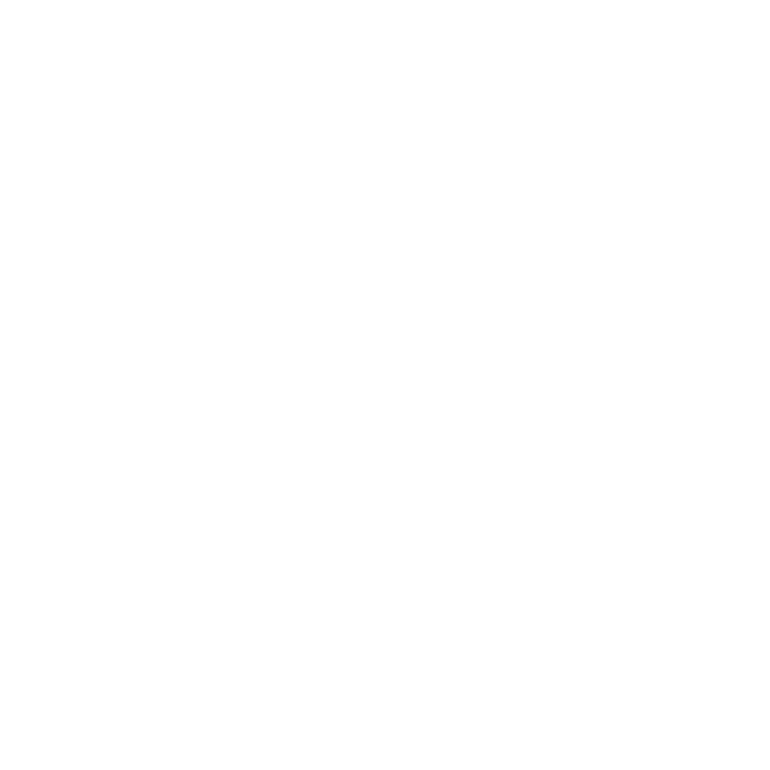

<IPython.core.display.Javascript object>


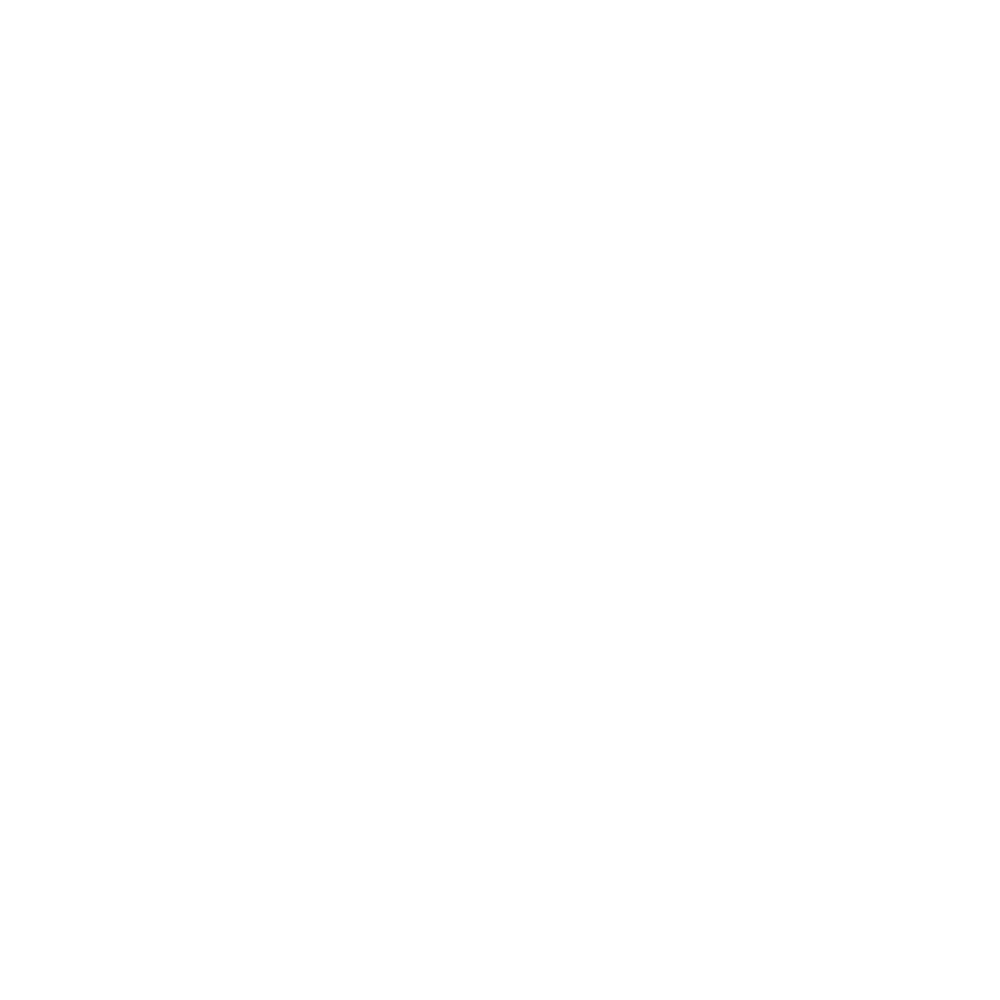

In [97]:
Monther = "Aug"
# setup stuff
PolyList = gpdAugDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdAugDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdAugDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdAugDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdAugDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdAugDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdAugDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


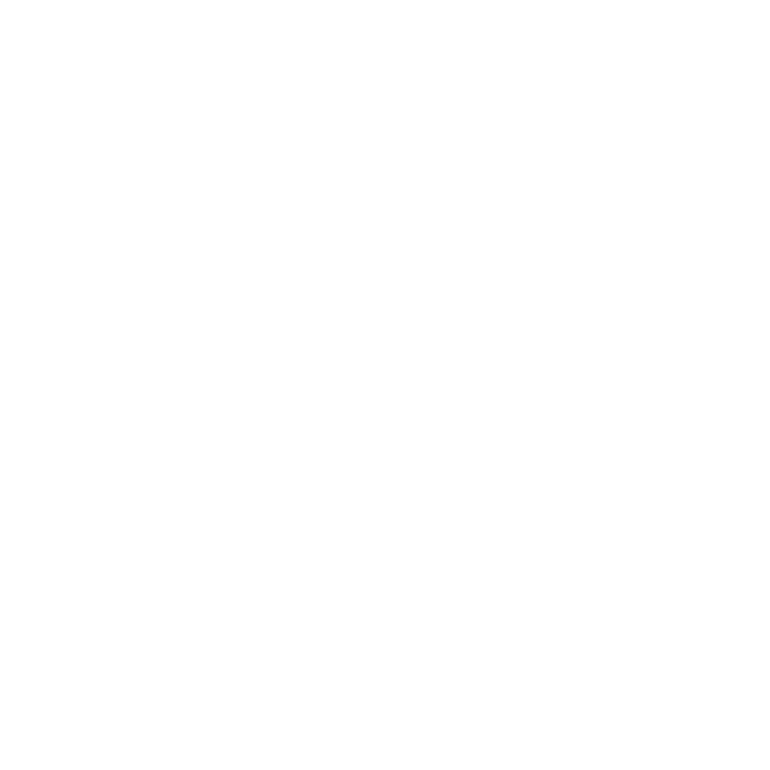

<IPython.core.display.Javascript object>


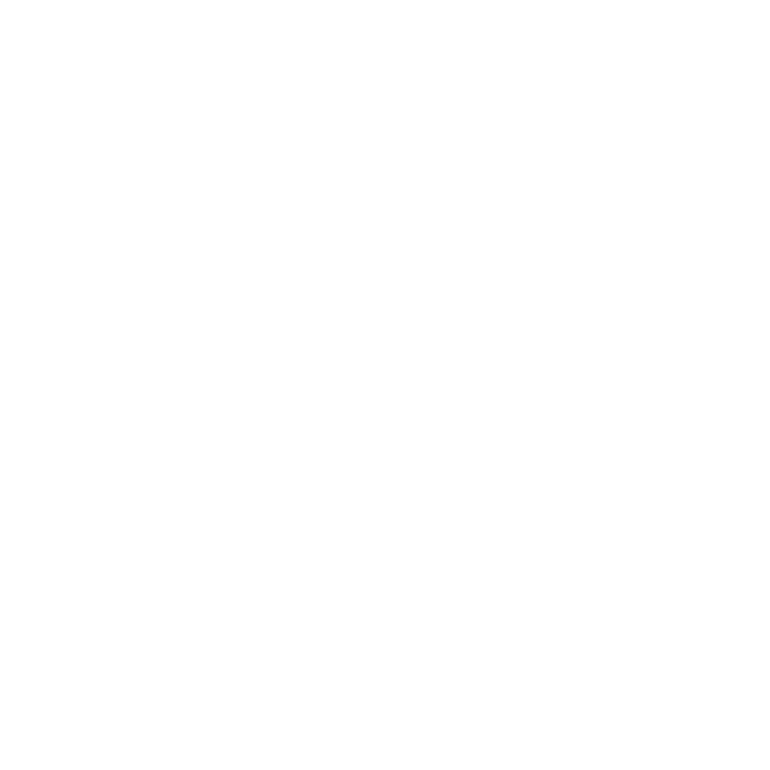

<IPython.core.display.Javascript object>


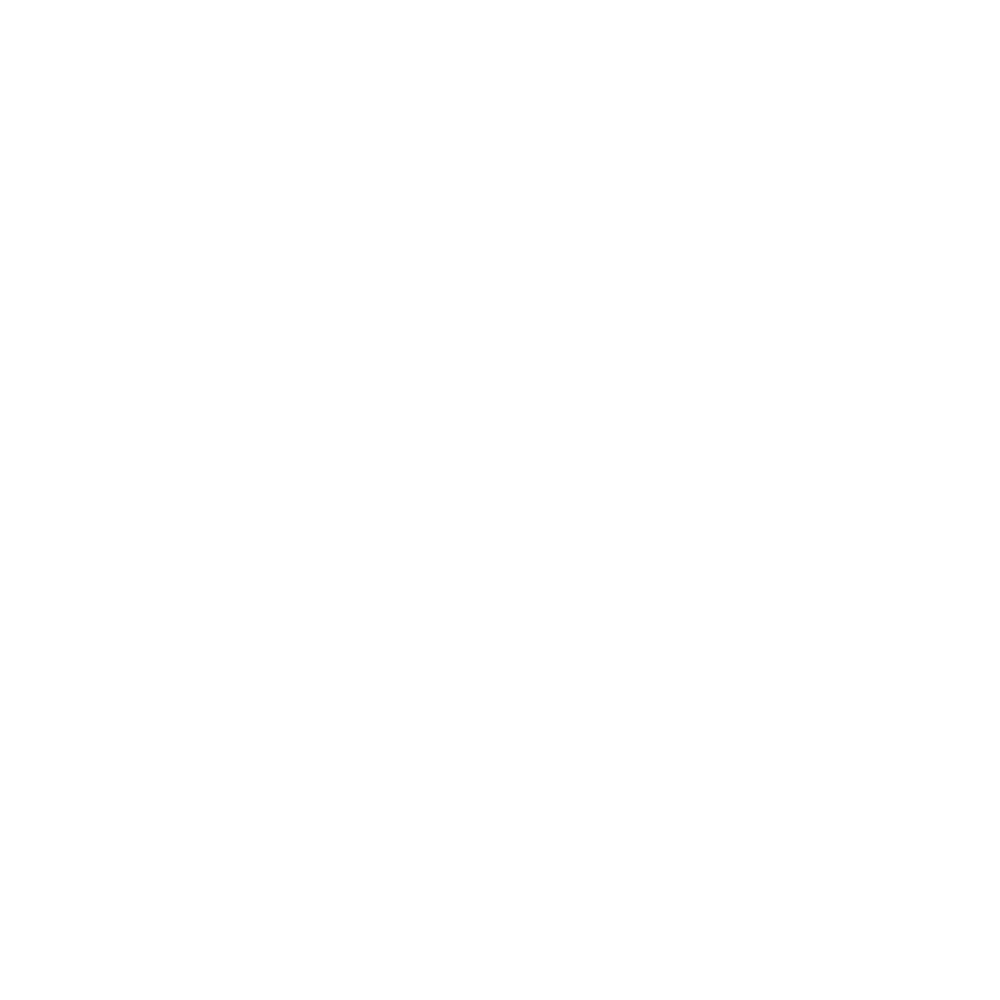

<IPython.core.display.Javascript object>


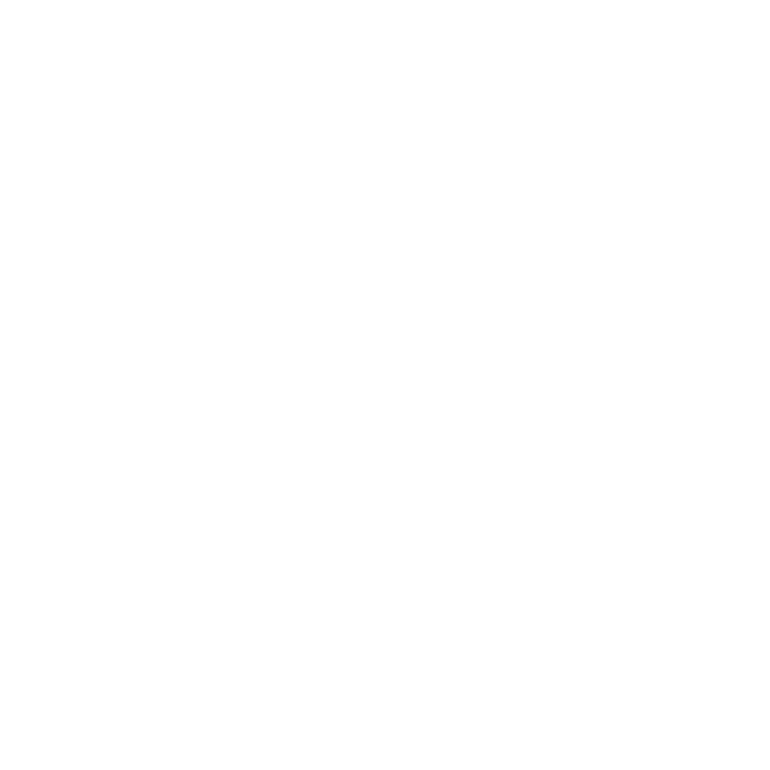

<IPython.core.display.Javascript object>


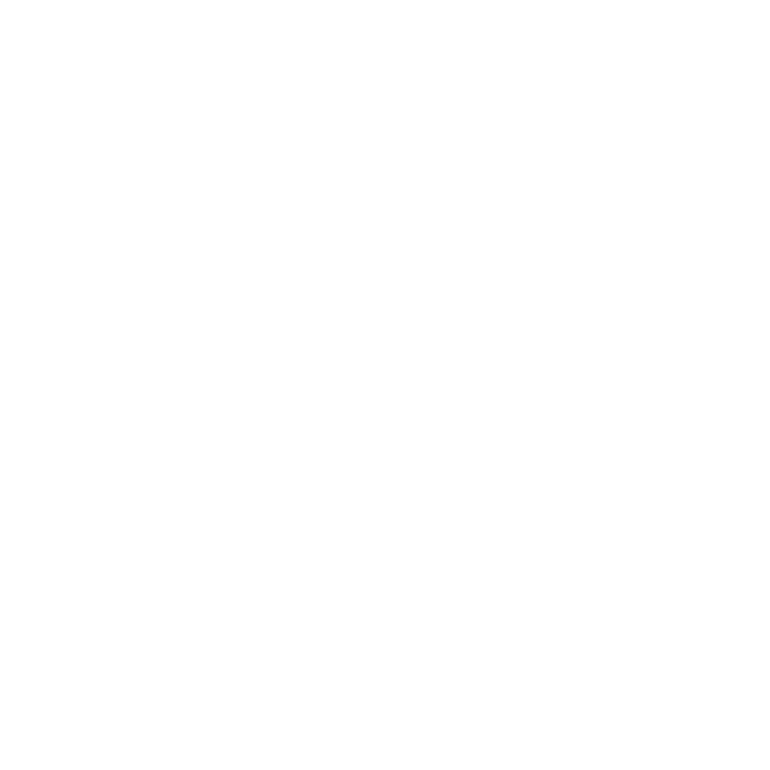

<IPython.core.display.Javascript object>


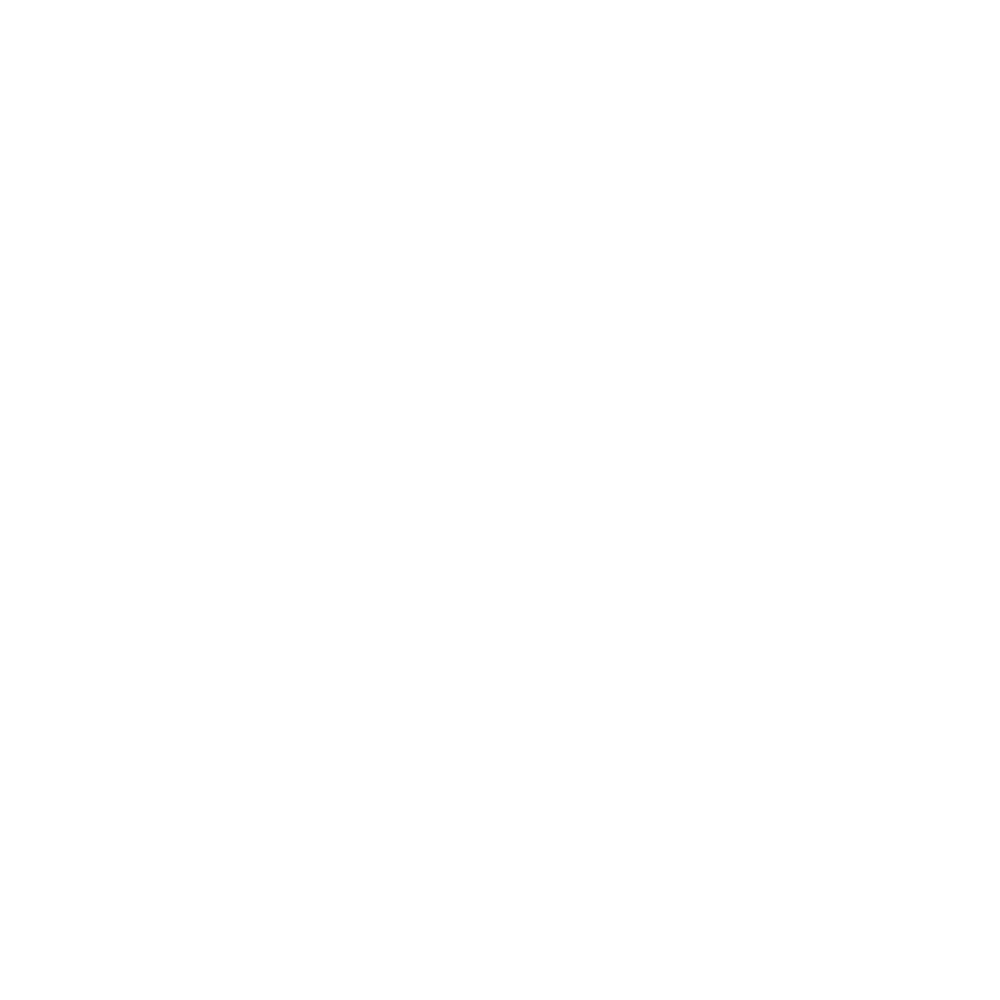

<IPython.core.display.Javascript object>


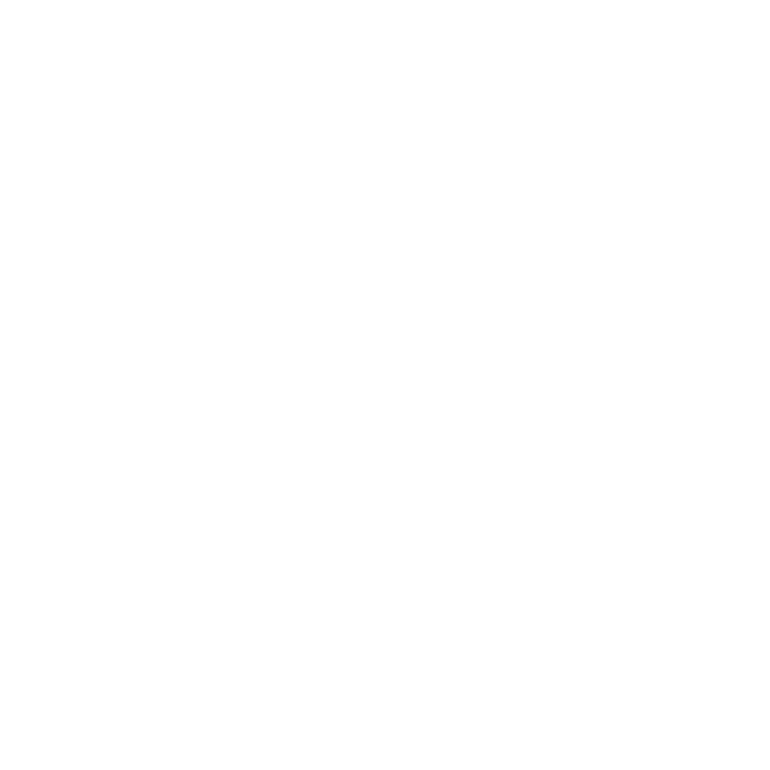

<IPython.core.display.Javascript object>


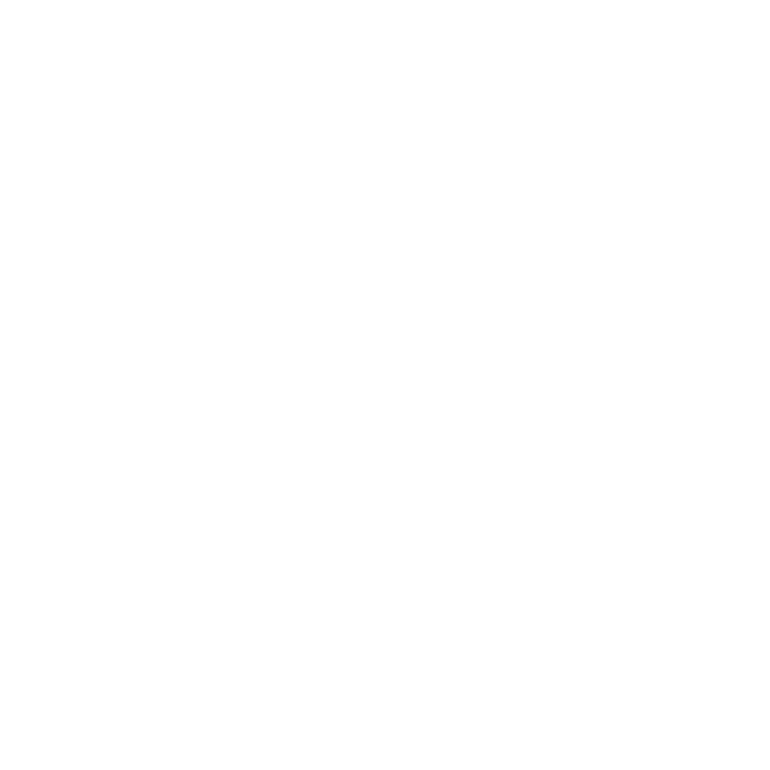

<IPython.core.display.Javascript object>


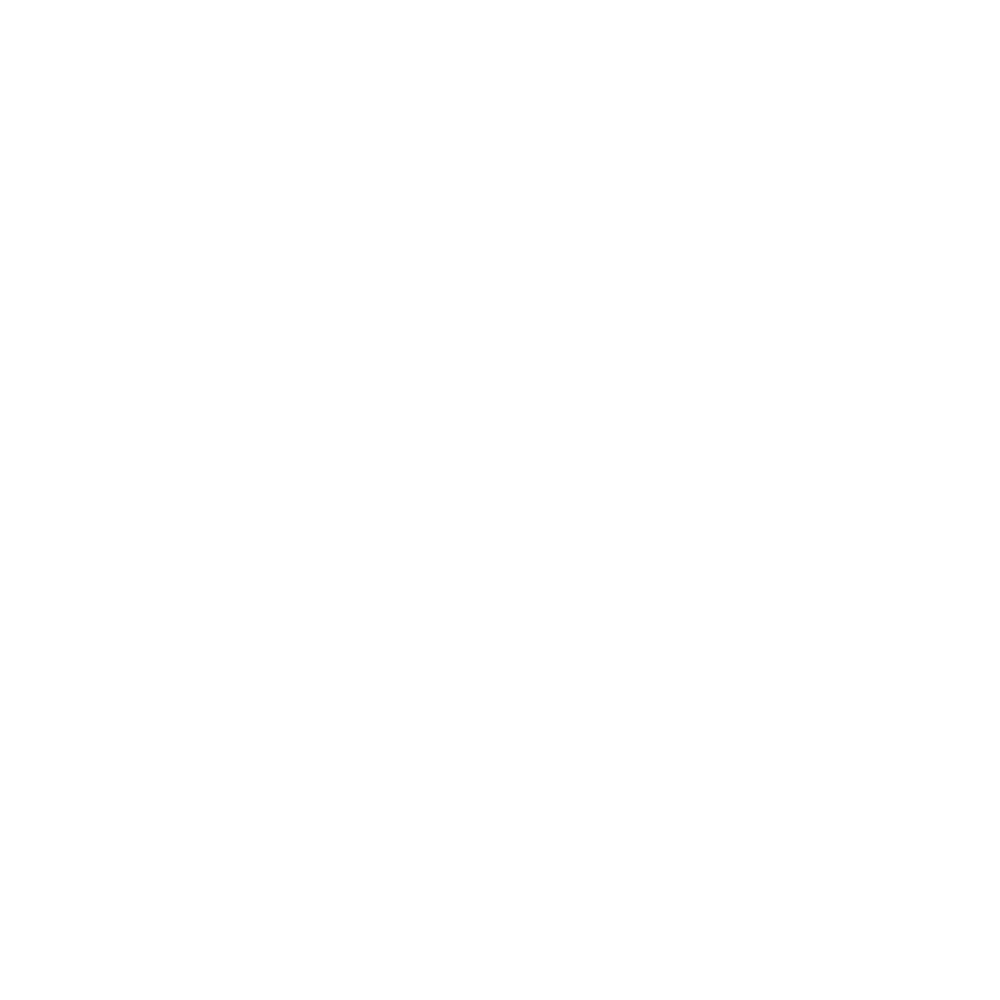

<IPython.core.display.Javascript object>


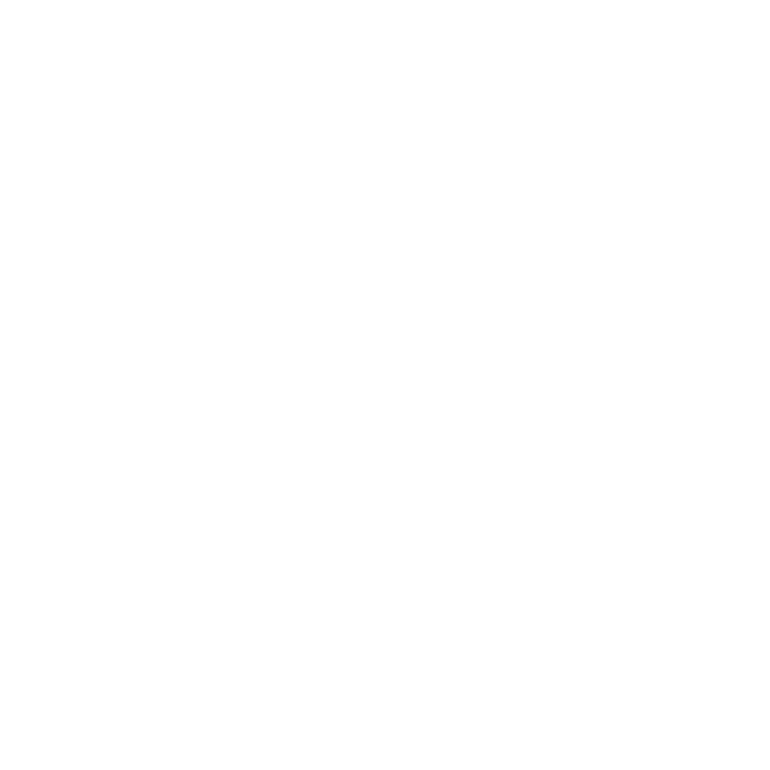

<IPython.core.display.Javascript object>


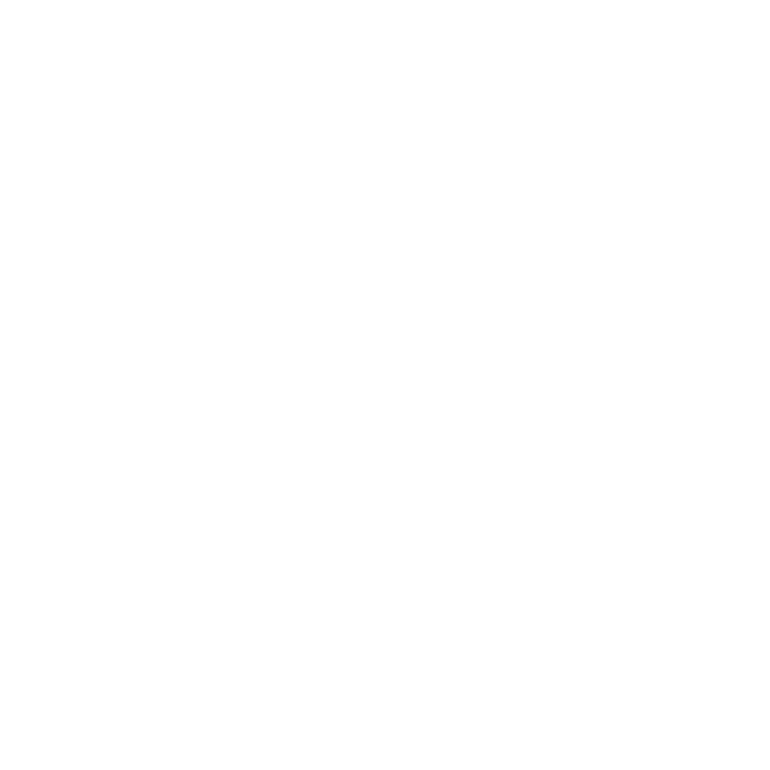

<IPython.core.display.Javascript object>


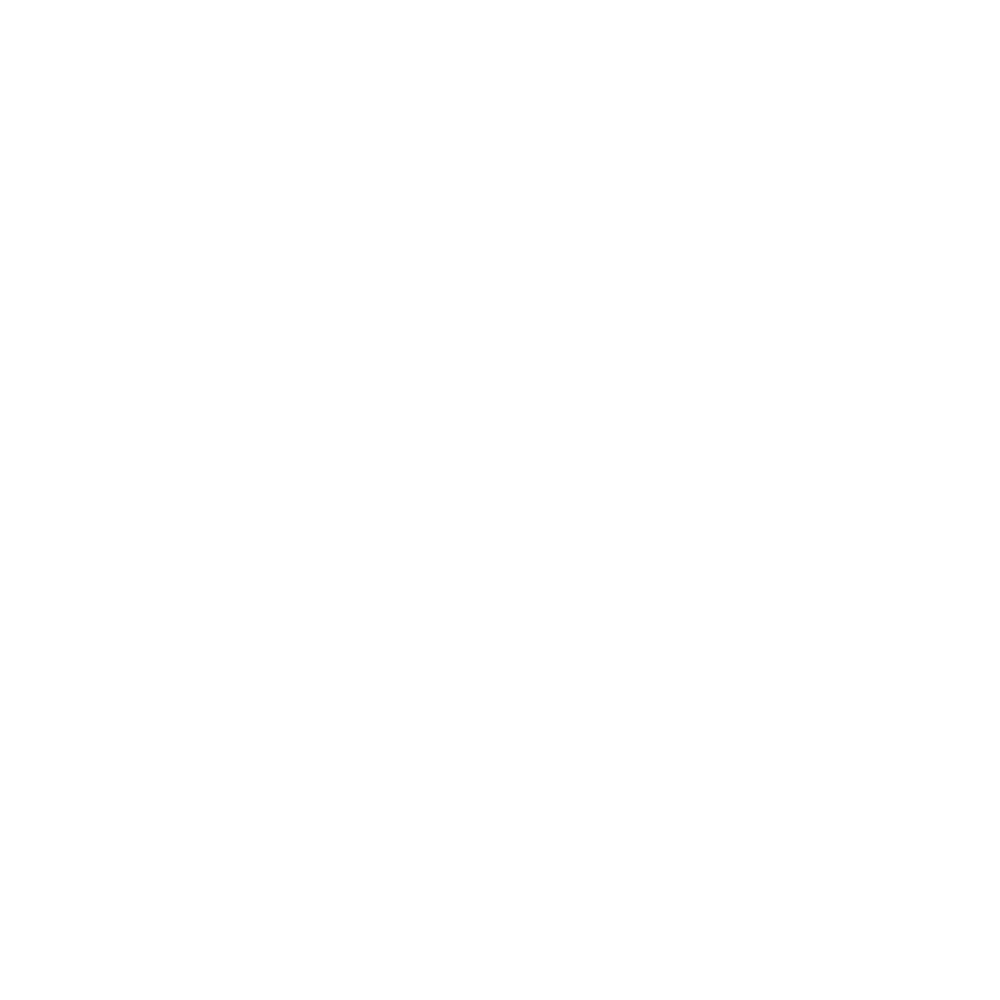

<IPython.core.display.Javascript object>


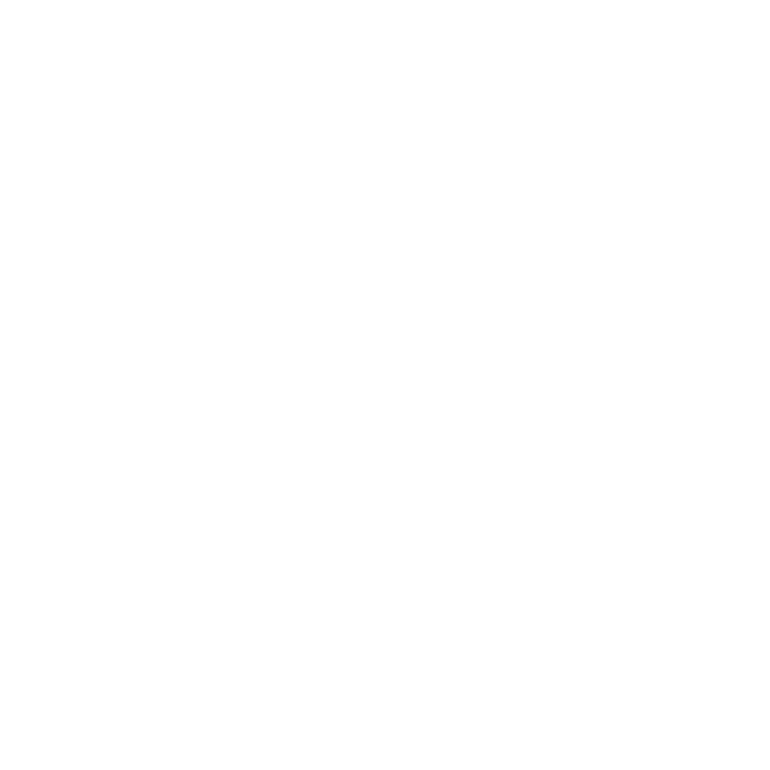

<IPython.core.display.Javascript object>


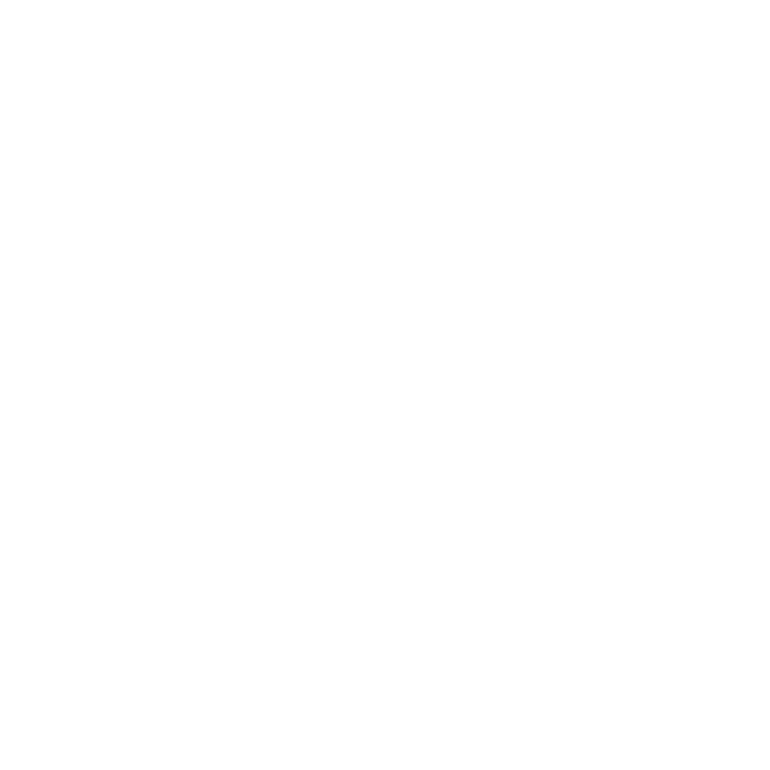

<IPython.core.display.Javascript object>


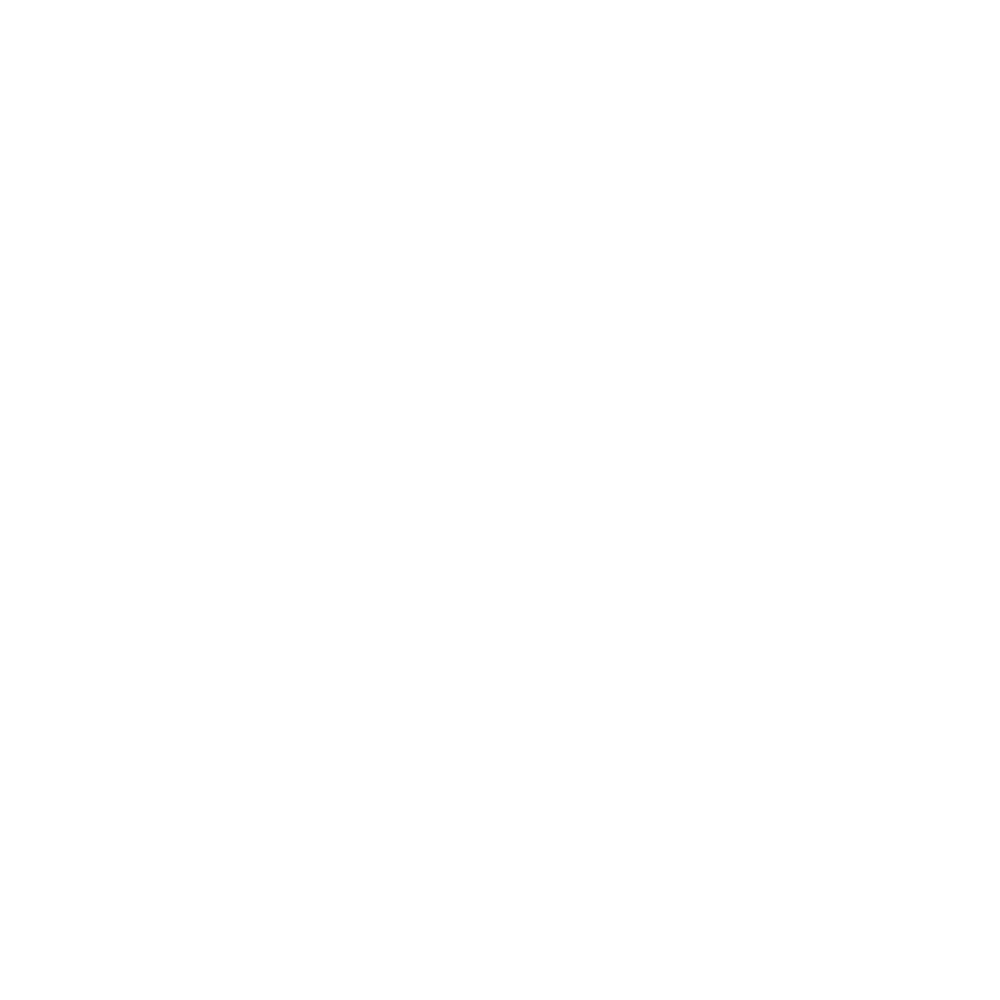

<IPython.core.display.Javascript object>


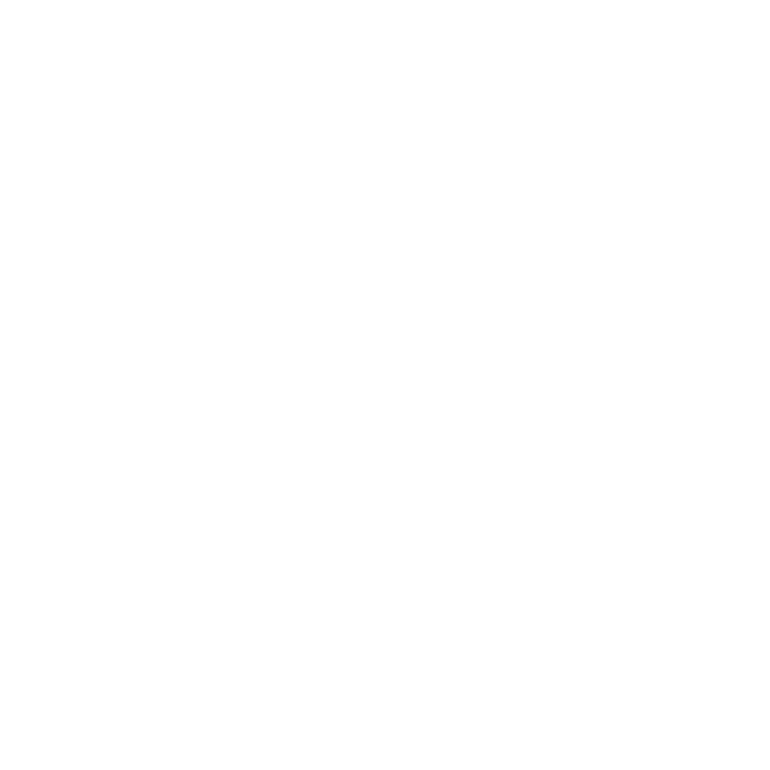

<IPython.core.display.Javascript object>


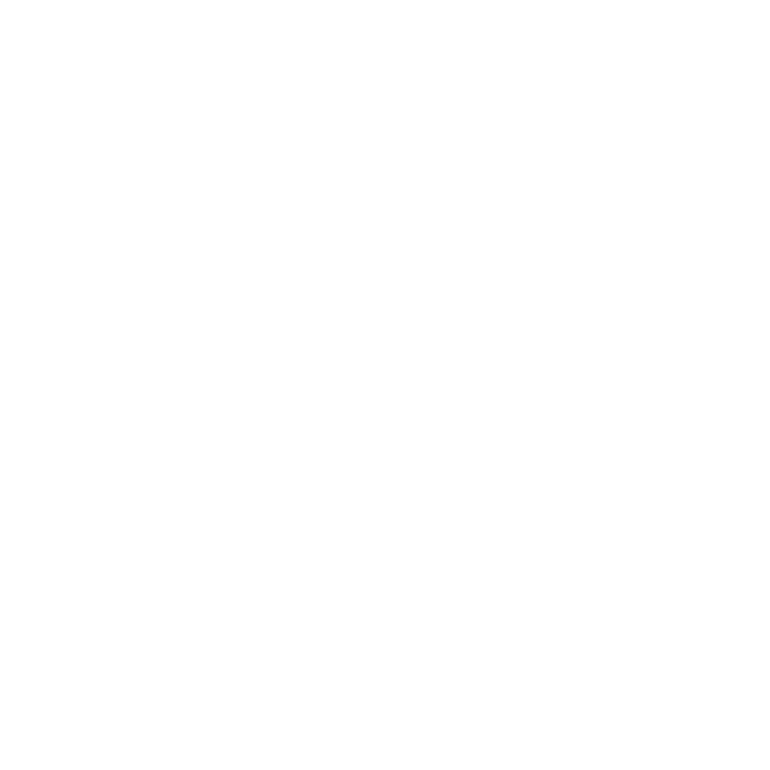

<IPython.core.display.Javascript object>


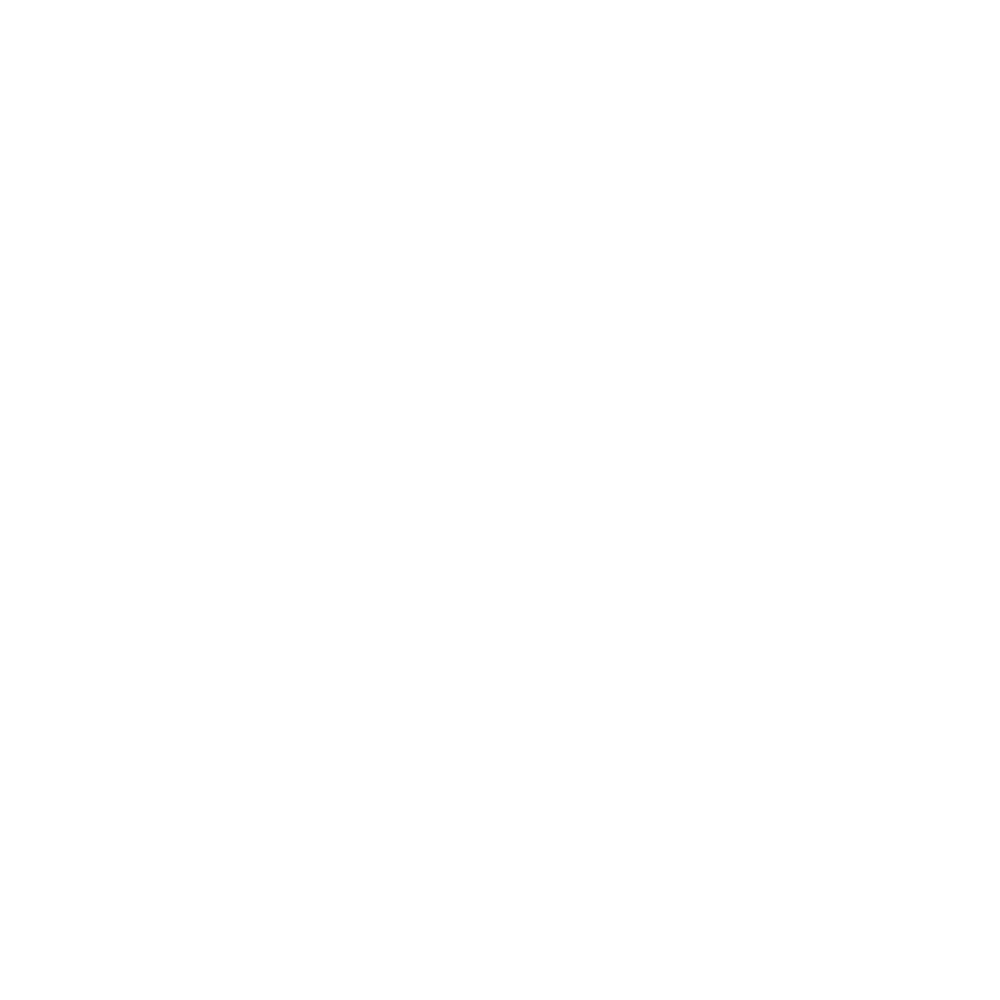

In [98]:
Monther = "Sep"
# setup stuff
PolyList = gpdSepDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdSepDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdSepDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdSepDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdSepDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdSepDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdSepDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


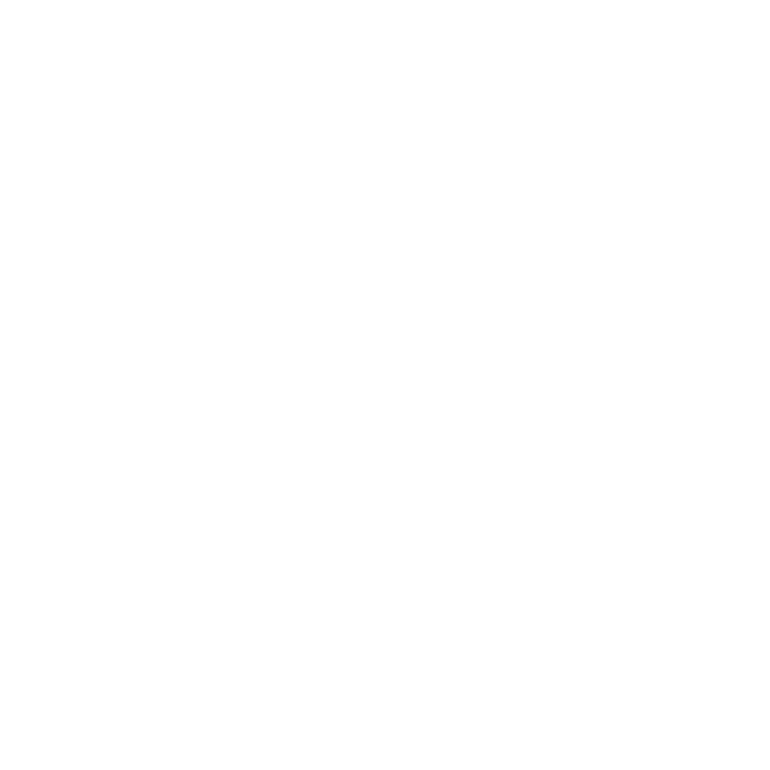

<IPython.core.display.Javascript object>


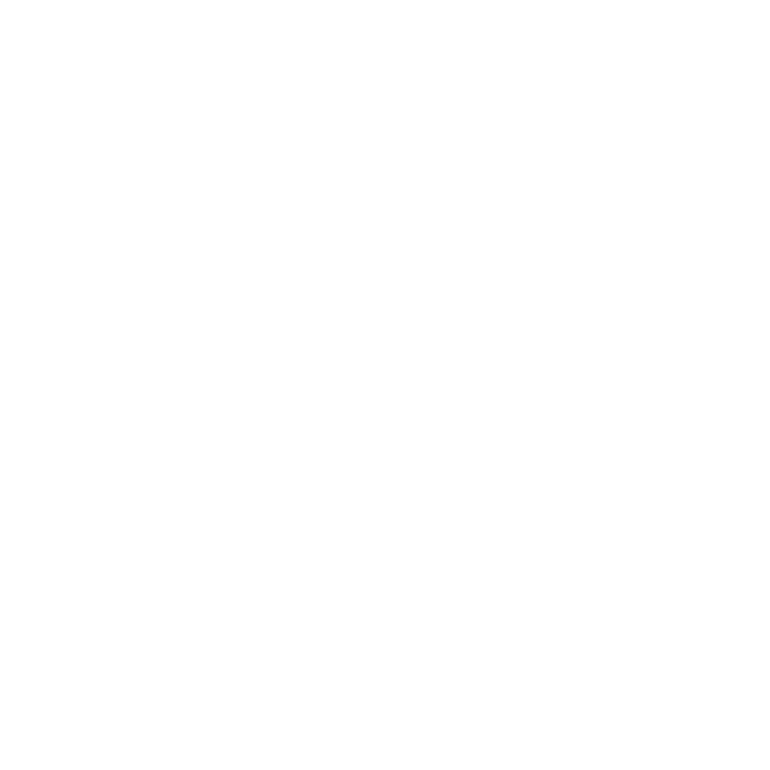

<IPython.core.display.Javascript object>


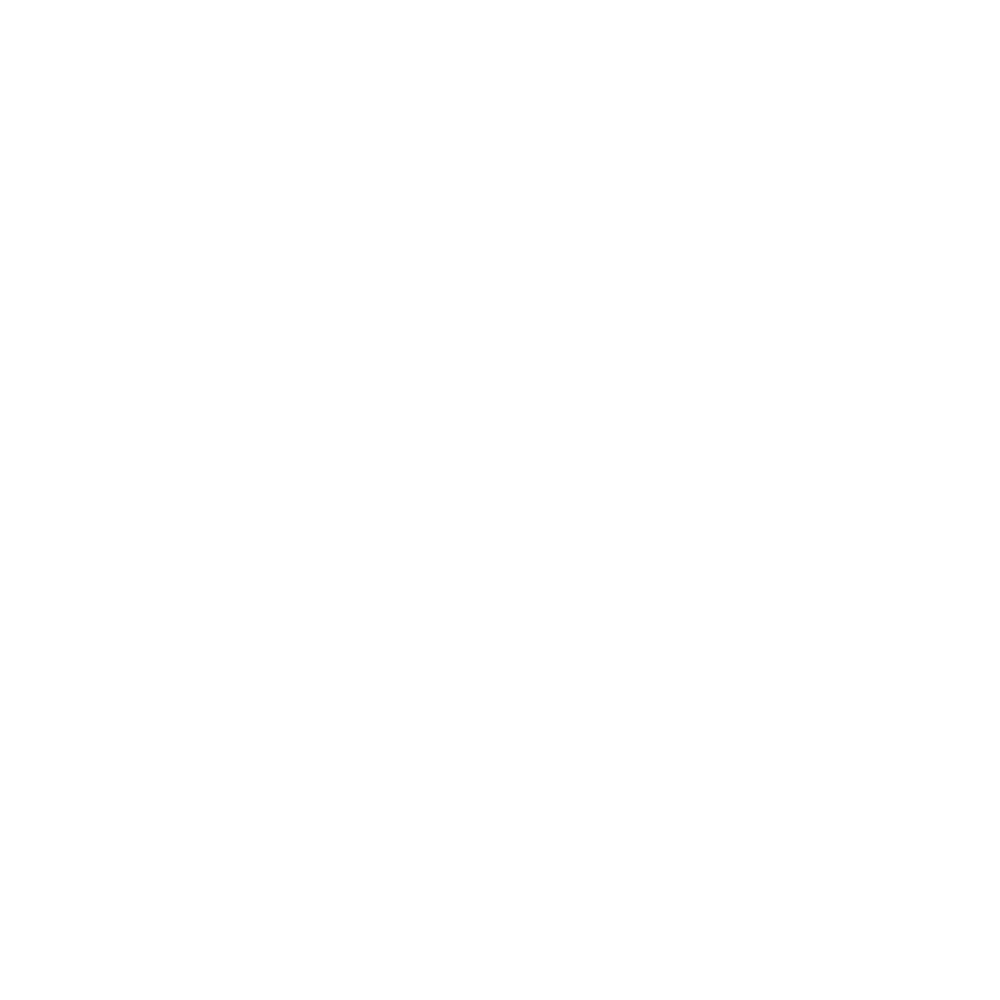

<IPython.core.display.Javascript object>


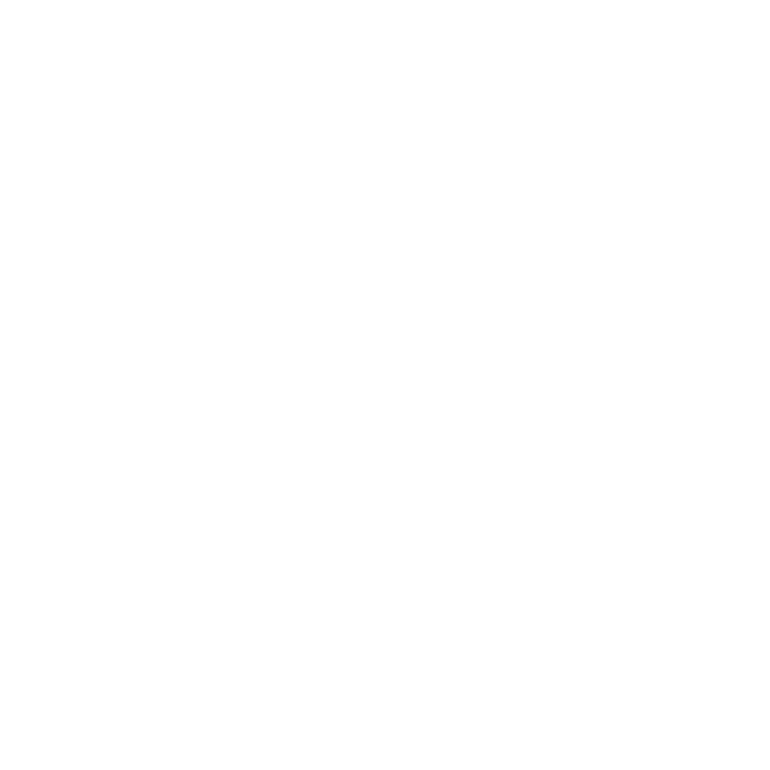

<IPython.core.display.Javascript object>


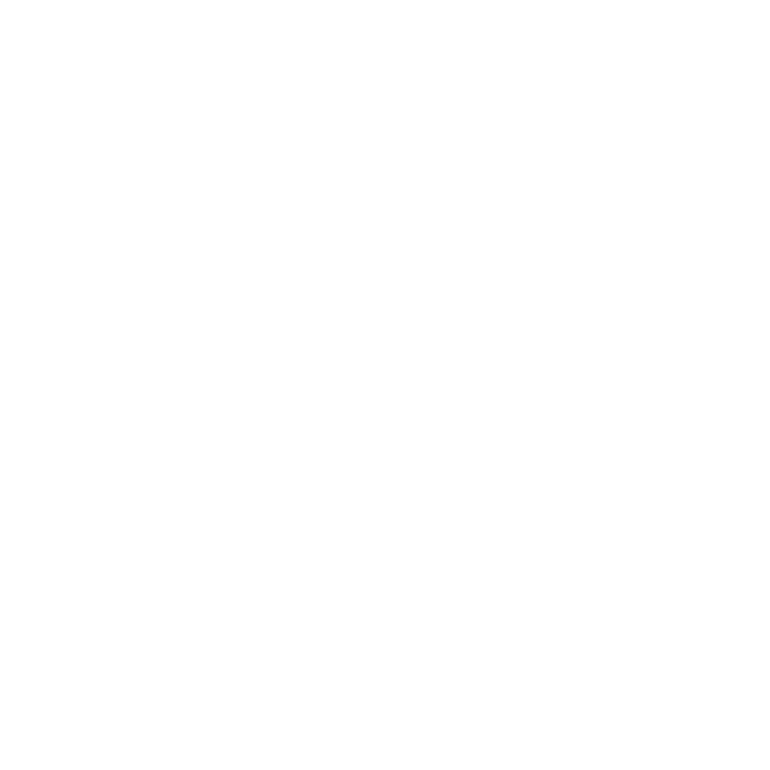

<IPython.core.display.Javascript object>


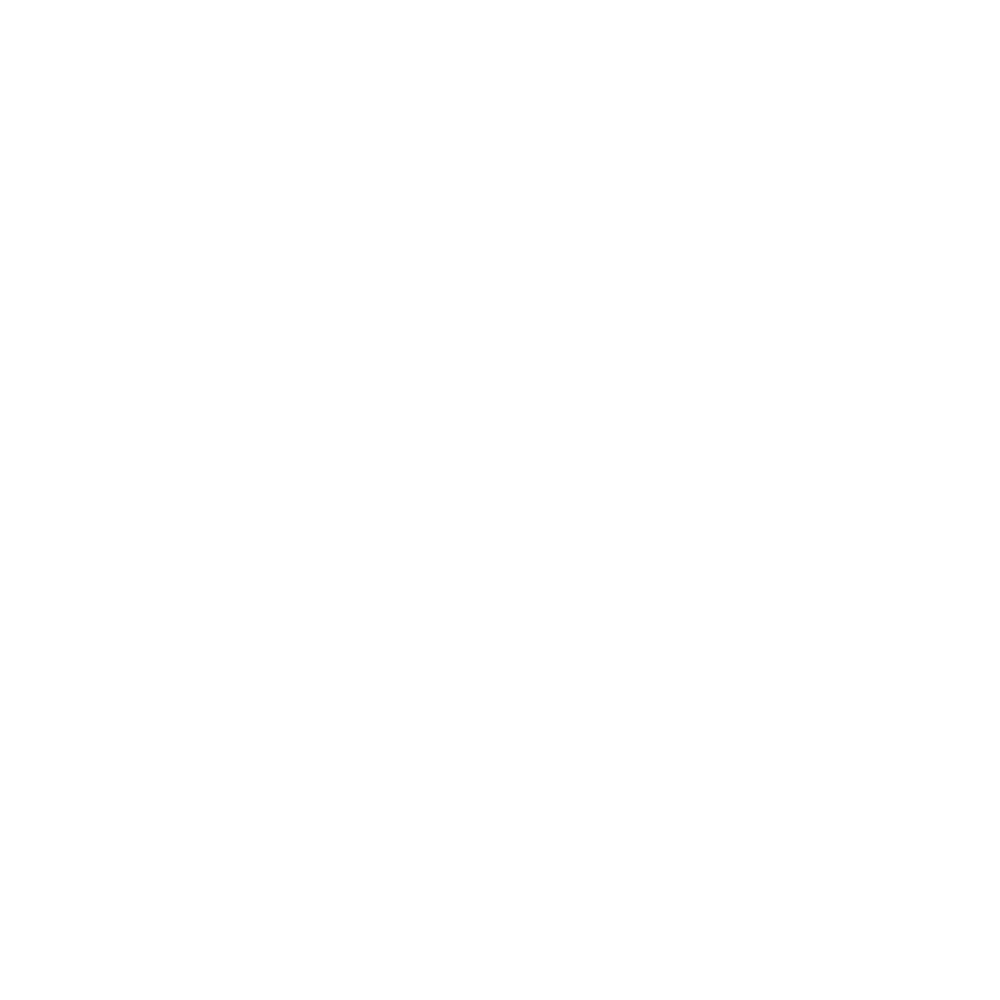

<IPython.core.display.Javascript object>


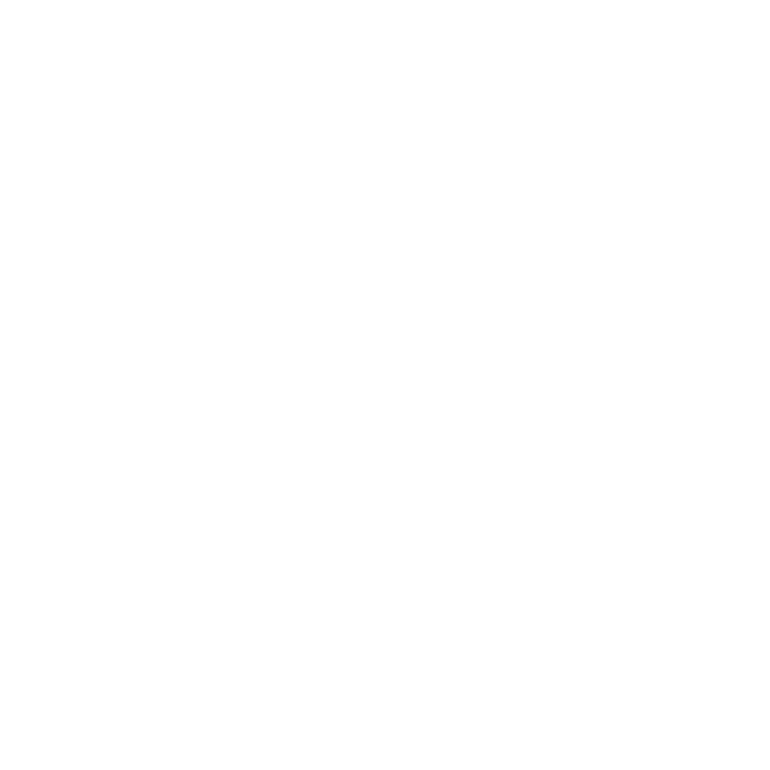

<IPython.core.display.Javascript object>


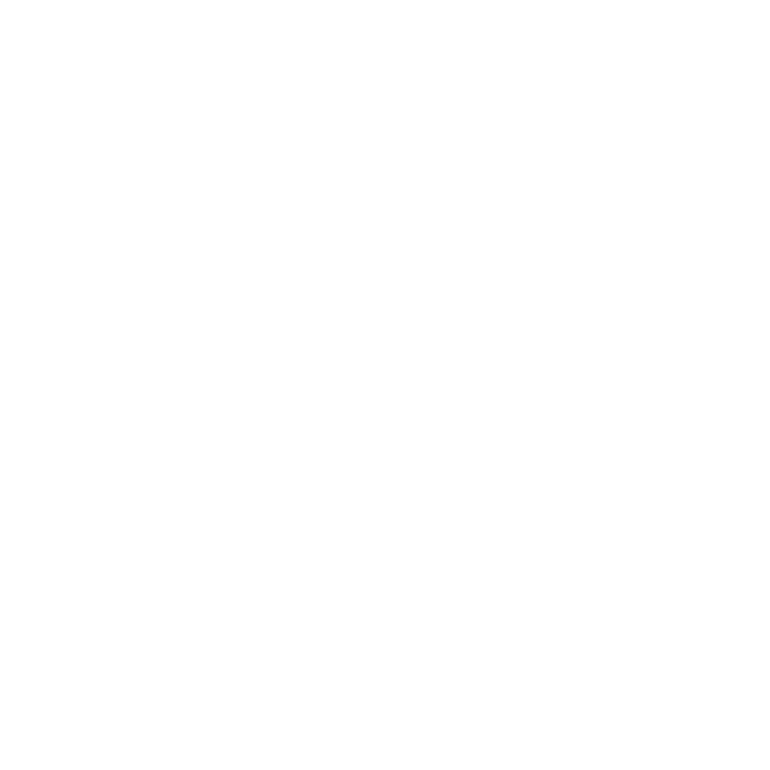

<IPython.core.display.Javascript object>


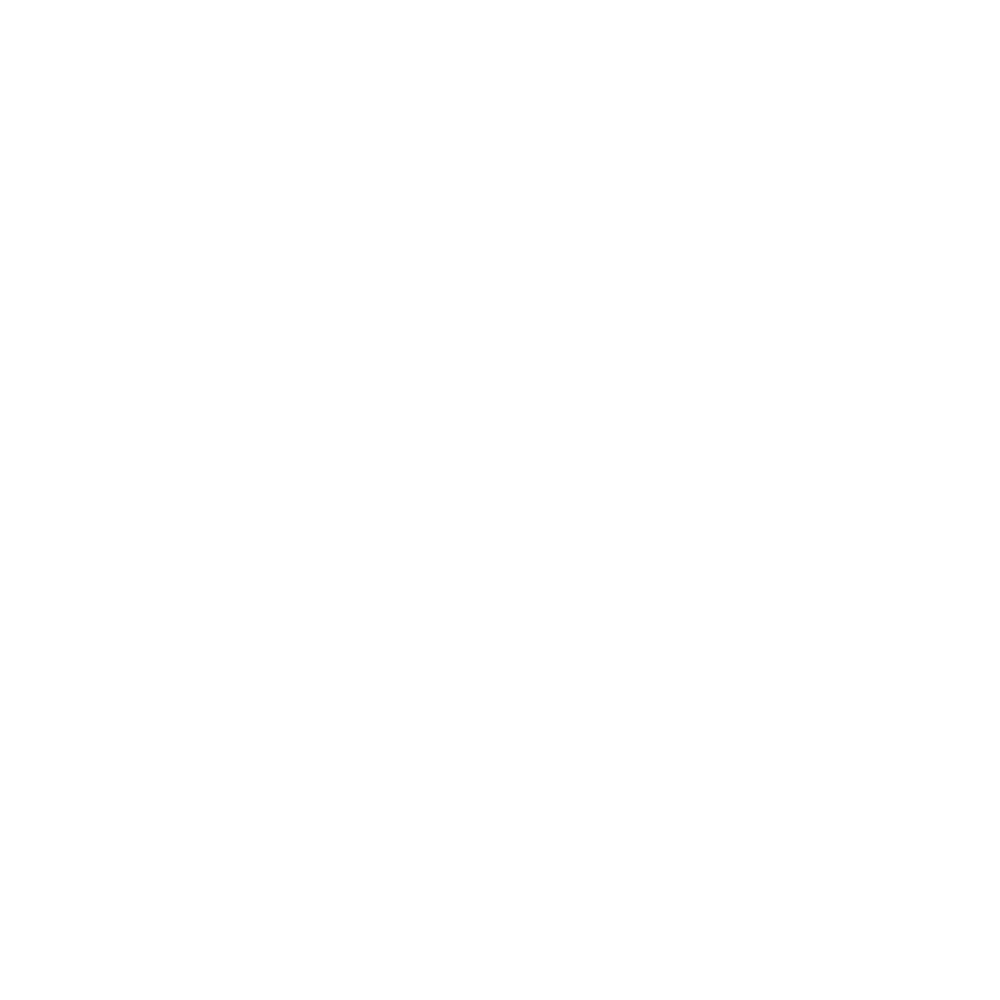

<IPython.core.display.Javascript object>


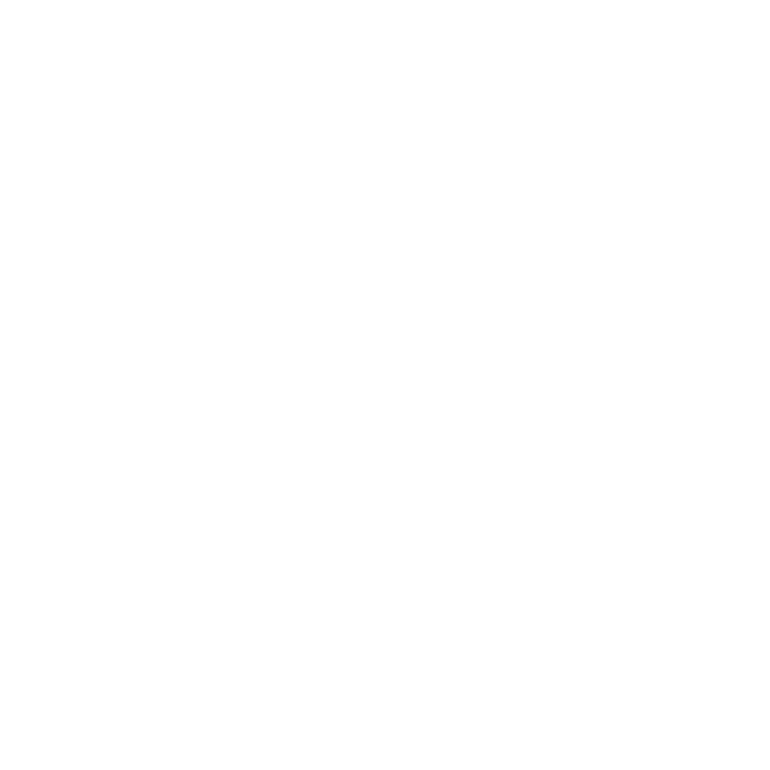

<IPython.core.display.Javascript object>


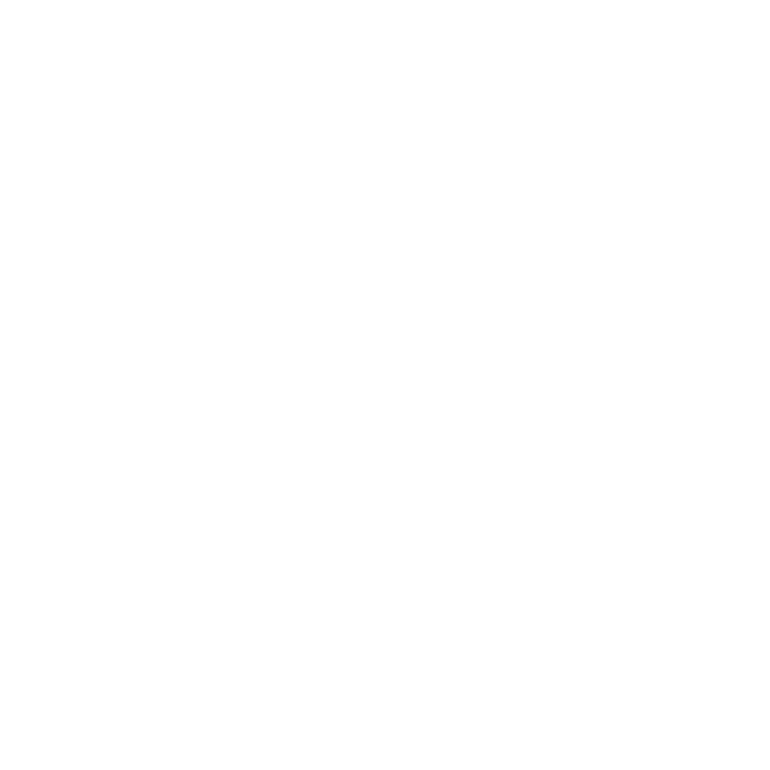

<IPython.core.display.Javascript object>


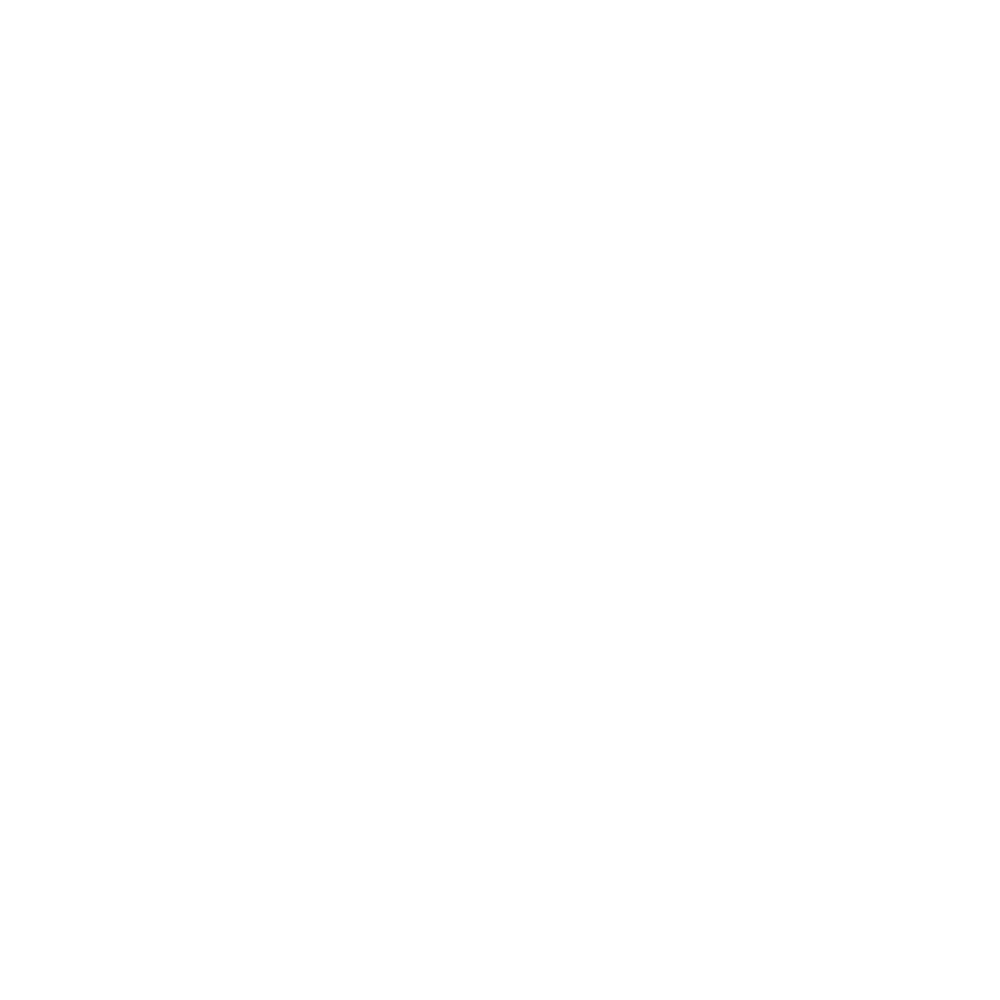

<IPython.core.display.Javascript object>


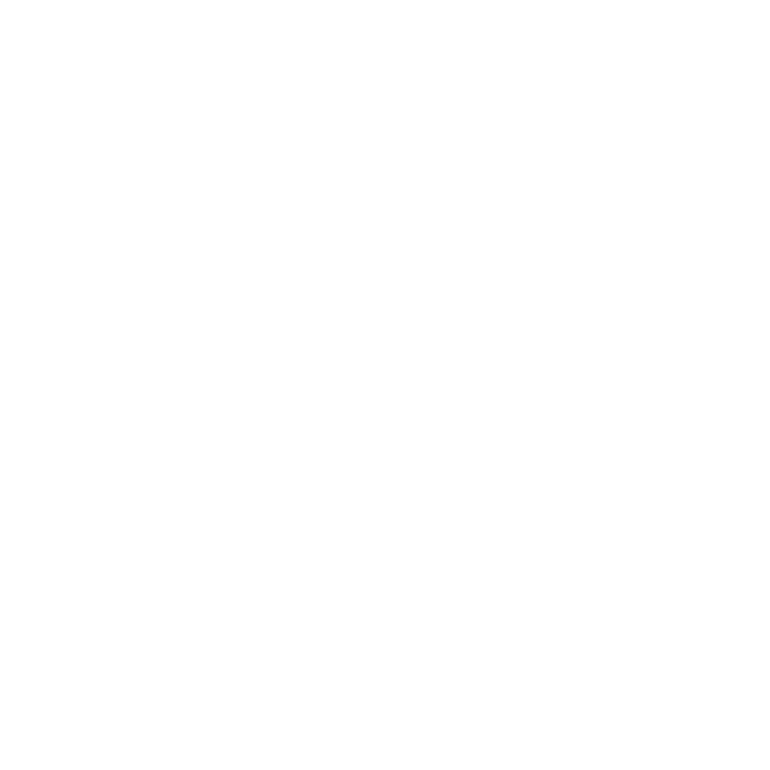

<IPython.core.display.Javascript object>


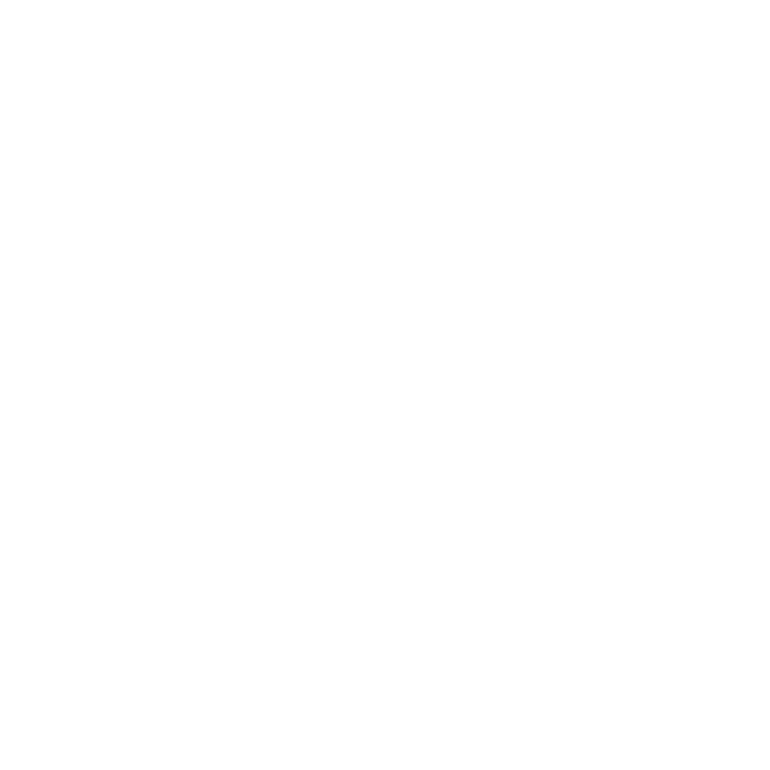

<IPython.core.display.Javascript object>


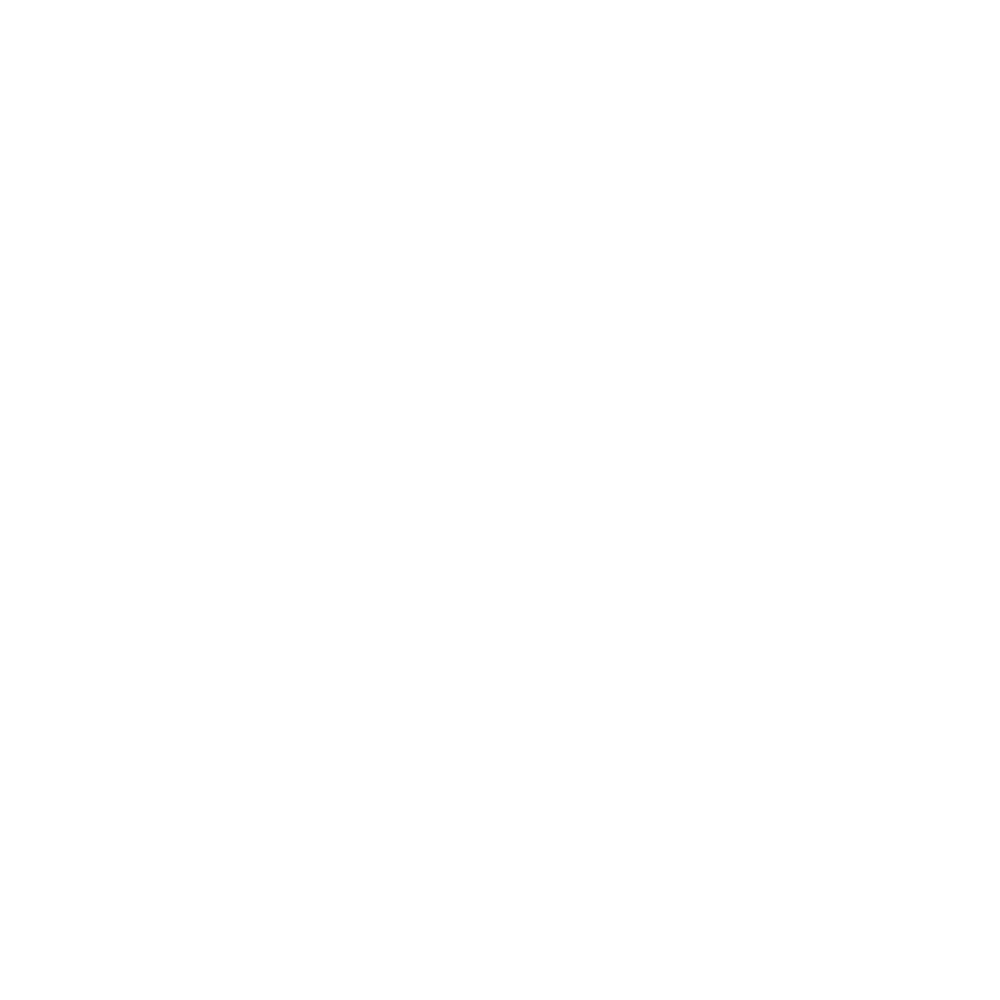

<IPython.core.display.Javascript object>


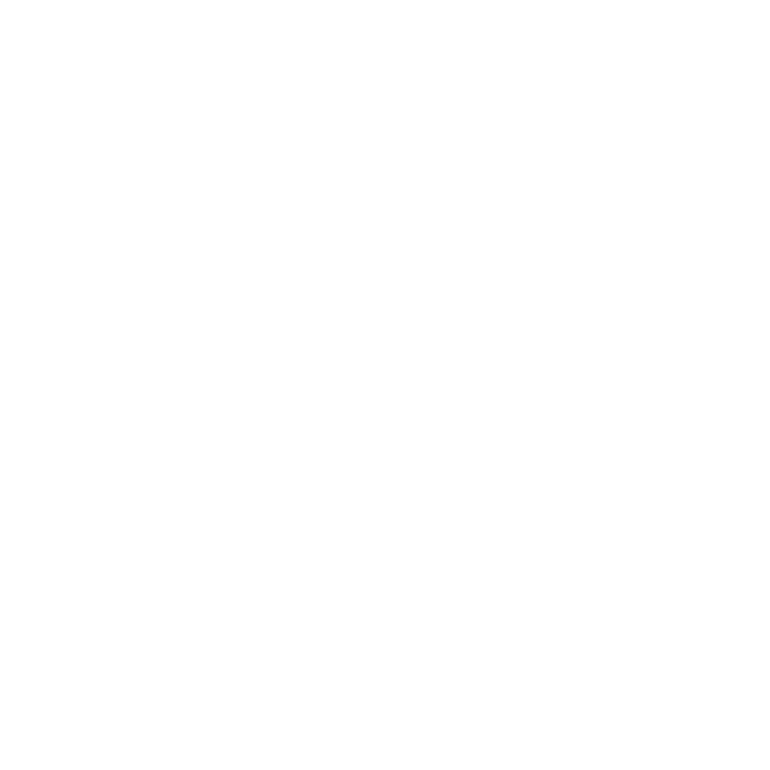

<IPython.core.display.Javascript object>


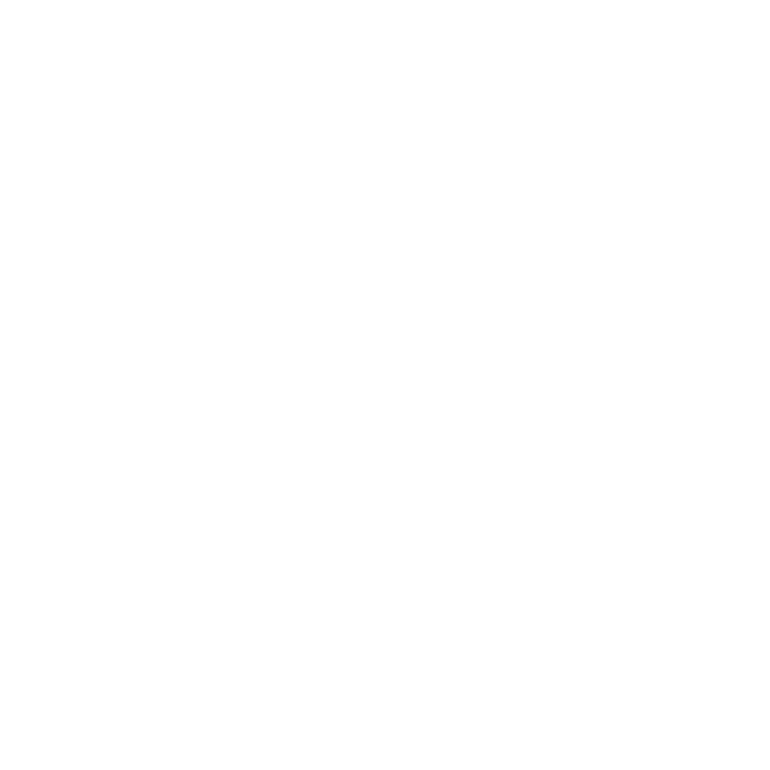

<IPython.core.display.Javascript object>


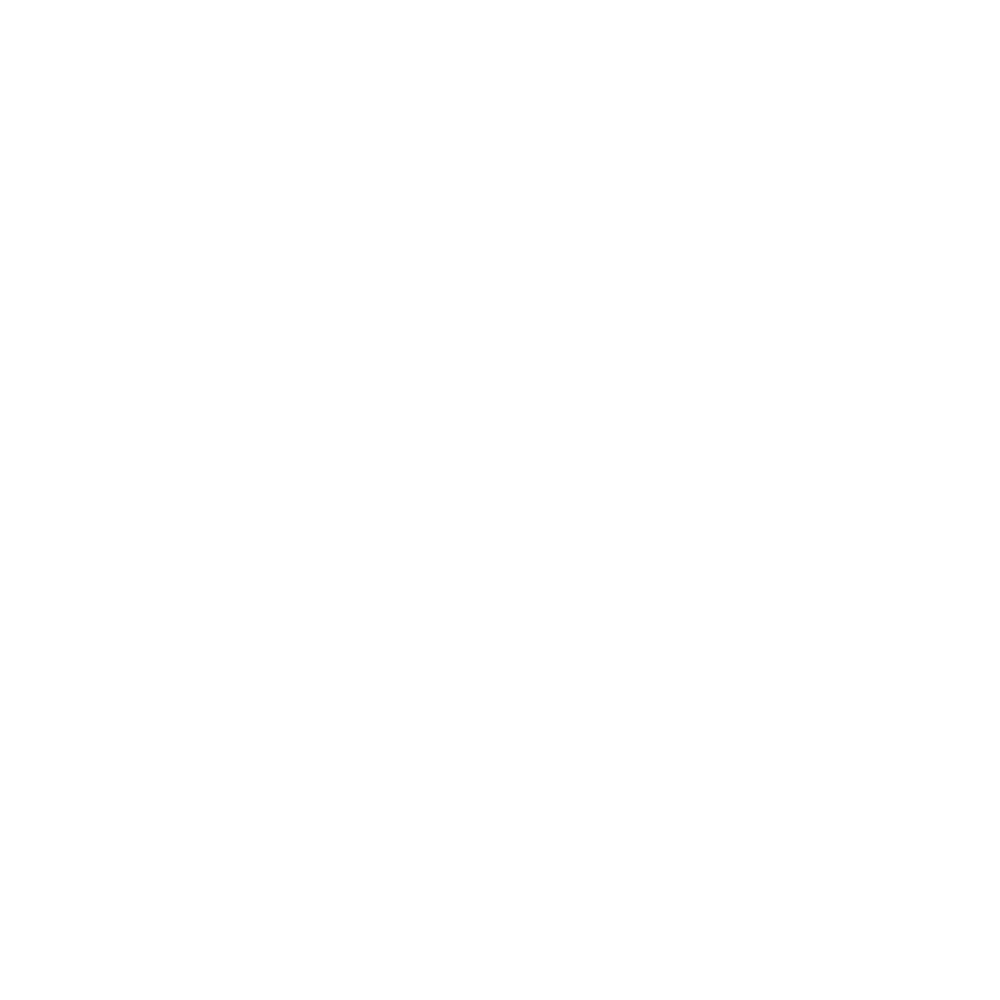

In [99]:
Monther = "Oct"
# setup stuff
PolyList = gpdOctDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdOctDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdOctDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdOctDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdOctDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdOctDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdOctDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


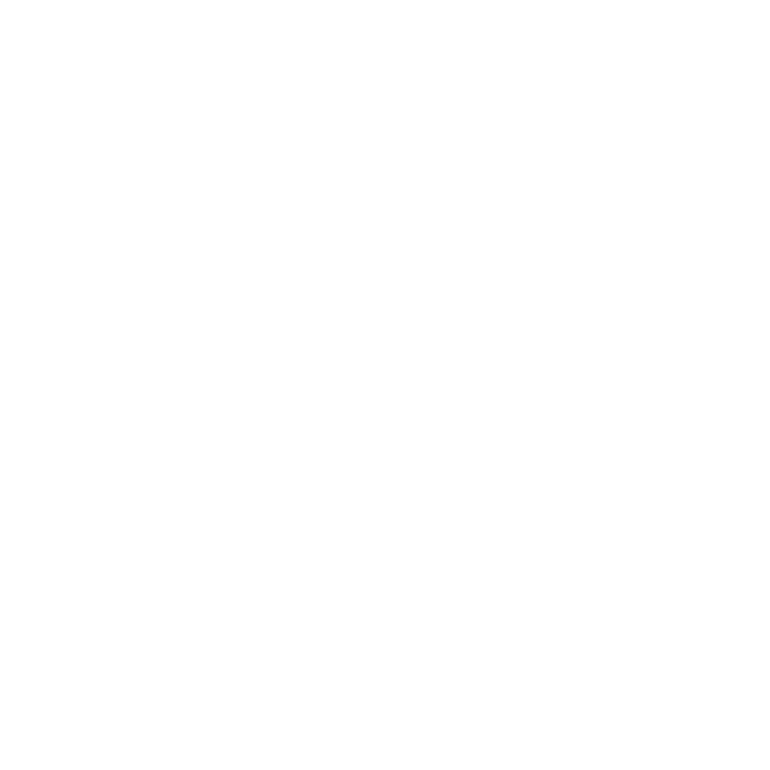

<IPython.core.display.Javascript object>


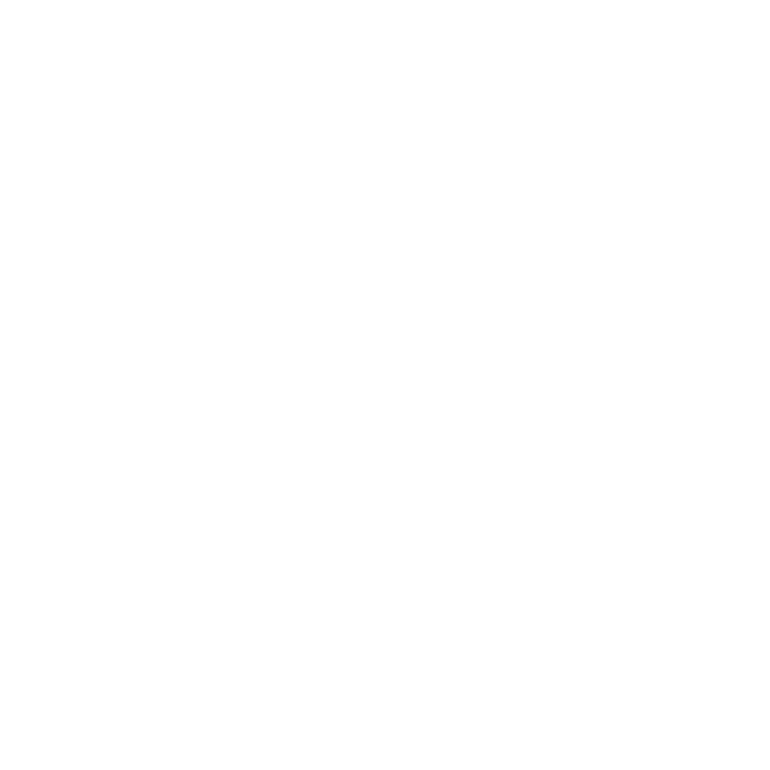

<IPython.core.display.Javascript object>


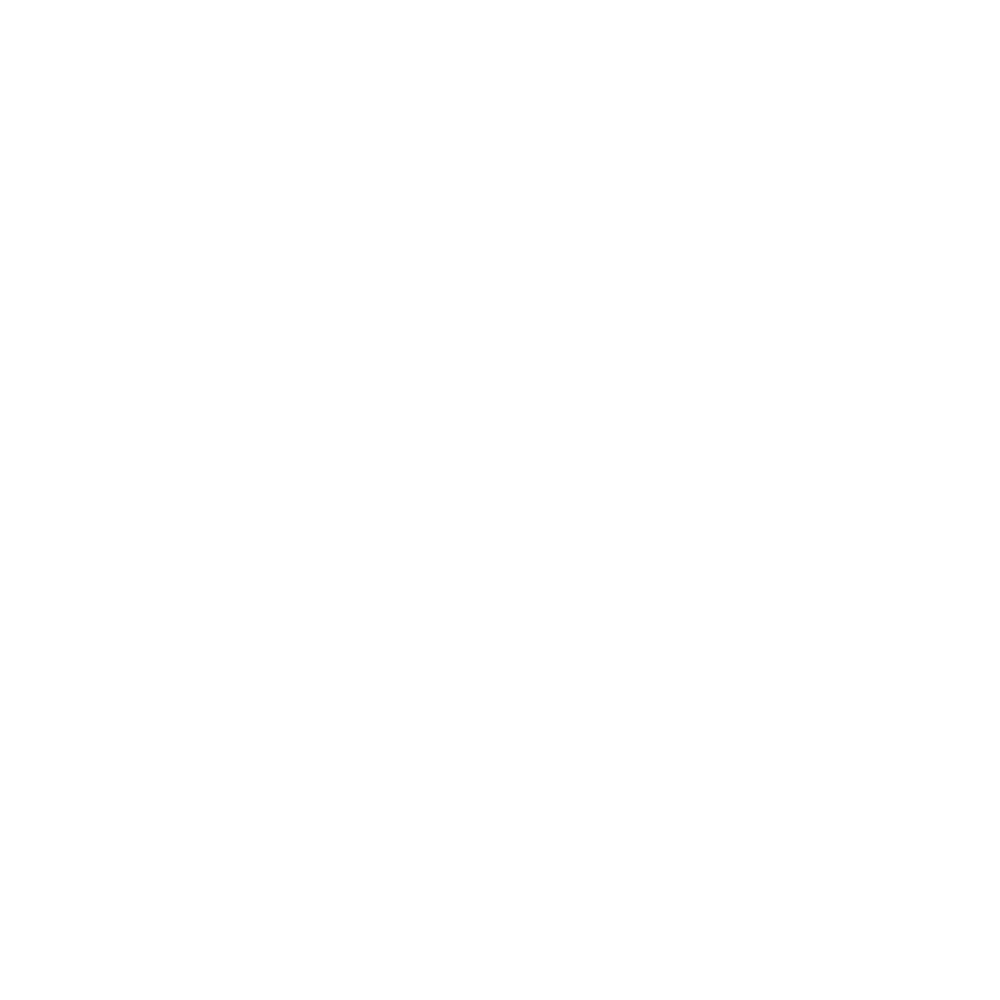

<IPython.core.display.Javascript object>


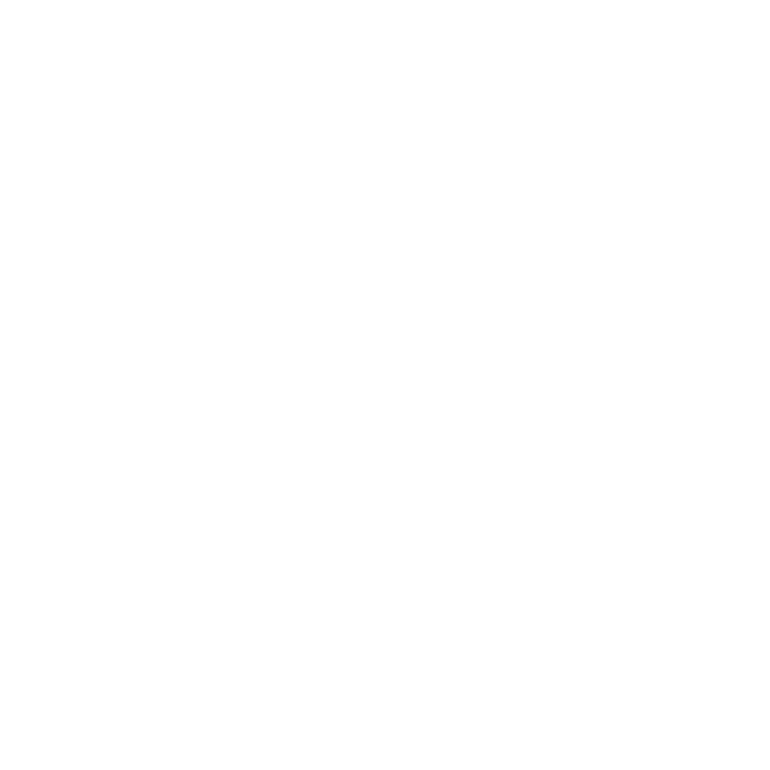

<IPython.core.display.Javascript object>


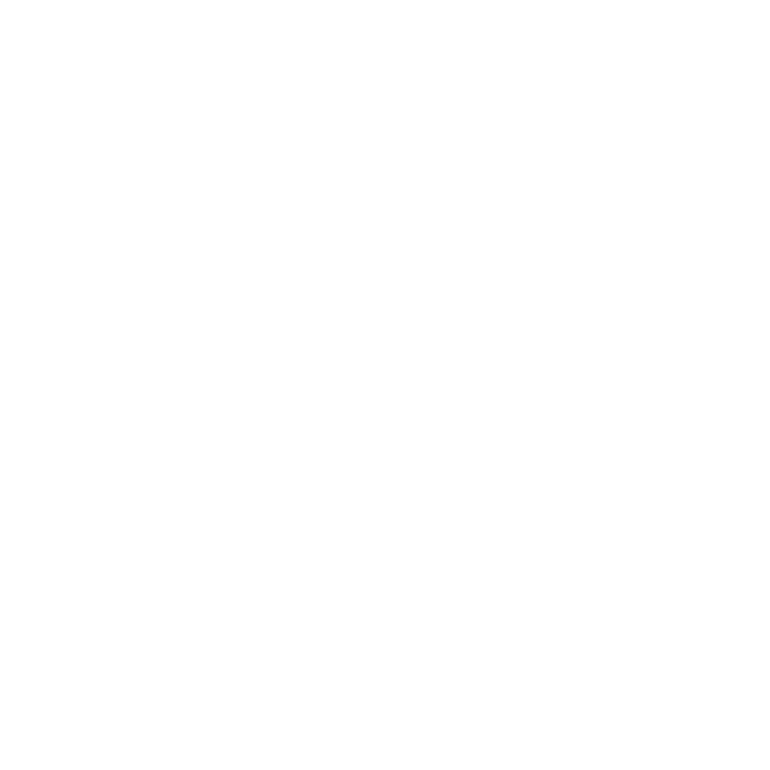

<IPython.core.display.Javascript object>


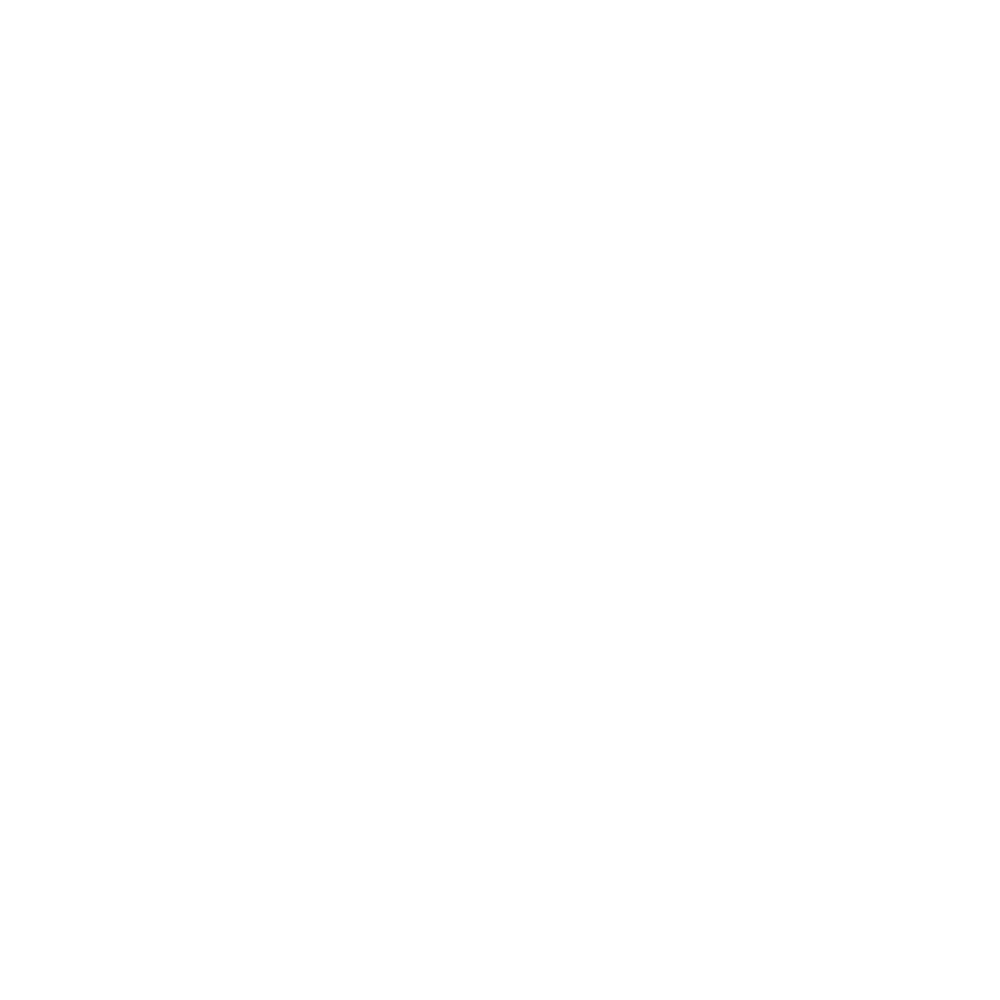

<IPython.core.display.Javascript object>


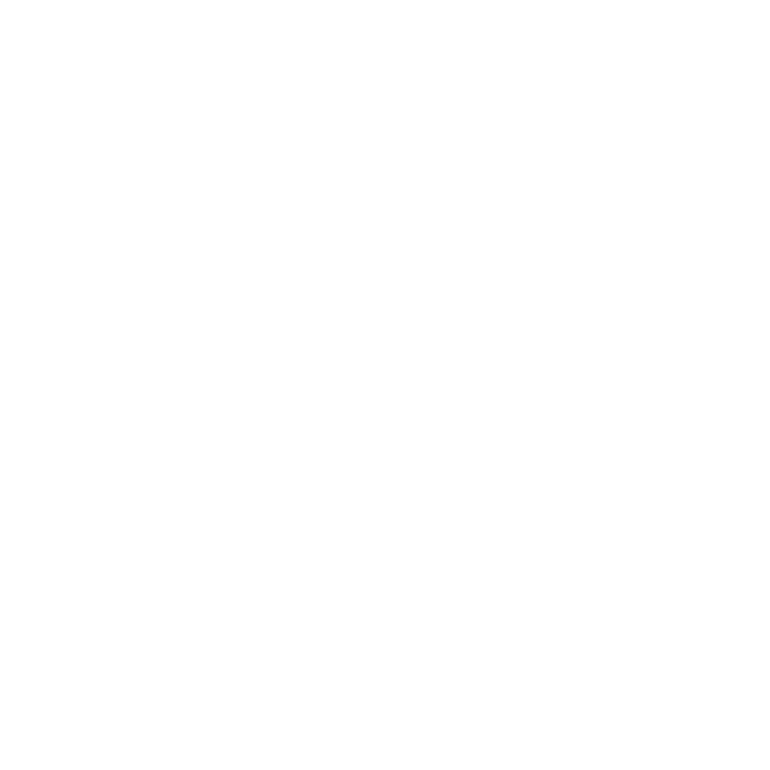

<IPython.core.display.Javascript object>


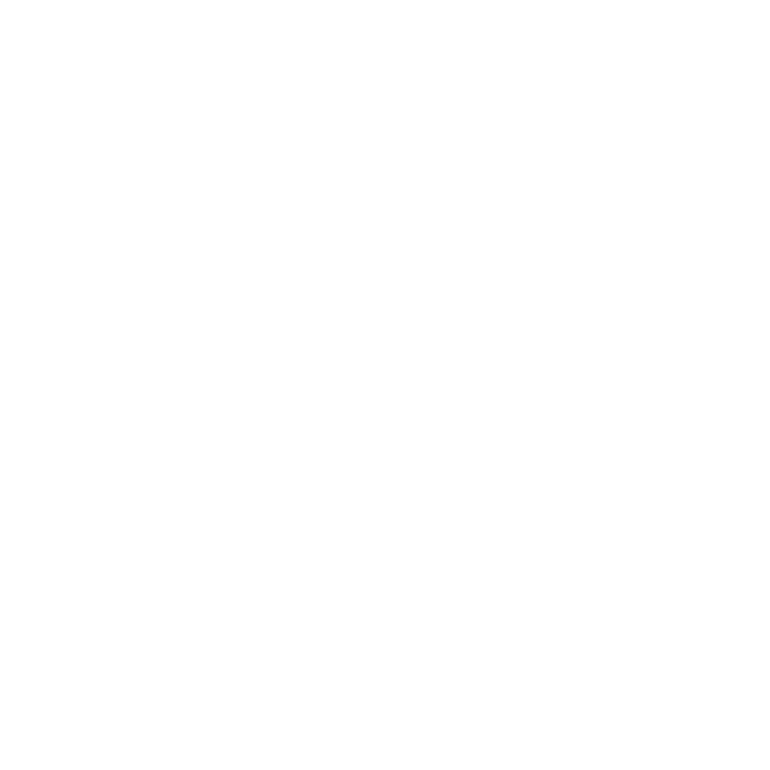

<IPython.core.display.Javascript object>


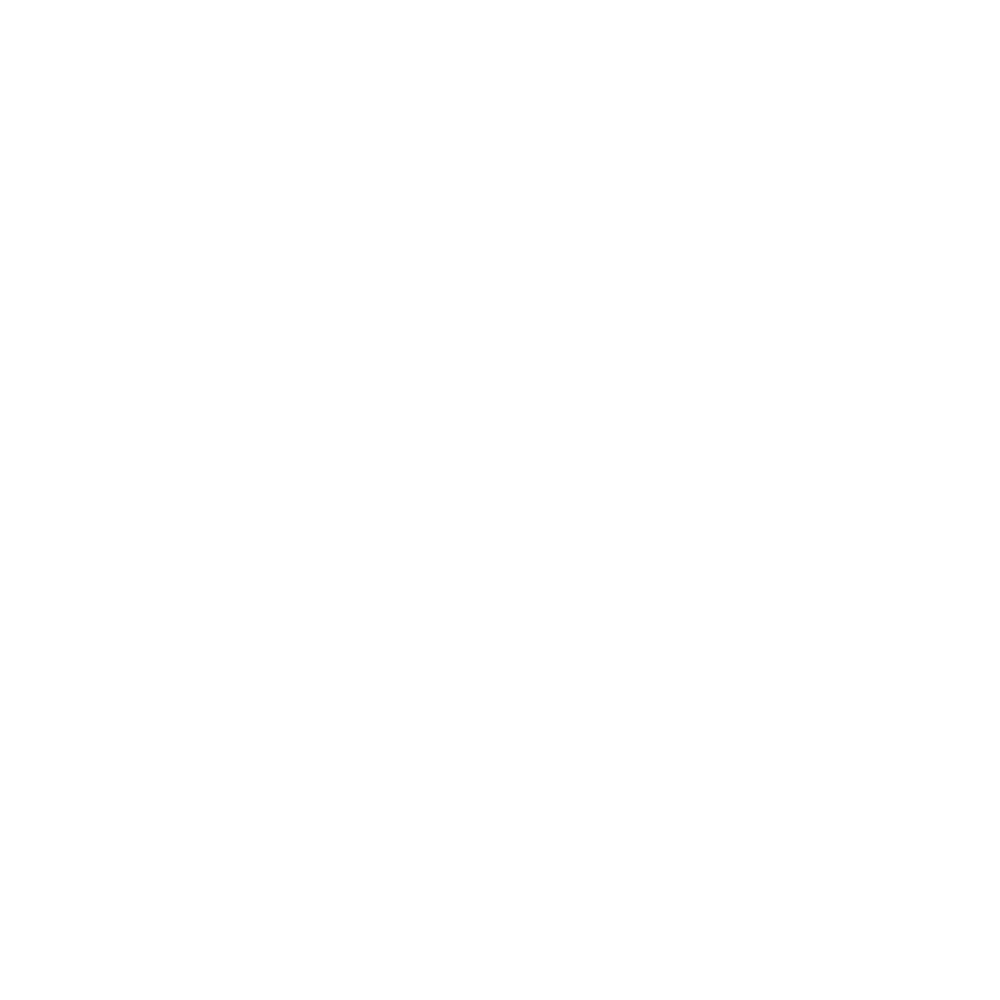

<IPython.core.display.Javascript object>


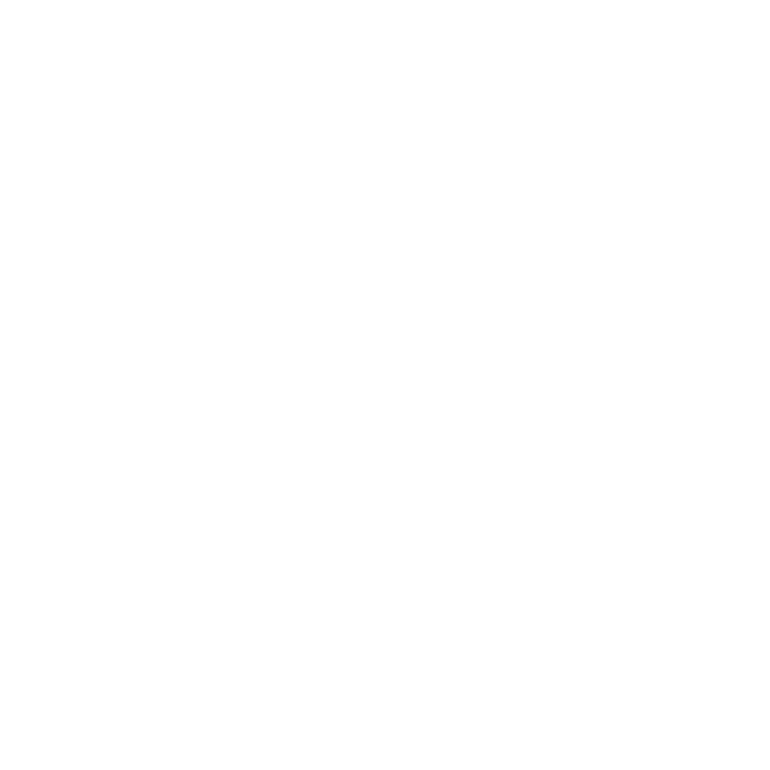

<IPython.core.display.Javascript object>


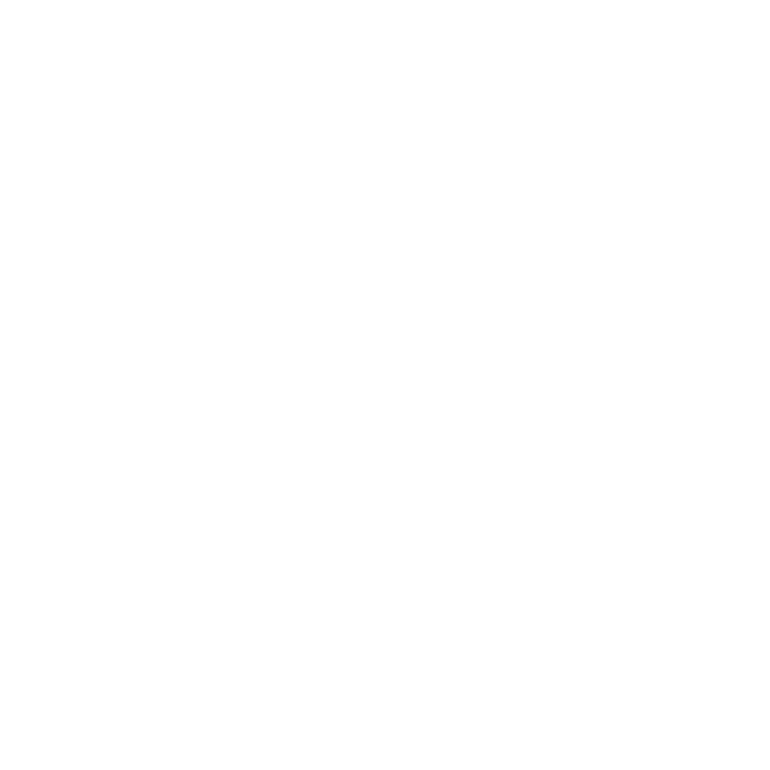

<IPython.core.display.Javascript object>


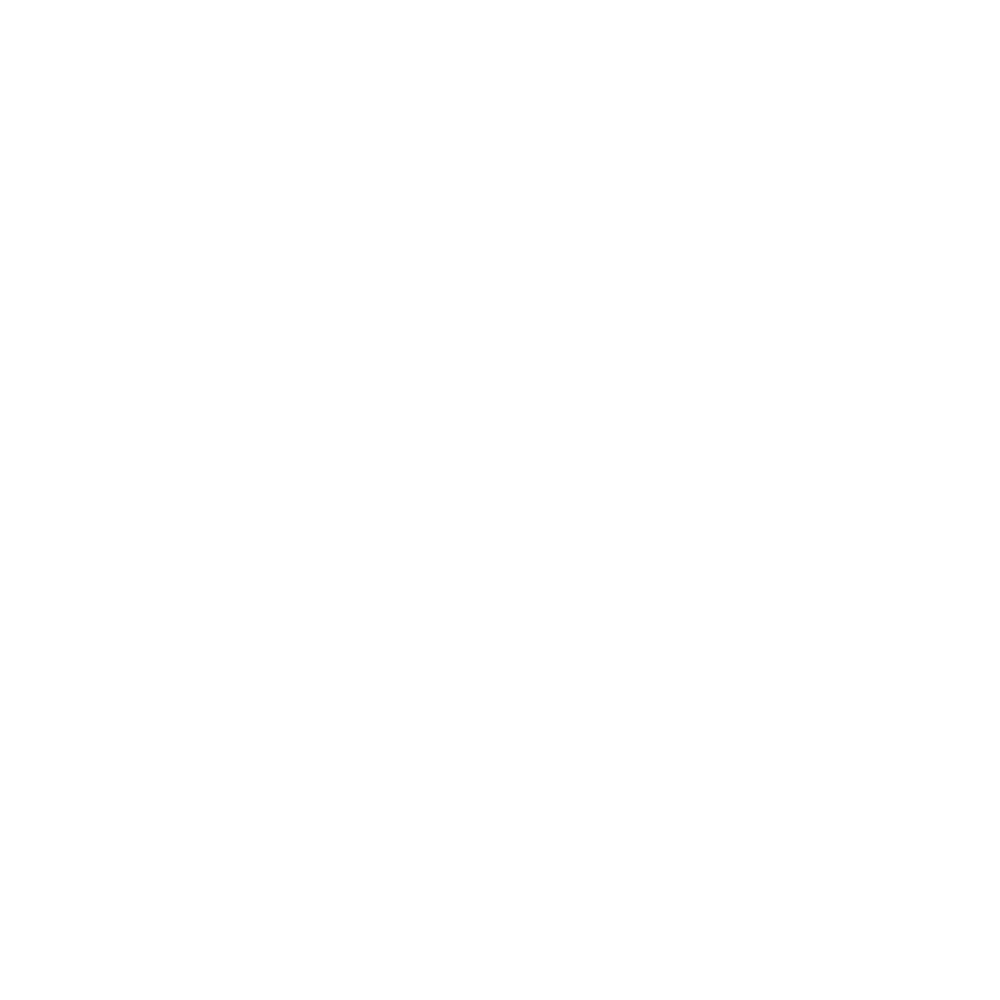

<IPython.core.display.Javascript object>


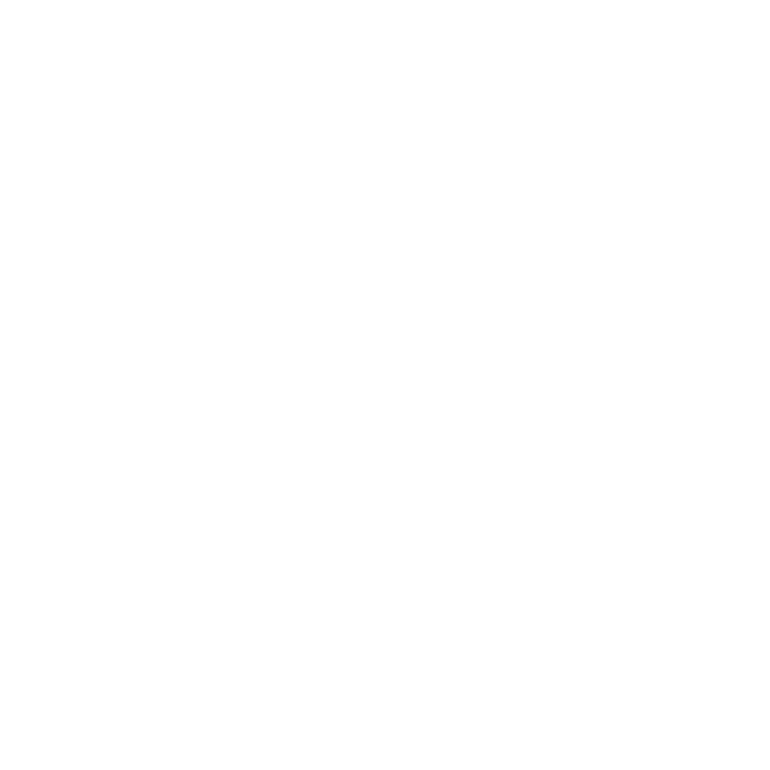

<IPython.core.display.Javascript object>


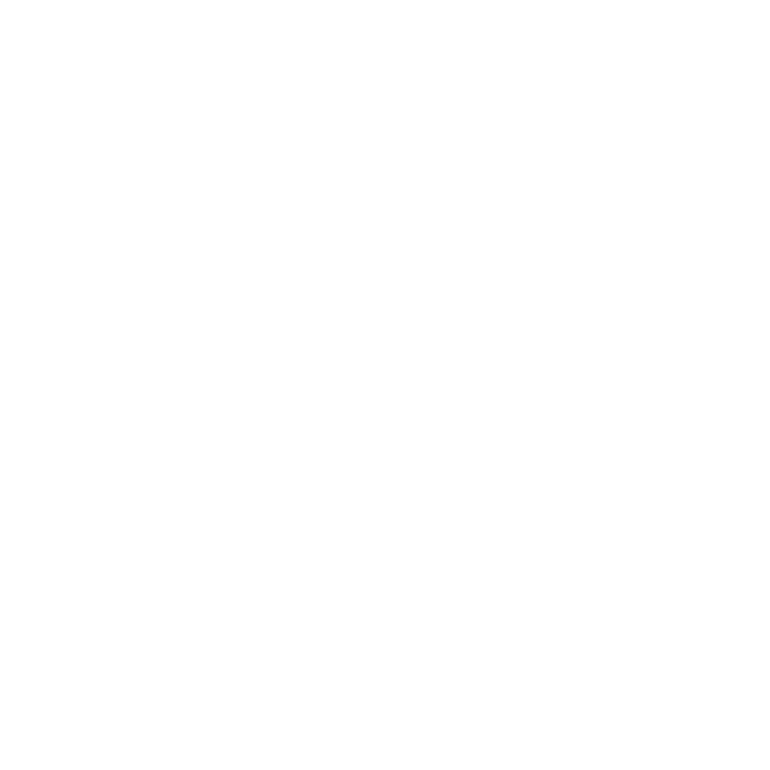

<IPython.core.display.Javascript object>


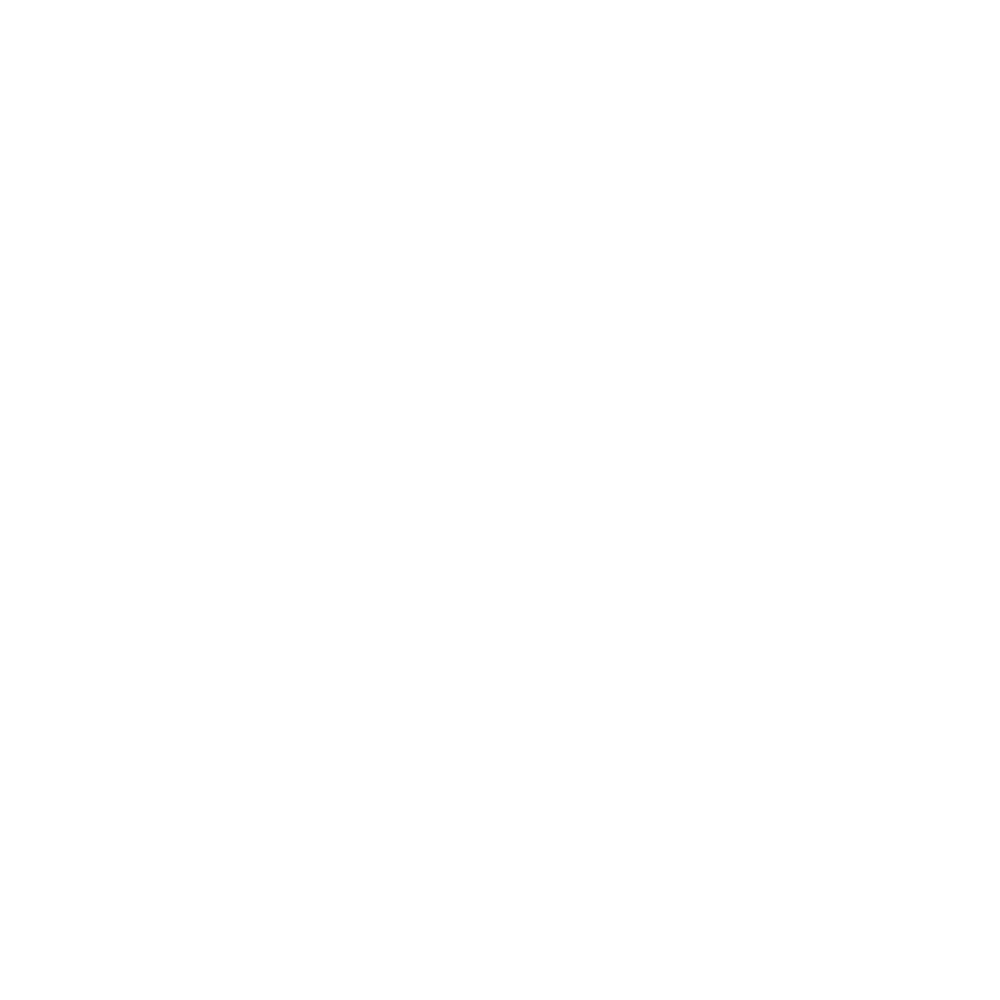

<IPython.core.display.Javascript object>


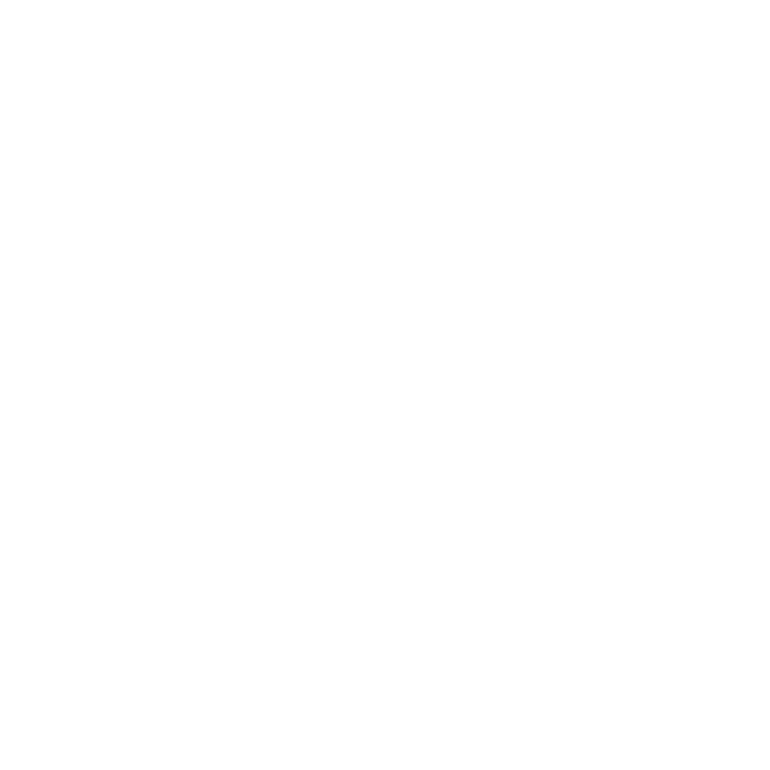

<IPython.core.display.Javascript object>


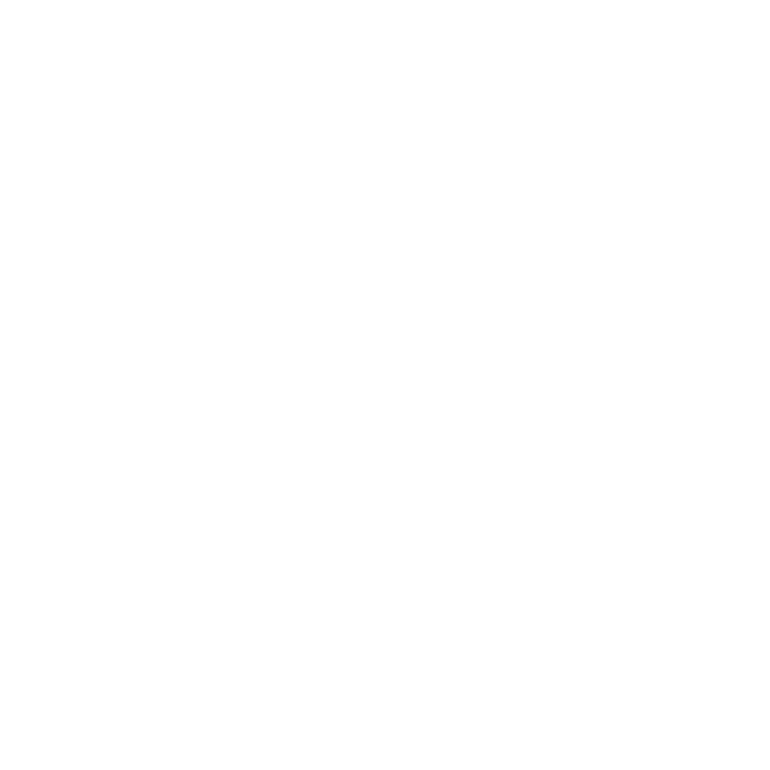

<IPython.core.display.Javascript object>


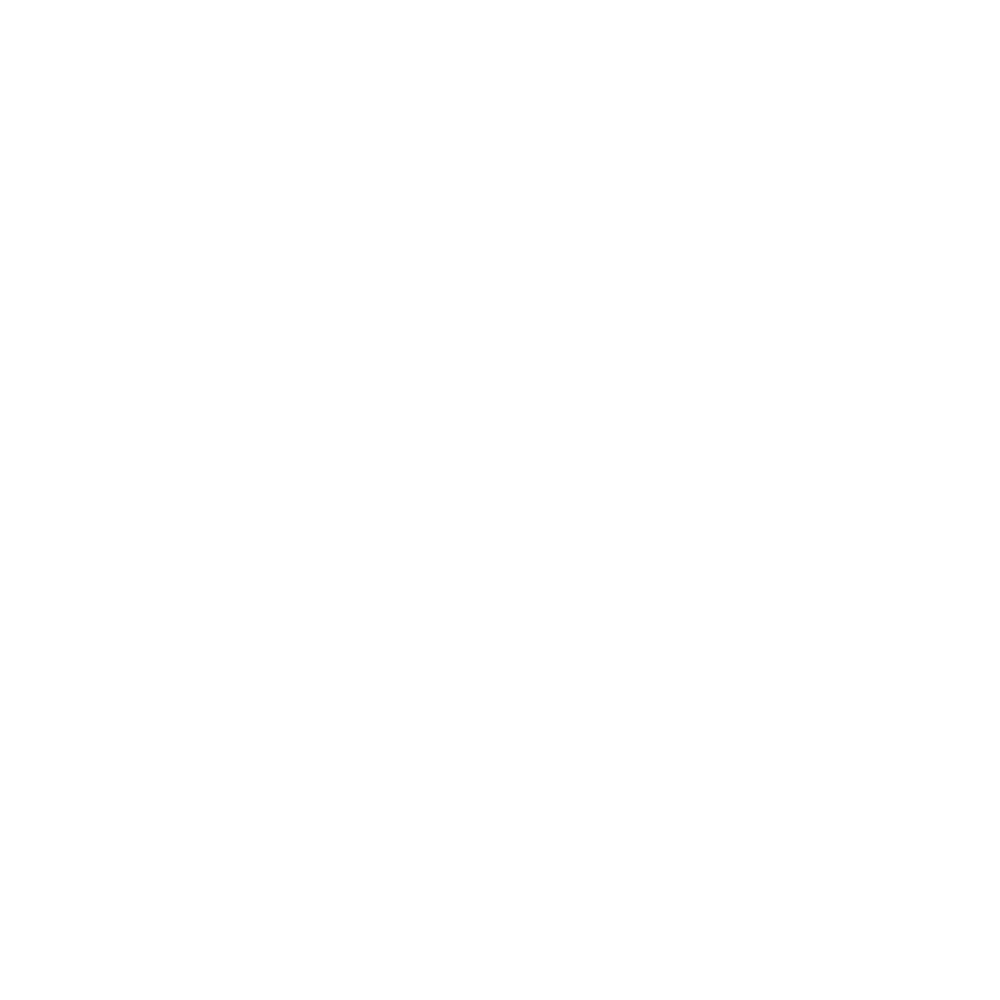

In [100]:
Monther = "Nov"
# setup stuff
PolyList = gpdNovDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdNovDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdNovDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdNovDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdNovDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdNovDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdNovDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

<IPython.core.display.Javascript object>


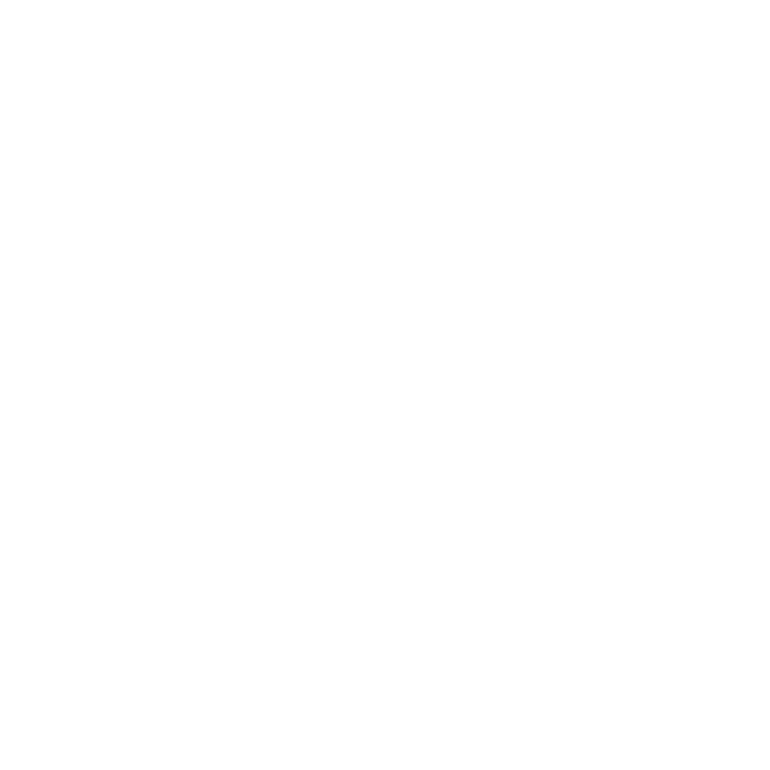

<IPython.core.display.Javascript object>


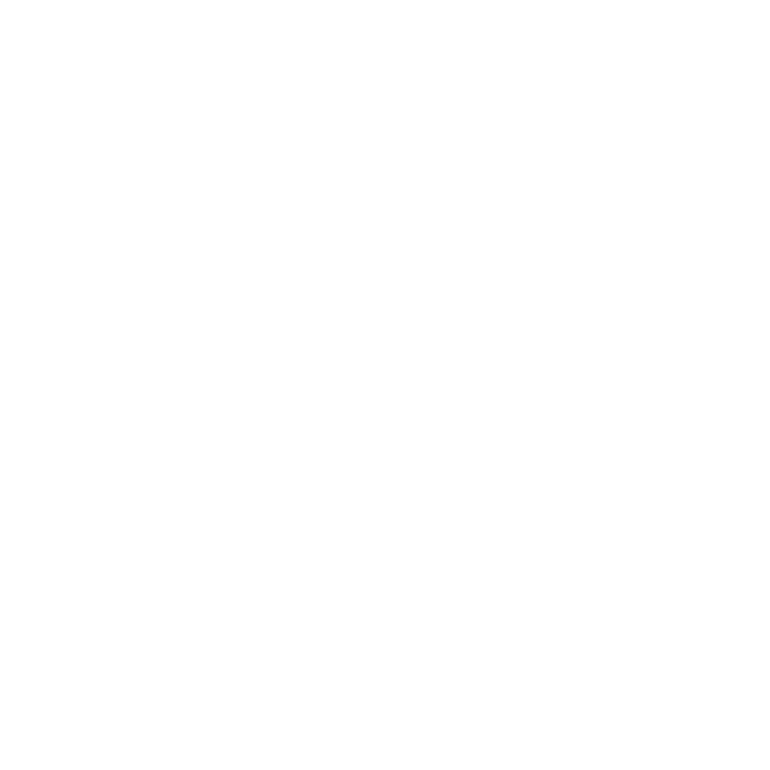

<IPython.core.display.Javascript object>


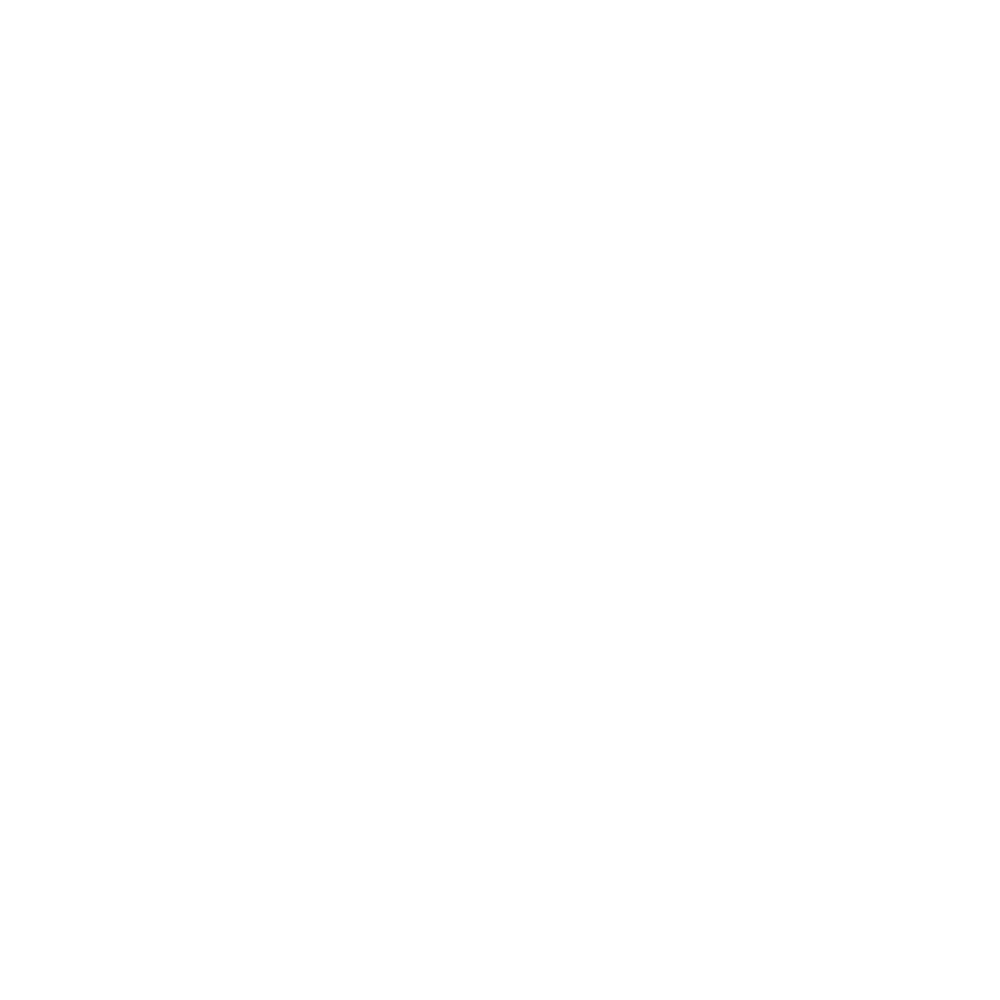

<IPython.core.display.Javascript object>


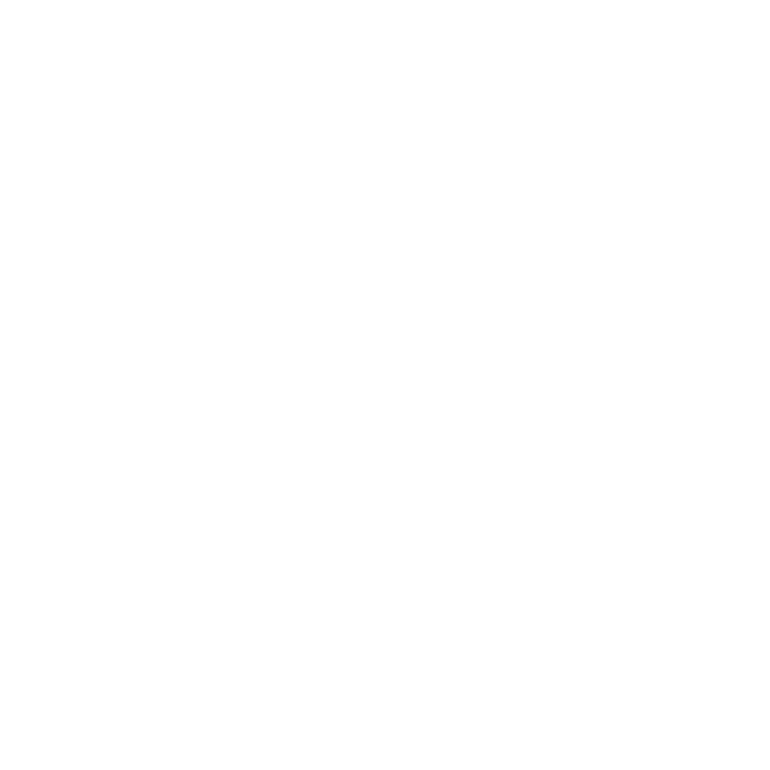

<IPython.core.display.Javascript object>


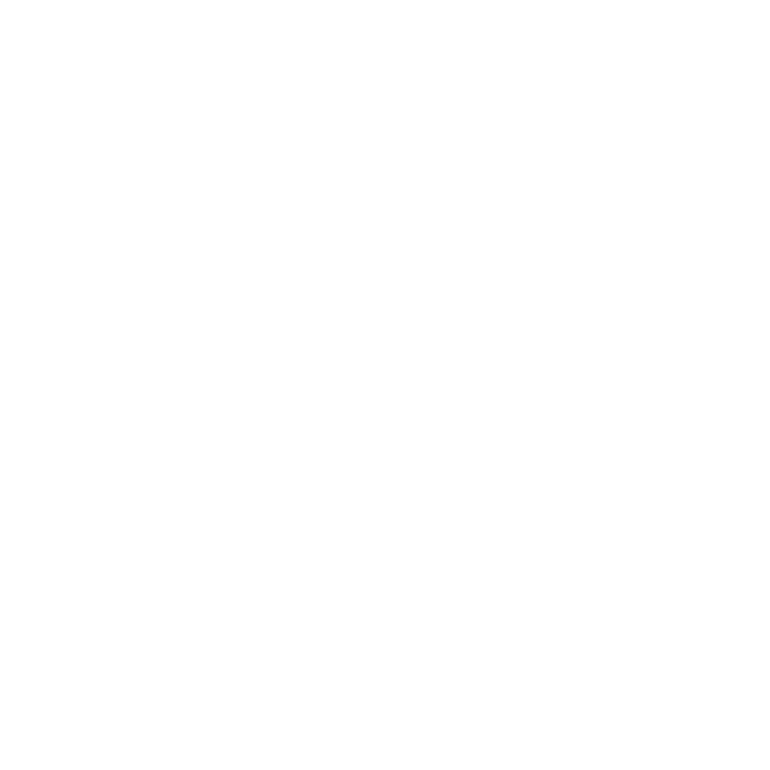

<IPython.core.display.Javascript object>


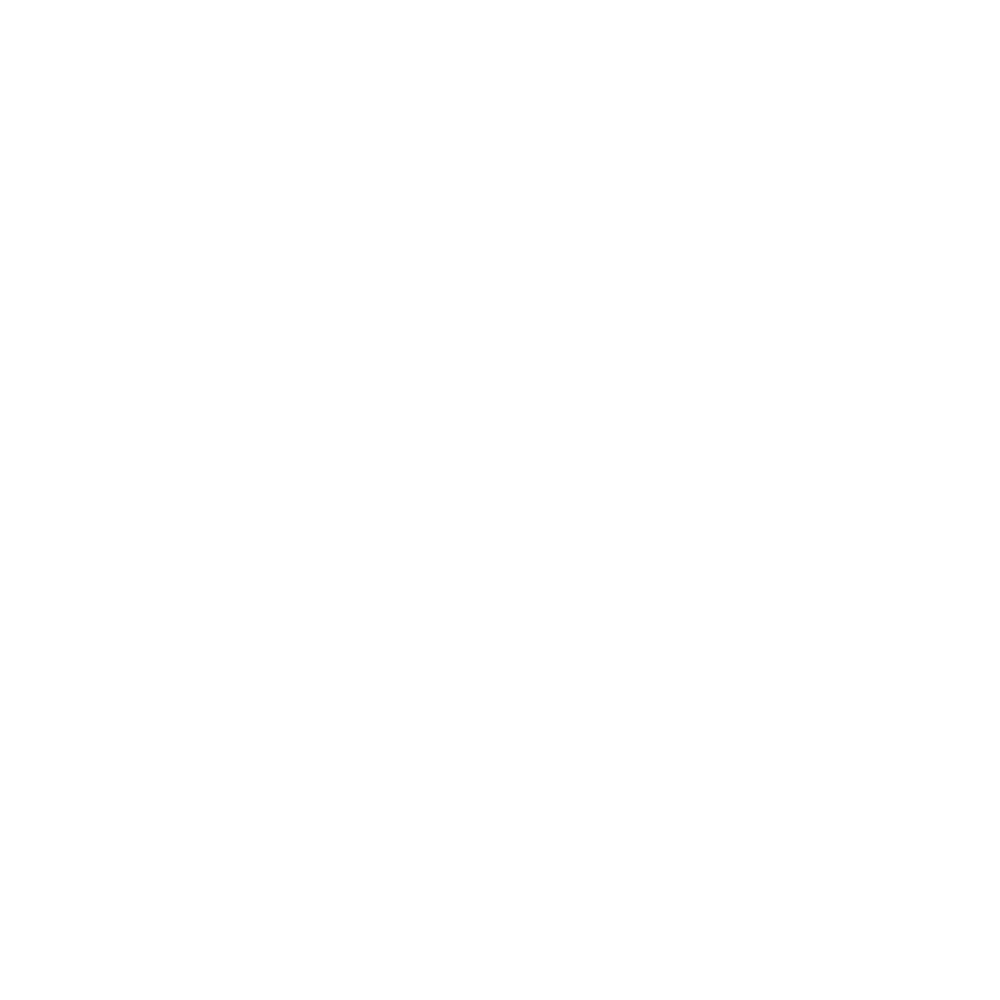

<IPython.core.display.Javascript object>


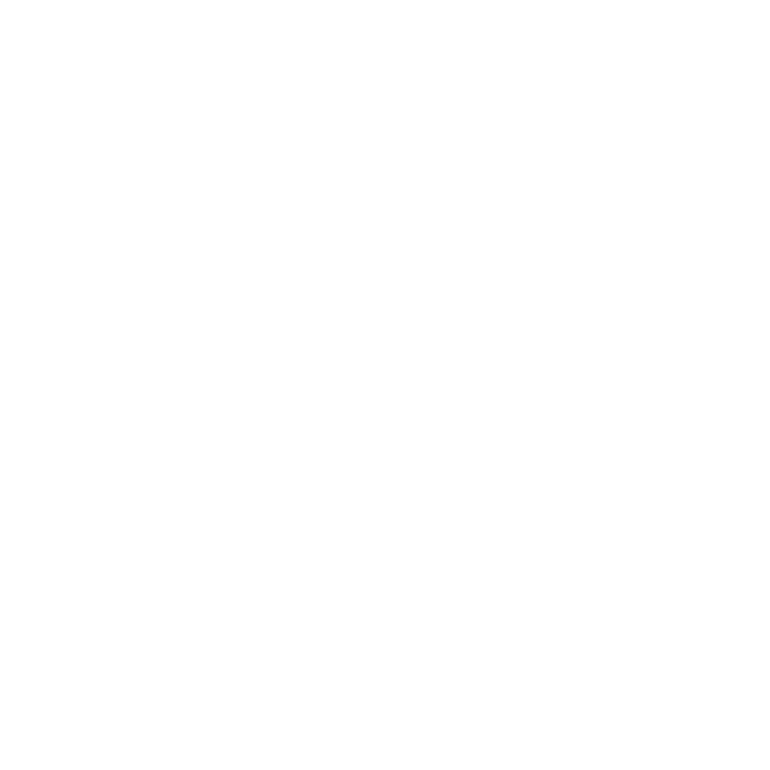

<IPython.core.display.Javascript object>


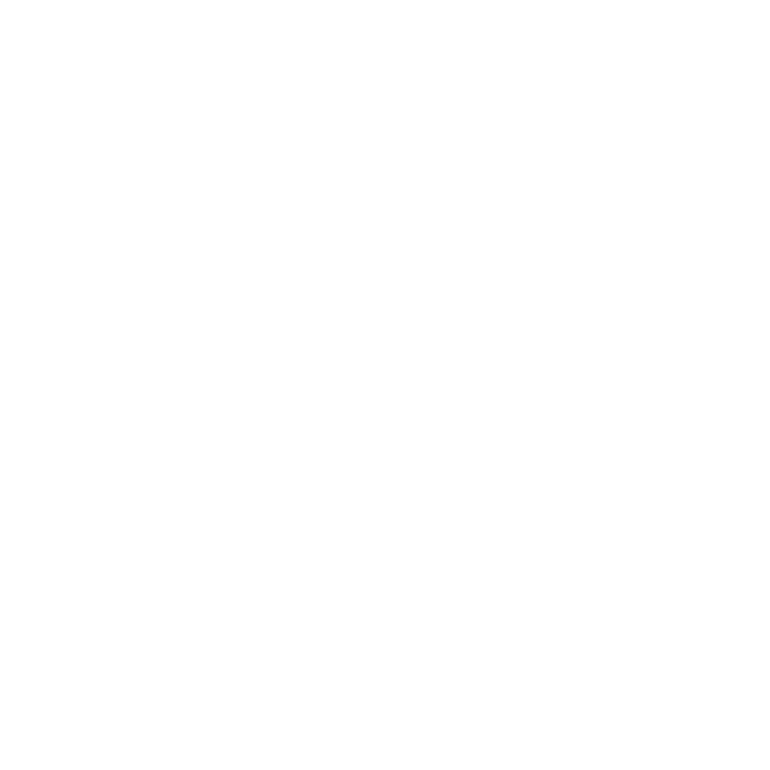

<IPython.core.display.Javascript object>


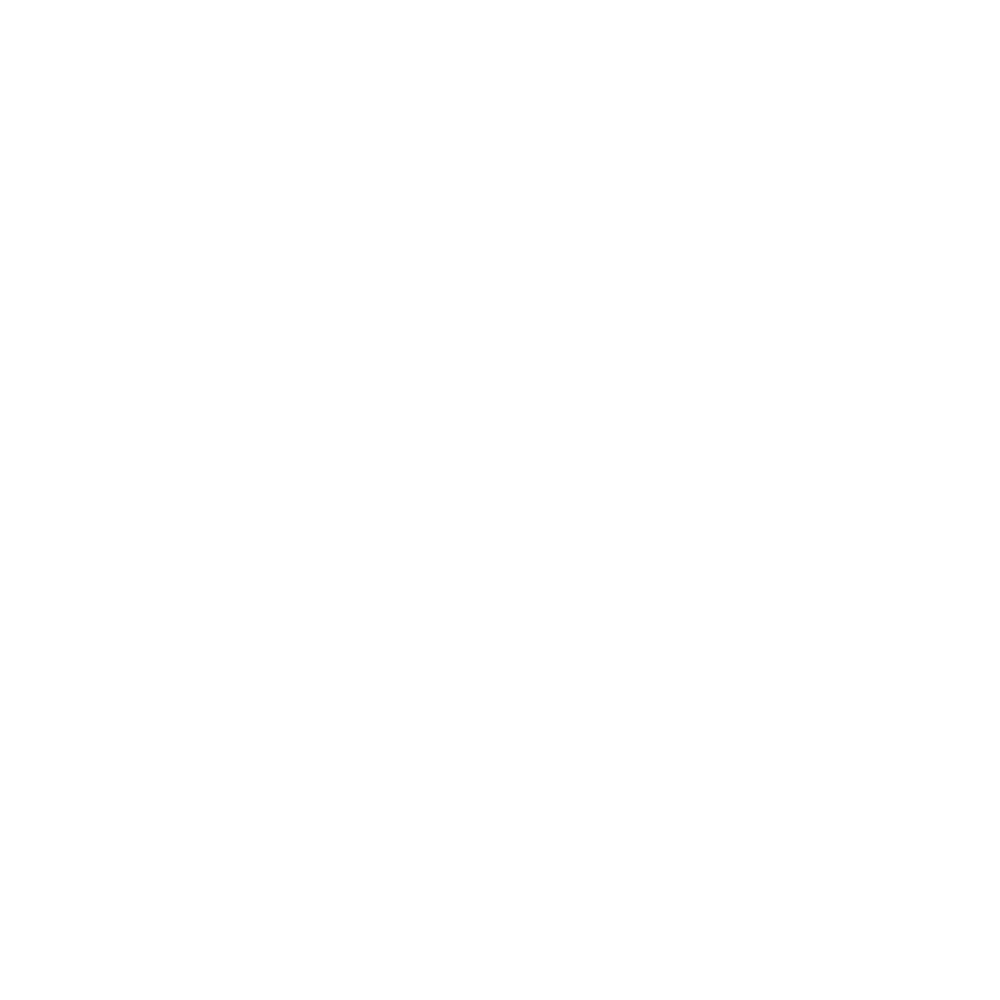

<IPython.core.display.Javascript object>


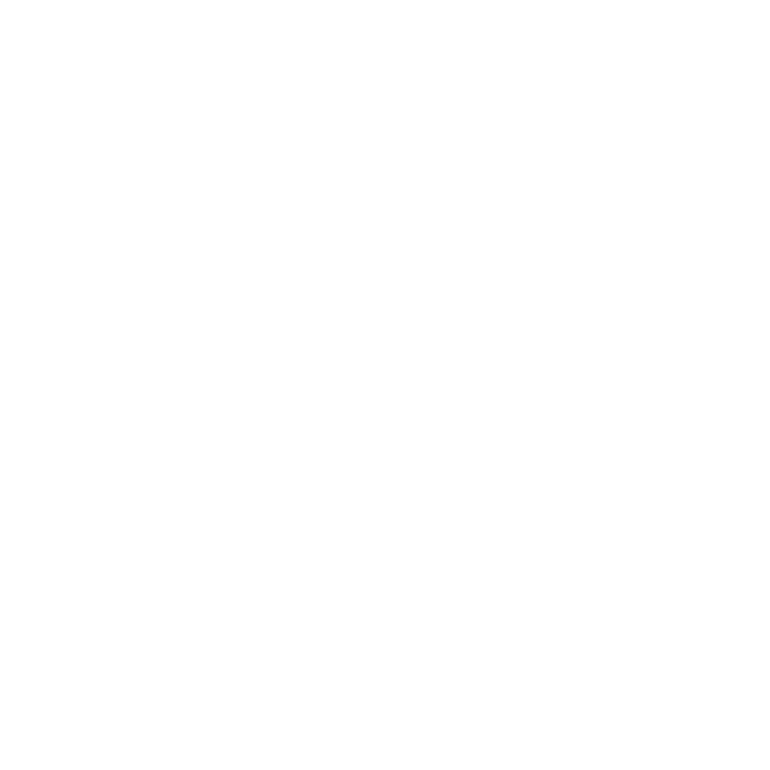

<IPython.core.display.Javascript object>


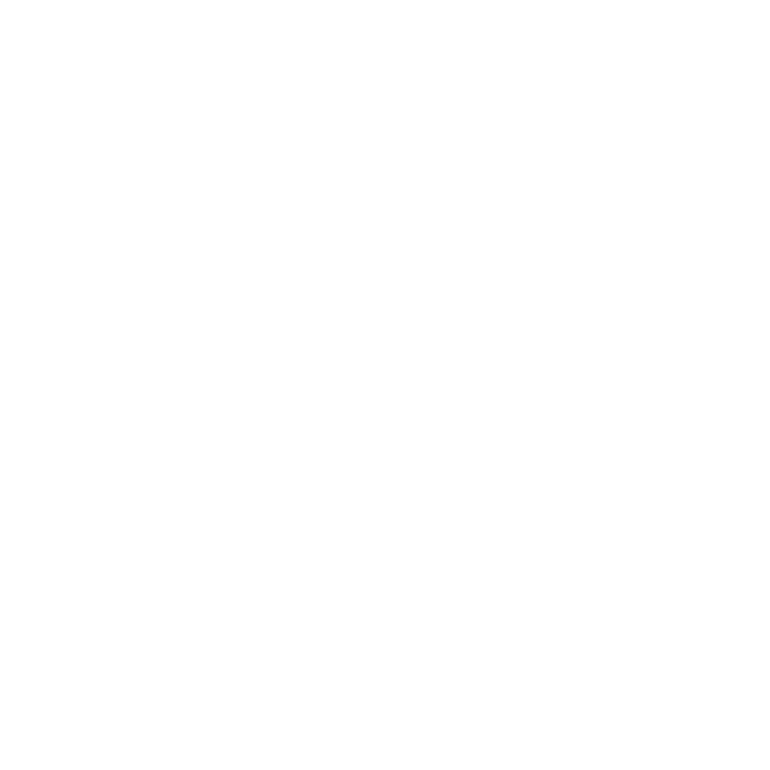

<IPython.core.display.Javascript object>


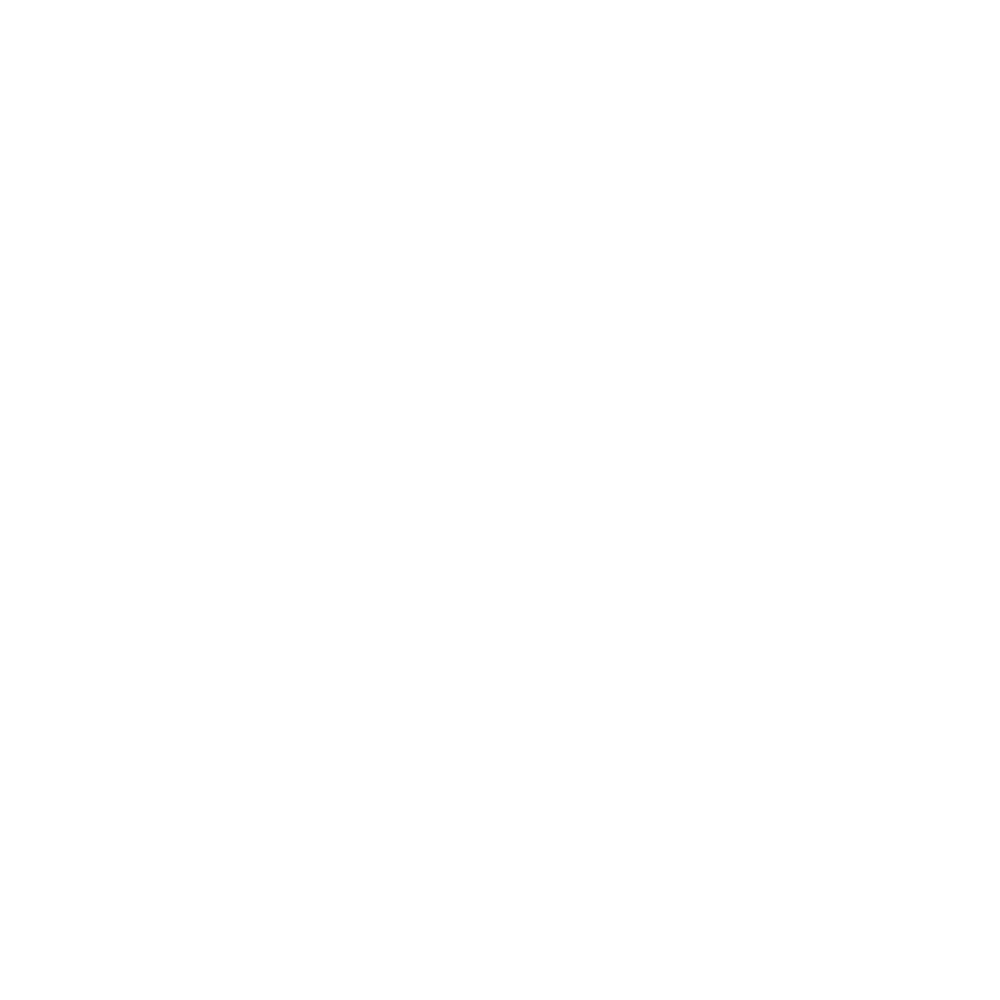

<IPython.core.display.Javascript object>


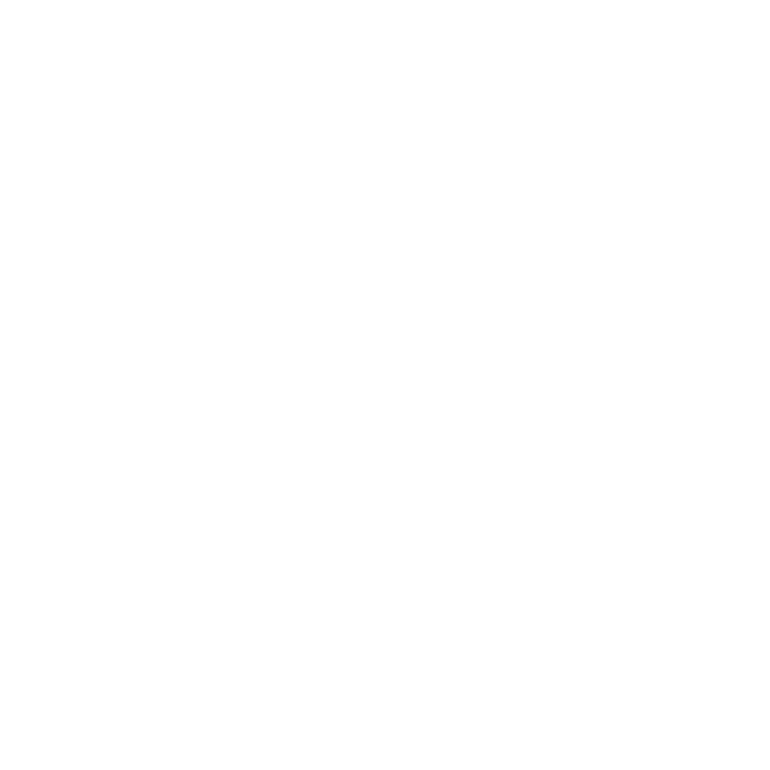

<IPython.core.display.Javascript object>


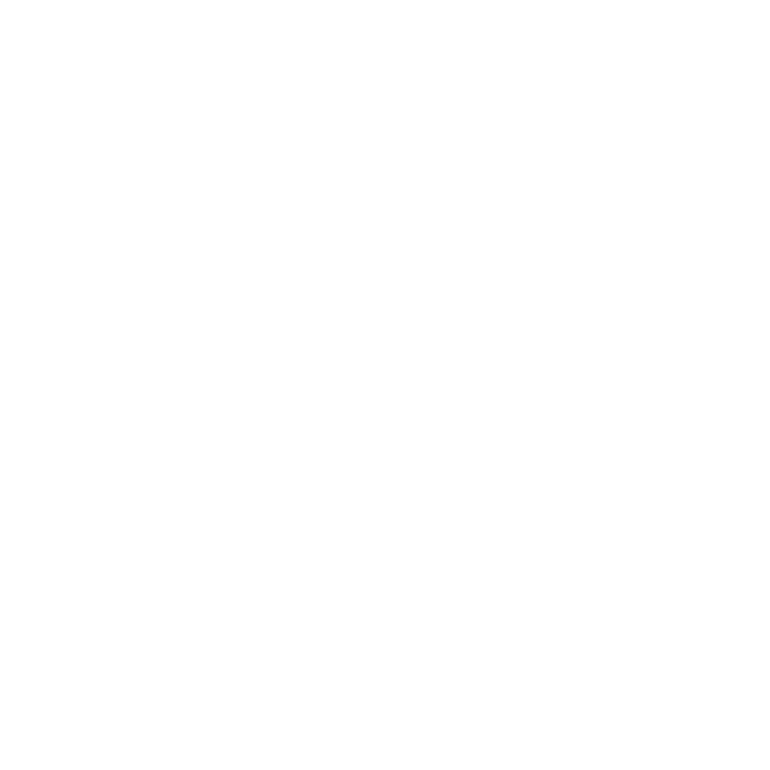

<IPython.core.display.Javascript object>


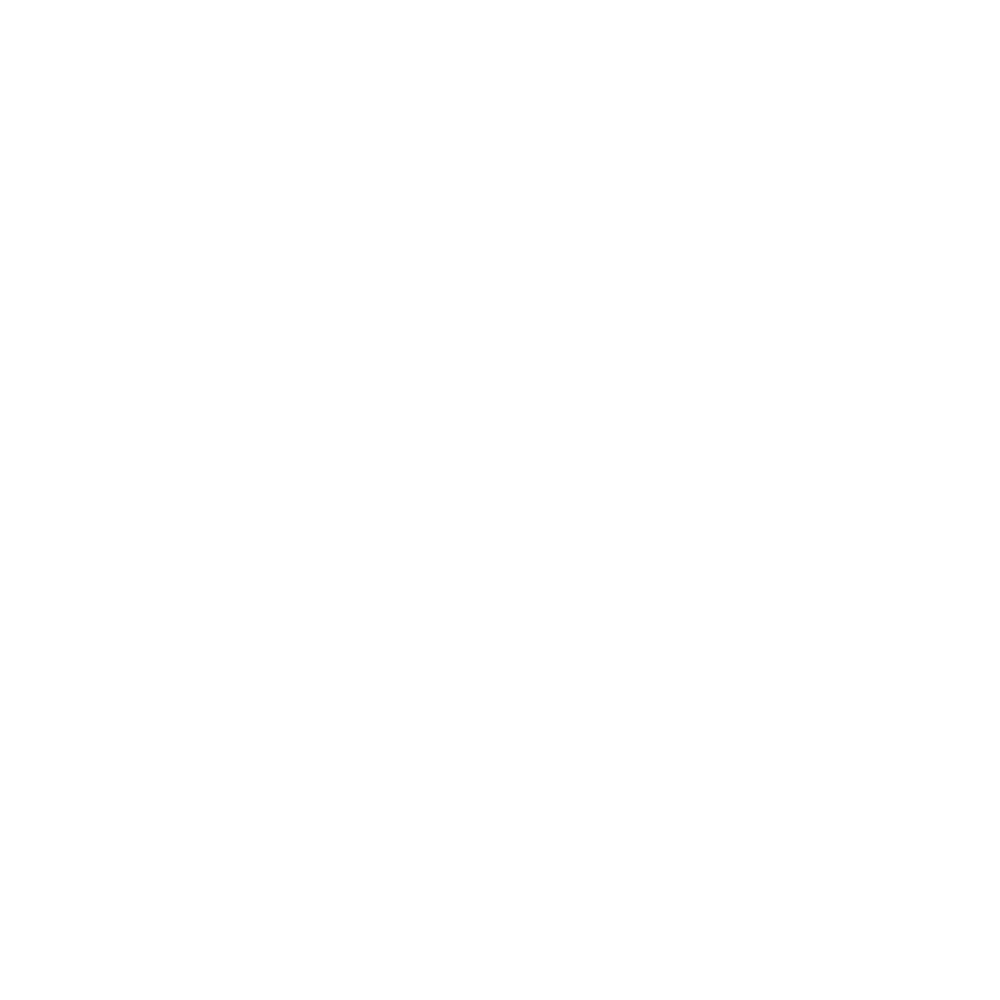

<IPython.core.display.Javascript object>


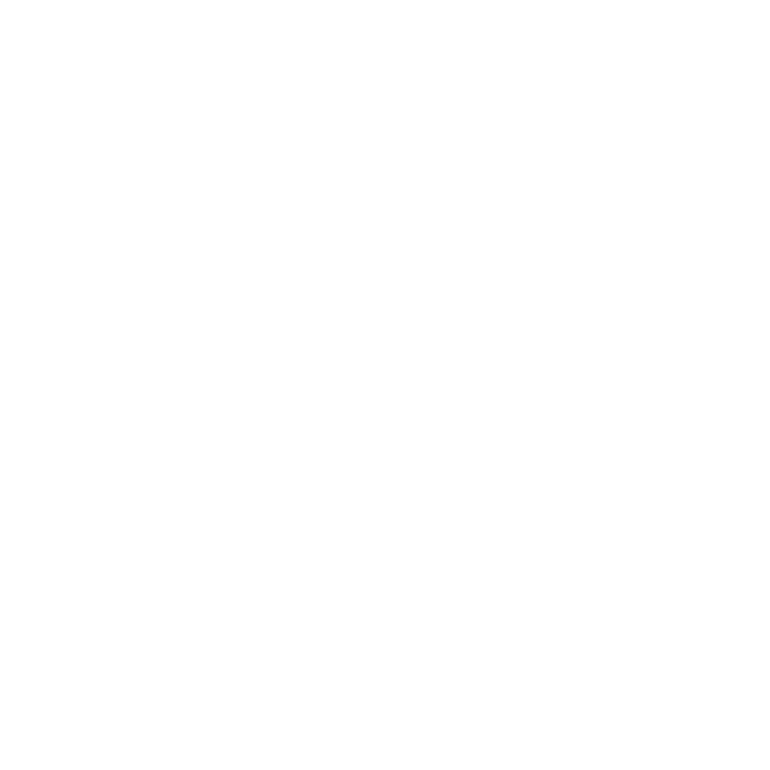

<IPython.core.display.Javascript object>


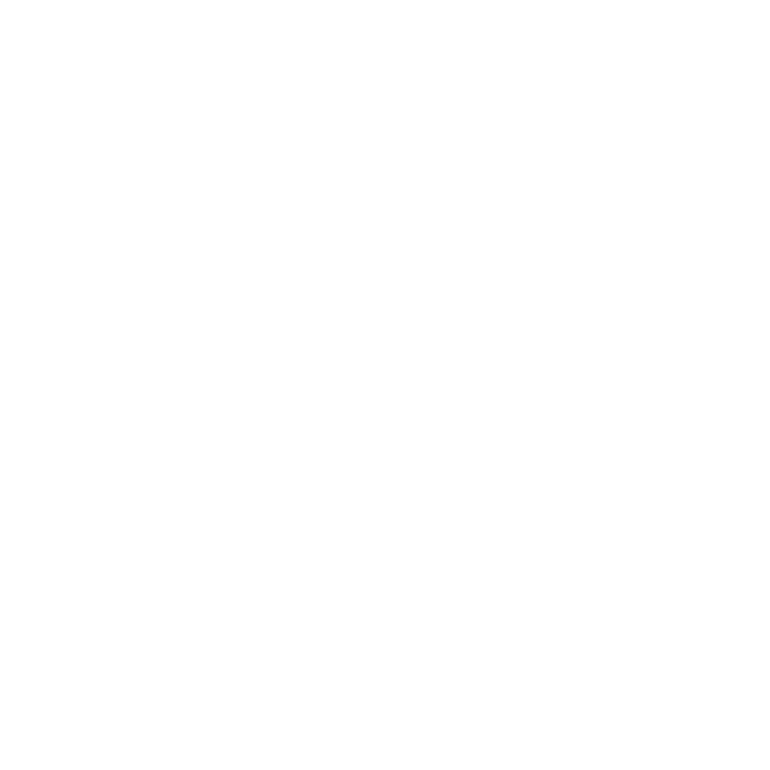

<IPython.core.display.Javascript object>


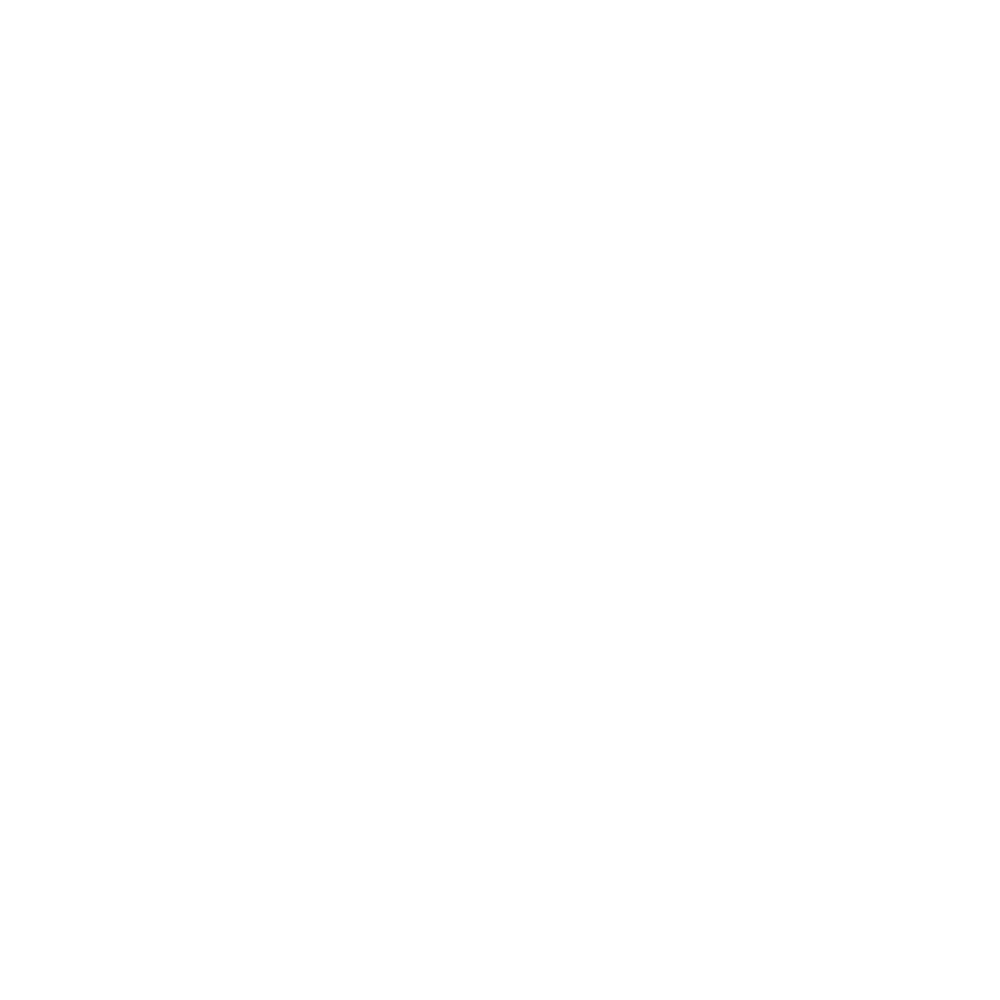

In [101]:
Monther = "Dec"
# setup stuff
PolyList = gpdDecDF['geometry'].tolist()
# get our regular basic stats DF
BSArrayDF = gpdDecDF.loc[:, BSCols]
BSTrackDF = BSArrayDF.copy()
BSTrackDF[LMCols[0]] = np.array( gpdDecDF[LMCols[0]], dtype=np.float32 )
BSTrackDF[LMCols[1]] = np.array( gpdDecDF[LMCols[1]], dtype=np.float32 )
gpdBSTrackDF = gpd.GeoDataFrame( BSTrackDF, geometry=PolyList )
gpdBSTrackDF.crs = UTMCRS
# do PCA
BaseStatsArray = gpdDecDF.loc[:, BaseStatsCols]
pca3 = PCA(n_components=3, whiten=True, svd_solver='full' )
resPCA3 = pca3.fit( BaseStatsArray )
#       archive PCA fits and components
cExVarRat = resPCA3.explained_variance_ratio_
CAnTrackDF.at[ StatsCoalHds[0], Monther ] = cExVarRat[0]
CAnTrackDF.at[ StatsCoalHds[1], Monther ] = cExVarRat[1]
CAnTrackDF.at[ StatsCoalHds[2], Monther ] = cExVarRat[2]
cSumExVar = sum(resPCA3.explained_variance_ratio_)
CAnTrackDF.at[ StatsCoalHds[4], Monther ] = cSumExVar
cPCAComps = resPCA3.components_
# this is 3 x 5
stInd = 3
iCnt = 0
for iI in range(3):
    for jJ in range(5):
        hdInd = stInd + iCnt
        CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAComps[iI, jJ]
        iCnt += 1
    # end for
# end for
trans3BaseStat = resPCA3.transform( BaseStatsArray )
DataDict = { PCAVarCols[0] : trans3BaseStat[:, 0],
             PCAVarCols[1] : trans3BaseStat[:, 1],
             PCAVarCols[2] : trans3BaseStat[:, 2],
           }
PCATrackDF = pd.DataFrame( data=DataDict )
PCATrackDF[LMCols[0]] = np.array( gpdDecDF[LMCols[0]], dtype=np.float32 )
PCATrackDF[LMCols[1]] = np.array( gpdDecDF[LMCols[1]], dtype=np.float32 )
gpdPCATrackDF = gpd.GeoDataFrame( PCATrackDF, geometry=PolyList )
gpdPCATrackDF.crs = UTMCRS
# set our Maxs and Mins for plotting
MaxX = round( gpdBSTrackDF[BSCols[0]].max() + 0.5, 0 )
MaxY = round( gpdBSTrackDF[BSCols[1]].max() + 10.0, -1 )
MinX = round( gpdBSTrackDF[BSCols[0]].min() - 0.5, 0 )
MinY = round( gpdBSTrackDF[BSCols[1]].min() - 10.0, -1 )
MaxLMX = round( gpdBSTrackDF[LMCols[0]].max() + 0.1, 1 )
MaxLMY = round( gpdBSTrackDF[LMCols[1]].max() + 0.1, 1 )
MinLMX = round( gpdBSTrackDF[LMCols[0]].min() - 0.1, 1 )
MinLMY = round( gpdBSTrackDF[LMCols[1]].min() - 0.1, 1 )
MaxPX = ceil( gpdPCATrackDF[PCAVarCols[0]].max() )
MaxPY = ceil( gpdPCATrackDF[PCAVarCols[1]].max() )
MaxPZ = ceil( gpdPCATrackDF[PCAVarCols[2]].max() )
MinPX = floor( gpdPCATrackDF[PCAVarCols[0]].min() )
MinPY = floor( gpdPCATrackDF[PCAVarCols[1]].min() )
MinPZ = floor( gpdPCATrackDF[PCAVarCols[2]].min() )
# now ready to start our loop
nClustList = [ 3, 4, 5]
iCnt = 0
hdInd = 19
for name, cEst in clustEst:
    # get the number of clusters
    nClust = nClustList[iCnt]
    # regular clustering
    cBS = cEst.fit( BSArrayDF )
    cBSInertia = cBS.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cBSInertia
    hdInd += 1
    gpdBSTrackDF[name] = cBS.fit_predict( BSArrayDF )
    cCArray = cBS.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 2 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # PCA clustering
    cPCA = cEst.fit( trans3BaseStat )
    gpdPCATrackDF[name] = cPCA.fit_predict( trans3BaseStat )
    cPCAInertia = cPCA.inertia_
    CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] = cPCAInertia
    hdInd += 1
    cCArray = cPCA.cluster_centers_
    for iI in range( nClust ):
        for jJ in range( 3 ):
            CAnTrackDF.at[ StatsCoalHds[hdInd], Monther ] =  cCArray[iI, jJ]
            hdInd += 1
        # end of inner for
    # end of outer for
    # plots ...
    # basic stats scatter
    cFigName = "%s_BS%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[BSCols[0]], gpdBSTrackDF[BSCols[1]], 
                          label="$\mu$ and $\sigma^{2}$", alpha= 0.7, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinX, MaxX) )
    ax11.set_ylim( (MinY, MaxY) )
    ax11.set_title("Basic Statistics - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'$\mu$ (mm)', fontsize=14 )
    ax11.set_ylabel(r'$\sigma^{2}$ $\left( mm^{2}\right)$', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats L-moment ratios
    cFigName = "%s_BS%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdBSTrackDF[LMCols[0]], gpdBSTrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdBSTrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cBSInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # basic stats map
    cFigName = "%s_BS%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdBSTrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("Basic Statistics - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA scatter
    cFigName = "%s_PCA%d_Scatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Axes3D( Fig1, rect=[0, 0, .95, 1], elev=30, azim=65 )
    ax11.scatter( gpdPCATrackDF[PCAVarCols[0]], gpdPCATrackDF[PCAVarCols[1]], 
                  gpdPCATrackDF[PCAVarCols[2]], edgecolor='k', 
                  c=gpdPCATrackDF[CNamesList[iCnt]])
    ax11.set_xlim( (MinPX, MaxPX) )
    ax11.set_ylim( (MinPY, MaxPY) )
    ax11.set_zlim( (MinPZ, MaxPZ) )
    ax11.set_title( "PCA Transformed - %s; Inertia %6.1f" % 
                   ( CNamesList[iCnt], cPCAInertia ), fontsize=16 )
    ax11.set_xlabel(PCAVarCols[0], fontsize=14 )
    ax11.set_ylabel(PCAVarCols[1], fontsize=14 )
    ax11.set_zlabel(PCAVarCols[2], fontsize=14 )
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.zaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA L-moment ratios
    cFigName = "%s_PCA%d_LMScatter.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(7.0, 7.0)
    ax11 = Fig1.add_subplot(111)
    tVar1 = ax11.scatter( gpdPCATrackDF[LMCols[0]], gpdPCATrackDF[LMCols[1]], 
                          label="L-moment ratios", alpha= 0.5, edgecolors='k', 
                          c=gpdPCATrackDF[CNamesList[iCnt]] )
    ax11.set_xlim( (MinLMX, MaxLMX) )
    ax11.set_ylim( (MinLMY, MaxLMY) )
    ax11.set_title( "L-moment Ratios - %s; Inertia %6.1f" % 
                   (CNamesList[iCnt], cPCAInertia), fontsize=16 )
    ax11.set_xlabel(r'L-CV', fontsize=14 )
    ax11.set_ylabel(r'L-Skewness', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.1f}" ) )
    ax11.grid(True)
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # PCA map
    cFigName = "%s_PCA%d_ClusterMap.png" % ( Monther, nClust )
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    gpdPCATrackDF.plot(column=CNamesList[iCnt], ax=ax11, legend=True )
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, 
               label="Watershed" )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("PCA Transformed - %s" % CNamesList[iCnt], fontsize=16 )
    ax11.set_xlabel('Easting - X (m)', fontsize=14 )
    ax11.set_ylabel('Northing - Y (m)', fontsize=14)
    ax11.tick_params(axis='both', which='major', labelsize=13)
    ax11.yaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    ax11.xaxis.set_major_formatter( mpl.ticker.StrMethodFormatter( "{x:,.0f}" ) )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    # increment iCnt
    iCnt += 1
# end of for loop
# output our shapefiles
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterBS.shp" % Monther ) )
gpdBSTrackDF.to_file(OutFName)
OutFName = os.path.normpath( os.path.join( OUT_DIR, "%s_ClusterPCA.shp" % Monther ) )
gpdPCATrackDF.to_file(OutFName)

Output the tracking DataFrame to a spreadsheet

In [104]:
OutFName = "KMeans_Cluster_Summary.xlsx"
OutFPath = os.path.normpath( os.path.join( OUT_DIR, OutFName ) )
with pd.ExcelWriter(OutFPath) as writer:
    CAnTrackDF.to_excel( writer, sheet_name="Summary", na_rep=str(np.nan),
                         columns=["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
                                     "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
                         index=True, index_label="Parameter" )
# end of with and close file